In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [2]:
data_heatmap = pd.read_csv('../datasets/A_data_heatmap_300x250_3p.csv')
data_metrics = pd.read_csv('../datasets/A_data_domain_perf_metrics_300x250_3p.csv')
data_heatmap_new1 = pd.read_csv('../datasets/A_data_heatmap_300x250_6p_h2m.csv')
data_heatmap_new2 = pd.read_csv('../datasets/A_data_heatmap_300x250_6p_t2m.csv')

In [3]:
data_heatmap_expanded = data_heatmap.loc[data_heatmap.index.repeat(data_heatmap['clicks'])].reset_index(drop=True)
data_heatmap_expanded_new1 = data_heatmap_new1.loc[data_heatmap_new1.index.repeat(data_heatmap_new1['clicks'])].reset_index(drop=True)
data_heatmap_expanded_new2 = data_heatmap_new2.loc[data_heatmap_new2.index.repeat(data_heatmap_new2['clicks'])].reset_index(drop=True)

In [4]:
click_stat = data_heatmap_expanded.groupby(['click_x','click_y'])['clicks'].count().reset_index()
click_stat_new1 = data_heatmap_expanded_new1.groupby(['click_x','click_y'])['clicks'].count().reset_index()
click_stat_new2 = data_heatmap_expanded_new2.groupby(['click_x','click_y'])['clicks'].count().reset_index()

In [5]:
data_heatmap_expanded['clicks'] = 1
data_heatmap_expanded_new1['clicks'] = 1
data_heatmap_expanded_new2['clicks'] = 1

# Visualize new data

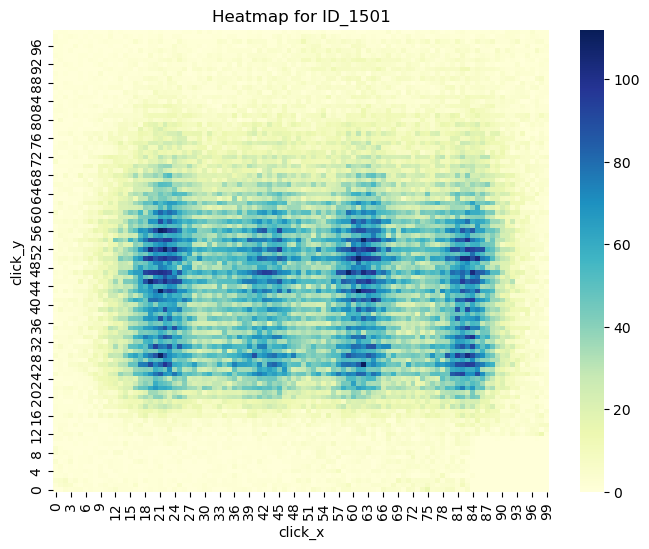

In [6]:
x = data_heatmap_expanded_new2[(data_heatmap_expanded_new2.grid_id == 333346) & 
                          (data_heatmap_expanded_new2.domain == 'ID_3516')]

heatmap_data, xedges, yedges = np.histogram2d(x['click_x'], x['click_y'], 
                                              bins=[100, 100])

plt.figure(figsize=(8, 6))
sns.heatmap(heatmap_data.T, cmap='YlGnBu', cbar=True)
plt.title(f'Heatmap for ID_1501')
plt.xlabel('click_x')
plt.ylabel('click_y')
plt.gca().invert_yaxis() # Invert y-axis to match the coordinate system
plt.show()

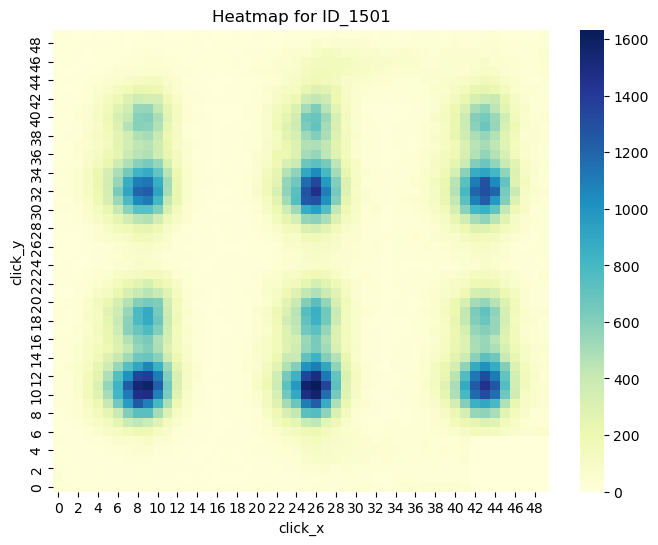

In [7]:
x = data_heatmap_expanded_new2[(data_heatmap_expanded_new2.grid_id == 333519) & 
                          (data_heatmap_expanded_new2.domain == 'ID_3516')]
heatmap_data, xedges, yedges = np.histogram2d(x['click_x'], x['click_y'], 
                                              bins=[50, 50])

plt.figure(figsize=(8, 6))
sns.heatmap(heatmap_data.T, cmap='YlGnBu', cbar=True)
plt.title(f'Heatmap for ID_1501')
plt.xlabel('click_x')
plt.ylabel('click_y')
plt.gca().invert_yaxis() # Invert y-axis to match the coordinate system
plt.show()

# Some Data wrangling

In [8]:
data_expanded = data_heatmap.loc[data_heatmap.index.repeat(data_heatmap['clicks'])].reset_index(drop=True)

max_width = data_expanded['display_width'].max()
max_height = data_expanded['display_height'].max()

width_bins = np.linspace(1, max_width, 61)
height_bins = np.linspace(1, max_height, 51)

data_expanded['click_x_bin'] = pd.cut(data_expanded['click_x'], 
                                      bins = width_bins, 
                                      labels=False, 
                                      include_lowest=True)

data_expanded['click_y_bin'] = pd.cut(data_expanded['click_y'], 
                                      bins=height_bins, 
                                      labels=False, 
                                      include_lowest=True)


aggregated_clicks = data_expanded.groupby(['grid_id',
                                           'domain', 
                                           'click_x_bin', 
                                           'click_y_bin']).size().reset_index(name='clicks_sum')

cl_stat = aggregated_clicks.groupby(['click_x_bin','click_y_bin']).count().reset_index()
cl_stat = cl_stat[['click_x_bin','click_y_bin','clicks_sum']]
cl_stat['bin_prob'] = cl_stat['clicks_sum']/cl_stat['clicks_sum'].sum()


aggregated_clicks_by_grid = aggregated_clicks.groupby([
                                'grid_id','click_x_bin','click_y_bin'
                            ]).sum('clicks_sum').reset_index()

In [9]:
cl_stat = aggregated_clicks.groupby(['click_x_bin','click_y_bin']).count().reset_index()
cl_stat = cl_stat[['click_x_bin','click_y_bin','clicks_sum']]
cl_stat['bin_prob'] = cl_stat['clicks_sum']/cl_stat['clicks_sum'].sum()

# Basic Bootstrap approach

In [10]:
def weighted_bootstrap_resample(data, drawing_distro, emp_distro, size, n_bootstraps=1000):
    tot_log_proba = 0
    
    # resample heatmap of size = size n_bootstrap times
    for _ in range(n_bootstraps):
        # draw samples from drawing_distro column:
        indices = np.random.choice(data.index, 
                                   size=size, 
                                   replace=True, 
                                   p=data[drawing_distro])
        
        # compute log-probability for current sample based on emp_distro column:
        log_proba = np.log(data.loc[indices][emp_distro]).sum()
        
        # cumulative log-probability
        tot_log_proba += log_proba
        
    # compute and return average log-probability:
    return tot_log_proba/n_bootstraps

In [11]:
def weighted_jittered_bootstrap_resample(data, drawing_distro, total_data_size, stdev=2):
    tot_log_proba = 0
    pert_x = np.random.normal(0, stdev, total_data_size).round().astype(int)
    pert_y = np.random.normal(0, stdev, total_data_size).round().astype(int)
    indices = np.random.choice(data.index, 
                               total_data_size, 
                               replace=True, 
                               p=data[drawing_distro])
    
    log_proba = np.log(data.loc[indices][emp_distro]).sum()
    tot_log_proba += log_proba
    return tot_log_proba/n_bootstraps #boots[['click_x_bin','click_y_bin', 'boot']]

# Basic Chi-squared test

In [12]:
from scipy.stats import chisquare

def Chi_squared_test(aggregated_clicks, aggregated_clicks_by_grid, ID, GRID_ID):
    observed = aggregated_clicks[(aggregated_clicks.grid_id == GRID_ID) &
                                 (aggregated_clicks.domain == ID)]

    click_stat_grid = aggregated_clicks_by_grid[aggregated_clicks_by_grid.grid_id == GRID_ID]
    click_stat_grid = click_stat_grid.copy()
    click_stat_grid['bin_prob'] = click_stat_grid['clicks_sum']/click_stat_grid['clicks_sum'].sum()

    observed_freq = observed.merge(click_stat_grid, 
                                   on=['click_x_bin',
                                       'click_y_bin'], 
                                   how='right').fillna(0)

    observed_freq = observed[['click_x_bin',
                              'click_y_bin',
                              'clicks_sum']].merge(click_stat_grid[['click_x_bin',
                                                    'click_y_bin',
                                                    'bin_prob']], 
                                   on=['click_x_bin',
                                       'click_y_bin'], 
                                   how='right').fillna(0)

    total_observations = observed_freq['clicks_sum'].sum()
    observed_freq['Expected'] = observed_freq['bin_prob'] * total_observations

    # Perform Chi-square test
    chi_square_stat, p_value = chisquare(f_obs = observed_freq['clicks_sum'], 
                                         f_exp = observed_freq['Expected'])
    
    return chi_square_stat, p_value, total_observations

# Data enhancement

In [13]:
from itertools import product

def enhance_data(data, prob, size, sdev):
    indices = np.random.choice(data.index, 
                                   size, 
                                   replace=True, 
                                   p = data[prob])
    
    pert_x = np.random.normal(0, sdev, size).round().astype(int)
    pert_y = np.random.normal(0, sdev, size).round().astype(int)

    x = data.loc[indices][['click_x_bin', 'click_y_bin']] + np.array((pert_x, pert_y)).reshape(-1,2)
    x_bin_max = data['click_x_bin'].max()
    y_bin_max = data['click_y_bin'].max()
    
    x[x['click_x_bin'] < 0]['click_x_bin'] = 0
    x[x['click_y_bin'] < 0]['click_y_bin'] = 0
    x[x['click_x_bin'] > x_bin_max]['click_x_bin'] = x_bin_max
    x[x['click_y_bin'] > y_bin_max]['click_y_bin'] = y_bin_max
    
    x = x.groupby(['click_x_bin','click_y_bin']).size().reset_index(name = 'clicks_sum')

    tt = pd.DataFrame(list(product(range(0,x_bin_max+1), range(0,y_bin_max+1))), 
                      columns=['click_x_bin', 'click_y_bin'])

    data_obs_merged = tt.merge(x, on = ['click_x_bin','click_y_bin'], how = 'left').fillna(0)
#    data_obs_merged['boots_clicks'].sum()
    return data_obs_merged

# Chi-squared test with bootstrapped enhancement:

In [14]:
def Chi_squared_test_enh(aggregated_clicks, aggregated_clicks_by_grid, ID, GRID_ID, samp_size, stdev):
    
    # observed heatmap domain = ID and grid_id = GRID_ID:
    observed = aggregated_clicks[(aggregated_clicks.grid_id == GRID_ID) &
                                 (aggregated_clicks.domain == ID)]
    
    observed['proba'] = observed['clicks_sum']/observed['clicks_sum'].sum()
    
    # bootstrap enhance data to samp_size with stdev:
    observed = enhance_data(observed, 'proba', samp_size, stdev)
    
    # empirical distribution + probabilities for grid_id=GRID_ID
    click_stat_grid = aggregated_clicks_by_grid[aggregated_clicks_by_grid.grid_id == GRID_ID]
    click_stat_grid = click_stat_grid.copy()
    click_stat_grid['bin_prob'] = click_stat_grid['clicks_sum']/click_stat_grid['clicks_sum'].sum()

    observed_freq = observed.merge(click_stat_grid, 
                                   on=['click_x_bin',
                                       'click_y_bin'], 
                                   how='right').fillna(0)

    observed_freq = observed[['click_x_bin',
                              'click_y_bin',
                              'clicks_sum']].merge(click_stat_grid[['click_x_bin',
                                                    'click_y_bin',
                                                    'bin_prob']], 
                                                   on=['click_x_bin',
                                                       'click_y_bin'], 
                                                   how='right').fillna(0)

    total_observations = observed_freq['clicks_sum'].sum()
    observed_freq['Expected'] = observed_freq['bin_prob'] * total_observations

    chi_square_stat, p_value = chisquare(f_obs = observed_freq['clicks_sum'], 
                                         f_exp = observed_freq['Expected'])
    
    return chi_square_stat, p_value, total_observations

In [18]:
# save domains by grid id:
domains_by_grid_id = pd.DataFrame(aggregated_clicks.groupby('grid_id')['domain'].unique()).reset_index()

 Pct of broken domains according to prob method:  0.000
 Pct of broken domains according to both methods: 0.000
-----------------------------------------------------------
 grid id: 333519, domain id: ID_10
 p-value for chisquared test:  0.0
 log-prob for prob method:     6.927664646606554e-137


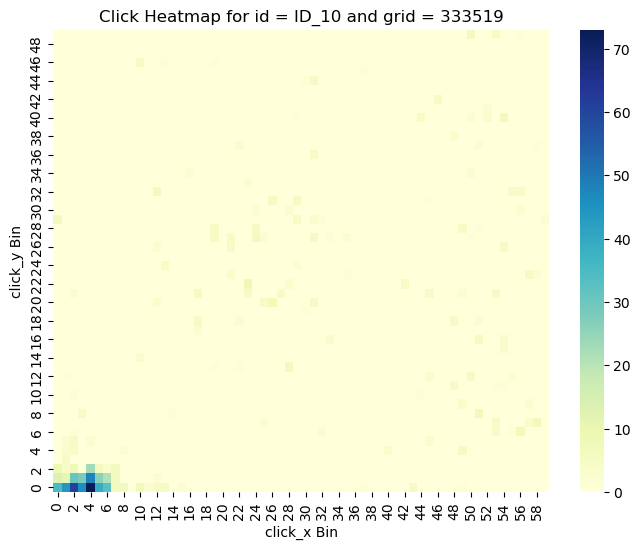

 Pct of broken domains according to prob method:  0.500
 Pct of broken domains according to both methods: 0.500
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.333
 Pct of broken domains according to both methods: 0.333
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1002
 p-value for chisquared test:  0.0
 log-prob for prob method:     2.63269242868361e-278


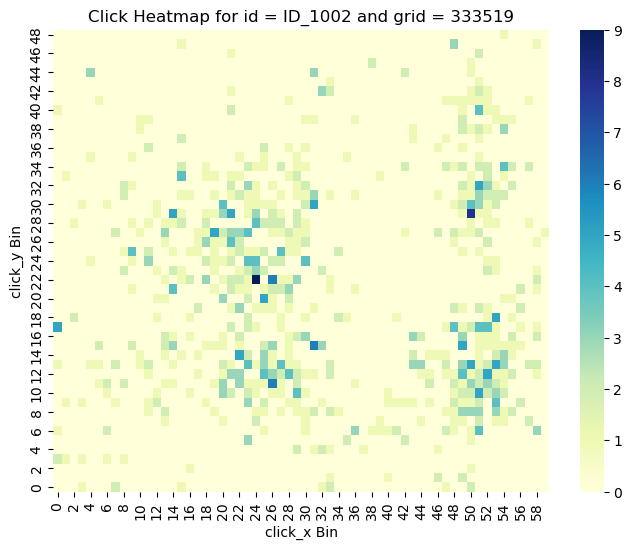

 Pct of broken domains according to prob method:  0.500
 Pct of broken domains according to both methods: 0.500
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.400
 Pct of broken domains according to both methods: 0.400
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.333
 Pct of broken domains according to both methods: 0.333
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.286
 Pct of broken domains according to both methods: 0.286
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.250
 Pct of broken domains according to both methods: 0.250
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.222
 Pct of broken domains according to both methods: 0.222
----------------------------

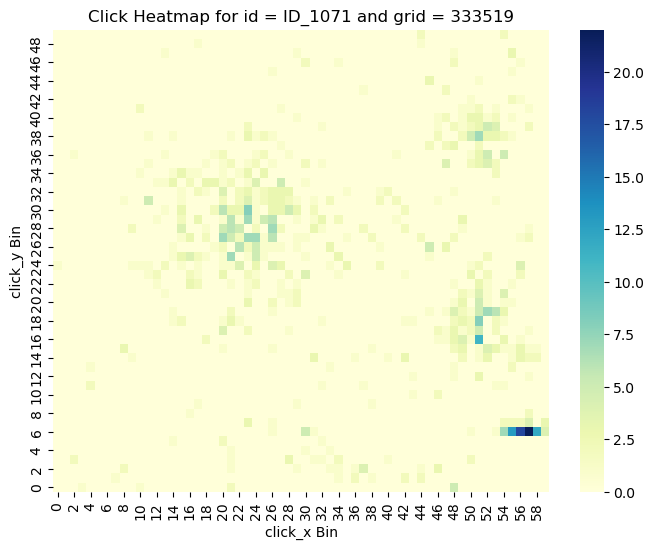

 Pct of broken domains according to prob method:  0.214
 Pct of broken domains according to both methods: 0.214
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1072
 p-value for chisquared test:  5.265528729024779e-212
 log-prob for prob method:     1.0413397271486803e-08


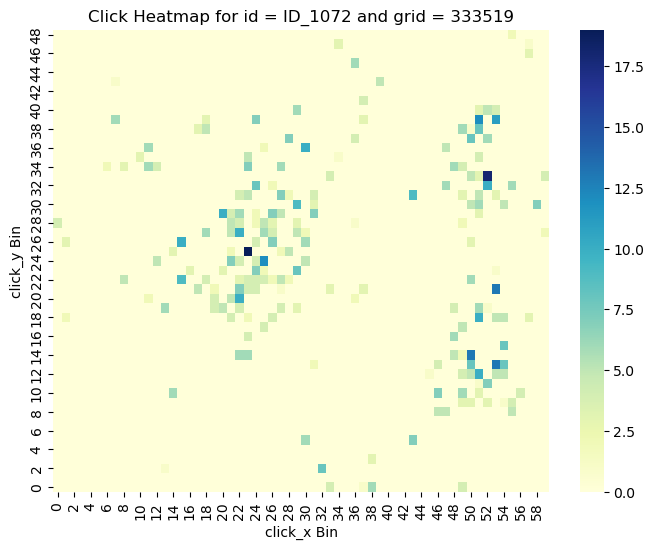

 Pct of broken domains according to prob method:  0.267
 Pct of broken domains according to both methods: 0.267
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1074
 p-value for chisquared test:  0.0
 log-prob for prob method:     3.6309767298254222e-09


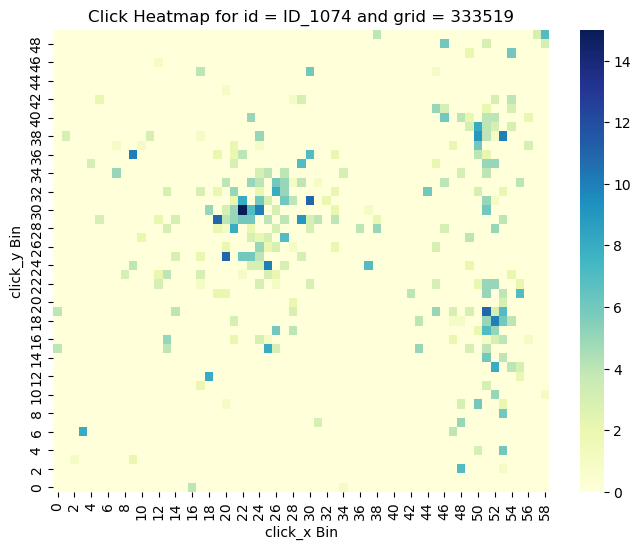

 Pct of broken domains according to prob method:  0.312
 Pct of broken domains according to both methods: 0.312
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.294
 Pct of broken domains according to both methods: 0.294
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1082
 p-value for chisquared test:  0.0
 log-prob for prob method:     1.2196448764609168e-246


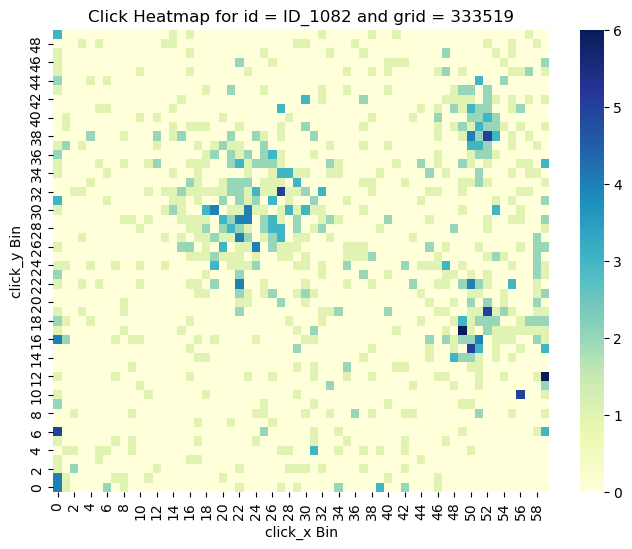

 Pct of broken domains according to prob method:  0.333
 Pct of broken domains according to both methods: 0.333
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.316
 Pct of broken domains according to both methods: 0.316
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1089
 p-value for chisquared test:  8.636077763516707e-39
 log-prob for prob method:     1.104898275398128e-76


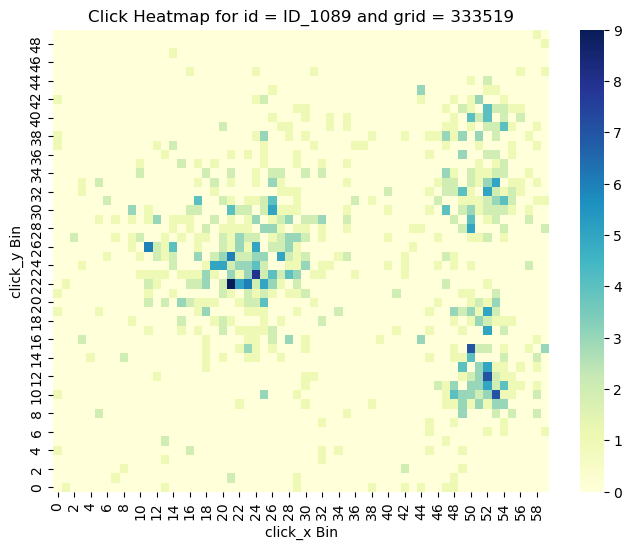

 Pct of broken domains according to prob method:  0.350
 Pct of broken domains according to both methods: 0.350
-----------------------------------------------------------
 grid id: 333519, domain id: ID_109
 p-value for chisquared test:  1.1943223411327066e-47
 log-prob for prob method:     7.440010869132536e-15


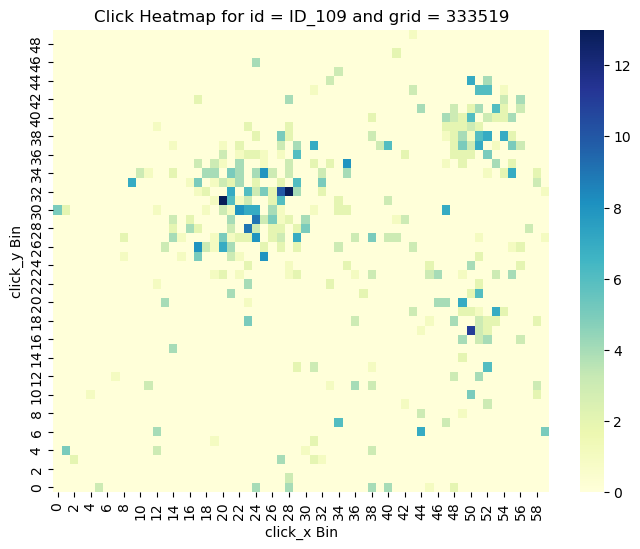

 Pct of broken domains according to prob method:  0.381
 Pct of broken domains according to both methods: 0.381
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.364
 Pct of broken domains according to both methods: 0.364
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.348
 Pct of broken domains according to both methods: 0.348
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1100
 p-value for chisquared test:  2.700816923297673e-113
 log-prob for prob method:     5.060620799014564e-25


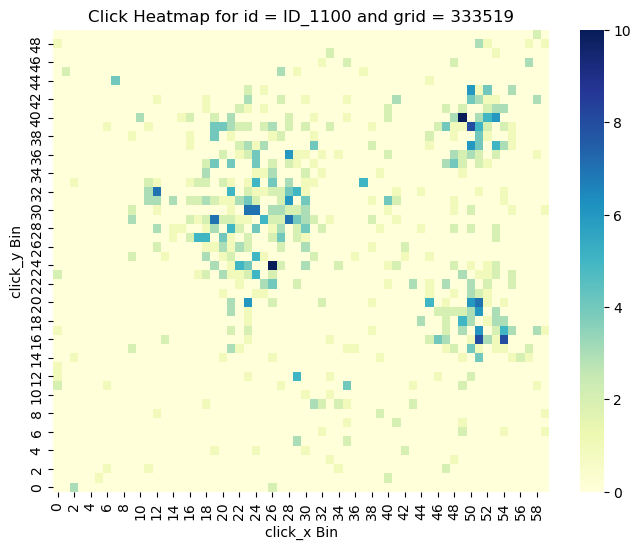

 Pct of broken domains according to prob method:  0.375
 Pct of broken domains according to both methods: 0.375
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.360
 Pct of broken domains according to both methods: 0.360
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1108
 p-value for chisquared test:  0.0
 log-prob for prob method:     1.0121328263317056e-106


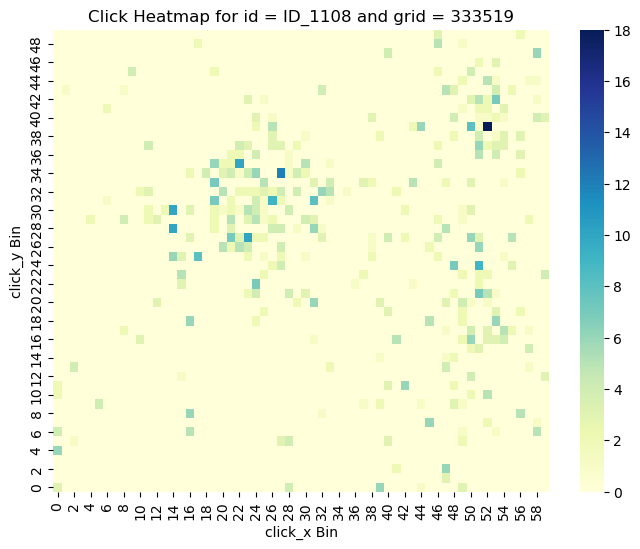

 Pct of broken domains according to prob method:  0.385
 Pct of broken domains according to both methods: 0.385
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.370
 Pct of broken domains according to both methods: 0.370
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.357
 Pct of broken domains according to both methods: 0.357
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.345
 Pct of broken domains according to both methods: 0.345
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.333
 Pct of broken domains according to both methods: 0.333
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1131
 p-value for chisquared test:  7.638507472700347e-265
 log-prob for prob method:     9.140611583857745e

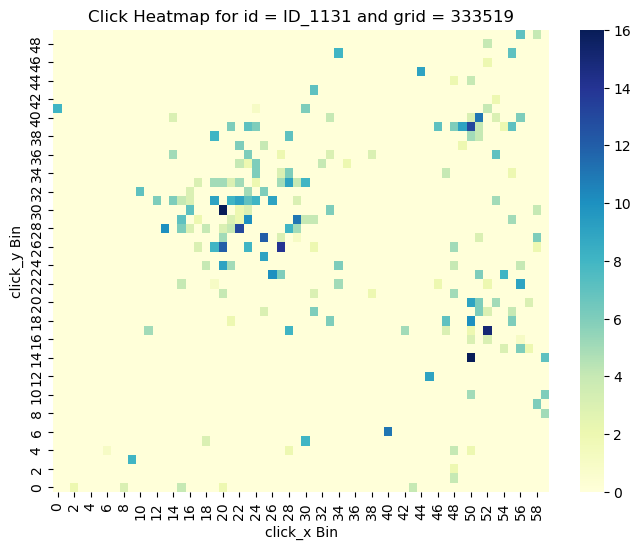

 Pct of broken domains according to prob method:  0.355
 Pct of broken domains according to both methods: 0.355
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.344
 Pct of broken domains according to both methods: 0.344
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.333
 Pct of broken domains according to both methods: 0.333
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1141
 p-value for chisquared test:  0.0
 log-prob for prob method:     8.166577722565922e-208


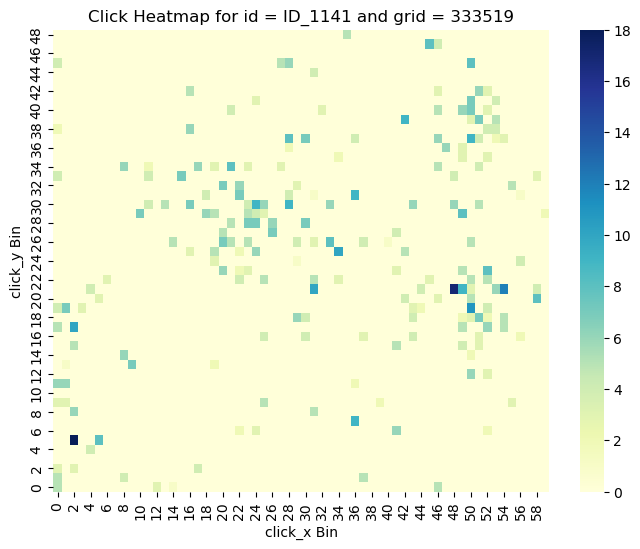

 Pct of broken domains according to prob method:  0.353
 Pct of broken domains according to both methods: 0.353
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.343
 Pct of broken domains according to both methods: 0.343
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.333
 Pct of broken domains according to both methods: 0.333
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1149
 p-value for chisquared test:  0.0
 log-prob for prob method:     1.407916636667296e-135


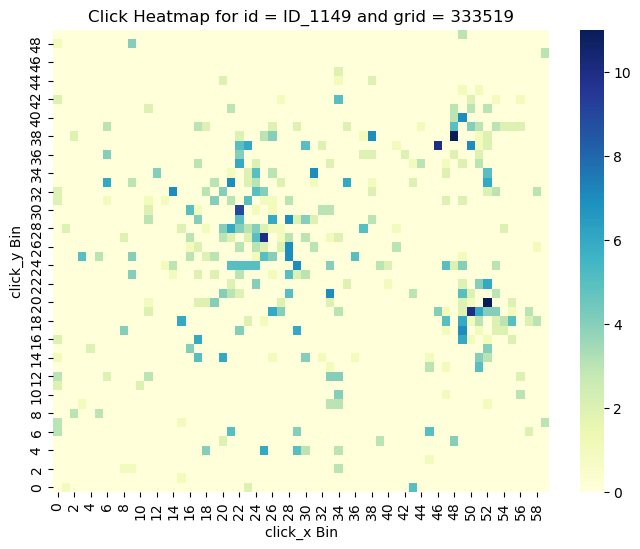

 Pct of broken domains according to prob method:  0.351
 Pct of broken domains according to both methods: 0.351
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.342
 Pct of broken domains according to both methods: 0.342
-----------------------------------------------------------
 grid id: 333519, domain id: ID_116
 p-value for chisquared test:  1.1278915966526038e-56
 log-prob for prob method:     4.458255282166257e-21


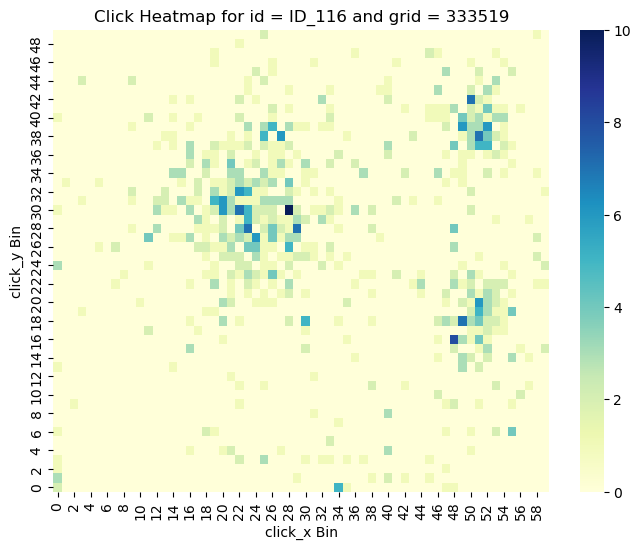

 Pct of broken domains according to prob method:  0.359
 Pct of broken domains according to both methods: 0.359
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.350
 Pct of broken domains according to both methods: 0.350
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.341
 Pct of broken domains according to both methods: 0.341
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1178
 p-value for chisquared test:  6.021964518156583e-211
 log-prob for prob method:     6.250271372184646e-57


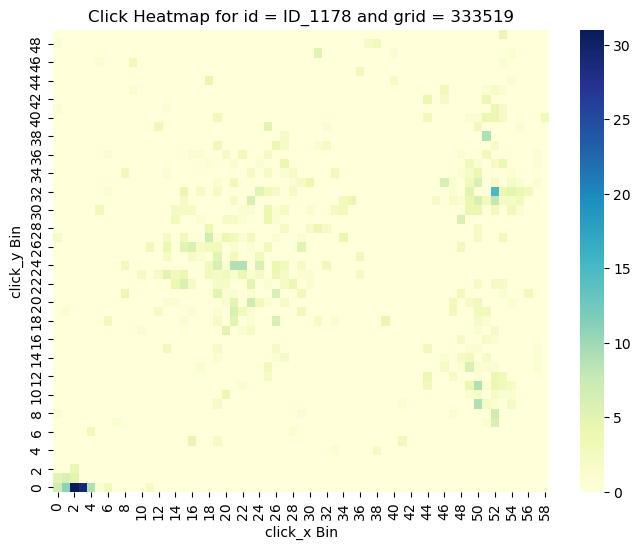

 Pct of broken domains according to prob method:  0.357
 Pct of broken domains according to both methods: 0.357
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1184
 p-value for chisquared test:  0.0
 log-prob for prob method:     0.0


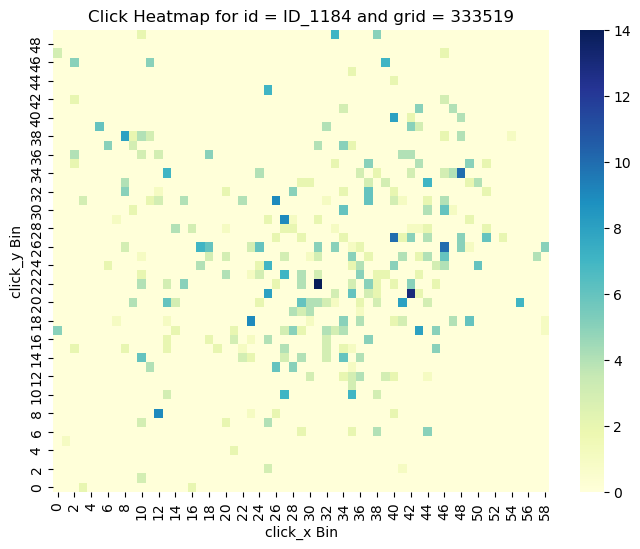

 Pct of broken domains according to prob method:  0.372
 Pct of broken domains according to both methods: 0.372
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.364
 Pct of broken domains according to both methods: 0.364
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.356
 Pct of broken domains according to both methods: 0.356
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.348
 Pct of broken domains according to both methods: 0.348
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.340
 Pct of broken domains according to both methods: 0.340
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.333
 Pct of broken domains according to both methods: 0.333
----------------------------

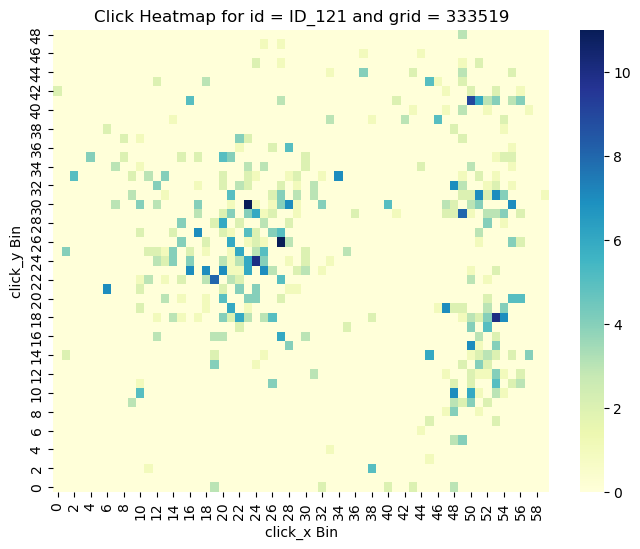

 Pct of broken domains according to prob method:  0.327
 Pct of broken domains according to both methods: 0.327
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1211
 p-value for chisquared test:  1.0665566526059212e-215
 log-prob for prob method:     1.1005626032923055e-33


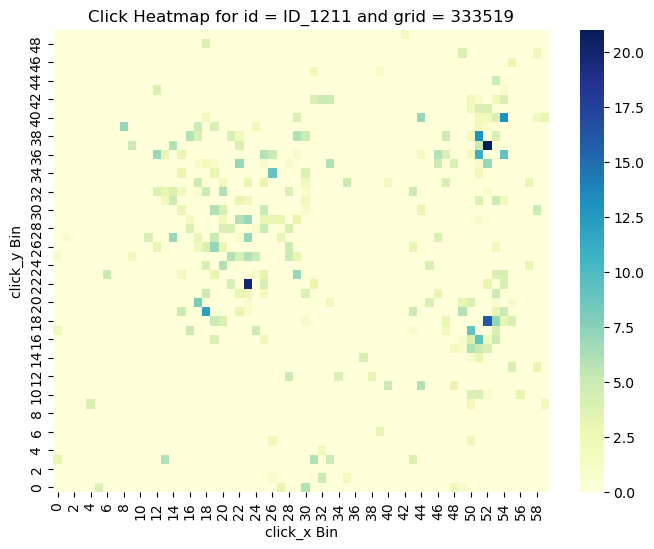

 Pct of broken domains according to prob method:  0.340
 Pct of broken domains according to both methods: 0.340
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1218
 p-value for chisquared test:  6.586613496954724e-106
 log-prob for prob method:     1.844219564946121e-27


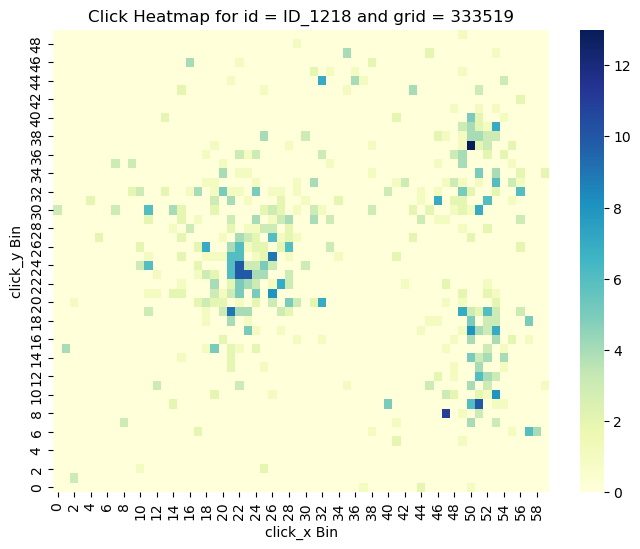

 Pct of broken domains according to prob method:  0.352
 Pct of broken domains according to both methods: 0.352
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1219
 p-value for chisquared test:  1.0164755962313882e-45
 log-prob for prob method:     1.7479971822972775e-26


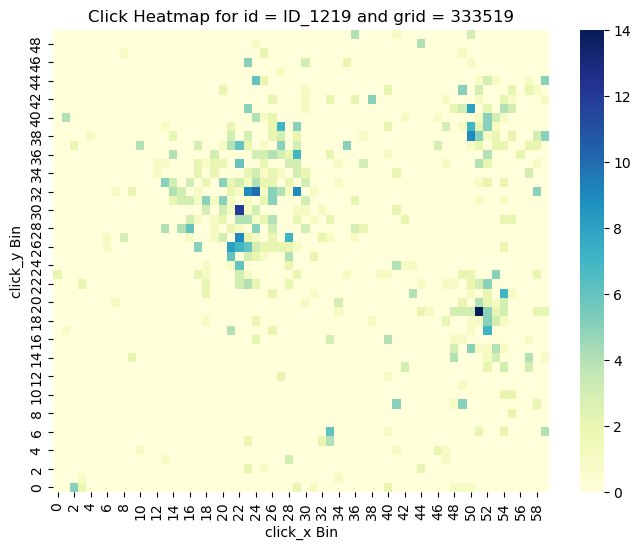

 Pct of broken domains according to prob method:  0.364
 Pct of broken domains according to both methods: 0.364
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1220
 p-value for chisquared test:  0.0
 log-prob for prob method:     3.1539504707686847e-35


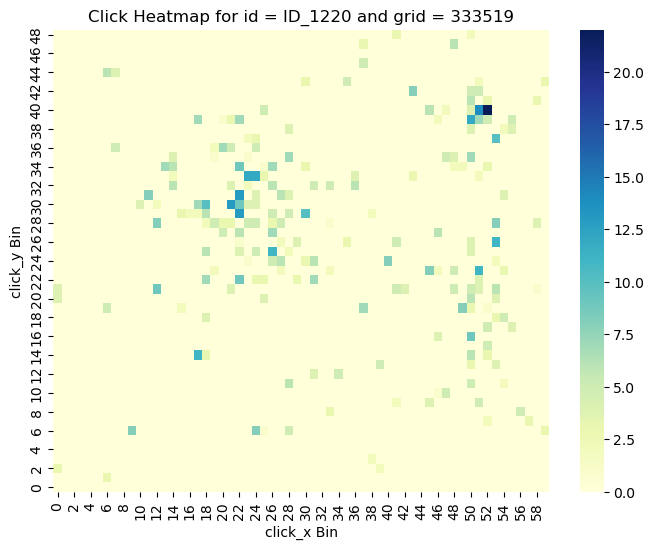

 Pct of broken domains according to prob method:  0.375
 Pct of broken domains according to both methods: 0.375
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.368
 Pct of broken domains according to both methods: 0.368
-----------------------------------------------------------
 grid id: 333519, domain id: ID_123
 p-value for chisquared test:  1.1508120058926989e-66
 log-prob for prob method:     8.368624467255232e-49


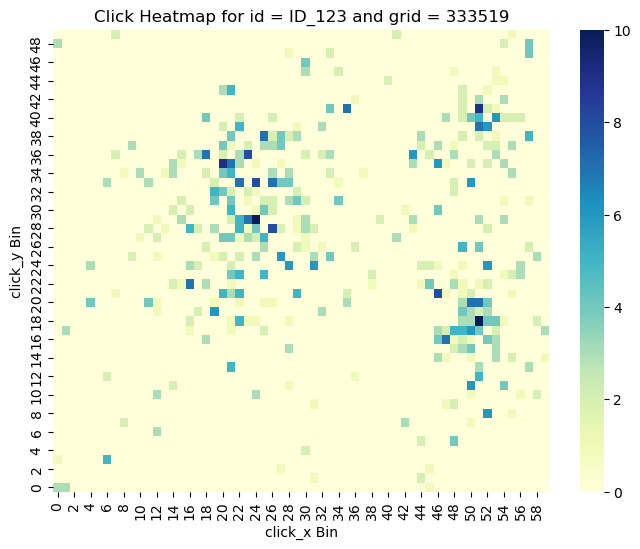

 Pct of broken domains according to prob method:  0.379
 Pct of broken domains according to both methods: 0.379
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1236
 p-value for chisquared test:  1.9644651947787405e-83
 log-prob for prob method:     3.3654481256004246e-75


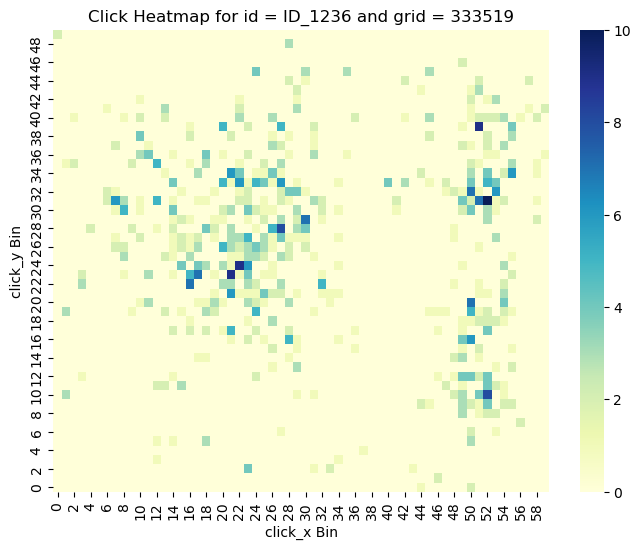

 Pct of broken domains according to prob method:  0.390
 Pct of broken domains according to both methods: 0.390
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1239
 p-value for chisquared test:  1.4087461636042278e-89
 log-prob for prob method:     1.067026703288233e-100


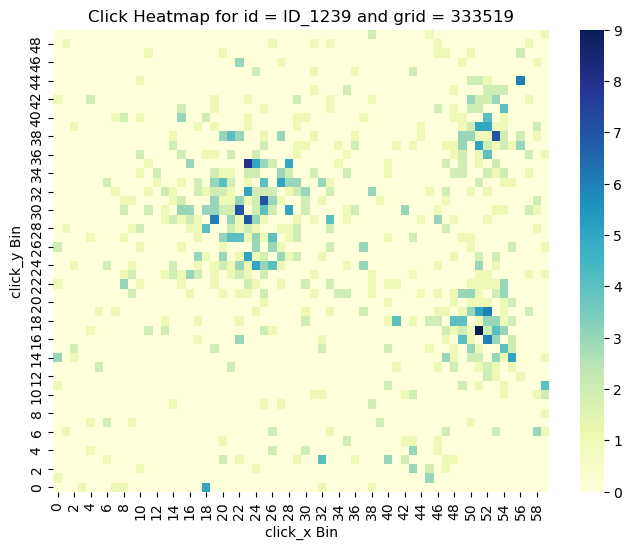

 Pct of broken domains according to prob method:  0.400
 Pct of broken domains according to both methods: 0.400
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1246
 p-value for chisquared test:  0.0
 log-prob for prob method:     2.1453390656499304e-133


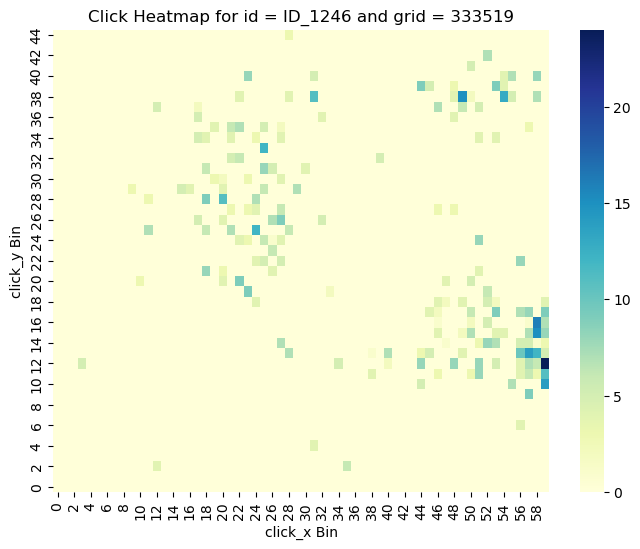

 Pct of broken domains according to prob method:  0.410
 Pct of broken domains according to both methods: 0.410
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.403
 Pct of broken domains according to both methods: 0.403
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.397
 Pct of broken domains according to both methods: 0.397
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1262
 p-value for chisquared test:  0.0
 log-prob for prob method:     2.539827665687922e-130


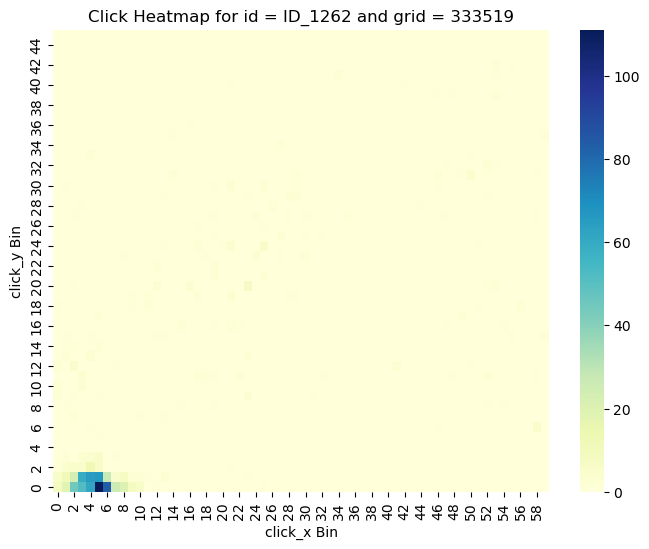

 Pct of broken domains according to prob method:  0.406
 Pct of broken domains according to both methods: 0.406
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1268
 p-value for chisquared test:  6.236546698498691e-278
 log-prob for prob method:     1.6011335612769572e-292


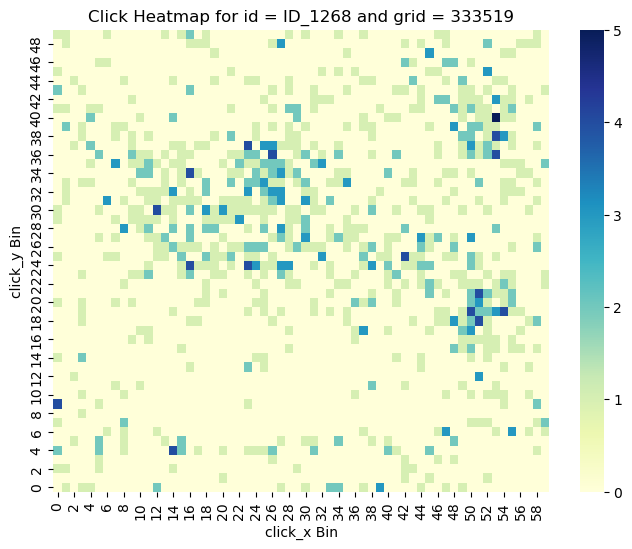

 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.415
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.409
 Pct of broken domains according to both methods: 0.409
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1279
 p-value for chisquared test:  7.348833006556119e-155
 log-prob for prob method:     8.583897360490476e-37


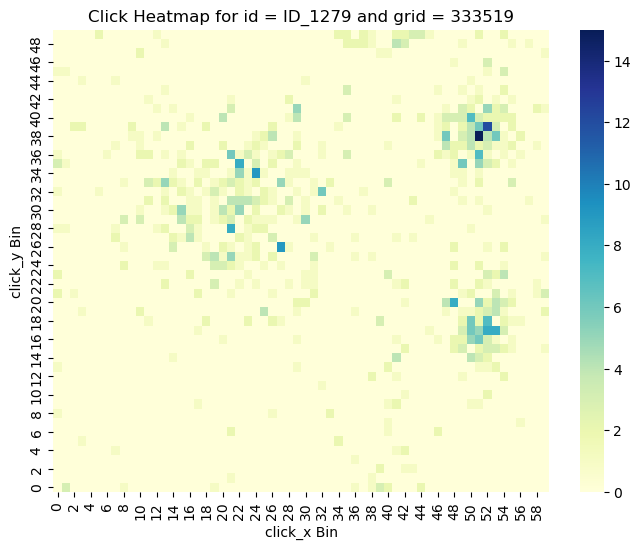

 Pct of broken domains according to prob method:  0.418
 Pct of broken domains according to both methods: 0.418
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1281
 p-value for chisquared test:  0.0
 log-prob for prob method:     3.3975474380924465e-239


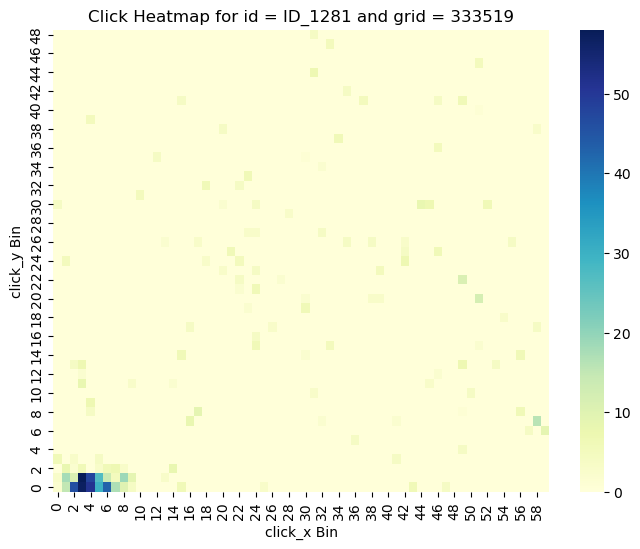

 Pct of broken domains according to prob method:  0.426
 Pct of broken domains according to both methods: 0.426
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.420
 Pct of broken domains according to both methods: 0.420
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.414
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.408
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.417
 Pct of broken domains according to both methods: 0.403
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1303
 p-value for chisquared test:  3.0235891660738407e-69
 log-prob for prob method:     4.000468791841697e

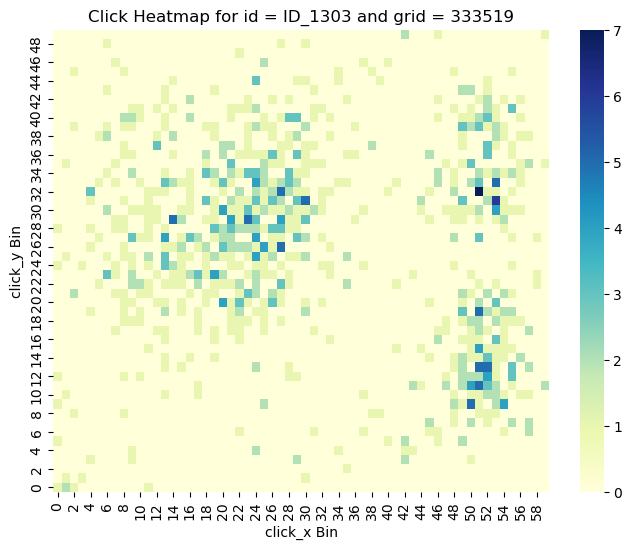

 Pct of broken domains according to prob method:  0.425
 Pct of broken domains according to both methods: 0.411
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1305
 p-value for chisquared test:  0.0
 log-prob for prob method:     0.0


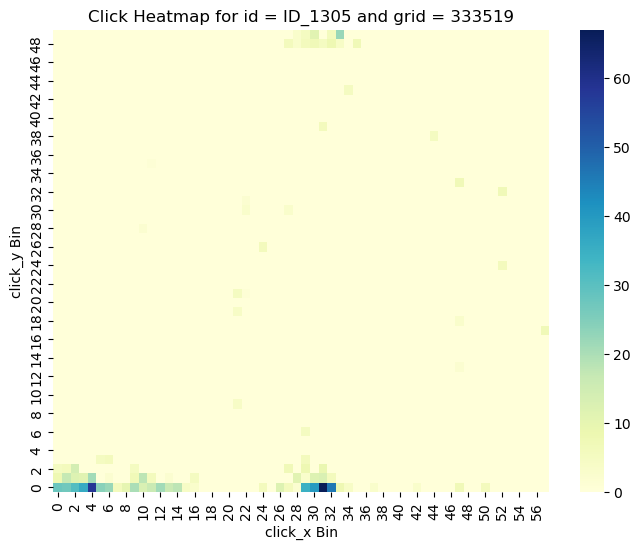

 Pct of broken domains according to prob method:  0.432
 Pct of broken domains according to both methods: 0.419
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1310
 p-value for chisquared test:  3.589518081737932e-103
 log-prob for prob method:     7.856917705191645e-60


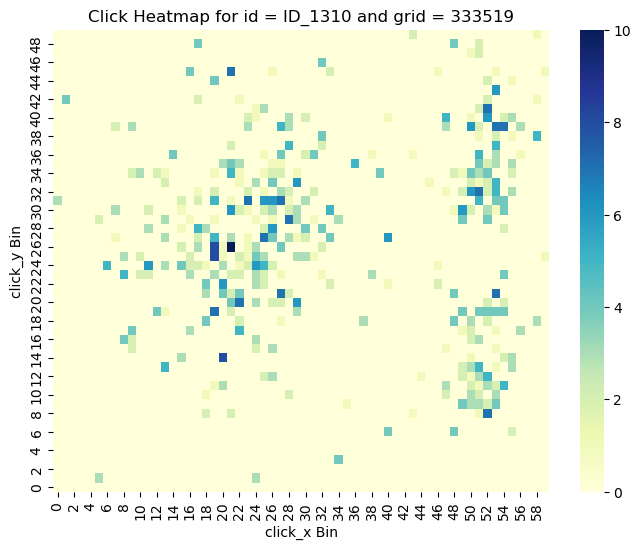

 Pct of broken domains according to prob method:  0.440
 Pct of broken domains according to both methods: 0.427
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.434
 Pct of broken domains according to both methods: 0.421
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1321
 p-value for chisquared test:  3.7125973061360015e-32
 log-prob for prob method:     4.0513805883307676e-48


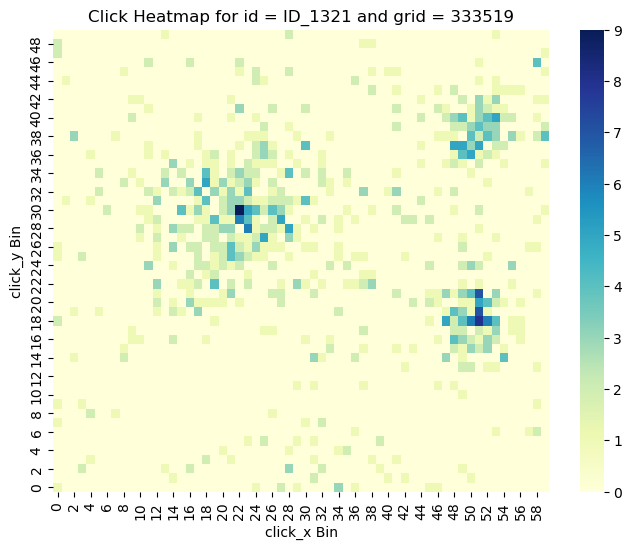

 Pct of broken domains according to prob method:  0.442
 Pct of broken domains according to both methods: 0.429
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.436
 Pct of broken domains according to both methods: 0.423
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1334
 p-value for chisquared test:  3.1029898846051182e-133
 log-prob for prob method:     2.2259681084452232e-14


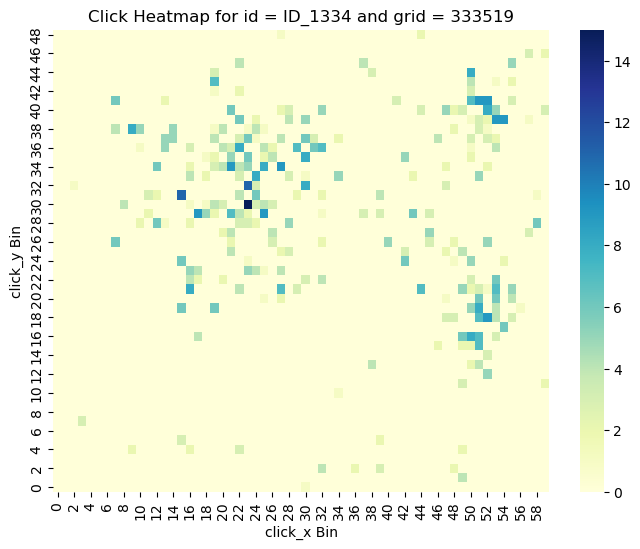

 Pct of broken domains according to prob method:  0.443
 Pct of broken domains according to both methods: 0.430
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.438
 Pct of broken domains according to both methods: 0.425
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.432
 Pct of broken domains according to both methods: 0.420
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.427
 Pct of broken domains according to both methods: 0.415
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1351
 p-value for chisquared test:  0.0
 log-prob for prob method:     6.544972712340736e-157


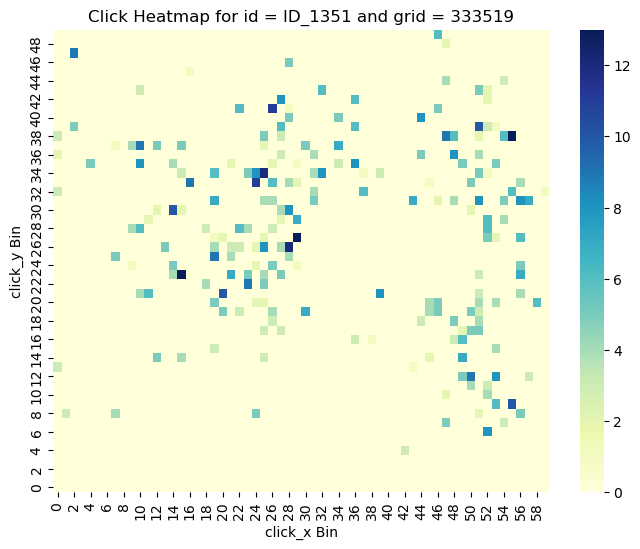

 Pct of broken domains according to prob method:  0.434
 Pct of broken domains according to both methods: 0.422
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1352
 p-value for chisquared test:  1.0544182619306233e-187
 log-prob for prob method:     1.3582787470496664e-31


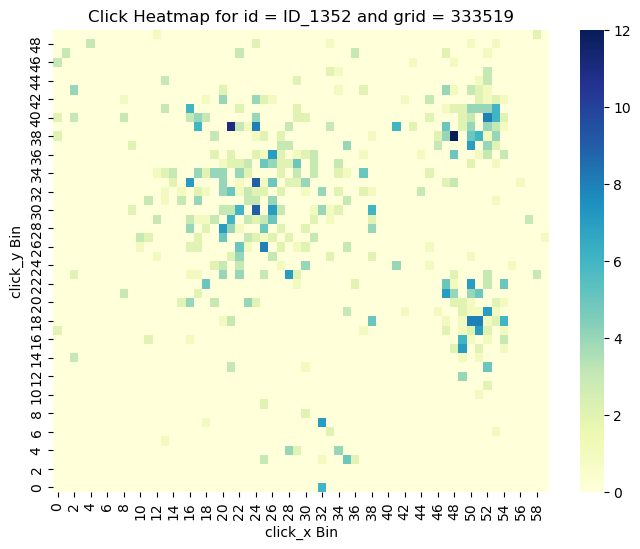

 Pct of broken domains according to prob method:  0.440
 Pct of broken domains according to both methods: 0.429
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1353
 p-value for chisquared test:  0.0
 log-prob for prob method:     0.0


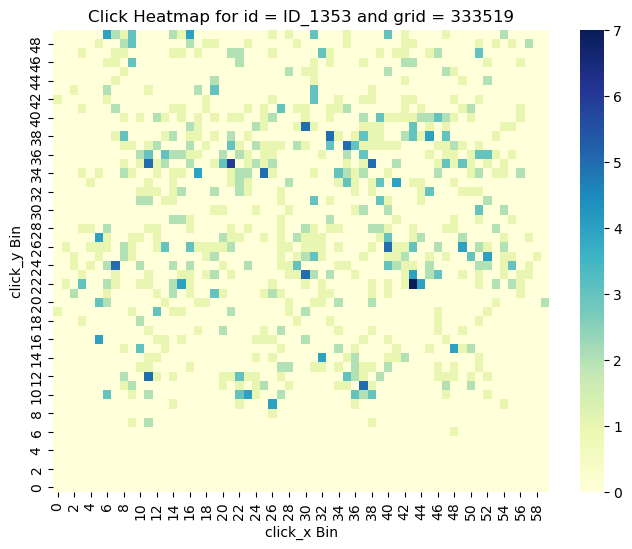

 Pct of broken domains according to prob method:  0.447
 Pct of broken domains according to both methods: 0.435
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.442
 Pct of broken domains according to both methods: 0.430
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.437
 Pct of broken domains according to both methods: 0.425
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.432
 Pct of broken domains according to both methods: 0.420
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.427
 Pct of broken domains according to both methods: 0.416
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.422
 Pct of broken domains according to both methods: 0.411
----------------------------

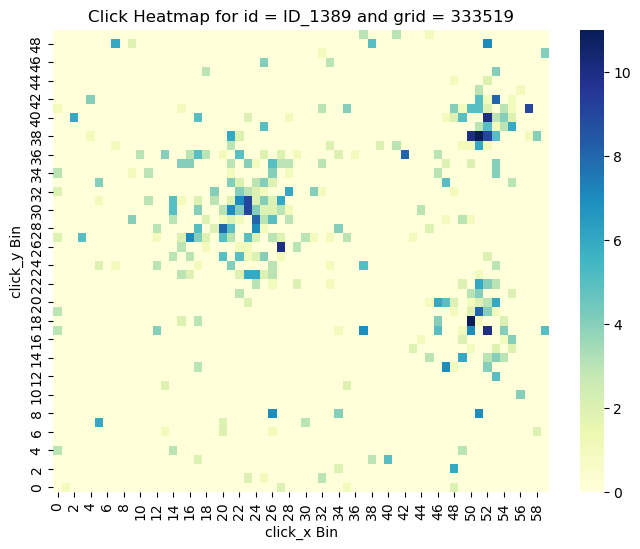

 Pct of broken domains according to prob method:  0.435
 Pct of broken domains according to both methods: 0.413
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.430
 Pct of broken domains according to both methods: 0.409
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.426
 Pct of broken domains according to both methods: 0.404
-----------------------------------------------------------
 grid id: 333519, domain id: ID_14
 p-value for chisquared test:  2.3621618173926004e-171
 log-prob for prob method:     1.2995752027016858e-27


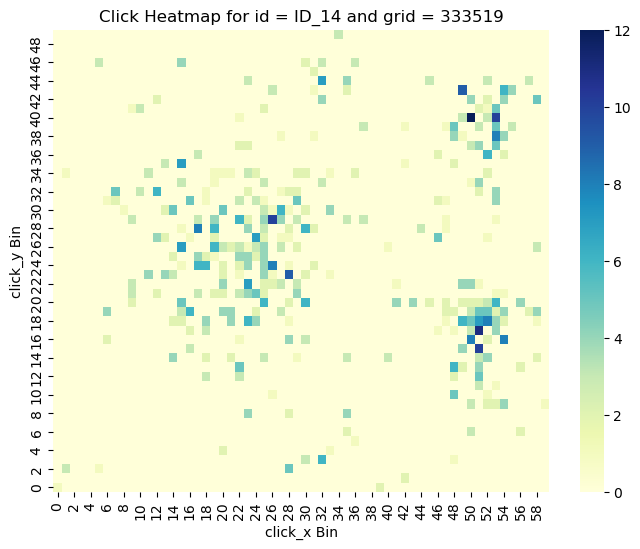

 Pct of broken domains according to prob method:  0.432
 Pct of broken domains according to both methods: 0.411
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.427
 Pct of broken domains according to both methods: 0.406
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1401
 p-value for chisquared test:  7.656255724452136e-187
 log-prob for prob method:     8.447706569935806e-50


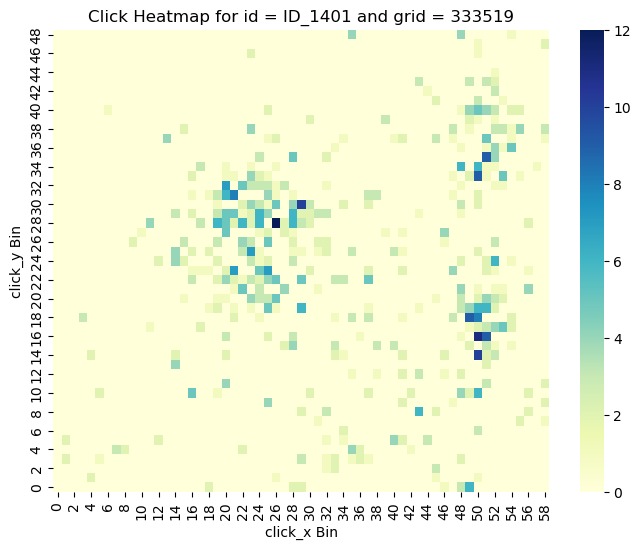

 Pct of broken domains according to prob method:  0.433
 Pct of broken domains according to both methods: 0.412
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1408
 p-value for chisquared test:  0.0
 log-prob for prob method:     1.7046440791909283e-74


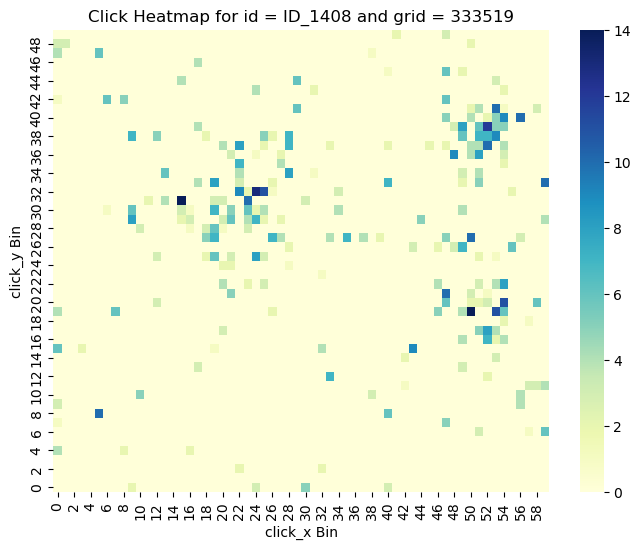

 Pct of broken domains according to prob method:  0.439
 Pct of broken domains according to both methods: 0.418
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.434
 Pct of broken domains according to both methods: 0.414
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.430
 Pct of broken domains according to both methods: 0.410
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.426
 Pct of broken domains according to both methods: 0.406
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.422
 Pct of broken domains according to both methods: 0.402
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1425
 p-value for chisquared test:  1.787508361673206e-49
 log-prob for prob method:     9.655773129432361e-

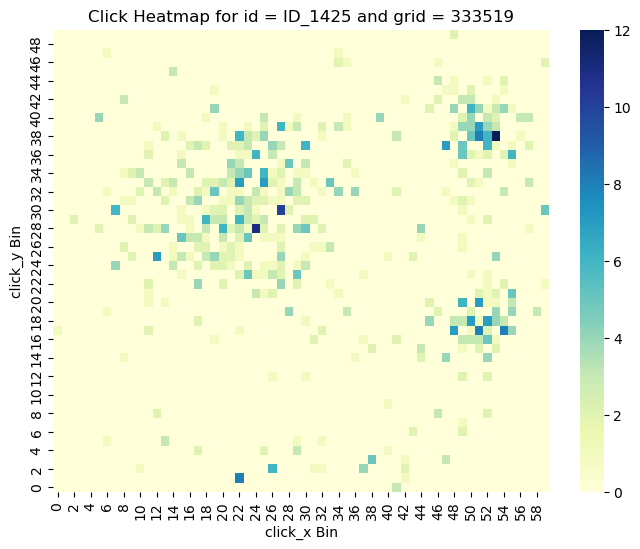

 Pct of broken domains according to prob method:  0.427
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.423
 Pct of broken domains according to both methods: 0.404
-----------------------------------------------------------
 grid id: 333519, domain id: ID_143
 p-value for chisquared test:  0.0
 log-prob for prob method:     2.133061861995251e-72


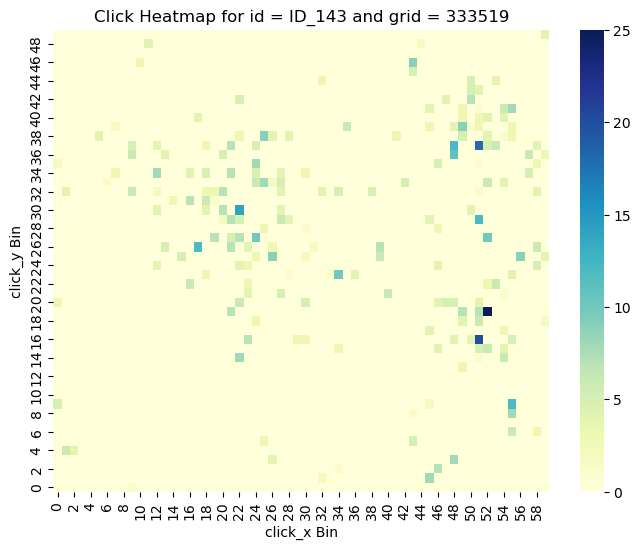

 Pct of broken domains according to prob method:  0.429
 Pct of broken domains according to both methods: 0.410
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1432
 p-value for chisquared test:  0.0
 log-prob for prob method:     1.0848327720032257e-151


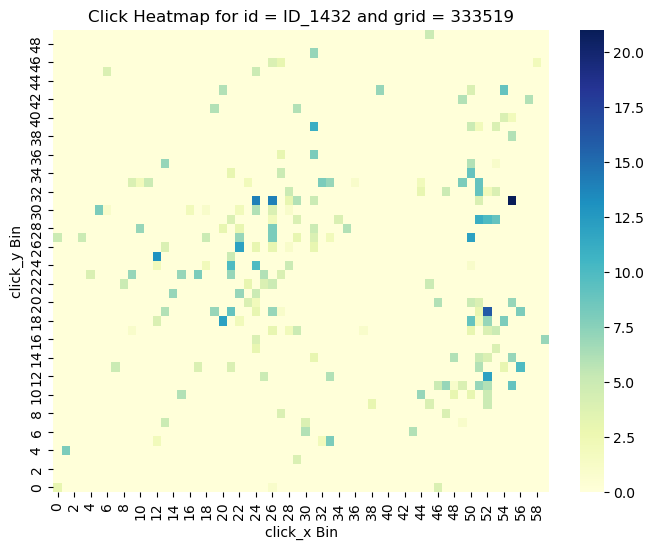

 Pct of broken domains according to prob method:  0.434
 Pct of broken domains according to both methods: 0.415
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.430
 Pct of broken domains according to both methods: 0.411
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.426
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.422
 Pct of broken domains according to both methods: 0.404
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.418
 Pct of broken domains according to both methods: 0.400
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.396
----------------------------

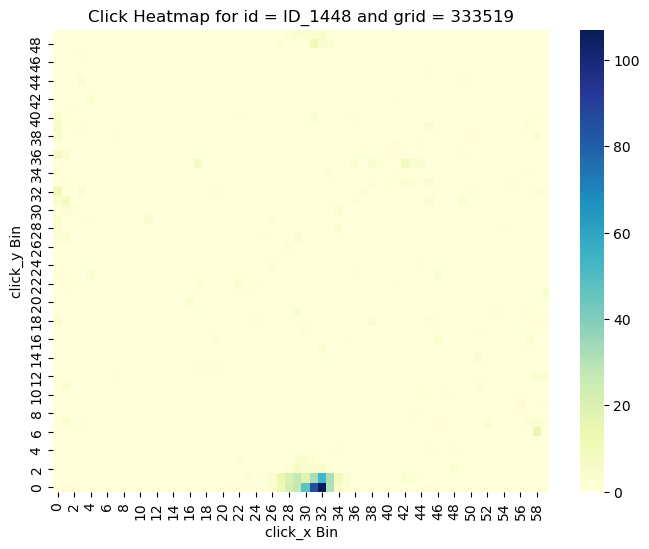

 Pct of broken domains according to prob method:  0.420
 Pct of broken domains according to both methods: 0.402
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.416
 Pct of broken domains according to both methods: 0.398
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.412
 Pct of broken domains according to both methods: 0.395
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.409
 Pct of broken domains according to both methods: 0.391
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1467
 p-value for chisquared test:  1.5305888531900136e-301
 log-prob for prob method:     4.803870186752828e-44


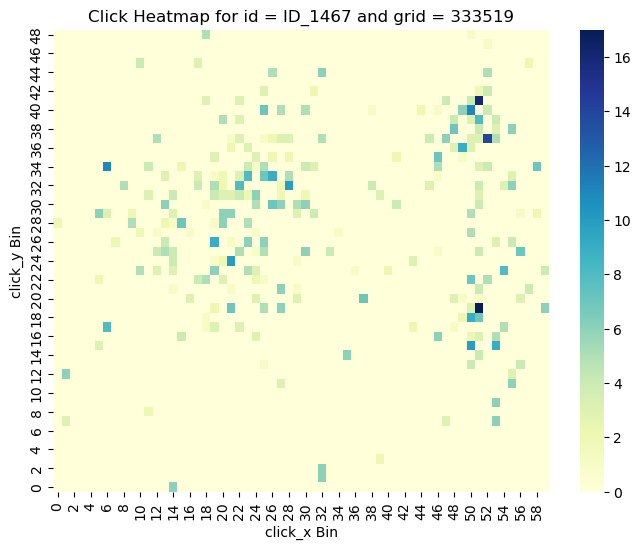

 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.397
-----------------------------------------------------------
 grid id: 333519, domain id: ID_148
 p-value for chisquared test:  2.193657317646882e-11
 log-prob for prob method:     5.326703695267909e-24


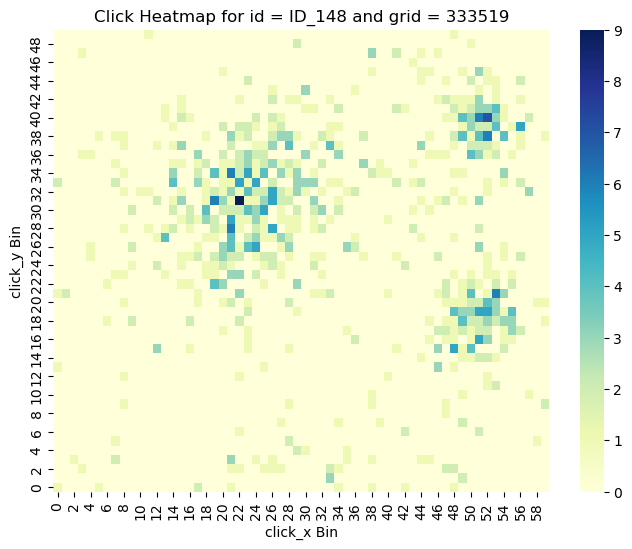

 Pct of broken domains according to prob method:  0.419
 Pct of broken domains according to both methods: 0.402
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1484
 p-value for chisquared test:  4.823172958271151e-66
 log-prob for prob method:     1.04759075857646e-14


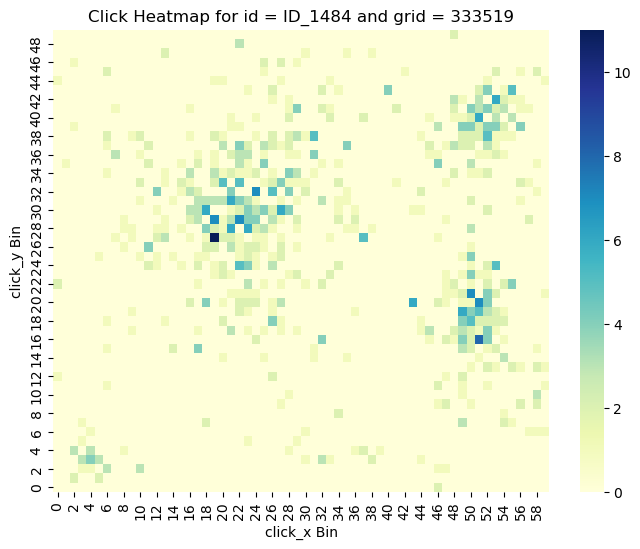

 Pct of broken domains according to prob method:  0.424
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.420
 Pct of broken domains according to both methods: 0.403
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1490
 p-value for chisquared test:  8.122516897315984e-201
 log-prob for prob method:     2.3358446111849717e-34


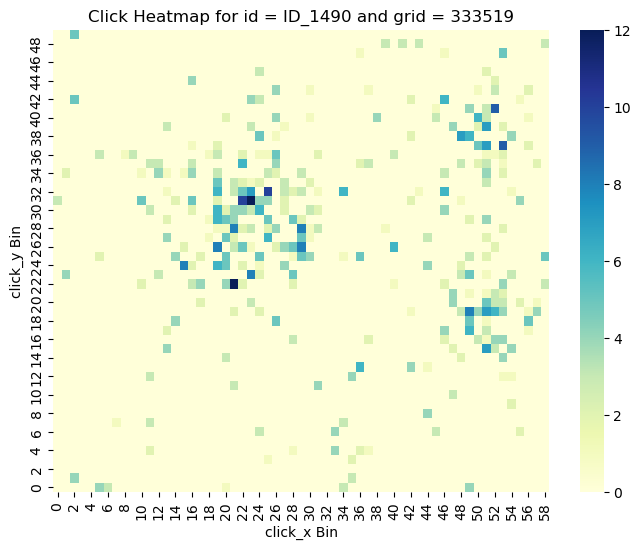

 Pct of broken domains according to prob method:  0.425
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.421
 Pct of broken domains according to both methods: 0.405
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1495
 p-value for chisquared test:  2.3300416061047066e-237
 log-prob for prob method:     9.141813341577217e-38


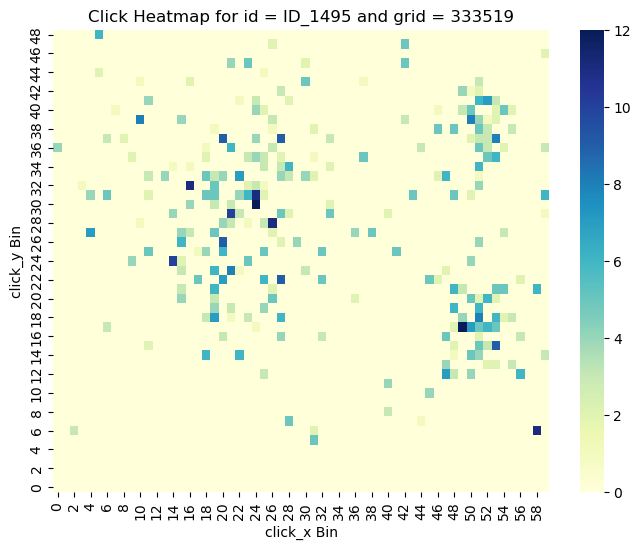

 Pct of broken domains according to prob method:  0.426
 Pct of broken domains according to both methods: 0.410
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.423
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1498
 p-value for chisquared test:  1.42132752015099e-179
 log-prob for prob method:     2.729587189833508e-102


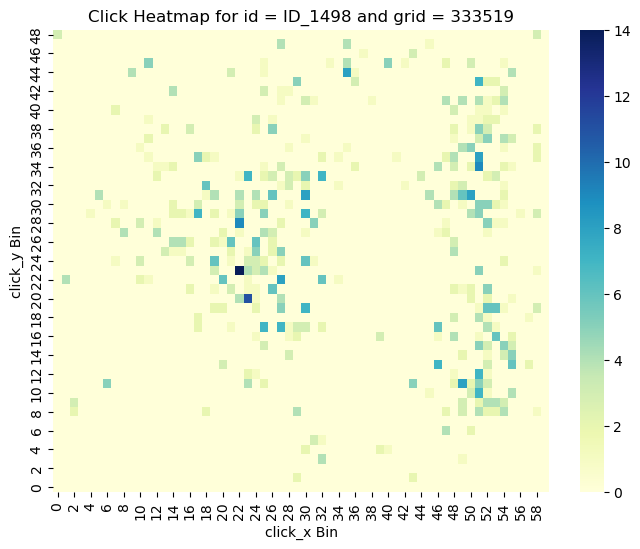

 Pct of broken domains according to prob method:  0.427
 Pct of broken domains according to both methods: 0.411
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.424
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.421
 Pct of broken domains according to both methods: 0.405
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.425
 Pct of broken domains according to both methods: 0.402
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.422
 Pct of broken domains according to both methods: 0.398
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.419
 Pct of broken domains according to both methods: 0.395
----------------------------

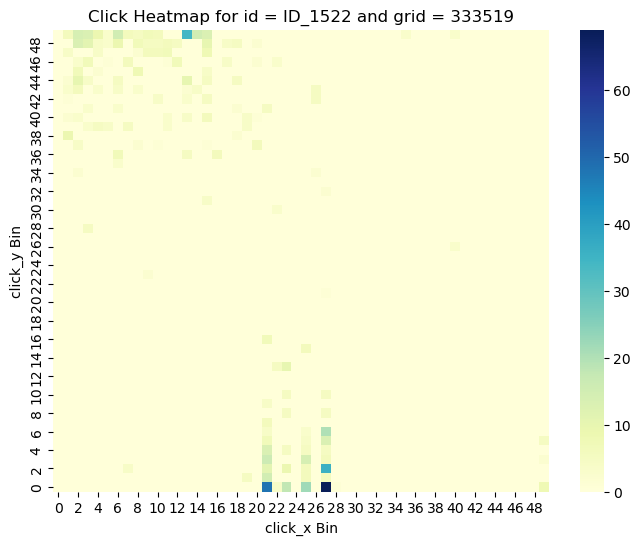

 Pct of broken domains according to prob method:  0.420
 Pct of broken domains according to both methods: 0.397
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1525
 p-value for chisquared test:  0.0
 log-prob for prob method:     1.2382974502054387e-106


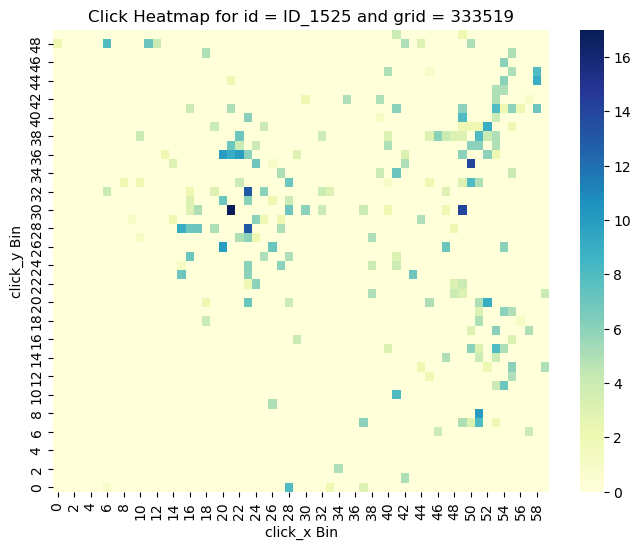

 Pct of broken domains according to prob method:  0.424
 Pct of broken domains according to both methods: 0.402
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1526
 p-value for chisquared test:  0.0
 log-prob for prob method:     1.378322995130081e-117


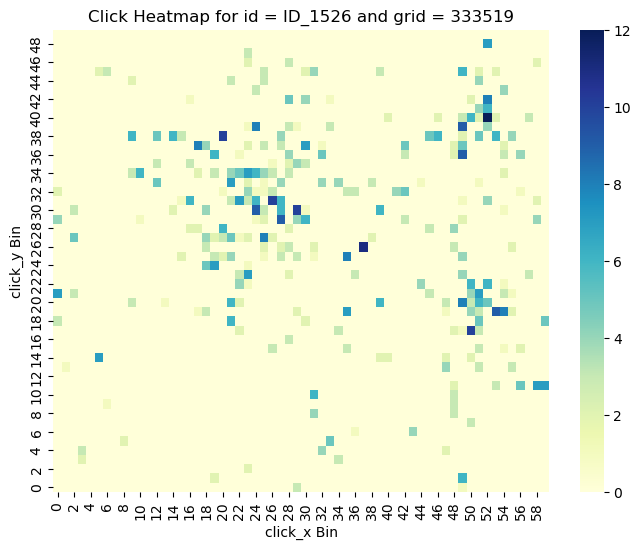

 Pct of broken domains according to prob method:  0.429
 Pct of broken domains according to both methods: 0.406
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1529
 p-value for chisquared test:  0.0
 log-prob for prob method:     7.454260773456171e-28


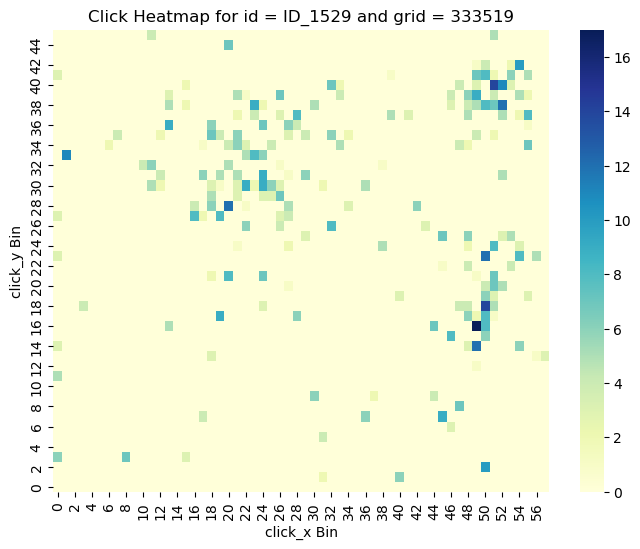

 Pct of broken domains according to prob method:  0.433
 Pct of broken domains according to both methods: 0.410
-----------------------------------------------------------
 grid id: 333519, domain id: ID_153
 p-value for chisquared test:  0.0
 log-prob for prob method:     1.1088044662142653e-149


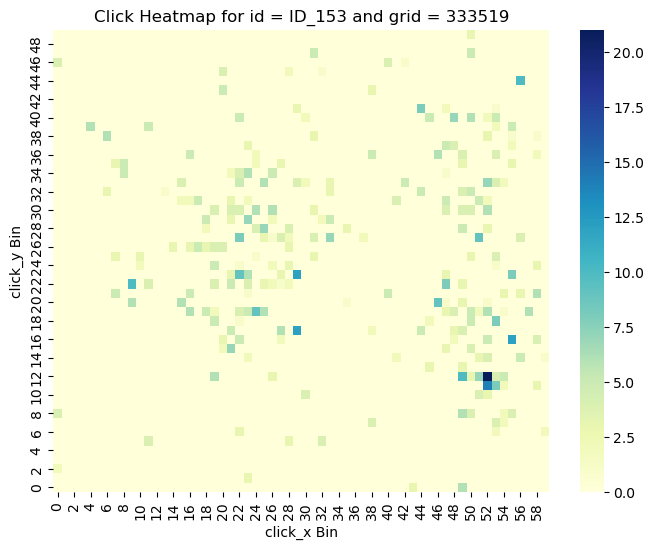

 Pct of broken domains according to prob method:  0.437
 Pct of broken domains according to both methods: 0.415
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.434
 Pct of broken domains according to both methods: 0.412
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1540
 p-value for chisquared test:  8.446859591720888e-25
 log-prob for prob method:     6.290751307520063e-17


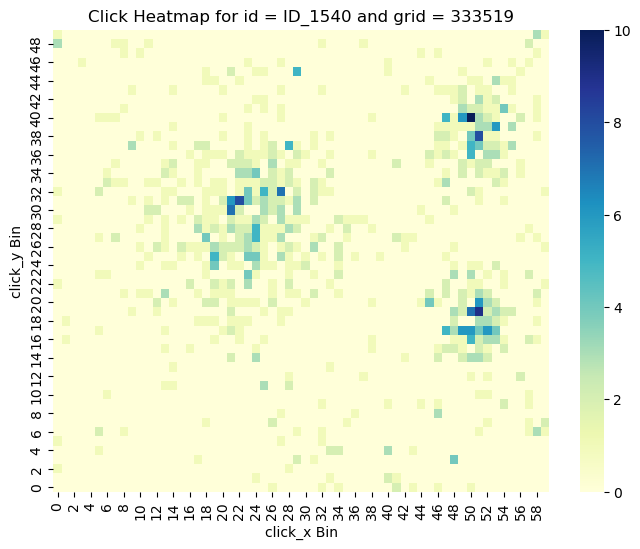

 Pct of broken domains according to prob method:  0.438
 Pct of broken domains according to both methods: 0.416
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1541
 p-value for chisquared test:  7.950293089625429e-57
 log-prob for prob method:     1.757030175685537e-57


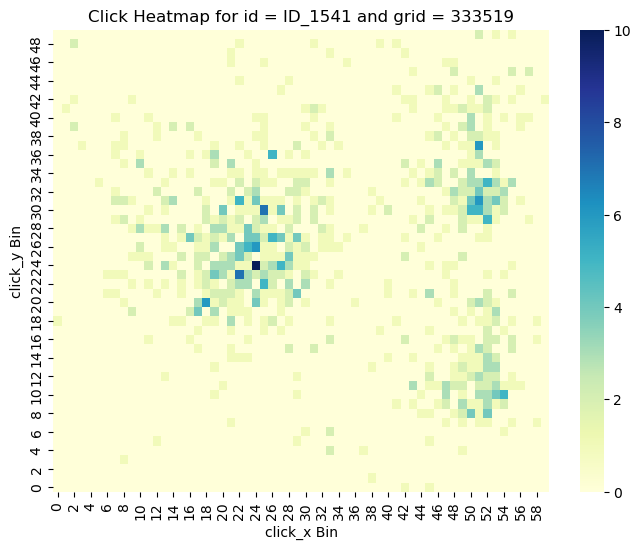

 Pct of broken domains according to prob method:  0.442
 Pct of broken domains according to both methods: 0.420
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1544
 p-value for chisquared test:  0.0
 log-prob for prob method:     0.0


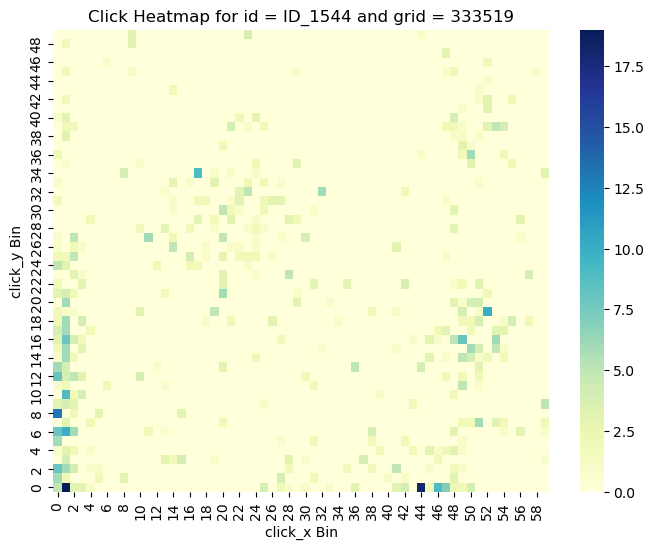

 Pct of broken domains according to prob method:  0.446
 Pct of broken domains according to both methods: 0.424
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.443
 Pct of broken domains according to both methods: 0.421
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.440
 Pct of broken domains according to both methods: 0.418
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.437
 Pct of broken domains according to both methods: 0.415
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.434
 Pct of broken domains according to both methods: 0.413
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1560
 p-value for chisquared test:  0.0
 log-prob for prob method:     1.304140420206079e-183


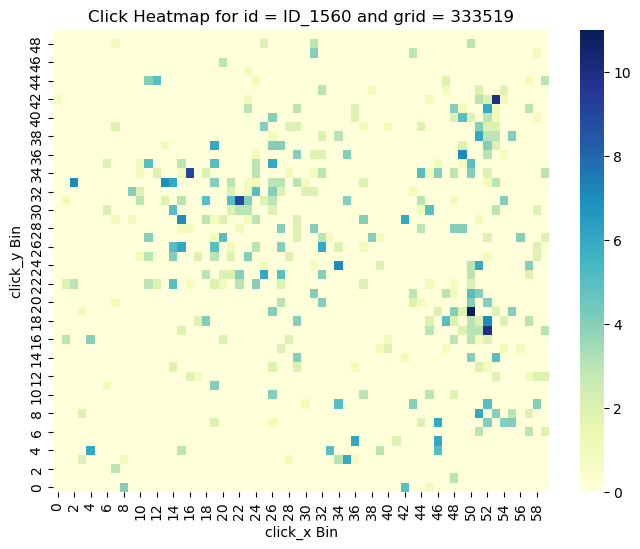

 Pct of broken domains according to prob method:  0.438
 Pct of broken domains according to both methods: 0.417
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.434
 Pct of broken domains according to both methods: 0.414
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.432
 Pct of broken domains according to both methods: 0.411
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.435
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.432
 Pct of broken domains according to both methods: 0.405
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1582
 p-value for chisquared test:  3.633236922096029e-68
 log-prob for prob method:     1.3628176245484239e

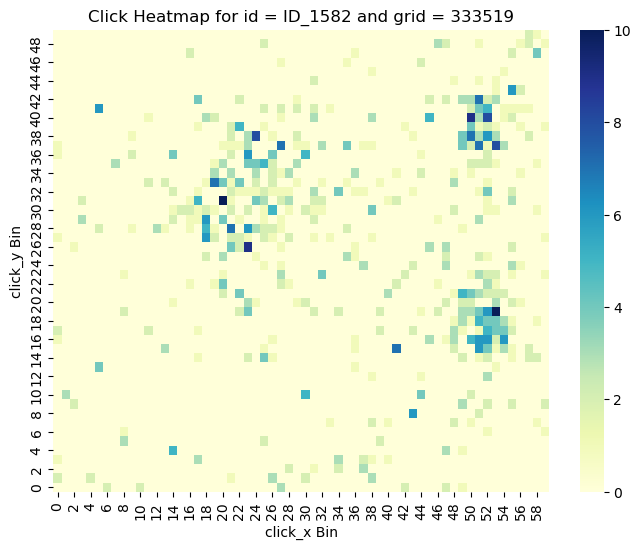

 Pct of broken domains according to prob method:  0.436
 Pct of broken domains according to both methods: 0.409
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.433
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1587
 p-value for chisquared test:  1.219508227044968e-75
 log-prob for prob method:     2.5498913138037856e-165


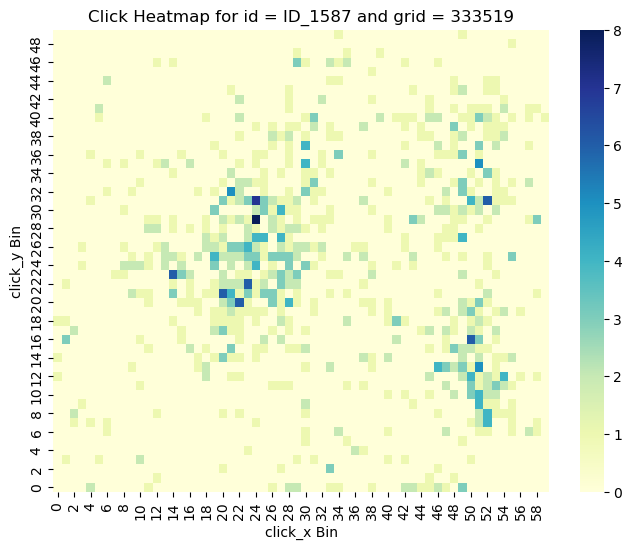

 Pct of broken domains according to prob method:  0.437
 Pct of broken domains according to both methods: 0.411
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.434
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1599
 p-value for chisquared test:  2.0767054733000292e-250
 log-prob for prob method:     9.910497739637846e-34


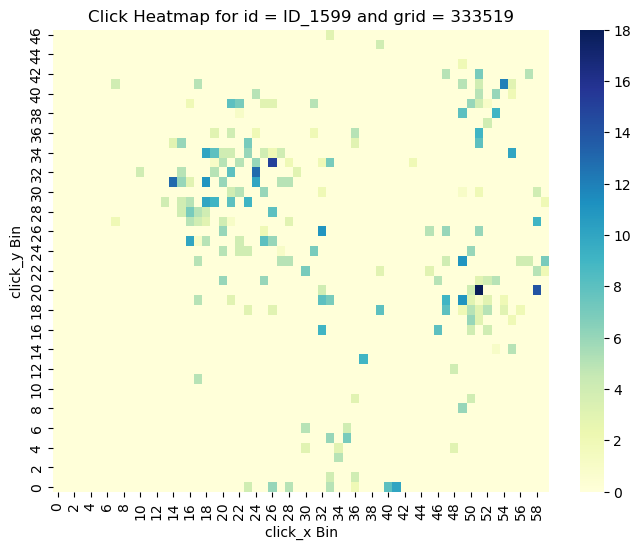

 Pct of broken domains according to prob method:  0.438
 Pct of broken domains according to both methods: 0.412
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.435
 Pct of broken domains according to both methods: 0.409
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1601
 p-value for chisquared test:  2.1274379995176462e-197
 log-prob for prob method:     3.620843845619508e-29


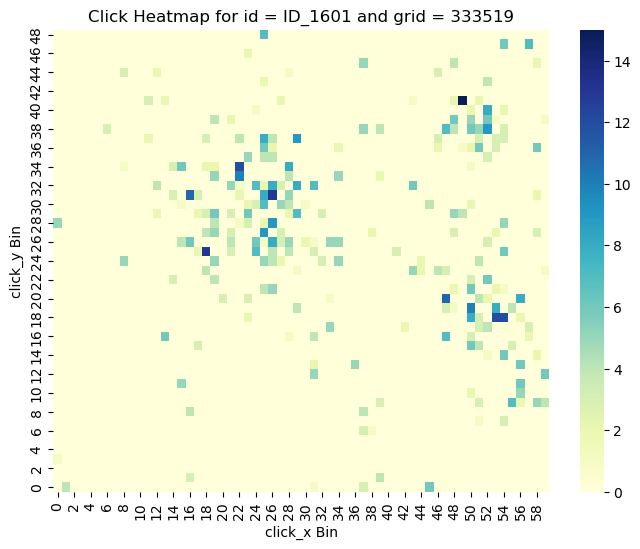

 Pct of broken domains according to prob method:  0.439
 Pct of broken domains according to both methods: 0.413
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.436
 Pct of broken domains according to both methods: 0.410
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.433
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1612
 p-value for chisquared test:  0.0
 log-prob for prob method:     3.3771923983025664e-98


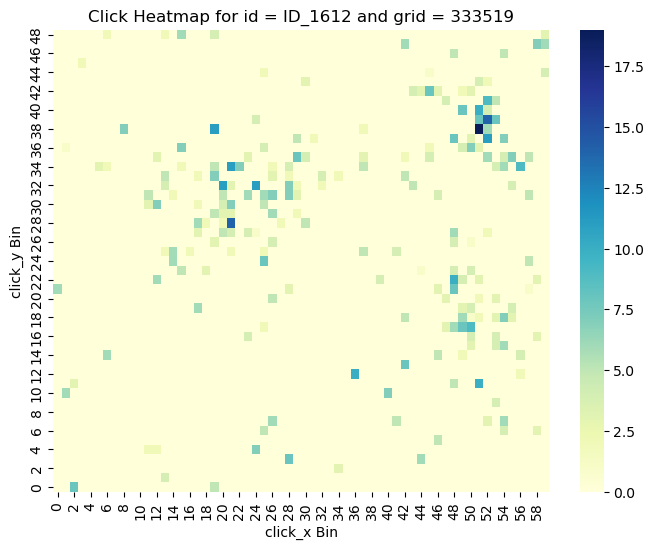

 Pct of broken domains according to prob method:  0.437
 Pct of broken domains according to both methods: 0.411
-----------------------------------------------------------
 grid id: 333519, domain id: ID_162
 p-value for chisquared test:  0.0
 log-prob for prob method:     0.0


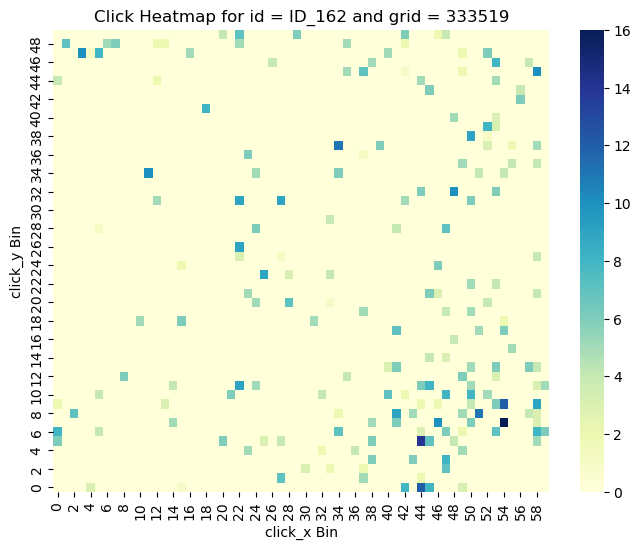

 Pct of broken domains according to prob method:  0.440
 Pct of broken domains according to both methods: 0.415
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1625
 p-value for chisquared test:  5.9587739135461495e-92
 log-prob for prob method:     3.8430296731705355e-14


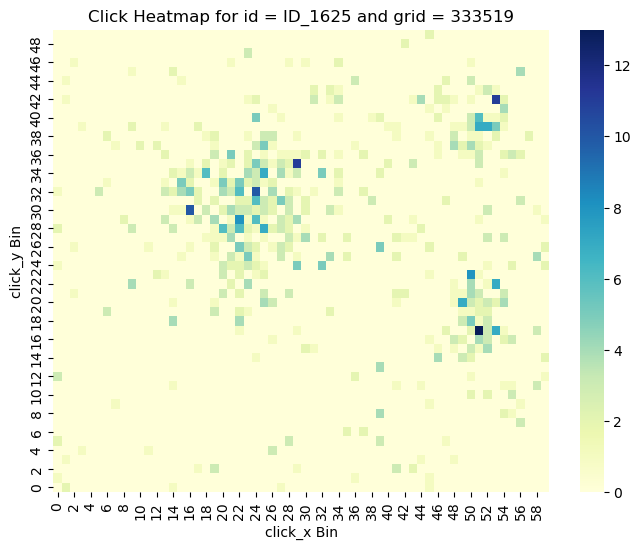

 Pct of broken domains according to prob method:  0.444
 Pct of broken domains according to both methods: 0.419
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.441
 Pct of broken domains according to both methods: 0.416
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.438
 Pct of broken domains according to both methods: 0.414
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.436
 Pct of broken domains according to both methods: 0.411
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1642
 p-value for chisquared test:  1.714942874219757e-137
 log-prob for prob method:     6.83898912240537e-13


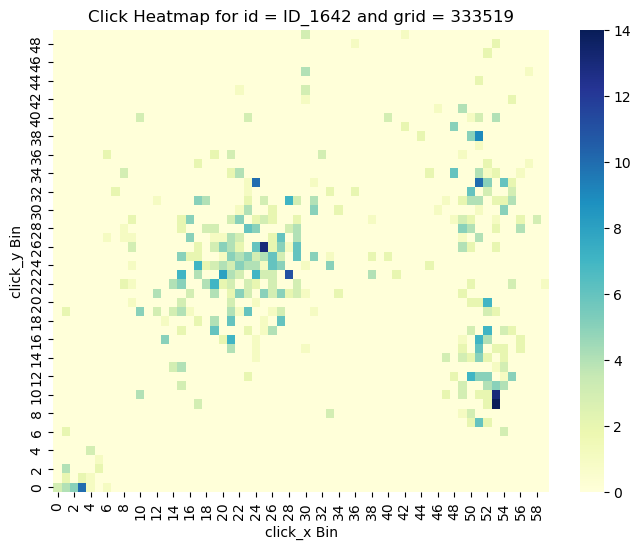

 Pct of broken domains according to prob method:  0.439
 Pct of broken domains according to both methods: 0.415
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.436
 Pct of broken domains according to both methods: 0.412
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.434
 Pct of broken domains according to both methods: 0.410
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1652
 p-value for chisquared test:  9.198315449581599e-151
 log-prob for prob method:     1.9805057104612095e-23


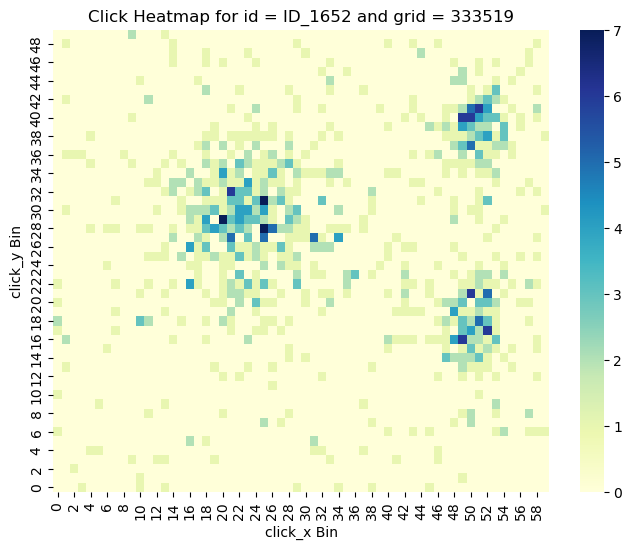

 Pct of broken domains according to prob method:  0.437
 Pct of broken domains according to both methods: 0.413
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.435
 Pct of broken domains according to both methods: 0.411
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.432
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.429
 Pct of broken domains according to both methods: 0.406
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.427
 Pct of broken domains according to both methods: 0.404
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1671
 p-value for chisquared test:  0.0
 log-prob for prob method:     4.739315022448924e-236


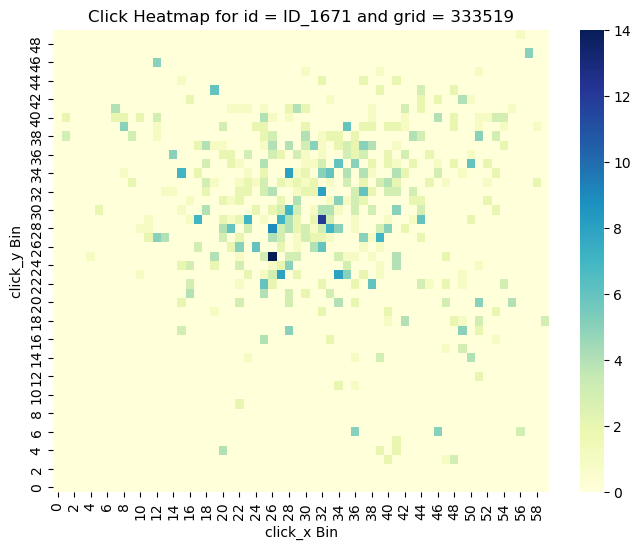

 Pct of broken domains according to prob method:  0.430
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1672
 p-value for chisquared test:  1.6621941064703597e-259
 log-prob for prob method:     2.4728398237457436e-30


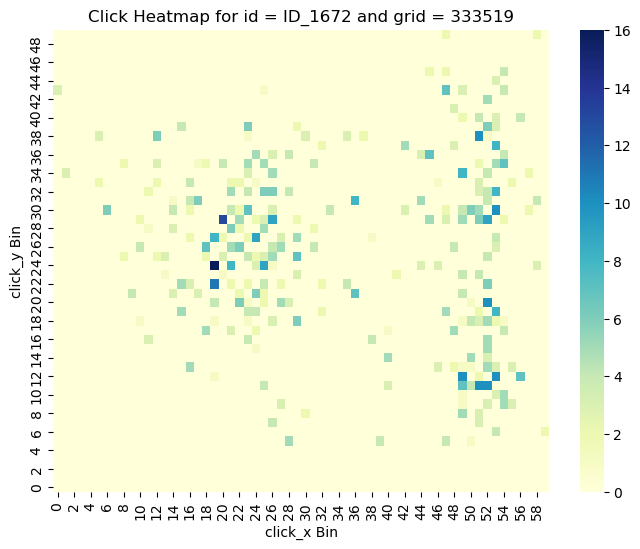

 Pct of broken domains according to prob method:  0.434
 Pct of broken domains according to both methods: 0.410
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.431
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1682
 p-value for chisquared test:  0.0
 log-prob for prob method:     0.0


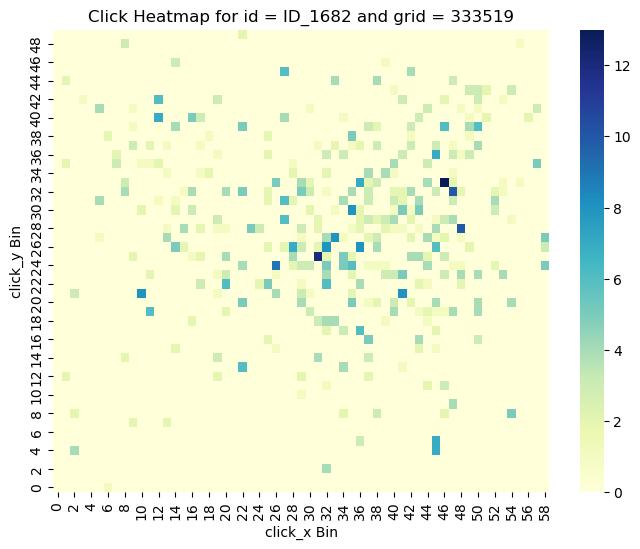

 Pct of broken domains according to prob method:  0.434
 Pct of broken domains according to both methods: 0.411
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1690
 p-value for chisquared test:  0.0
 log-prob for prob method:     0.0


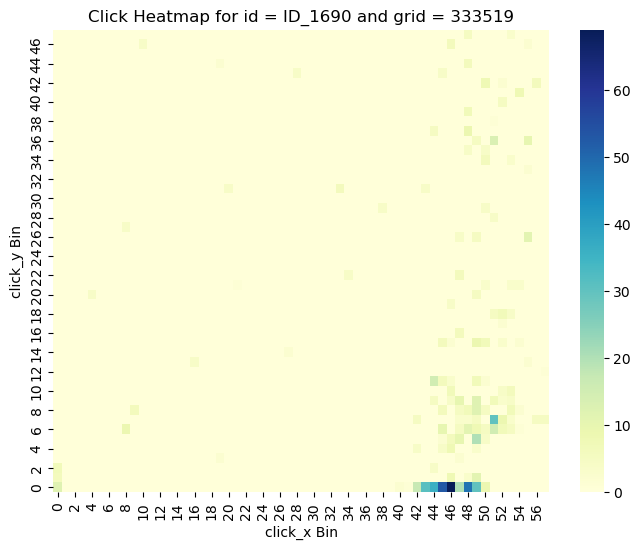

 Pct of broken domains according to prob method:  0.438
 Pct of broken domains according to both methods: 0.415
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1691
 p-value for chisquared test:  4.6424971403979595e-122
 log-prob for prob method:     1.380263576435424e-37


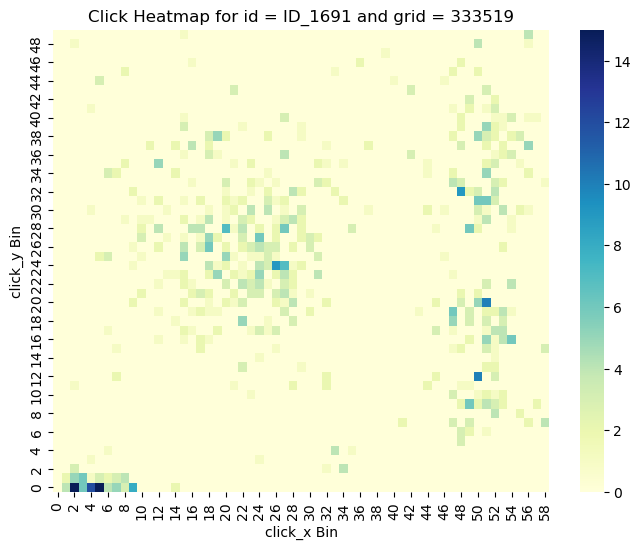

 Pct of broken domains according to prob method:  0.441
 Pct of broken domains according to both methods: 0.418
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1697
 p-value for chisquared test:  1.09146347836717e-310
 log-prob for prob method:     7.157696644791618e-227


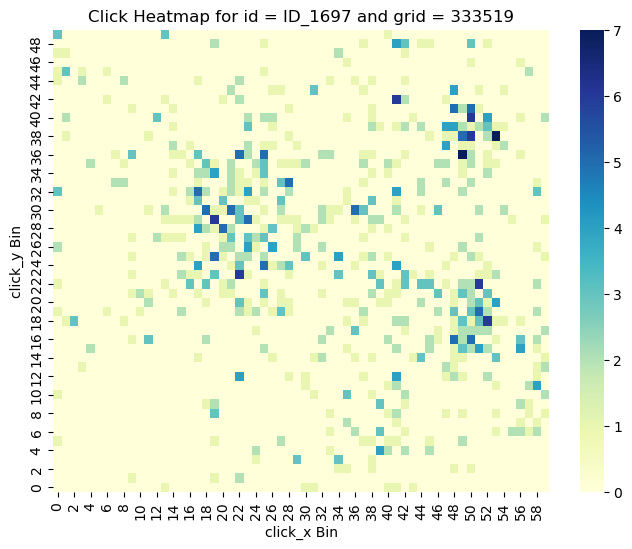

 Pct of broken domains according to prob method:  0.444
 Pct of broken domains according to both methods: 0.421
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.441
 Pct of broken domains according to both methods: 0.419
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.439
 Pct of broken domains according to both methods: 0.417
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1716
 p-value for chisquared test:  5.149661501813089e-41
 log-prob for prob method:     9.120758447795063e-107


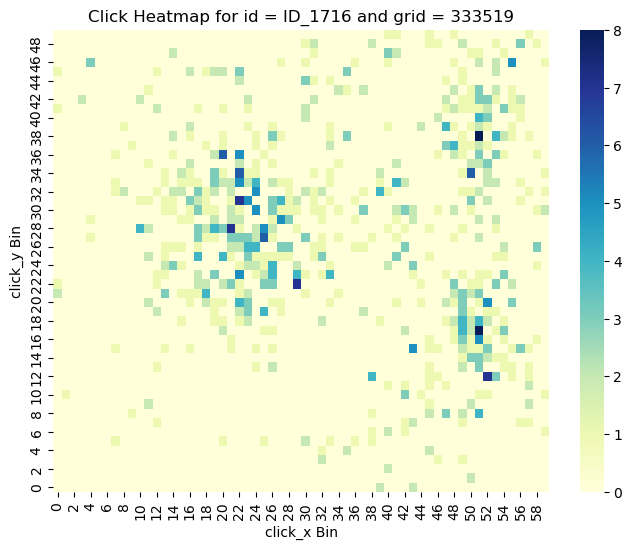

 Pct of broken domains according to prob method:  0.442
 Pct of broken domains according to both methods: 0.420
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1717
 p-value for chisquared test:  9.207508209462388e-133
 log-prob for prob method:     2.2706138530600843e-90


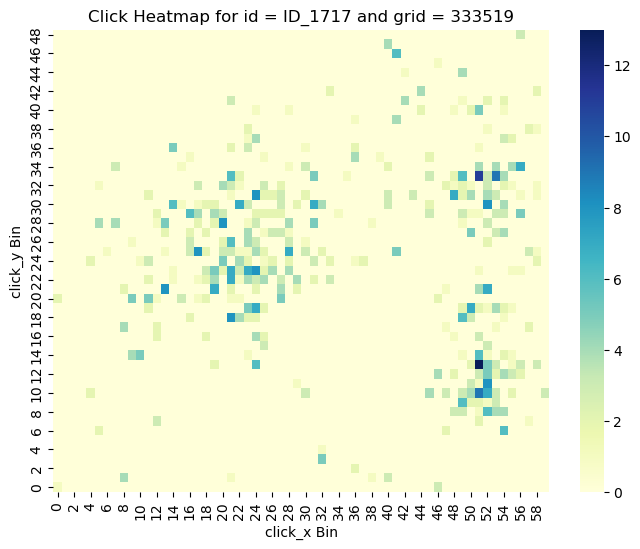

 Pct of broken domains according to prob method:  0.445
 Pct of broken domains according to both methods: 0.423
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.443
 Pct of broken domains according to both methods: 0.421
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.440
 Pct of broken domains according to both methods: 0.418
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1723
 p-value for chisquared test:  0.0
 log-prob for prob method:     8.182327879616991e-35


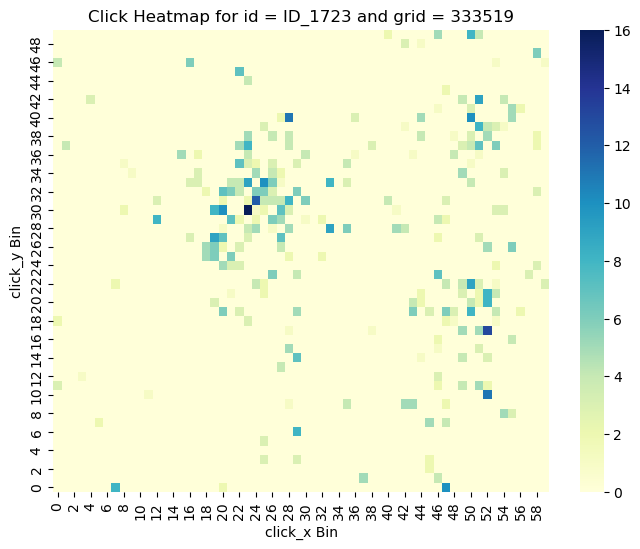

 Pct of broken domains according to prob method:  0.443
 Pct of broken domains according to both methods: 0.422
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.441
 Pct of broken domains according to both methods: 0.419
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.439
 Pct of broken domains according to both methods: 0.417
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.436
 Pct of broken domains according to both methods: 0.415
-----------------------------------------------------------
 grid id: 333519, domain id: ID_175
 p-value for chisquared test:  2.0029395037030078e-299
 log-prob for prob method:     3.002323277507321e-56


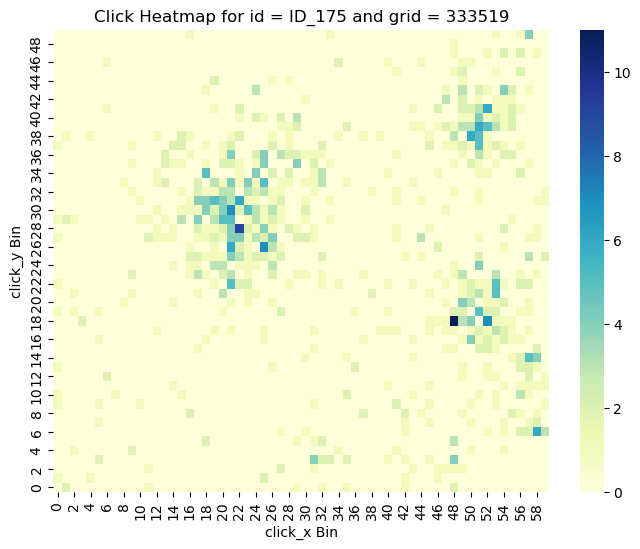

 Pct of broken domains according to prob method:  0.439
 Pct of broken domains according to both methods: 0.418
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1751
 p-value for chisquared test:  0.0
 log-prob for prob method:     9.657484270865044e-39


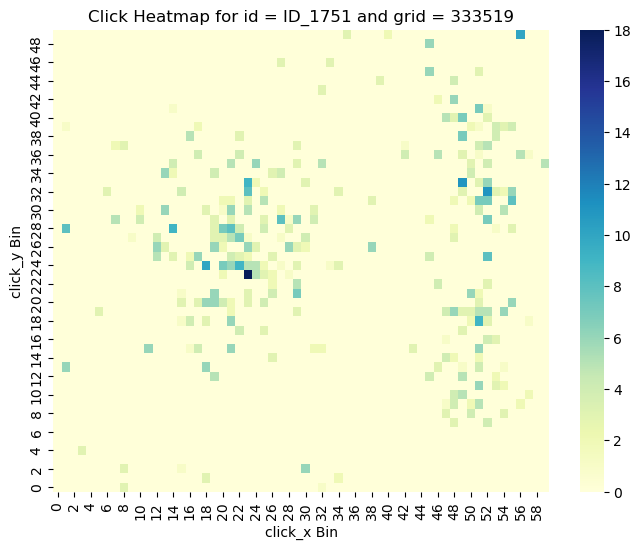

 Pct of broken domains according to prob method:  0.442
 Pct of broken domains according to both methods: 0.421
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.440
 Pct of broken domains according to both methods: 0.419
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.438
 Pct of broken domains according to both methods: 0.417
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.435
 Pct of broken domains according to both methods: 0.415
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.433
 Pct of broken domains according to both methods: 0.412
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1766
 p-value for chisquared test:  0.0
 log-prob for prob method:     9.52680399964213e-144


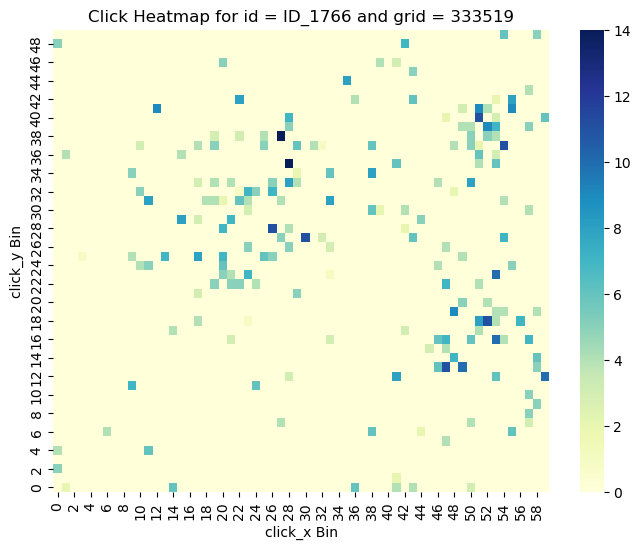

 Pct of broken domains according to prob method:  0.436
 Pct of broken domains according to both methods: 0.415
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.434
 Pct of broken domains according to both methods: 0.413
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.431
 Pct of broken domains according to both methods: 0.411
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.429
 Pct of broken domains according to both methods: 0.409
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.427
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1781
 p-value for chisquared test:  8.733864842038636e-85
 log-prob for prob method:     4.208937363352814e-

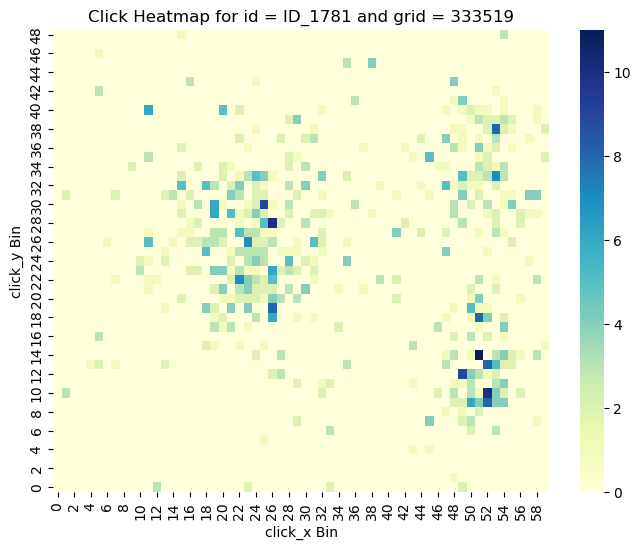

 Pct of broken domains according to prob method:  0.430
 Pct of broken domains according to both methods: 0.410
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1784
 p-value for chisquared test:  3.183023619356657e-143
 log-prob for prob method:     3.4040282979822785e-12


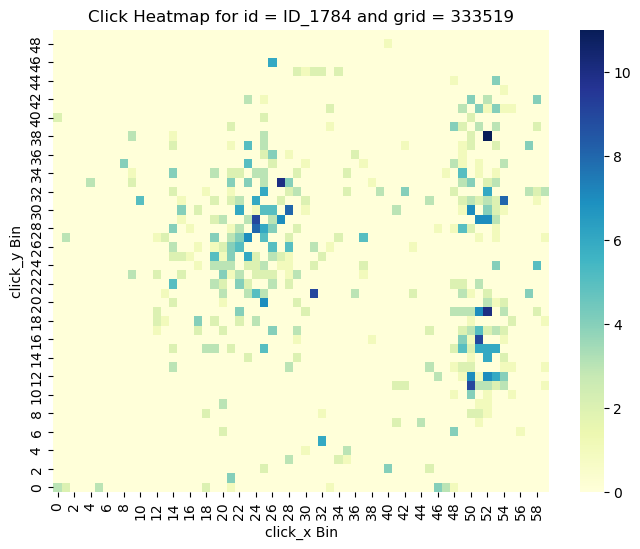

 Pct of broken domains according to prob method:  0.433
 Pct of broken domains according to both methods: 0.413
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.431
 Pct of broken domains according to both methods: 0.411
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.429
 Pct of broken domains according to both methods: 0.409
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1791
 p-value for chisquared test:  0.0
 log-prob for prob method:     9.733071280786255e-46


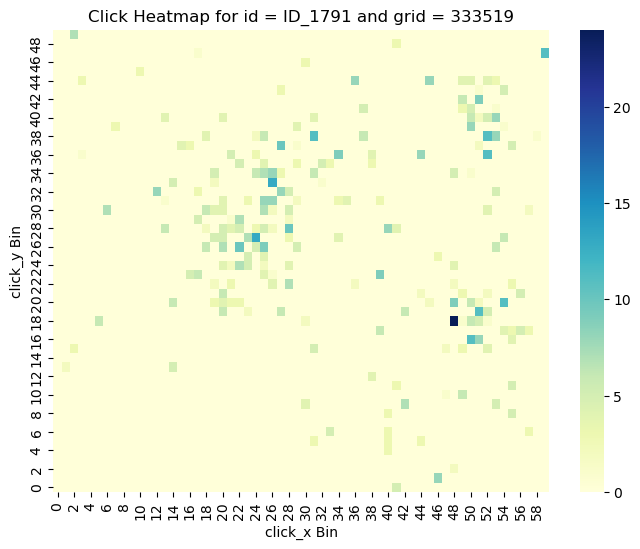

 Pct of broken domains according to prob method:  0.431
 Pct of broken domains according to both methods: 0.412
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.429
 Pct of broken domains according to both methods: 0.410
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.427
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1805
 p-value for chisquared test:  0.0
 log-prob for prob method:     3.829206771169738e-70


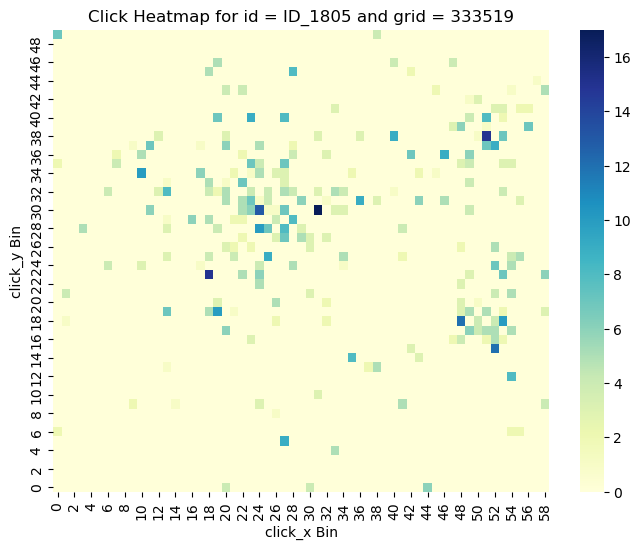

 Pct of broken domains according to prob method:  0.430
 Pct of broken domains according to both methods: 0.411
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.428
 Pct of broken domains according to both methods: 0.409
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1813
 p-value for chisquared test:  5.144256563470958e-193
 log-prob for prob method:     5.647856723626534e-101


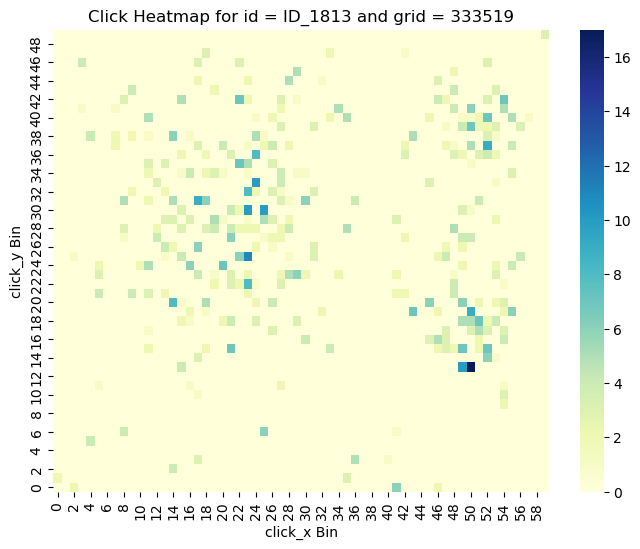

 Pct of broken domains according to prob method:  0.431
 Pct of broken domains according to both methods: 0.411
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.429
 Pct of broken domains according to both methods: 0.410
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.427
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1824
 p-value for chisquared test:  0.0
 log-prob for prob method:     0.0


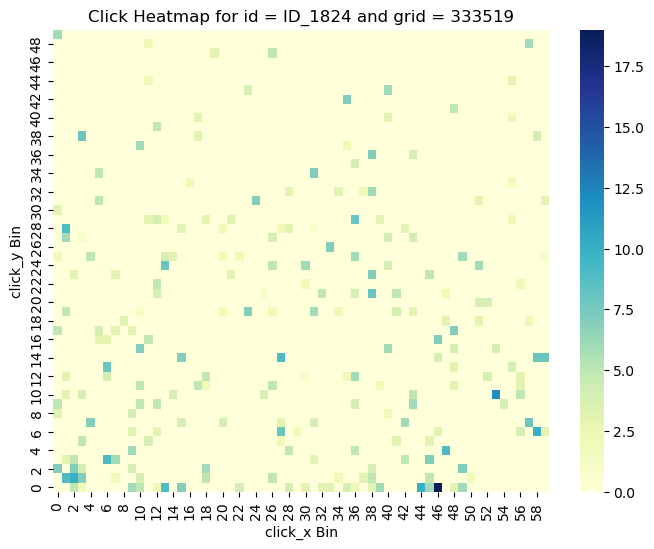

 Pct of broken domains according to prob method:  0.429
 Pct of broken domains according to both methods: 0.410
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1825
 p-value for chisquared test:  1.356308154357962e-23
 log-prob for prob method:     1.4605781736311812e-17


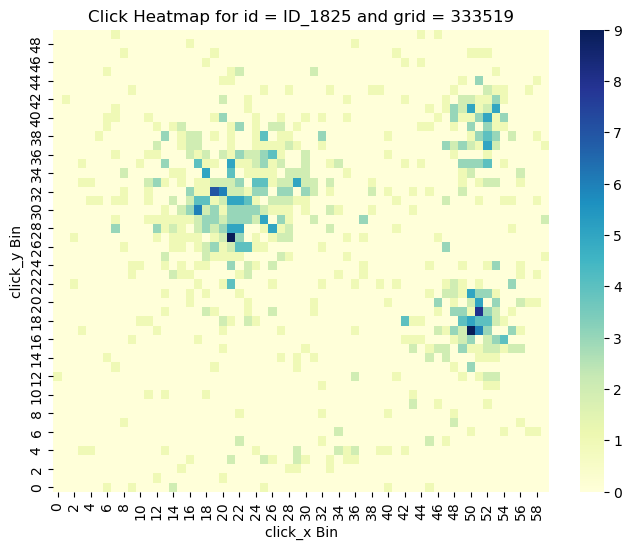

 Pct of broken domains according to prob method:  0.432
 Pct of broken domains according to both methods: 0.413
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.430
 Pct of broken domains according to both methods: 0.411
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.428
 Pct of broken domains according to both methods: 0.409
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.426
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.424
 Pct of broken domains according to both methods: 0.406
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1845
 p-value for chisquared test:  3.1974979527010867e-223
 log-prob for prob method:     2.520704904890968

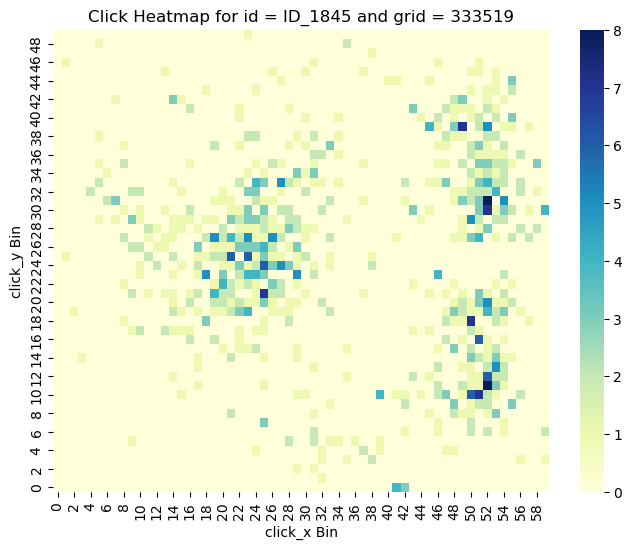

 Pct of broken domains according to prob method:  0.427
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.425
 Pct of broken domains according to both methods: 0.406
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.423
 Pct of broken domains according to both methods: 0.405
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.421
 Pct of broken domains according to both methods: 0.403
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.419
 Pct of broken domains according to both methods: 0.401
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.417
 Pct of broken domains according to both methods: 0.399
----------------------------

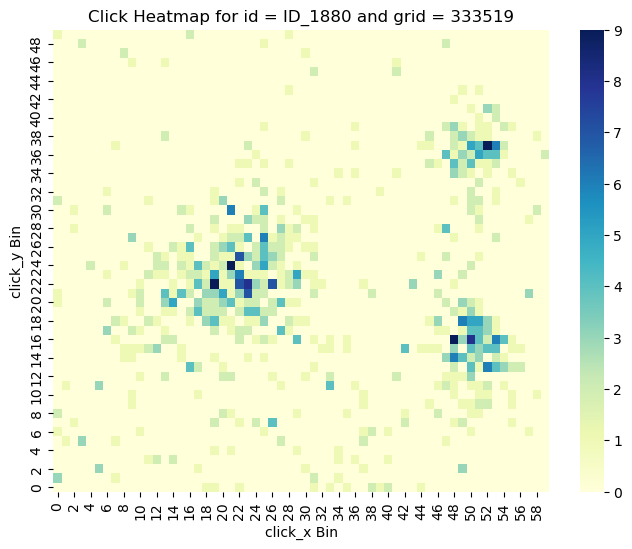

 Pct of broken domains according to prob method:  0.416
 Pct of broken domains according to both methods: 0.398
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.396
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.412
 Pct of broken domains according to both methods: 0.395
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1886
 p-value for chisquared test:  1.1187116243844818e-68
 log-prob for prob method:     7.845667248796153e-19


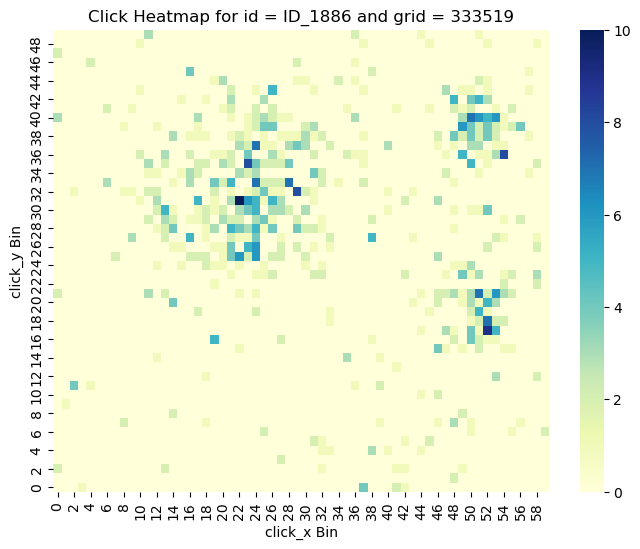

 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.397
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1888
 p-value for chisquared test:  0.0
 log-prob for prob method:     0.0


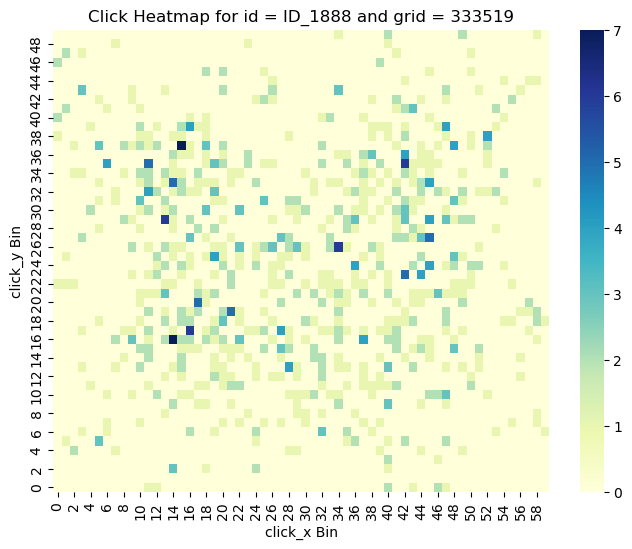

 Pct of broken domains according to prob method:  0.417
 Pct of broken domains according to both methods: 0.400
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.416
 Pct of broken domains according to both methods: 0.398
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1893
 p-value for chisquared test:  1.0733631203200629e-200
 log-prob for prob method:     2.1882354349482995e-60


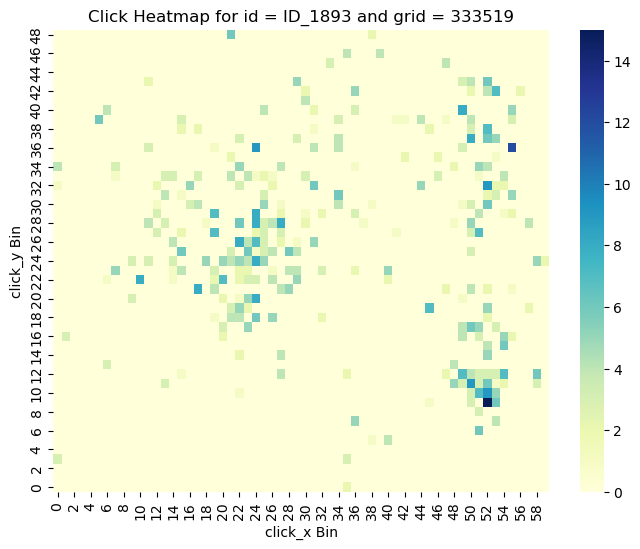

 Pct of broken domains according to prob method:  0.418
 Pct of broken domains according to both methods: 0.401
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1894
 p-value for chisquared test:  0.0
 log-prob for prob method:     4.5272755643517146e-179


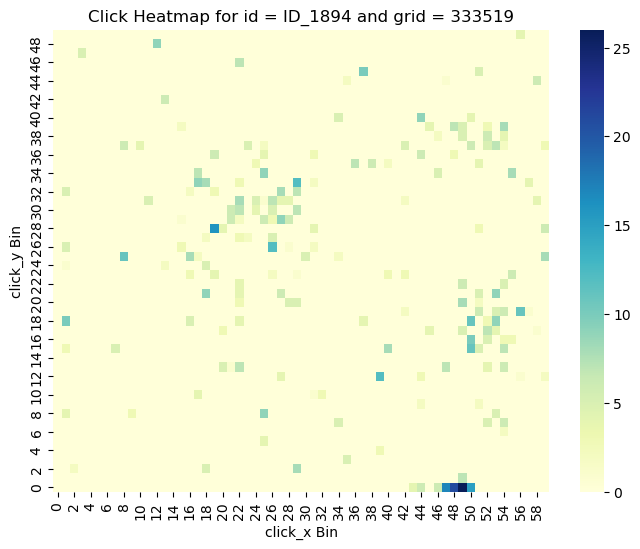

 Pct of broken domains according to prob method:  0.421
 Pct of broken domains according to both methods: 0.403
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.419
 Pct of broken domains according to both methods: 0.402
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.417
 Pct of broken domains according to both methods: 0.400
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.398
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.397
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.412
 Pct of broken domains according to both methods: 0.395
----------------------------

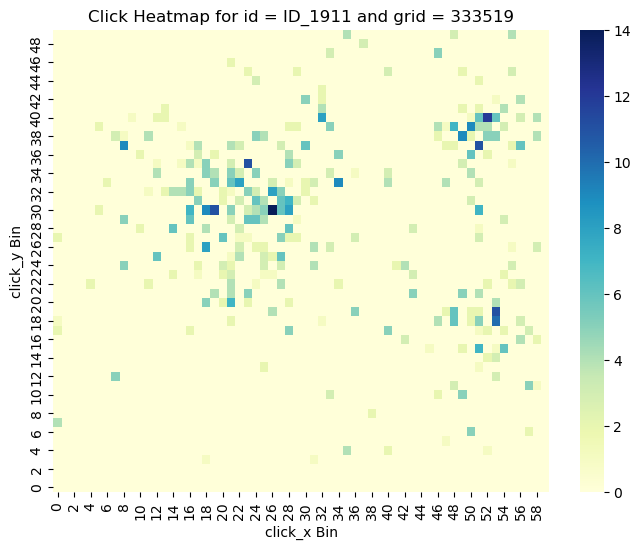

 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.397
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1914
 p-value for chisquared test:  7.03759308619518e-190
 log-prob for prob method:     2.0535075260036852e-23


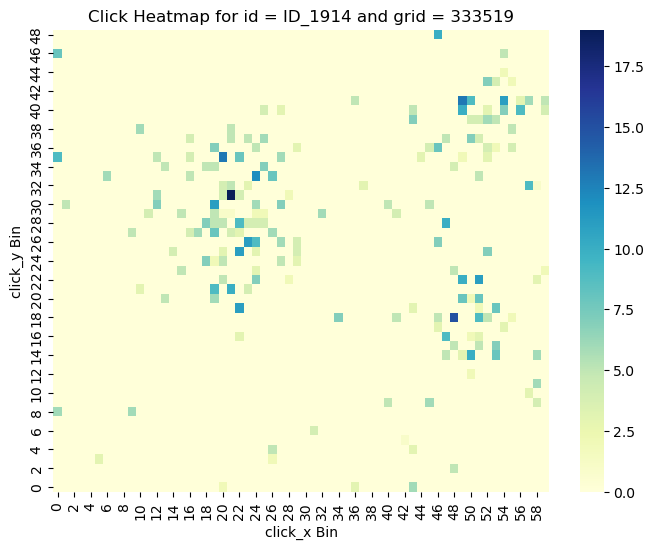

 Pct of broken domains according to prob method:  0.417
 Pct of broken domains according to both methods: 0.400
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.398
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.413
 Pct of broken domains according to both methods: 0.397
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.412
 Pct of broken domains according to both methods: 0.395
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.410
 Pct of broken domains according to both methods: 0.393
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1929
 p-value for chisquared test:  0.0
 log-prob for prob method:     0.0


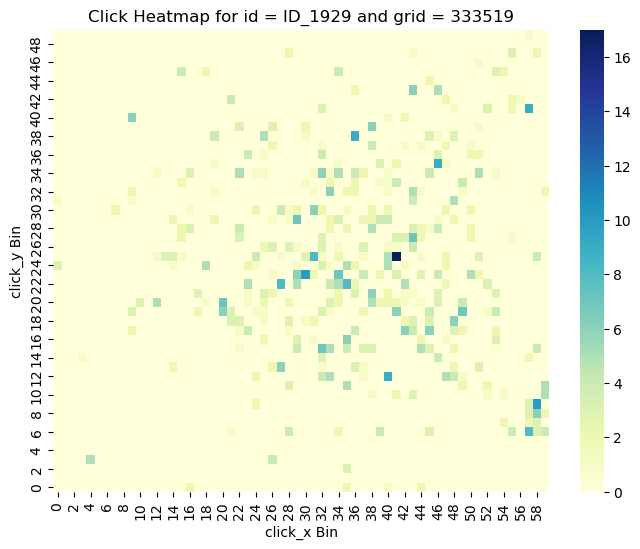

 Pct of broken domains according to prob method:  0.412
 Pct of broken domains according to both methods: 0.396
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.411
 Pct of broken domains according to both methods: 0.394
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.409
 Pct of broken domains according to both methods: 0.393
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.407
 Pct of broken domains according to both methods: 0.391
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.406
 Pct of broken domains according to both methods: 0.390
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.404
 Pct of broken domains according to both methods: 0.388
----------------------------

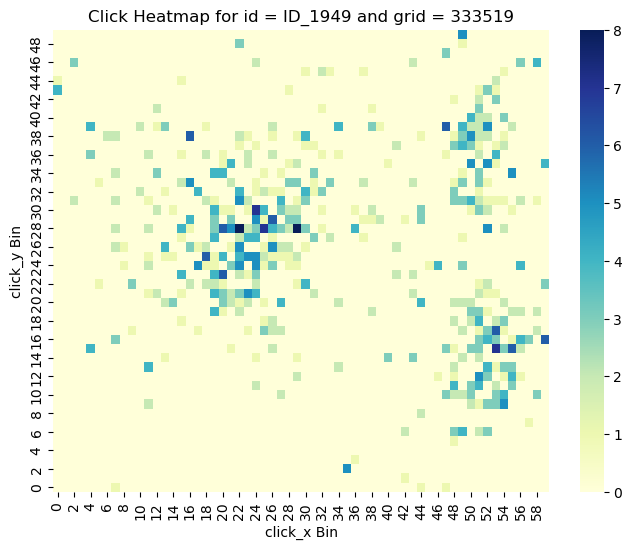

 Pct of broken domains according to prob method:  0.405
 Pct of broken domains according to both methods: 0.389
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.403
 Pct of broken domains according to both methods: 0.387
-----------------------------------------------------------
 grid id: 333519, domain id: ID_1964
 p-value for chisquared test:  9.478459693707819e-252
 log-prob for prob method:     1.0140862721425009e-58


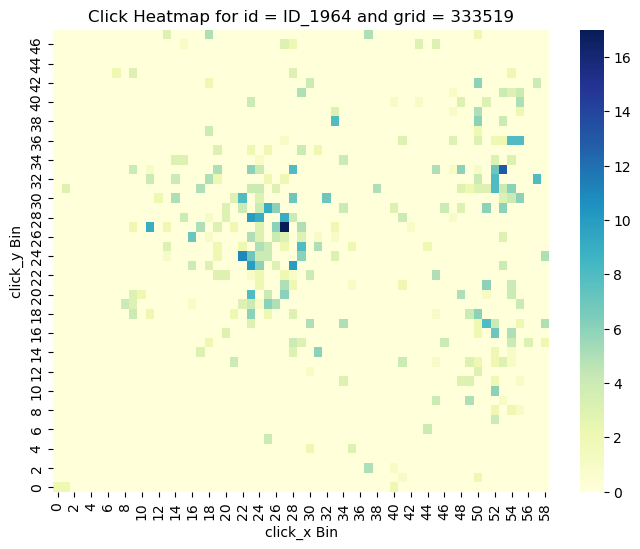

 Pct of broken domains according to prob method:  0.406
 Pct of broken domains according to both methods: 0.390
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.404
 Pct of broken domains according to both methods: 0.388
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.402
 Pct of broken domains according to both methods: 0.387
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.401
 Pct of broken domains according to both methods: 0.385
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.399
 Pct of broken domains according to both methods: 0.384
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.398
 Pct of broken domains according to both methods: 0.382
----------------------------

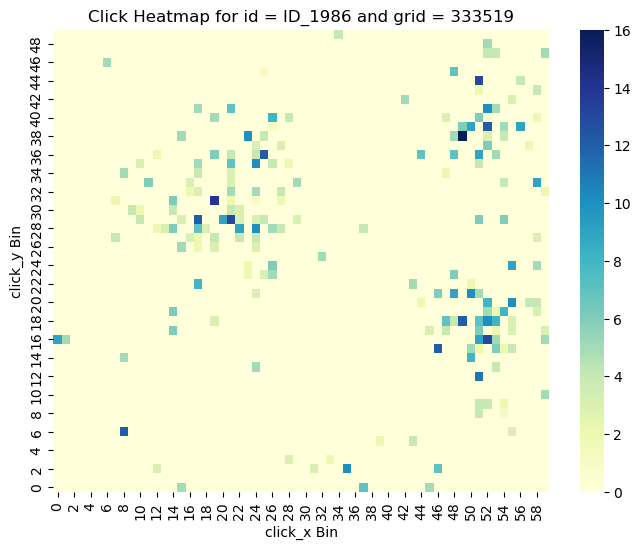

 Pct of broken domains according to prob method:  0.397
 Pct of broken domains according to both methods: 0.382
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.395
 Pct of broken domains according to both methods: 0.380
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.394
 Pct of broken domains according to both methods: 0.379
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.392
 Pct of broken domains according to both methods: 0.377
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.391
 Pct of broken domains according to both methods: 0.376
-----------------------------------------------------------
 grid id: 333519, domain id: ID_201
 p-value for chisquared test:  0.0
 log-prob for prob method:     3.89351274814763e-13


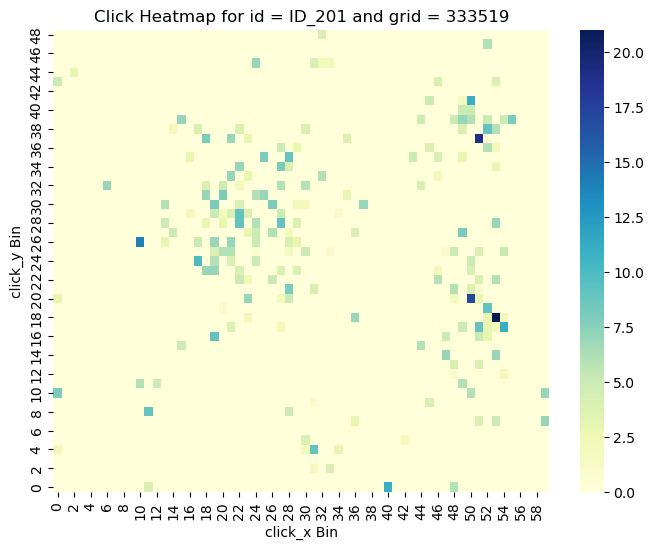

 Pct of broken domains according to prob method:  0.393
 Pct of broken domains according to both methods: 0.378
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2018
 p-value for chisquared test:  1.0317296776694308e-31
 log-prob for prob method:     1.3541880266258739e-22


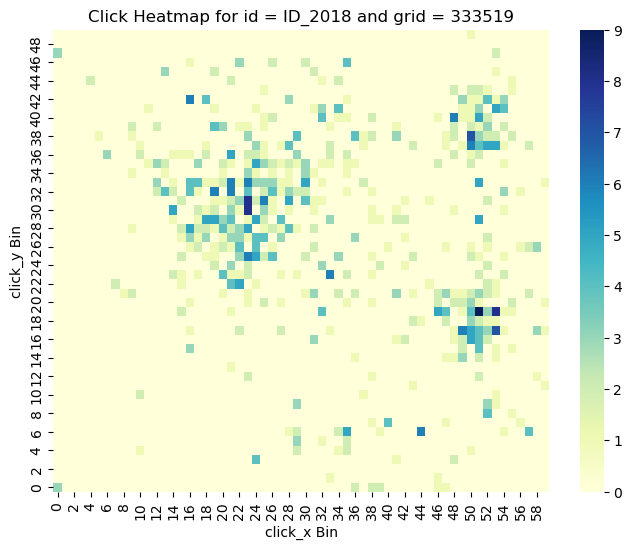

 Pct of broken domains according to prob method:  0.396
 Pct of broken domains according to both methods: 0.381
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.394
 Pct of broken domains according to both methods: 0.379
-----------------------------------------------------------
 grid id: 333519, domain id: ID_202
 p-value for chisquared test:  7.195032206777235e-19
 log-prob for prob method:     1.5696245089620052e-28


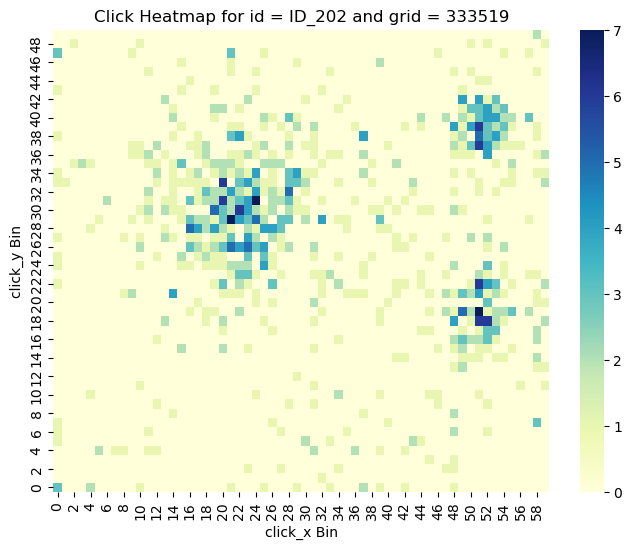

 Pct of broken domains according to prob method:  0.396
 Pct of broken domains according to both methods: 0.381
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2020
 p-value for chisquared test:  0.0
 log-prob for prob method:     5.226297181607626e-193


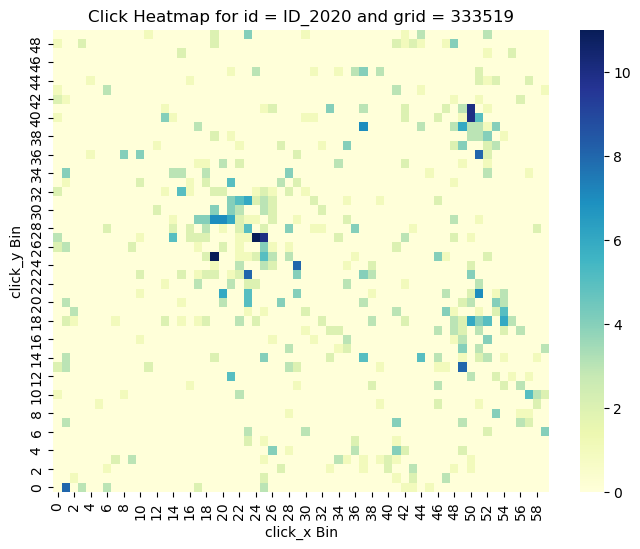

 Pct of broken domains according to prob method:  0.399
 Pct of broken domains according to both methods: 0.384
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.397
 Pct of broken domains according to both methods: 0.382
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.396
 Pct of broken domains according to both methods: 0.381
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.394
 Pct of broken domains according to both methods: 0.380
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.393
 Pct of broken domains according to both methods: 0.378
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.391
 Pct of broken domains according to both methods: 0.377
----------------------------

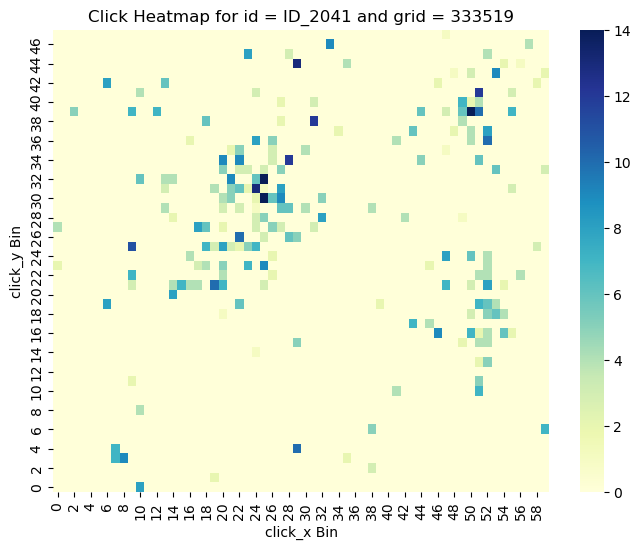

 Pct of broken domains according to prob method:  0.388
 Pct of broken domains according to both methods: 0.374
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2046
 p-value for chisquared test:  6.596978778722542e-268
 log-prob for prob method:     4.9034787486078455e-53


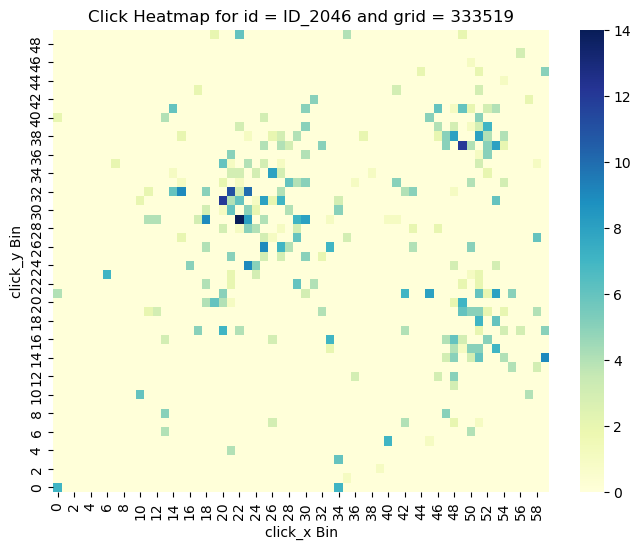

 Pct of broken domains according to prob method:  0.390
 Pct of broken domains according to both methods: 0.376
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2048
 p-value for chisquared test:  1.9947771722011892e-33
 log-prob for prob method:     3.442791351617795e-27


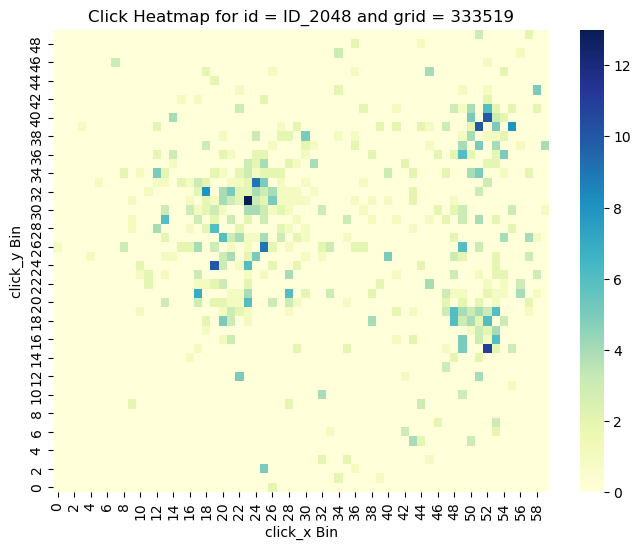

 Pct of broken domains according to prob method:  0.392
 Pct of broken domains according to both methods: 0.378
-----------------------------------------------------------
 grid id: 333519, domain id: ID_206
 p-value for chisquared test:  0.0
 log-prob for prob method:     1.5138924427492846e-70


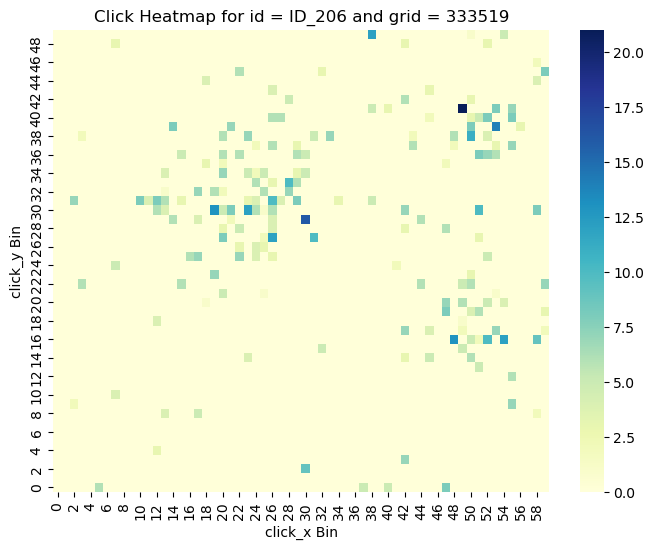

 Pct of broken domains according to prob method:  0.394
 Pct of broken domains according to both methods: 0.380
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.393
 Pct of broken domains according to both methods: 0.379
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.392
 Pct of broken domains according to both methods: 0.378
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.390
 Pct of broken domains according to both methods: 0.376
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2076
 p-value for chisquared test:  0.0
 log-prob for prob method:     0.0


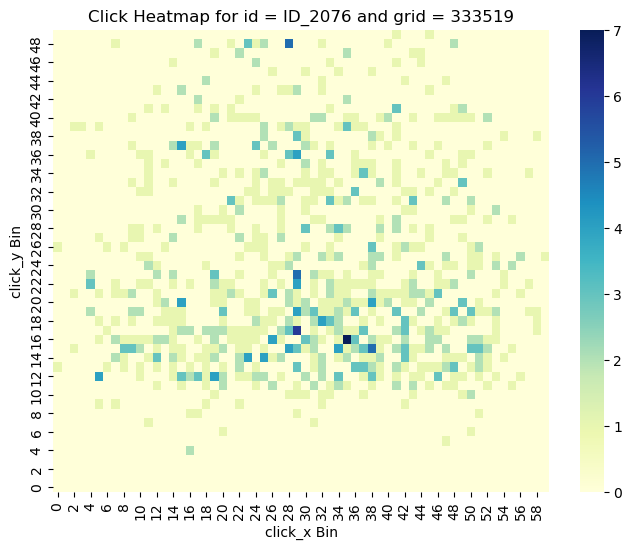

 Pct of broken domains according to prob method:  0.392
 Pct of broken domains according to both methods: 0.378
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2081
 p-value for chisquared test:  0.0
 log-prob for prob method:     1.3596028353846089e-39


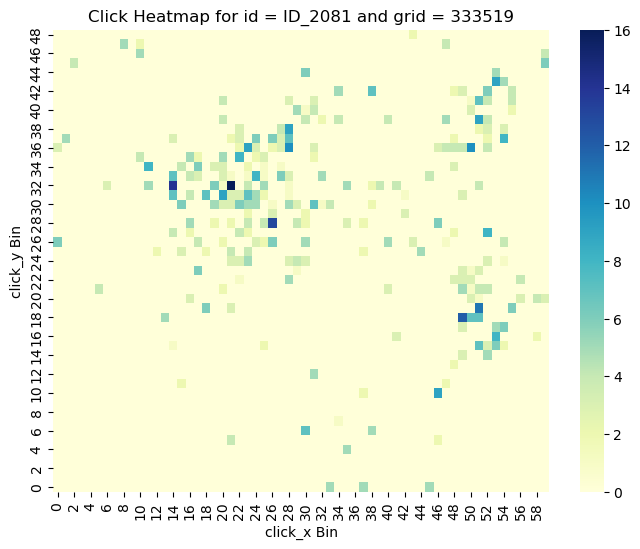

 Pct of broken domains according to prob method:  0.394
 Pct of broken domains according to both methods: 0.381
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2093
 p-value for chisquared test:  3.151667747402597e-194
 log-prob for prob method:     1.8952137555943737e-80


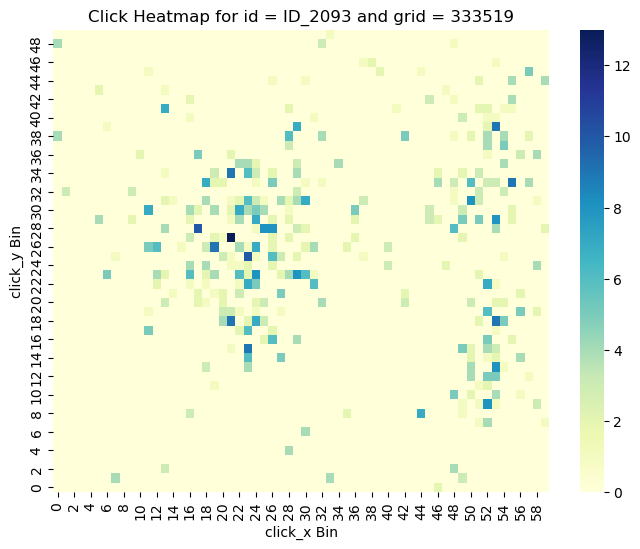

 Pct of broken domains according to prob method:  0.397
 Pct of broken domains according to both methods: 0.383
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2097
 p-value for chisquared test:  0.0
 log-prob for prob method:     0.0


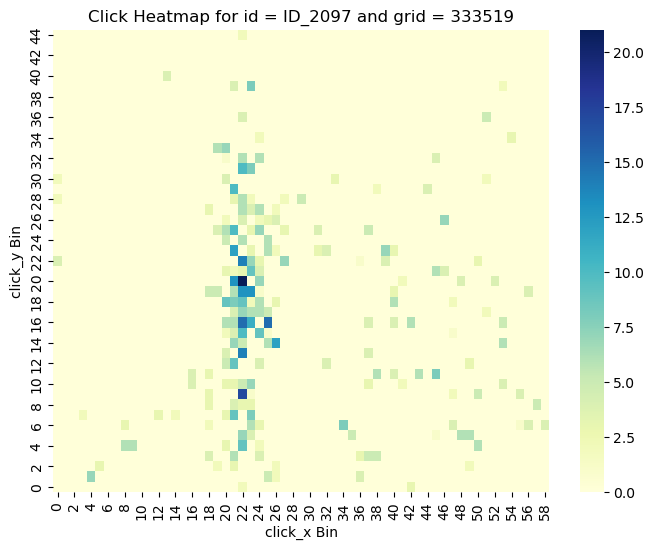

 Pct of broken domains according to prob method:  0.399
 Pct of broken domains according to both methods: 0.385
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2100
 p-value for chisquared test:  0.0
 log-prob for prob method:     3.2054106334924734e-31


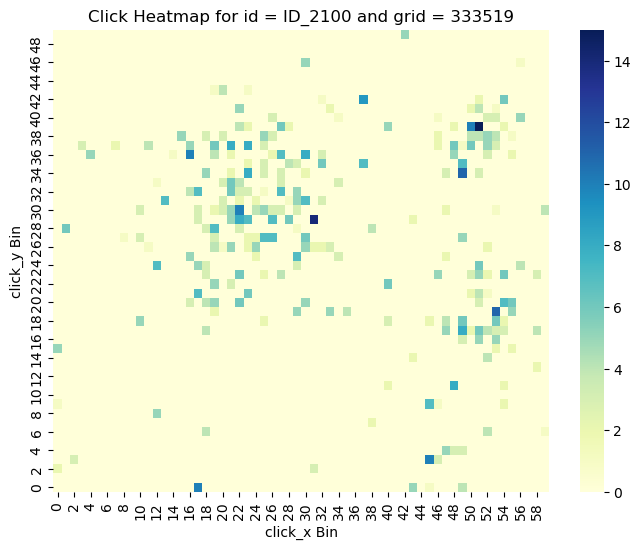

 Pct of broken domains according to prob method:  0.401
 Pct of broken domains according to both methods: 0.387
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.399
 Pct of broken domains according to both methods: 0.386
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2102
 p-value for chisquared test:  1.7226573922131403e-50
 log-prob for prob method:     1.3258197258996525e-17


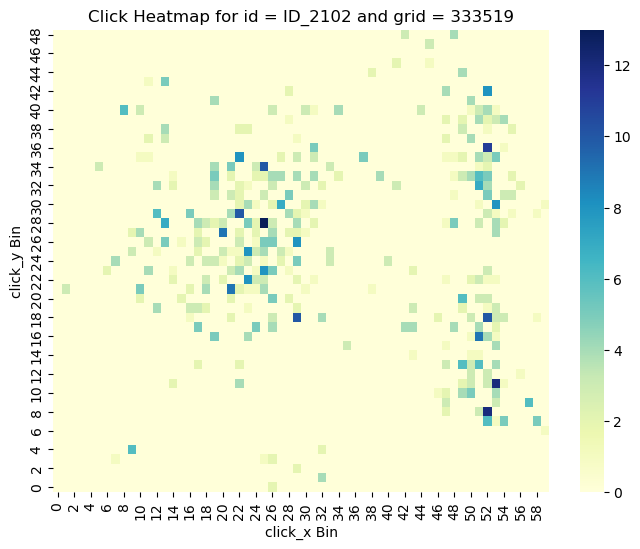

 Pct of broken domains according to prob method:  0.401
 Pct of broken domains according to both methods: 0.388
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.400
 Pct of broken domains according to both methods: 0.386
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.399
 Pct of broken domains according to both methods: 0.385
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.397
 Pct of broken domains according to both methods: 0.384
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.396
 Pct of broken domains according to both methods: 0.383
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.395
 Pct of broken domains according to both methods: 0.381
----------------------------

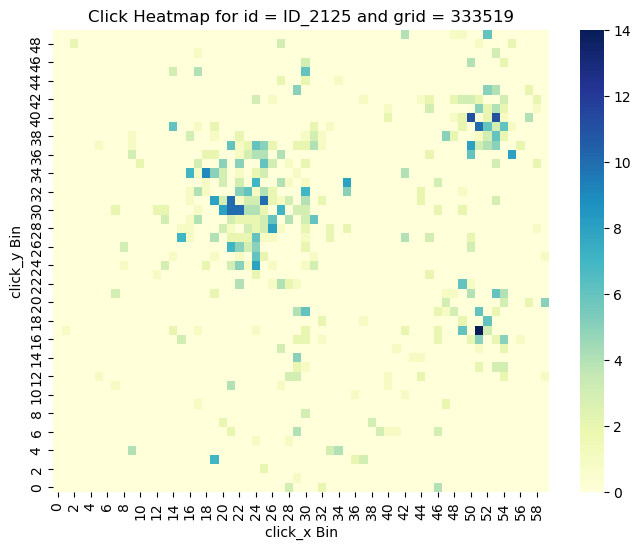

 Pct of broken domains according to prob method:  0.395
 Pct of broken domains according to both methods: 0.382
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2127
 p-value for chisquared test:  1.4208345189193257e-301
 log-prob for prob method:     1.3684295415456294e-71


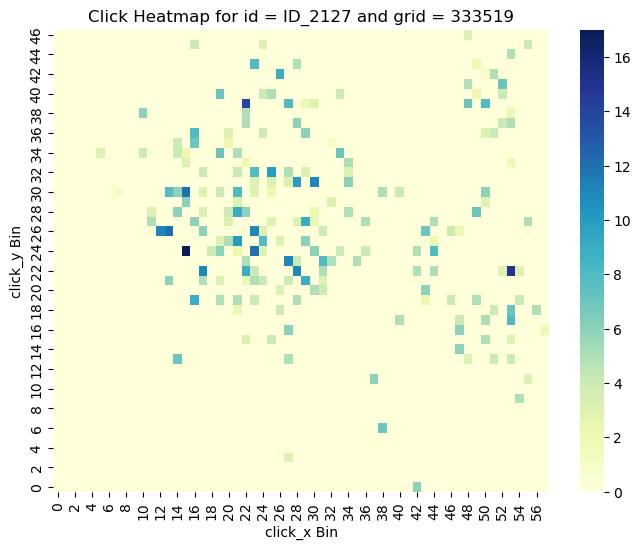

 Pct of broken domains according to prob method:  0.397
 Pct of broken domains according to both methods: 0.384
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.396
 Pct of broken domains according to both methods: 0.383
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.395
 Pct of broken domains according to both methods: 0.382
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2134
 p-value for chisquared test:  0.0
 log-prob for prob method:     1.5334593963317638e-30


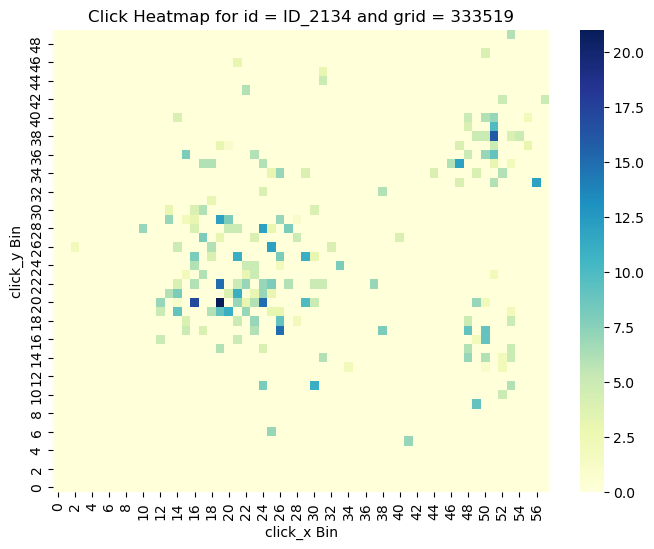

 Pct of broken domains according to prob method:  0.397
 Pct of broken domains according to both methods: 0.384
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.395
 Pct of broken domains according to both methods: 0.382
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2147
 p-value for chisquared test:  0.0
 log-prob for prob method:     1.141805435014481e-86


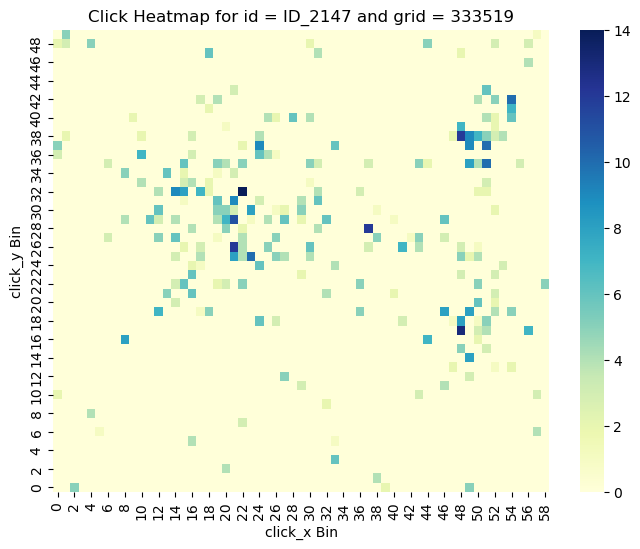

 Pct of broken domains according to prob method:  0.397
 Pct of broken domains according to both methods: 0.384
-----------------------------------------------------------
 grid id: 333519, domain id: ID_215
 p-value for chisquared test:  0.0
 log-prob for prob method:     1.8332641067004435e-46


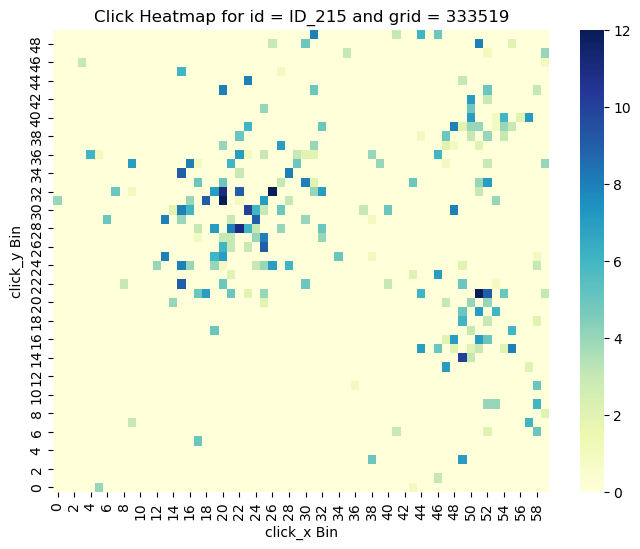

 Pct of broken domains according to prob method:  0.399
 Pct of broken domains according to both methods: 0.386
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.398
 Pct of broken domains according to both methods: 0.385
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.397
 Pct of broken domains according to both methods: 0.384
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.395
 Pct of broken domains according to both methods: 0.383
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2175
 p-value for chisquared test:  2.674750439811332e-81
 log-prob for prob method:     3.668005477171327e-08


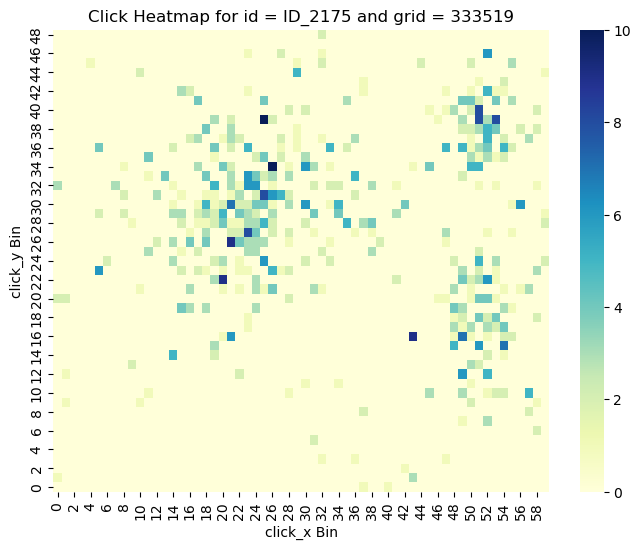

 Pct of broken domains according to prob method:  0.397
 Pct of broken domains according to both methods: 0.385
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.396
 Pct of broken domains according to both methods: 0.383
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2177
 p-value for chisquared test:  2.5496096456200436e-19
 log-prob for prob method:     2.1568553462604565e-08


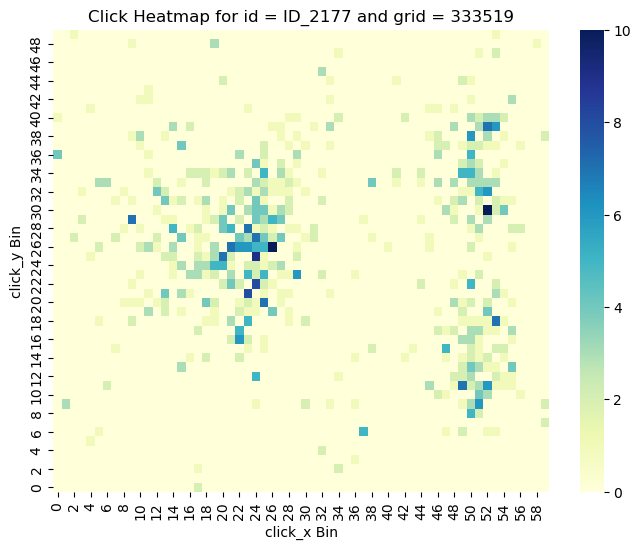

 Pct of broken domains according to prob method:  0.398
 Pct of broken domains according to both methods: 0.385
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2180
 p-value for chisquared test:  4.086654072725245e-158
 log-prob for prob method:     2.2105959378478037e-86


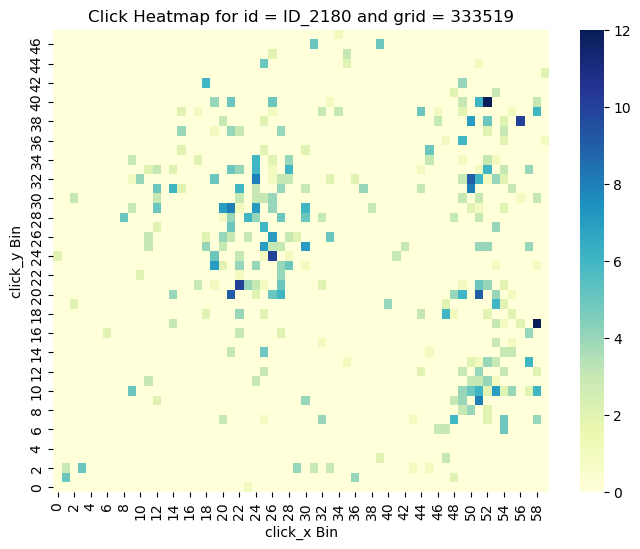

 Pct of broken domains according to prob method:  0.400
 Pct of broken domains according to both methods: 0.387
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2186
 p-value for chisquared test:  0.0
 log-prob for prob method:     1.171630611316976e-32


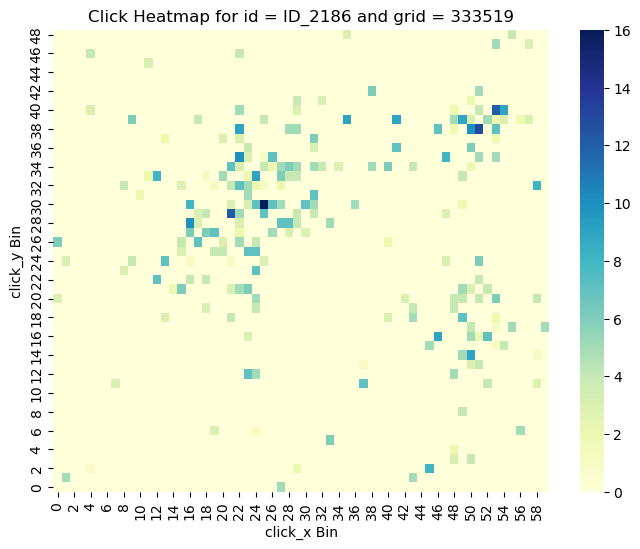

 Pct of broken domains according to prob method:  0.402
 Pct of broken domains according to both methods: 0.389
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.401
 Pct of broken domains according to both methods: 0.388
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2191
 p-value for chisquared test:  0.0
 log-prob for prob method:     7.330872226284792e-57


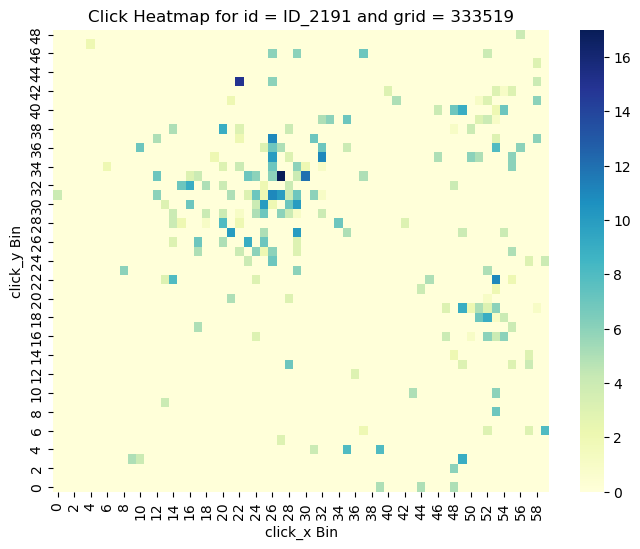

 Pct of broken domains according to prob method:  0.403
 Pct of broken domains according to both methods: 0.390
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.401
 Pct of broken domains according to both methods: 0.389
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2196
 p-value for chisquared test:  4.67402153791519e-17
 log-prob for prob method:     2.2513694354153103e-18


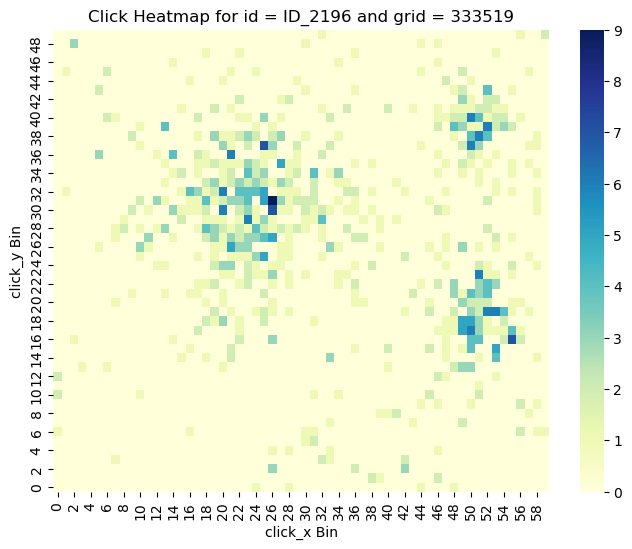

 Pct of broken domains according to prob method:  0.403
 Pct of broken domains according to both methods: 0.391
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2198
 p-value for chisquared test:  0.0
 log-prob for prob method:     1.1919910884895354e-287


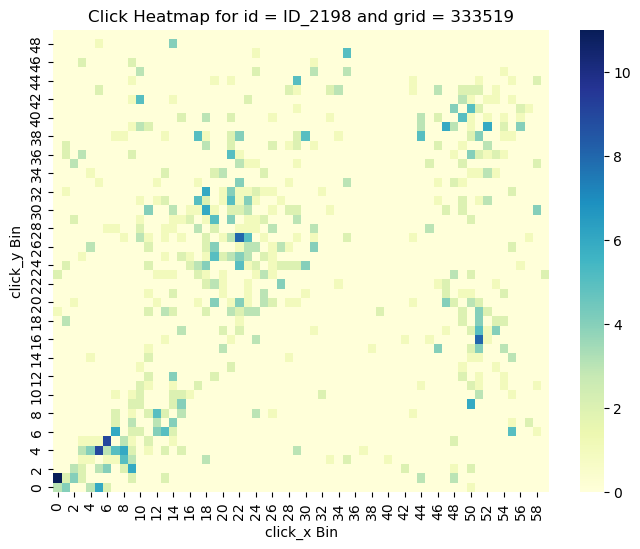

 Pct of broken domains according to prob method:  0.405
 Pct of broken domains according to both methods: 0.393
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.404
 Pct of broken domains according to both methods: 0.391
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.402
 Pct of broken domains according to both methods: 0.390
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2214
 p-value for chisquared test:  0.0
 log-prob for prob method:     3.1328883525865783e-166


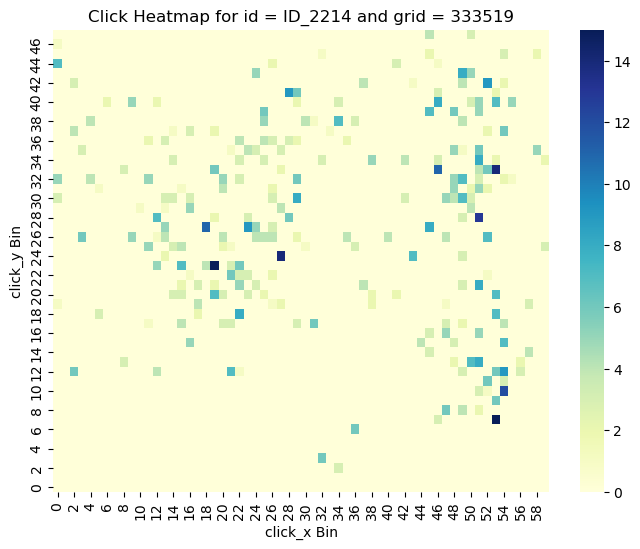

 Pct of broken domains according to prob method:  0.404
 Pct of broken domains according to both methods: 0.392
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.403
 Pct of broken domains according to both methods: 0.391
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.402
 Pct of broken domains according to both methods: 0.390
-----------------------------------------------------------
 grid id: 333519, domain id: ID_222
 p-value for chisquared test:  9.336178864974019e-244
 log-prob for prob method:     7.523603989690057e-105


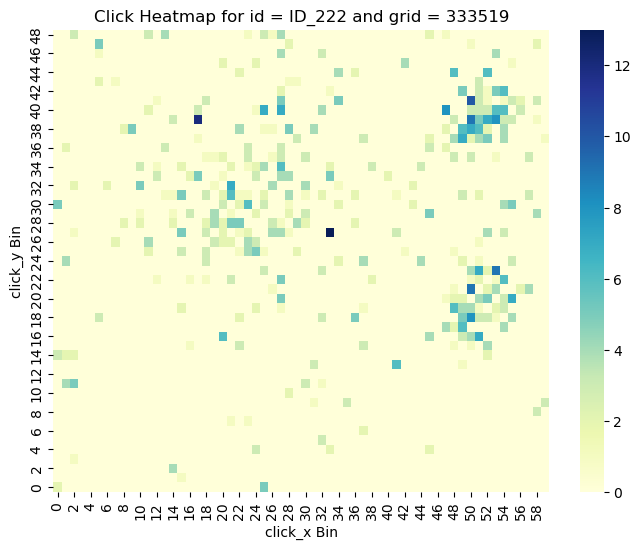

 Pct of broken domains according to prob method:  0.404
 Pct of broken domains according to both methods: 0.391
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2224
 p-value for chisquared test:  1.3468490628587826e-161
 log-prob for prob method:     3.6790850463392406e-33


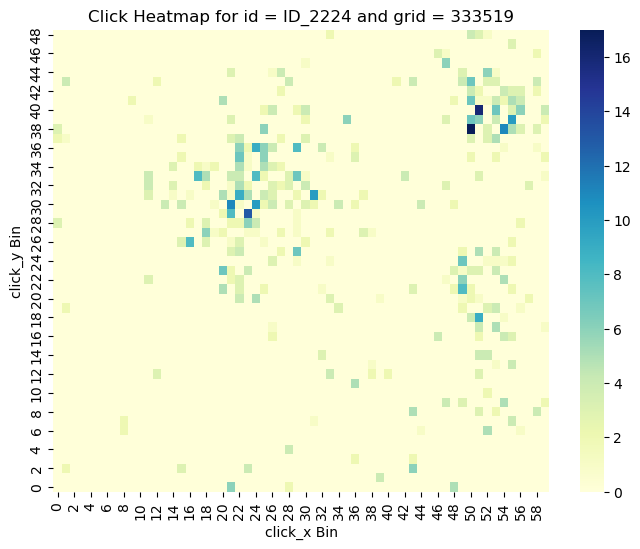

 Pct of broken domains according to prob method:  0.405
 Pct of broken domains according to both methods: 0.393
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.404
 Pct of broken domains according to both methods: 0.392
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2226
 p-value for chisquared test:  0.0
 log-prob for prob method:     0.0


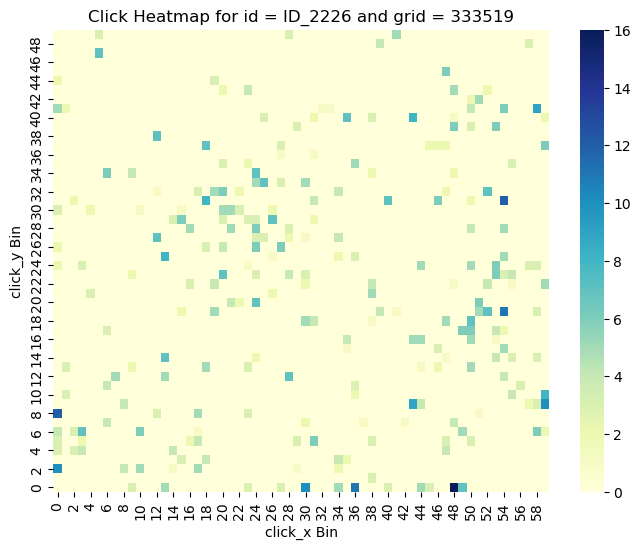

 Pct of broken domains according to prob method:  0.406
 Pct of broken domains according to both methods: 0.394
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.405
 Pct of broken domains according to both methods: 0.393
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.404
 Pct of broken domains according to both methods: 0.392
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2237
 p-value for chisquared test:  2.703226651580379e-149
 log-prob for prob method:     3.1854982330803815e-88


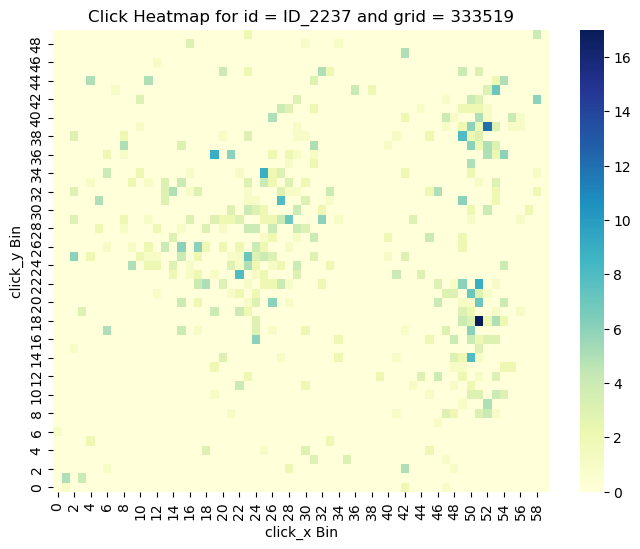

 Pct of broken domains according to prob method:  0.405
 Pct of broken domains according to both methods: 0.393
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.404
 Pct of broken domains according to both methods: 0.392
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.403
 Pct of broken domains according to both methods: 0.391
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.402
 Pct of broken domains according to both methods: 0.390
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2249
 p-value for chisquared test:  0.0
 log-prob for prob method:     1.9698239819747234e-256


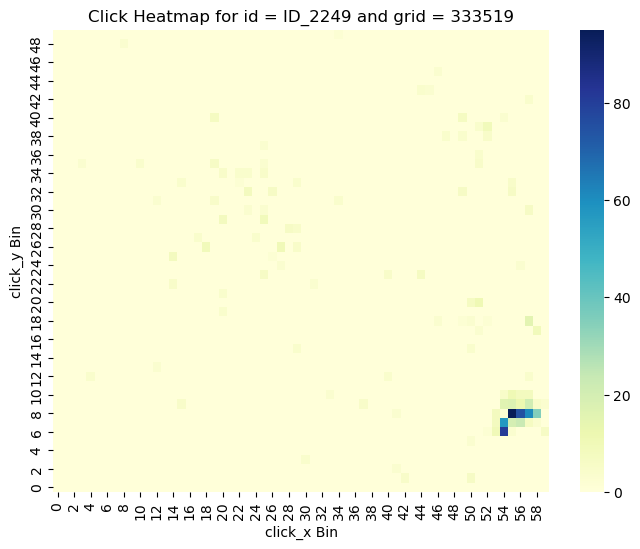

 Pct of broken domains according to prob method:  0.404
 Pct of broken domains according to both methods: 0.392
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2251
 p-value for chisquared test:  2.290471658547821e-172
 log-prob for prob method:     9.499123944787791e-68


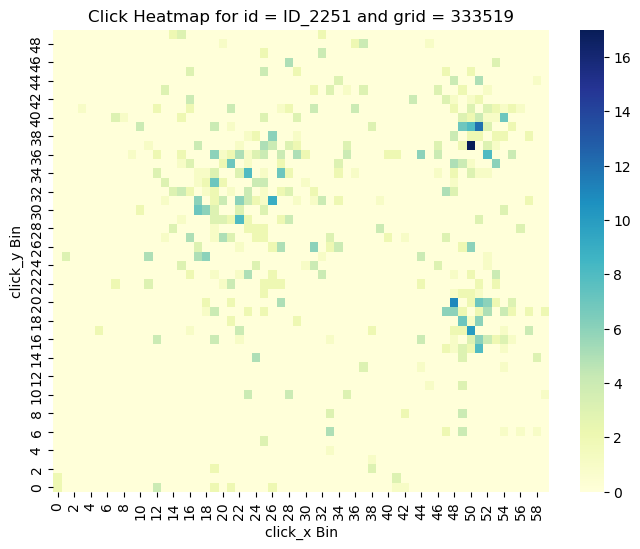

 Pct of broken domains according to prob method:  0.405
 Pct of broken domains according to both methods: 0.393
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.404
 Pct of broken domains according to both methods: 0.392
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2256
 p-value for chisquared test:  1.3555313100295205e-37
 log-prob for prob method:     7.131906139221181e-14


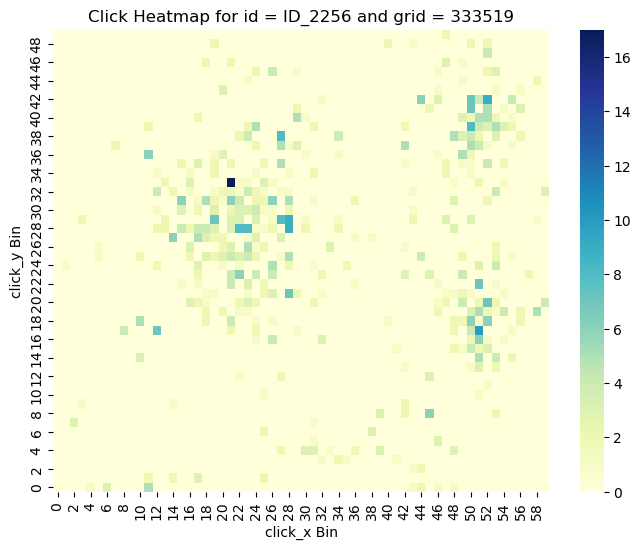

 Pct of broken domains according to prob method:  0.406
 Pct of broken domains according to both methods: 0.394
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2257
 p-value for chisquared test:  1.5453327556565702e-47
 log-prob for prob method:     3.0964594099471884e-46


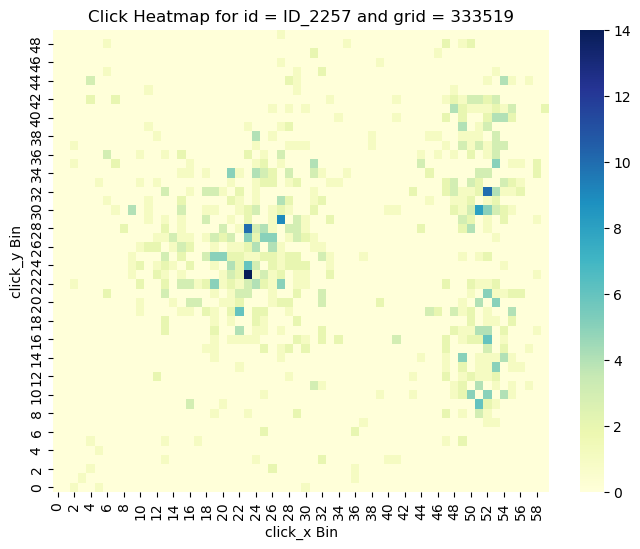

 Pct of broken domains according to prob method:  0.408
 Pct of broken domains according to both methods: 0.396
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.406
 Pct of broken domains according to both methods: 0.395
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.405
 Pct of broken domains according to both methods: 0.394
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.404
 Pct of broken domains according to both methods: 0.392
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2268
 p-value for chisquared test:  0.0
 log-prob for prob method:     0.0


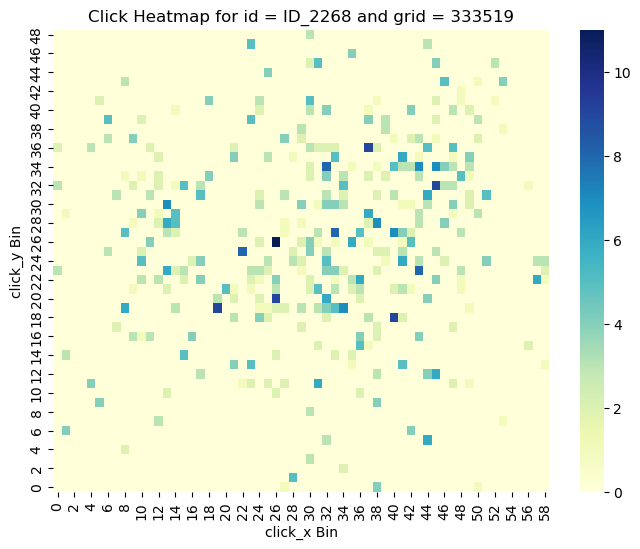

 Pct of broken domains according to prob method:  0.406
 Pct of broken domains according to both methods: 0.394
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.405
 Pct of broken domains according to both methods: 0.393
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2275
 p-value for chisquared test:  9.726356277825937e-287
 log-prob for prob method:     3.875660165952943e-53


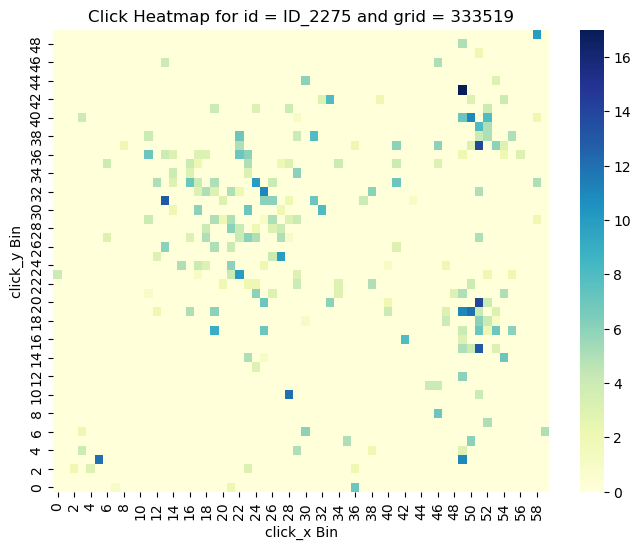

 Pct of broken domains according to prob method:  0.406
 Pct of broken domains according to both methods: 0.395
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2290
 p-value for chisquared test:  0.0
 log-prob for prob method:     9.01676585849307e-72


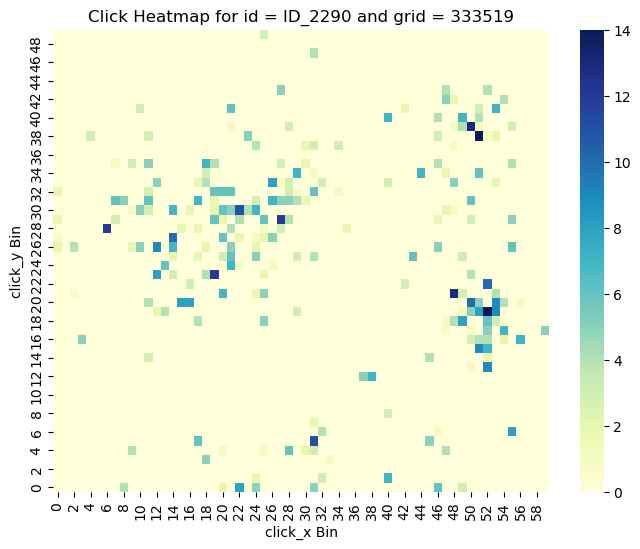

 Pct of broken domains according to prob method:  0.408
 Pct of broken domains according to both methods: 0.397
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2292
 p-value for chisquared test:  0.0
 log-prob for prob method:     6.18259651859601e-26


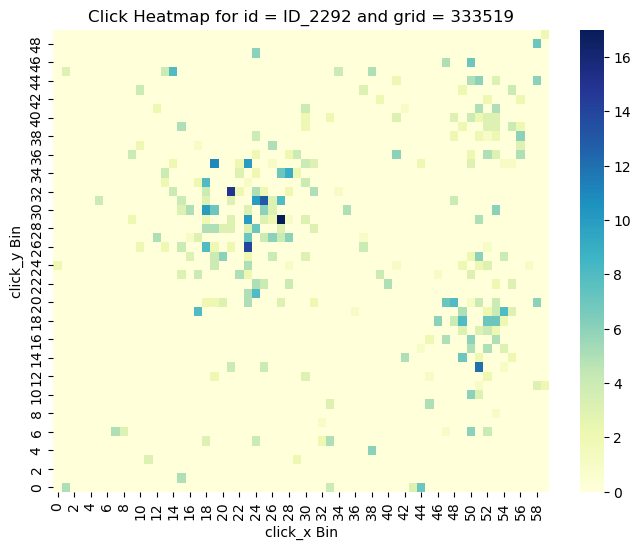

 Pct of broken domains according to prob method:  0.410
 Pct of broken domains according to both methods: 0.398
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.409
 Pct of broken domains according to both methods: 0.397
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2303
 p-value for chisquared test:  0.0
 log-prob for prob method:     6.856631528536833e-81


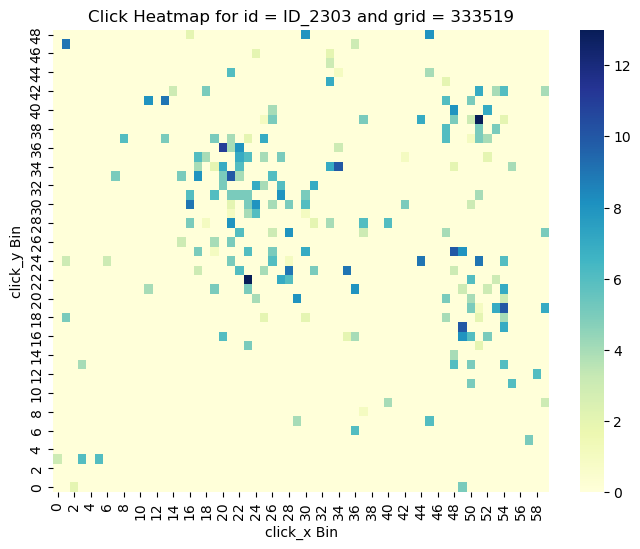

 Pct of broken domains according to prob method:  0.410
 Pct of broken domains according to both methods: 0.399
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.409
 Pct of broken domains according to both methods: 0.398
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.408
 Pct of broken domains according to both methods: 0.397
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2309
 p-value for chisquared test:  1.4408902674943402e-236
 log-prob for prob method:     3.461825273314967e-09


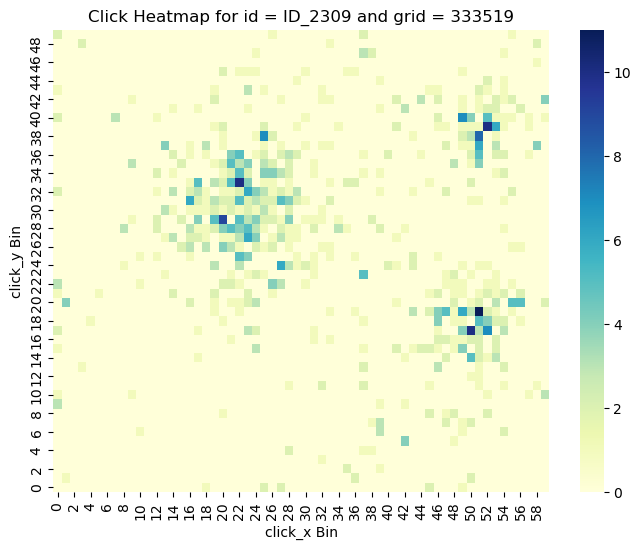

 Pct of broken domains according to prob method:  0.410
 Pct of broken domains according to both methods: 0.398
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.408
 Pct of broken domains according to both methods: 0.397
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.407
 Pct of broken domains according to both methods: 0.396
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2331
 p-value for chisquared test:  0.0
 log-prob for prob method:     0.0


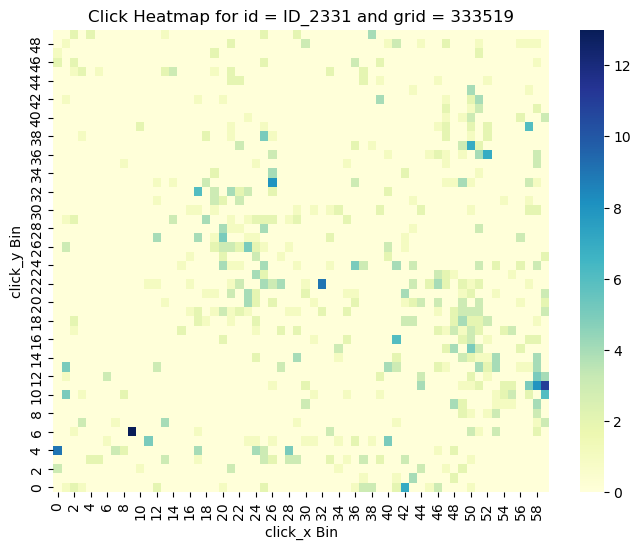

 Pct of broken domains according to prob method:  0.409
 Pct of broken domains according to both methods: 0.398
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2339
 p-value for chisquared test:  0.0
 log-prob for prob method:     0.0


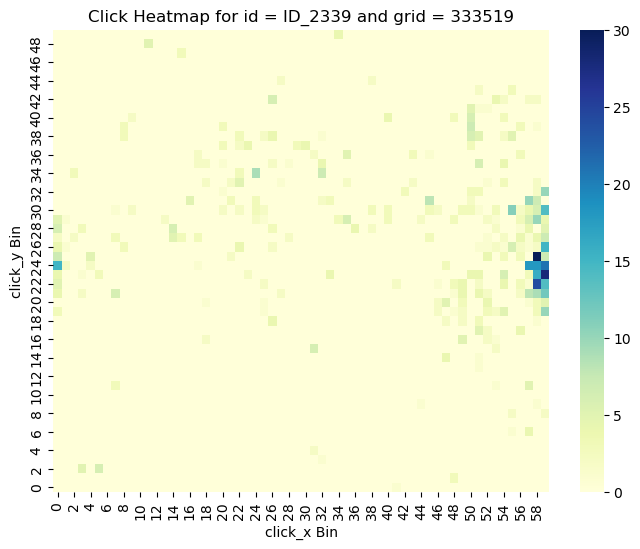

 Pct of broken domains according to prob method:  0.411
 Pct of broken domains according to both methods: 0.399
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.409
 Pct of broken domains according to both methods: 0.398
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.408
 Pct of broken domains according to both methods: 0.397
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.407
 Pct of broken domains according to both methods: 0.396
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.406
 Pct of broken domains according to both methods: 0.395
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.405
 Pct of broken domains according to both methods: 0.394
----------------------------

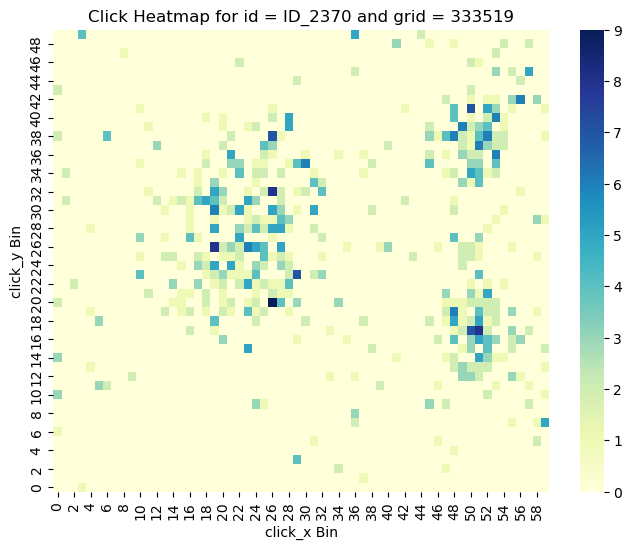

 Pct of broken domains according to prob method:  0.405
 Pct of broken domains according to both methods: 0.395
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.404
 Pct of broken domains according to both methods: 0.393
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.403
 Pct of broken domains according to both methods: 0.392
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2380
 p-value for chisquared test:  1.4777788166746227e-64
 log-prob for prob method:     6.10013024912444e-25


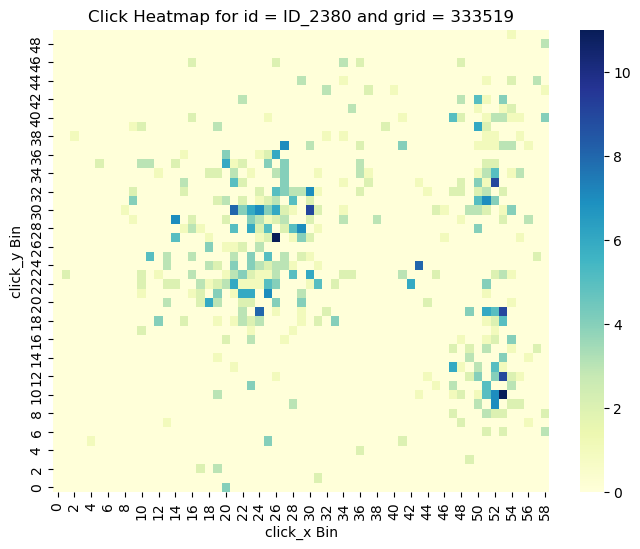

 Pct of broken domains according to prob method:  0.405
 Pct of broken domains according to both methods: 0.394
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2381
 p-value for chisquared test:  1.8871387021541067e-142
 log-prob for prob method:     2.7095984197014867e-53


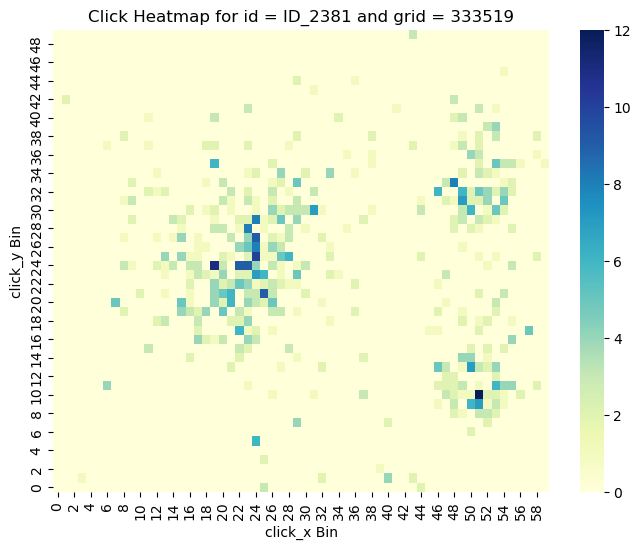

 Pct of broken domains according to prob method:  0.407
 Pct of broken domains according to both methods: 0.396
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2386
 p-value for chisquared test:  0.0
 log-prob for prob method:     0.0


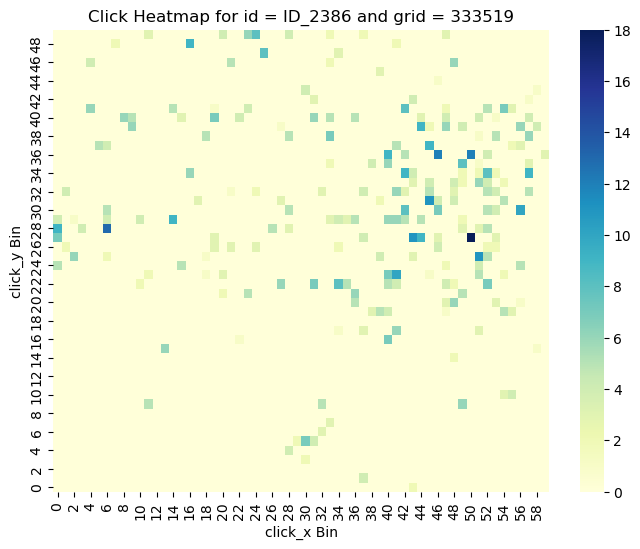

 Pct of broken domains according to prob method:  0.408
 Pct of broken domains according to both methods: 0.397
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.407
 Pct of broken domains according to both methods: 0.396
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.406
 Pct of broken domains according to both methods: 0.395
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2389
 p-value for chisquared test:  6.4301415465231596e-226
 log-prob for prob method:     9.18526504349606e-18


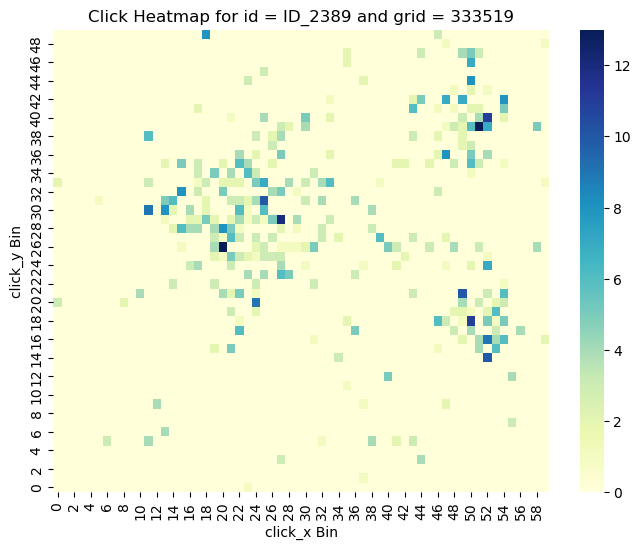

 Pct of broken domains according to prob method:  0.408
 Pct of broken domains according to both methods: 0.397
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2394
 p-value for chisquared test:  1.0792214991246973e-150
 log-prob for prob method:     3.302233541826004e-37


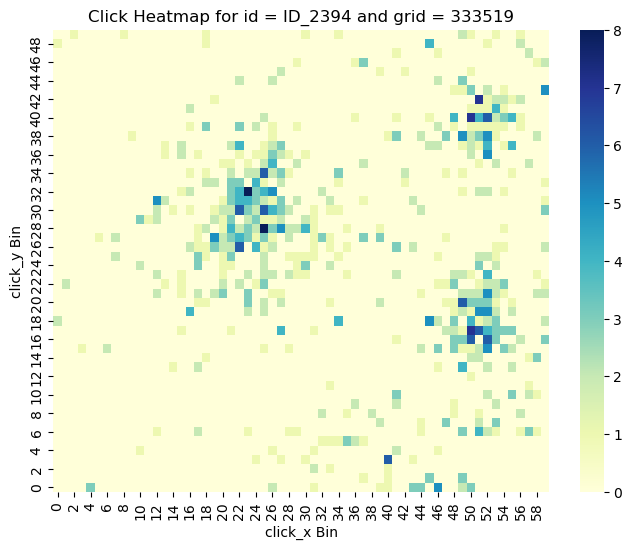

 Pct of broken domains according to prob method:  0.409
 Pct of broken domains according to both methods: 0.398
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2395
 p-value for chisquared test:  0.0
 log-prob for prob method:     6.391199612057134e-224


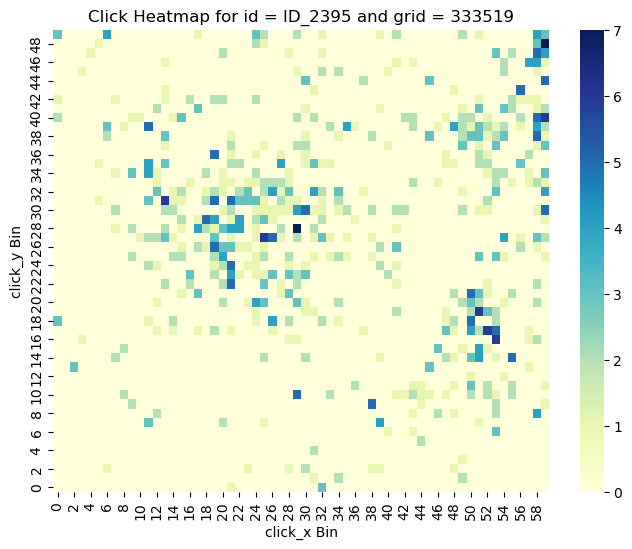

 Pct of broken domains according to prob method:  0.411
 Pct of broken domains according to both methods: 0.400
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2396
 p-value for chisquared test:  0.0
 log-prob for prob method:     0.0


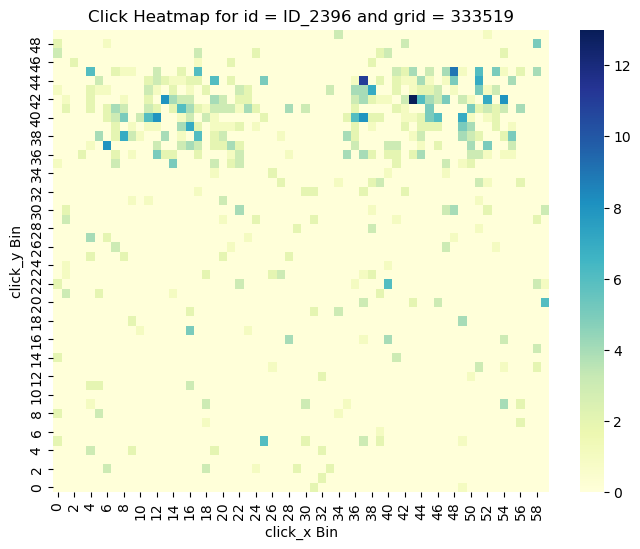

 Pct of broken domains according to prob method:  0.412
 Pct of broken domains according to both methods: 0.402
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2399
 p-value for chisquared test:  0.0
 log-prob for prob method:     6.226526961919976e-91


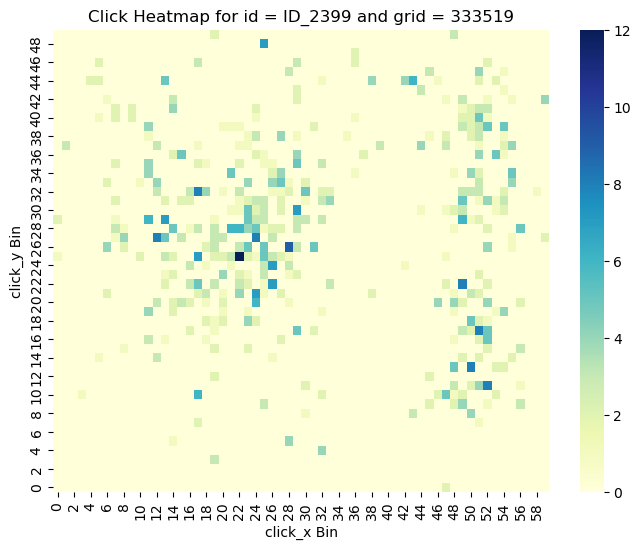

 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.403
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.413
 Pct of broken domains according to both methods: 0.402
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.412
 Pct of broken domains according to both methods: 0.401
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.411
 Pct of broken domains according to both methods: 0.400
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.409
 Pct of broken domains according to both methods: 0.399
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.408
 Pct of broken domains according to both methods: 0.398
----------------------------

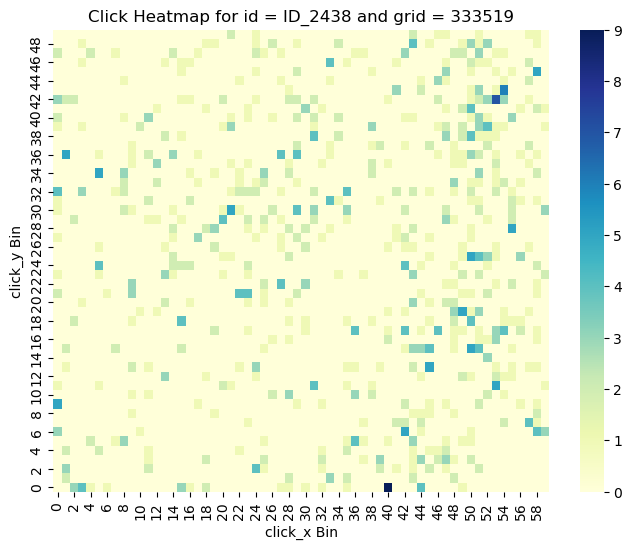

 Pct of broken domains according to prob method:  0.407
 Pct of broken domains according to both methods: 0.396
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2441
 p-value for chisquared test:  0.0
 log-prob for prob method:     1.975360231186596e-139


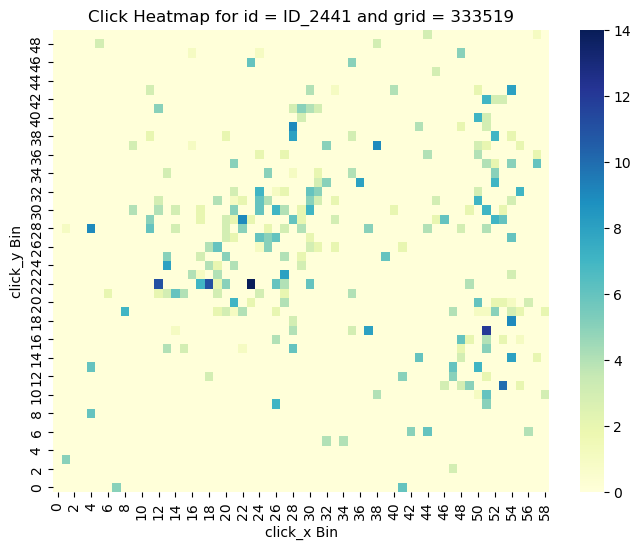

 Pct of broken domains according to prob method:  0.408
 Pct of broken domains according to both methods: 0.398
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2444
 p-value for chisquared test:  1.7366965512603156e-199
 log-prob for prob method:     1.0488292717933849e-98


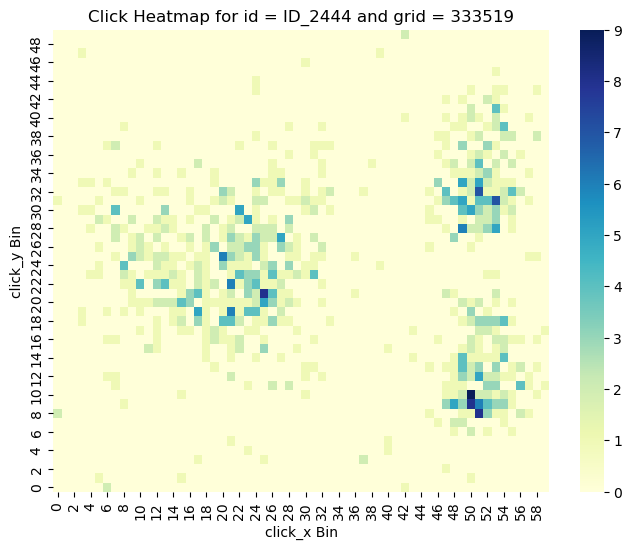

 Pct of broken domains according to prob method:  0.410
 Pct of broken domains according to both methods: 0.399
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.409
 Pct of broken domains according to both methods: 0.398
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2454
 p-value for chisquared test:  1.595062652693426e-97
 log-prob for prob method:     2.07511048354849e-14


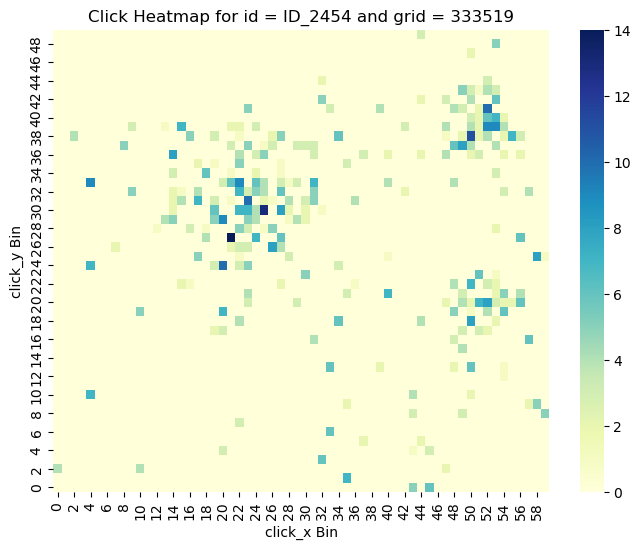

 Pct of broken domains according to prob method:  0.410
 Pct of broken domains according to both methods: 0.400
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.409
 Pct of broken domains according to both methods: 0.399
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.408
 Pct of broken domains according to both methods: 0.398
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.407
 Pct of broken domains according to both methods: 0.397
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2473
 p-value for chisquared test:  2.7979013801517437e-16
 log-prob for prob method:     7.968575378841692e-11


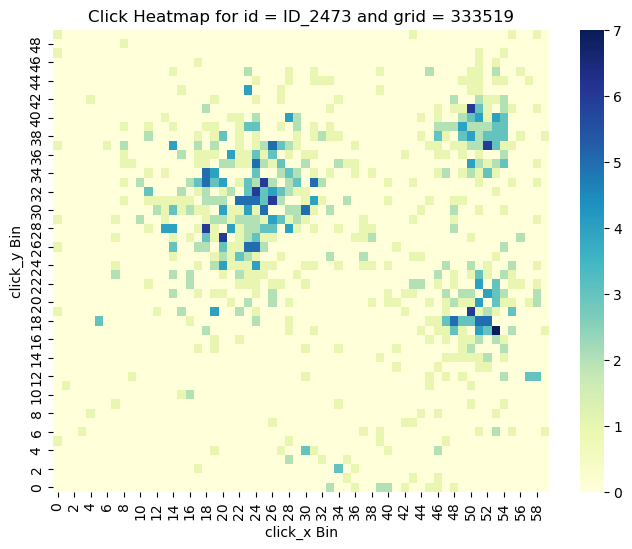

 Pct of broken domains according to prob method:  0.409
 Pct of broken domains according to both methods: 0.398
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.408
 Pct of broken domains according to both methods: 0.397
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.407
 Pct of broken domains according to both methods: 0.396
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.406
 Pct of broken domains according to both methods: 0.395
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.405
 Pct of broken domains according to both methods: 0.394
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.404
 Pct of broken domains according to both methods: 0.393
----------------------------

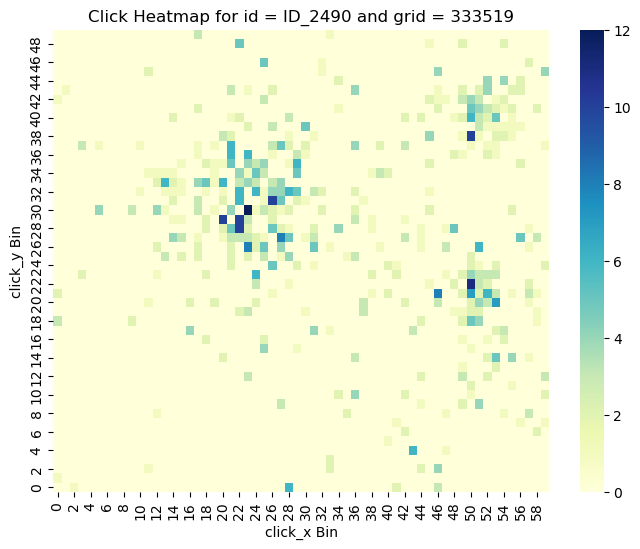

 Pct of broken domains according to prob method:  0.404
 Pct of broken domains according to both methods: 0.394
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2495
 p-value for chisquared test:  0.0
 log-prob for prob method:     1.8142038786626014e-37


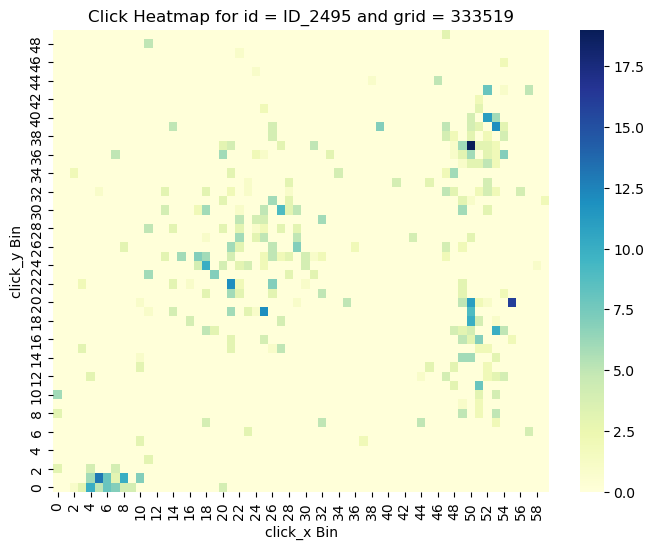

 Pct of broken domains according to prob method:  0.405
 Pct of broken domains according to both methods: 0.396
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.404
 Pct of broken domains according to both methods: 0.395
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.403
 Pct of broken domains according to both methods: 0.394
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.402
 Pct of broken domains according to both methods: 0.393
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.401
 Pct of broken domains according to both methods: 0.392
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.400
 Pct of broken domains according to both methods: 0.391
----------------------------

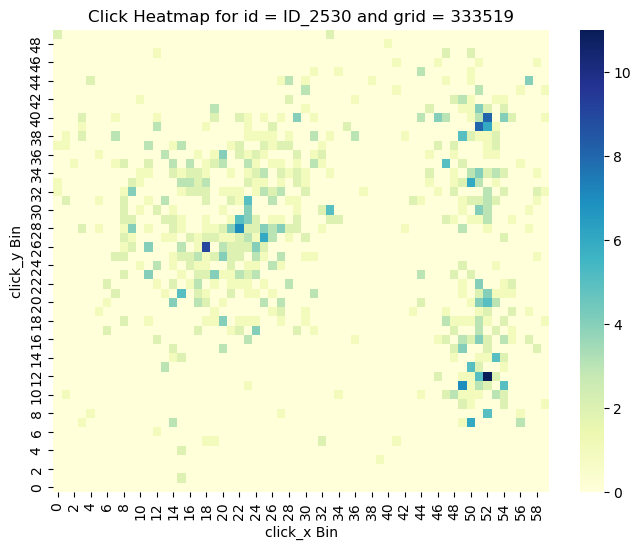

 Pct of broken domains according to prob method:  0.400
 Pct of broken domains according to both methods: 0.390
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.399
 Pct of broken domains according to both methods: 0.389
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2541
 p-value for chisquared test:  1.5843146616185193e-270
 log-prob for prob method:     1.0062289039468535e-40


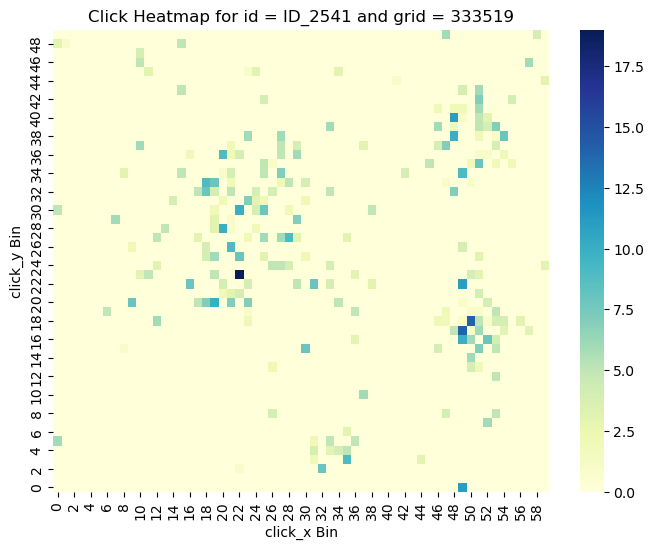

 Pct of broken domains according to prob method:  0.400
 Pct of broken domains according to both methods: 0.391
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2544
 p-value for chisquared test:  7.892251358197094e-303
 log-prob for prob method:     2.451203663632376e-64


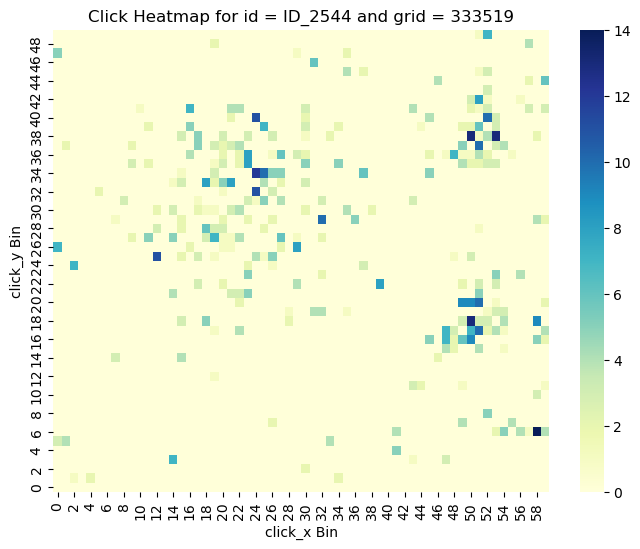

 Pct of broken domains according to prob method:  0.402
 Pct of broken domains according to both methods: 0.392
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.401
 Pct of broken domains according to both methods: 0.391
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2553
 p-value for chisquared test:  3.751990767057075e-36
 log-prob for prob method:     2.95342200369129e-48


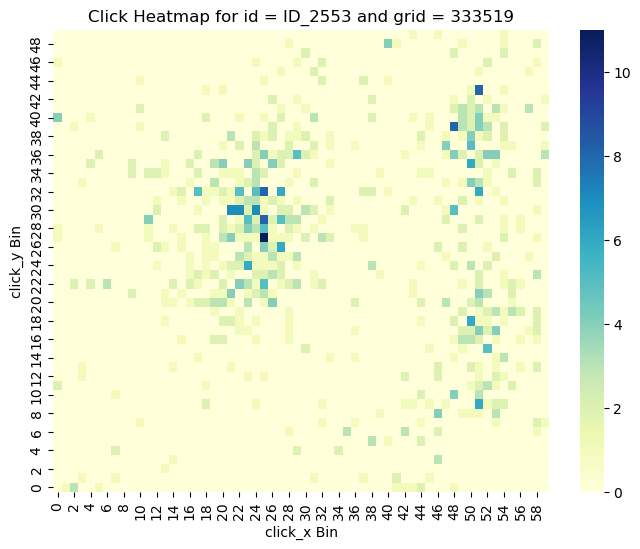

 Pct of broken domains according to prob method:  0.402
 Pct of broken domains according to both methods: 0.393
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.401
 Pct of broken domains according to both methods: 0.392
-----------------------------------------------------------
 grid id: 333519, domain id: ID_256
 p-value for chisquared test:  6.605461910488805e-163
 log-prob for prob method:     1.6078791057780762e-29


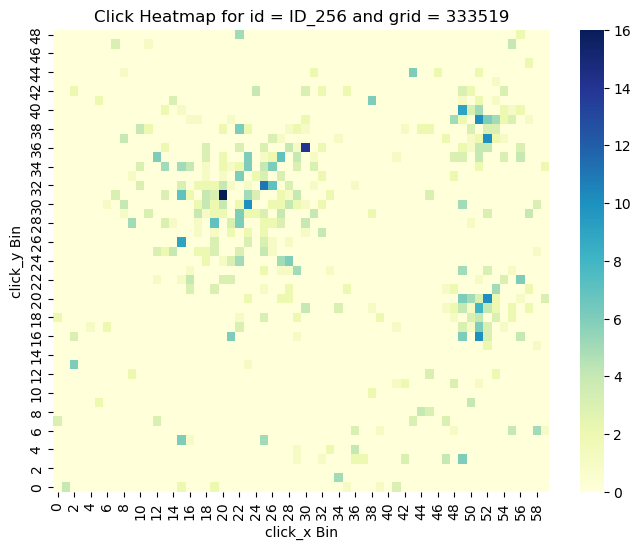

 Pct of broken domains according to prob method:  0.403
 Pct of broken domains according to both methods: 0.393
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.402
 Pct of broken domains according to both methods: 0.392
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2567
 p-value for chisquared test:  1.9906556542312427e-132
 log-prob for prob method:     2.9085643664429125e-201


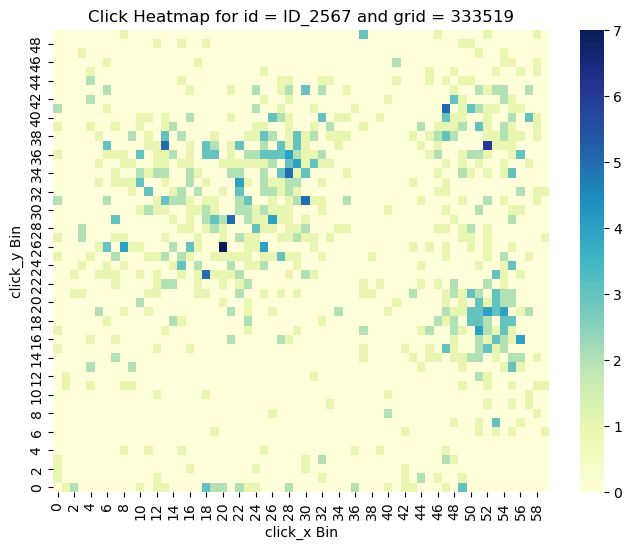

 Pct of broken domains according to prob method:  0.403
 Pct of broken domains according to both methods: 0.394
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2569
 p-value for chisquared test:  0.0
 log-prob for prob method:     8.069177873145544e-171


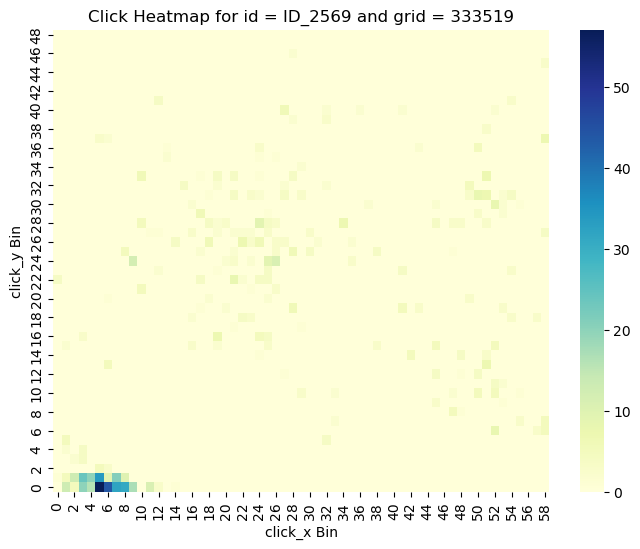

 Pct of broken domains according to prob method:  0.405
 Pct of broken domains according to both methods: 0.395
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2570
 p-value for chisquared test:  0.0
 log-prob for prob method:     1.403682646363127e-174


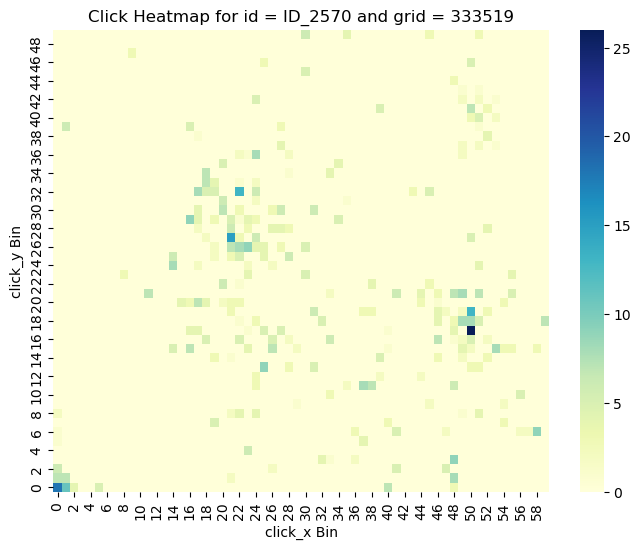

 Pct of broken domains according to prob method:  0.406
 Pct of broken domains according to both methods: 0.397
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.405
 Pct of broken domains according to both methods: 0.396
-----------------------------------------------------------
 grid id: 333519, domain id: ID_258
 p-value for chisquared test:  0.0
 log-prob for prob method:     5.076155265264054e-306


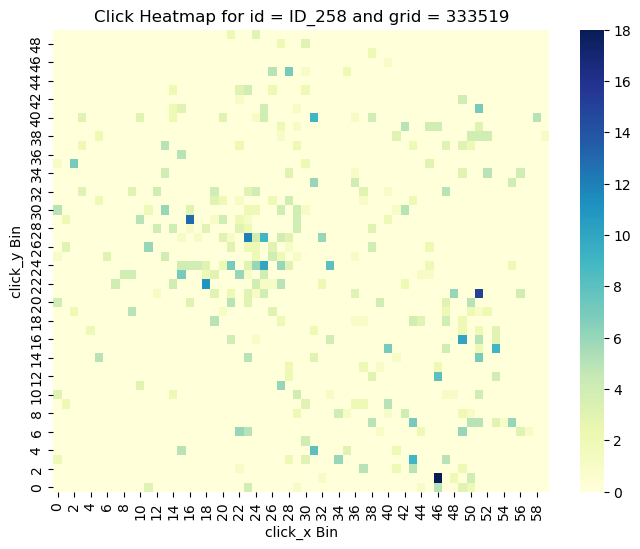

 Pct of broken domains according to prob method:  0.407
 Pct of broken domains according to both methods: 0.397
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2583
 p-value for chisquared test:  4.449659514234114e-28
 log-prob for prob method:     3.146501073639326e-71


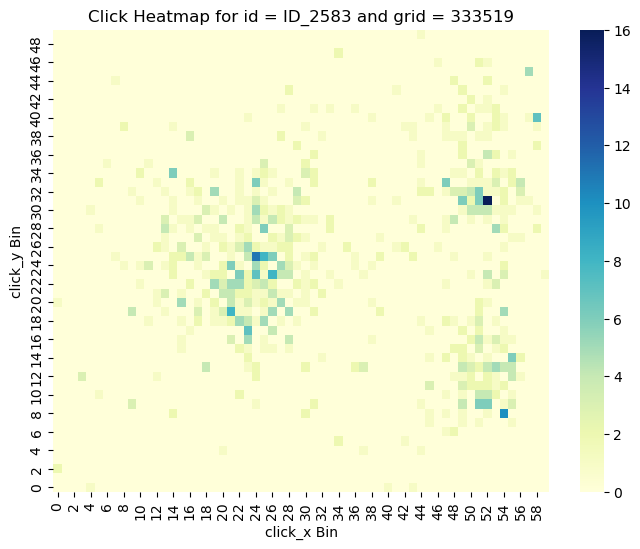

 Pct of broken domains according to prob method:  0.408
 Pct of broken domains according to both methods: 0.399
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2584
 p-value for chisquared test:  2.1028541115048658e-249
 log-prob for prob method:     3.6214742351050887e-14


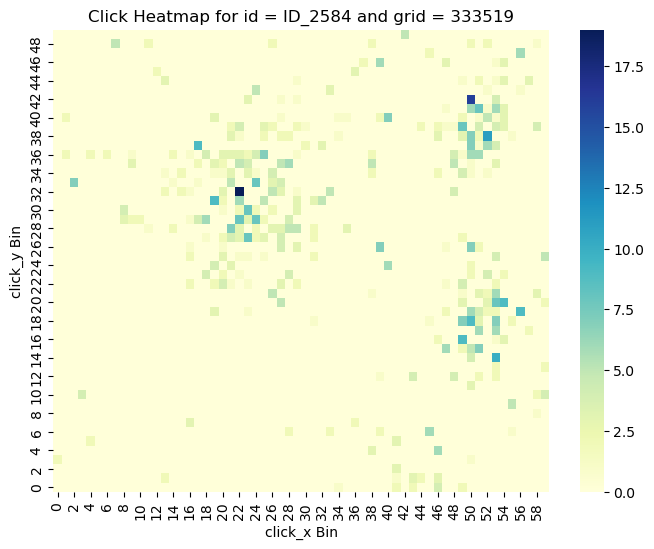

 Pct of broken domains according to prob method:  0.409
 Pct of broken domains according to both methods: 0.400
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.408
 Pct of broken domains according to both methods: 0.399
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.407
 Pct of broken domains according to both methods: 0.398
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2608
 p-value for chisquared test:  1.693839948274094e-115
 log-prob for prob method:     7.189630166375394e-51


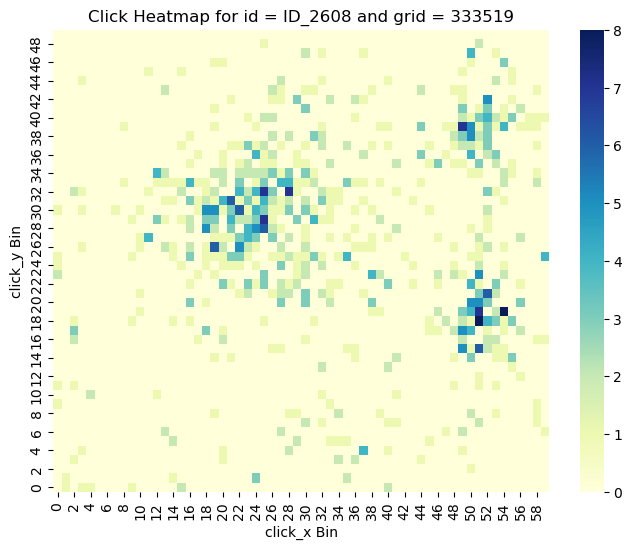

 Pct of broken domains according to prob method:  0.409
 Pct of broken domains according to both methods: 0.400
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2609
 p-value for chisquared test:  0.0
 log-prob for prob method:     5.024478418549418e-281


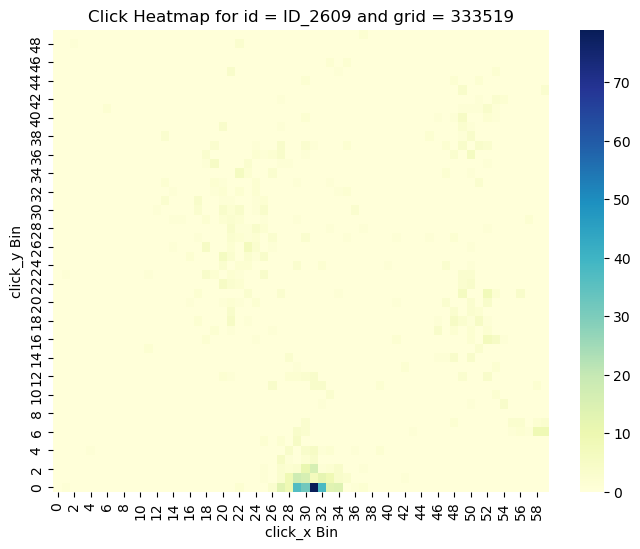

 Pct of broken domains according to prob method:  0.410
 Pct of broken domains according to both methods: 0.401
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.409
 Pct of broken domains according to both methods: 0.400
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2619
 p-value for chisquared test:  0.0
 log-prob for prob method:     1.234398294979749e-61


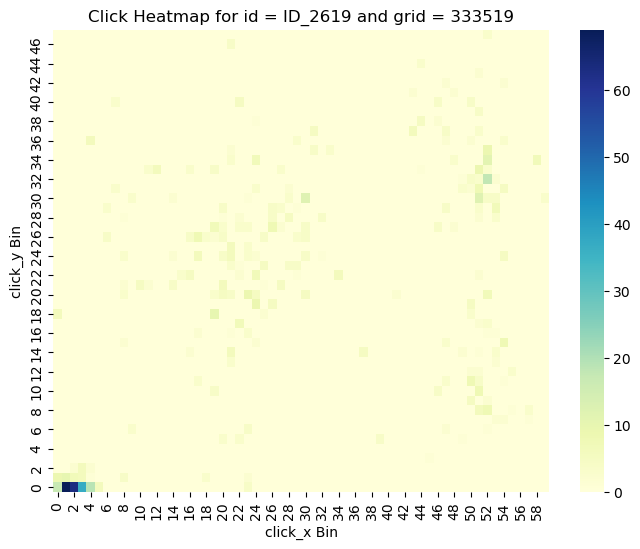

 Pct of broken domains according to prob method:  0.411
 Pct of broken domains according to both methods: 0.401
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.410
 Pct of broken domains according to both methods: 0.400
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2623
 p-value for chisquared test:  4.6868223354280625e-245
 log-prob for prob method:     2.9513870685891e-26


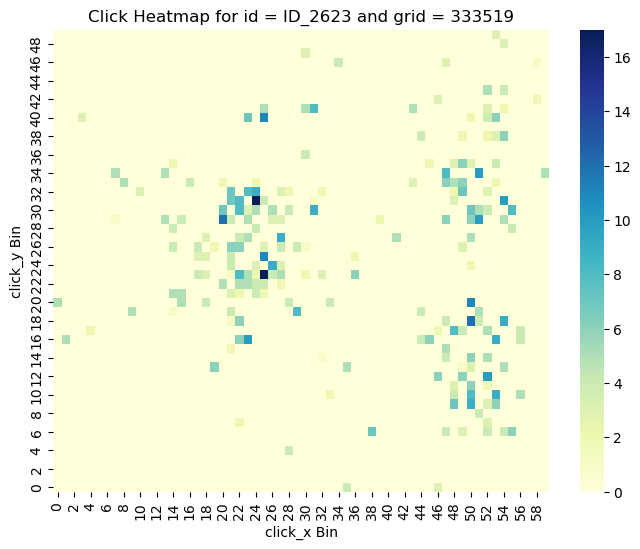

 Pct of broken domains according to prob method:  0.411
 Pct of broken domains according to both methods: 0.402
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2627
 p-value for chisquared test:  1.485383365767789e-128
 log-prob for prob method:     2.031333033335007e-15


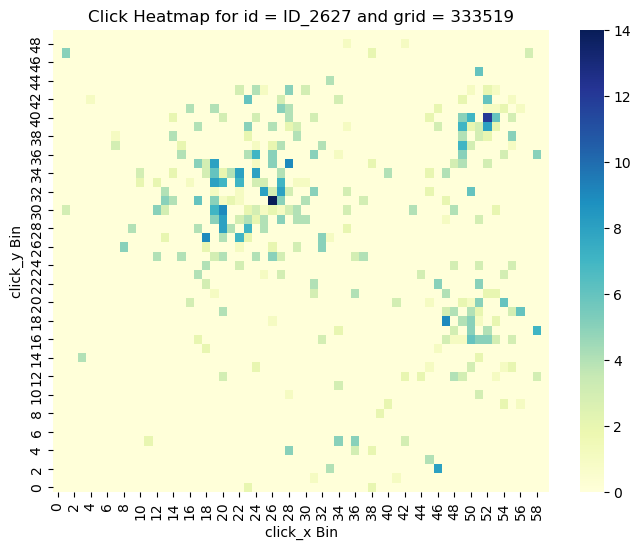

 Pct of broken domains according to prob method:  0.412
 Pct of broken domains according to both methods: 0.403
-----------------------------------------------------------
 grid id: 333519, domain id: ID_263
 p-value for chisquared test:  1.0746968806695604e-203
 log-prob for prob method:     1.053727192803566e-09


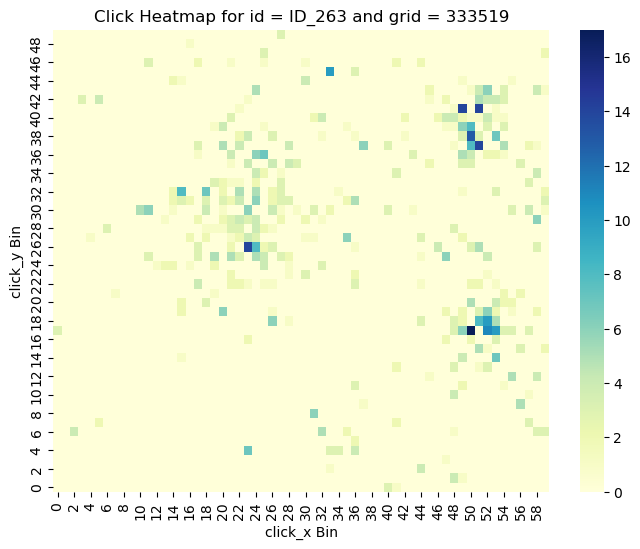

 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.405
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.413
 Pct of broken domains according to both methods: 0.404
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.412
 Pct of broken domains according to both methods: 0.403
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.411
 Pct of broken domains according to both methods: 0.402
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2644
 p-value for chisquared test:  8.356117911860739e-114
 log-prob for prob method:     3.4645903957228336e-70


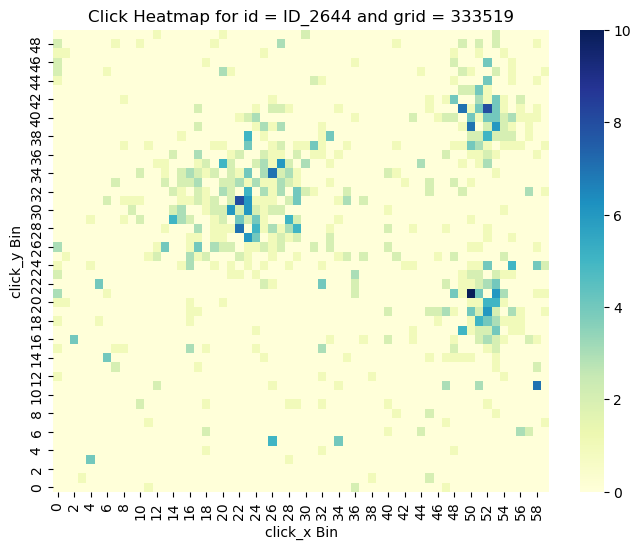

 Pct of broken domains according to prob method:  0.412
 Pct of broken domains according to both methods: 0.403
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.411
 Pct of broken domains according to both methods: 0.402
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2660
 p-value for chisquared test:  6.422061906886404e-27
 log-prob for prob method:     4.611914872878547e-19


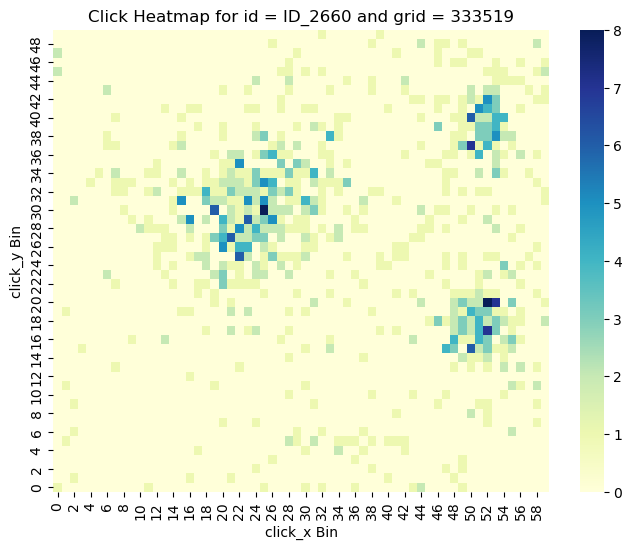

 Pct of broken domains according to prob method:  0.413
 Pct of broken domains according to both methods: 0.404
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.412
 Pct of broken domains according to both methods: 0.403
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.411
 Pct of broken domains according to both methods: 0.402
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.410
 Pct of broken domains according to both methods: 0.401
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.409
 Pct of broken domains according to both methods: 0.400
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2676
 p-value for chisquared test:  0.0
 log-prob for prob method:     1.2096673142025676e-82


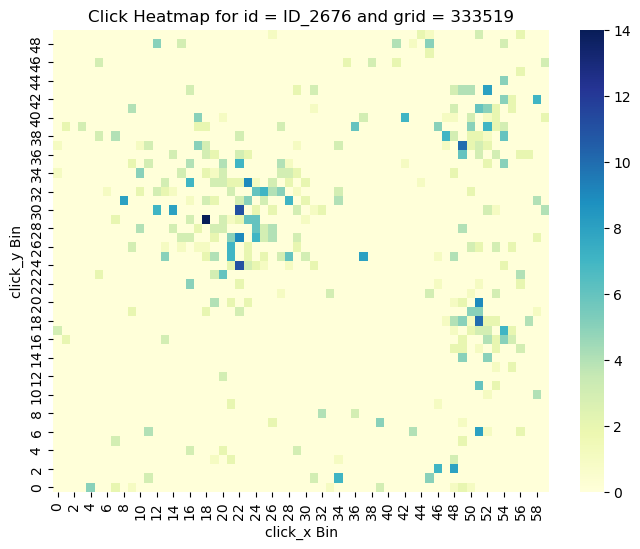

 Pct of broken domains according to prob method:  0.410
 Pct of broken domains according to both methods: 0.401
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2678
 p-value for chisquared test:  2.070322269629546e-91
 log-prob for prob method:     1.8039984649148266e-28


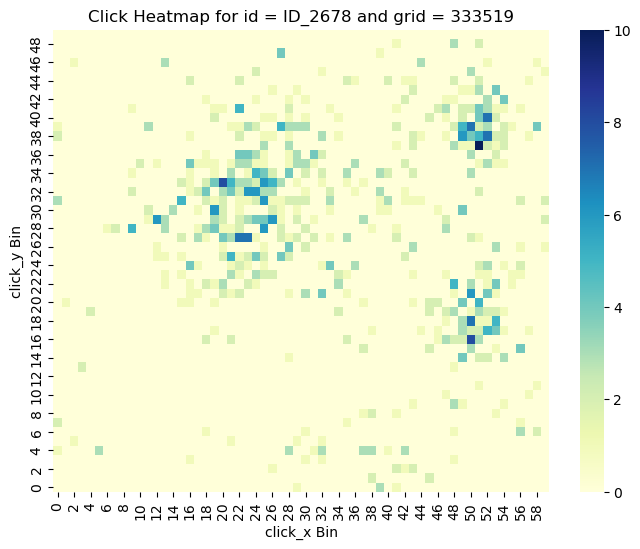

 Pct of broken domains according to prob method:  0.412
 Pct of broken domains according to both methods: 0.403
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2680
 p-value for chisquared test:  0.0
 log-prob for prob method:     0.0


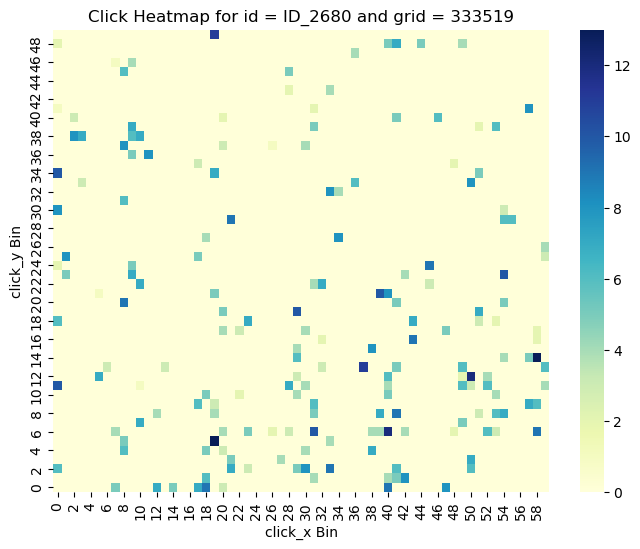

 Pct of broken domains according to prob method:  0.413
 Pct of broken domains according to both methods: 0.404
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.412
 Pct of broken domains according to both methods: 0.403
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.411
 Pct of broken domains according to both methods: 0.402
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.410
 Pct of broken domains according to both methods: 0.401
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.409
 Pct of broken domains according to both methods: 0.400
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2698
 p-value for chisquared test:  8.1388583270544305e-171
 log-prob for prob method:     1.003390568549241

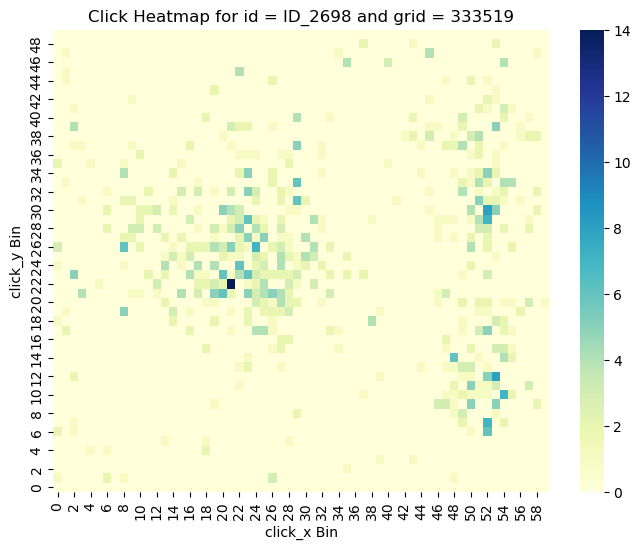

 Pct of broken domains according to prob method:  0.411
 Pct of broken domains according to both methods: 0.402
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.410
 Pct of broken domains according to both methods: 0.401
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.409
 Pct of broken domains according to both methods: 0.400
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.408
 Pct of broken domains according to both methods: 0.399
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2717
 p-value for chisquared test:  2.5222907296714684e-175
 log-prob for prob method:     1.2157715973824348e-50


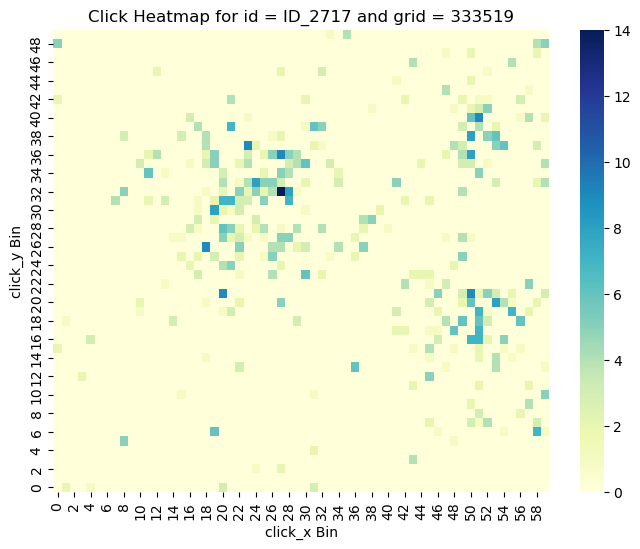

 Pct of broken domains according to prob method:  0.409
 Pct of broken domains according to both methods: 0.400
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.408
 Pct of broken domains according to both methods: 0.400
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2728
 p-value for chisquared test:  1.5745734722750121e-283
 log-prob for prob method:     1.023496945633141e-74


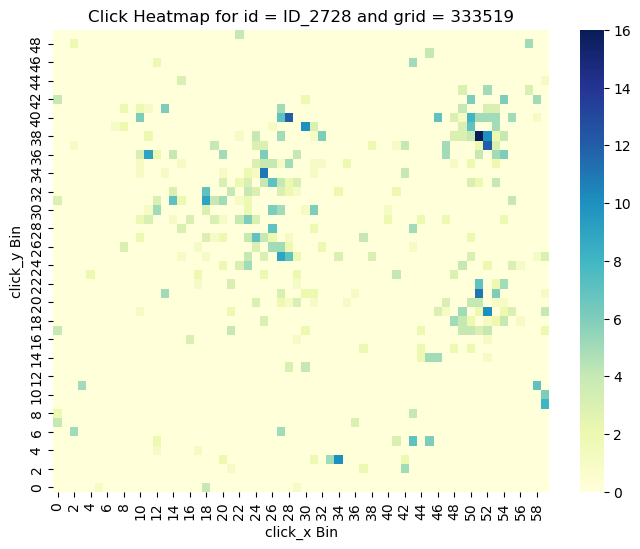

 Pct of broken domains according to prob method:  0.410
 Pct of broken domains according to both methods: 0.401
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.409
 Pct of broken domains according to both methods: 0.400
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.408
 Pct of broken domains according to both methods: 0.399
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.407
 Pct of broken domains according to both methods: 0.398
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.406
 Pct of broken domains according to both methods: 0.397
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2745
 p-value for chisquared test:  6.581175656029054e-234
 log-prob for prob method:     1.9903521891353718

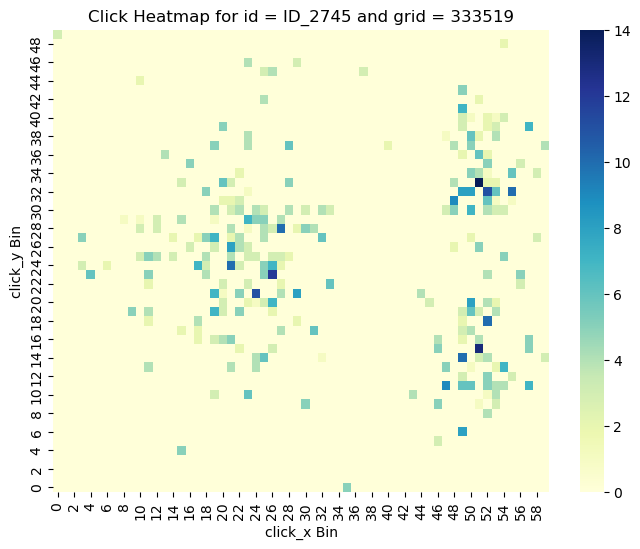

 Pct of broken domains according to prob method:  0.407
 Pct of broken domains according to both methods: 0.399
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2768
 p-value for chisquared test:  4.696072620052328e-37
 log-prob for prob method:     1.8661421432878007e-37


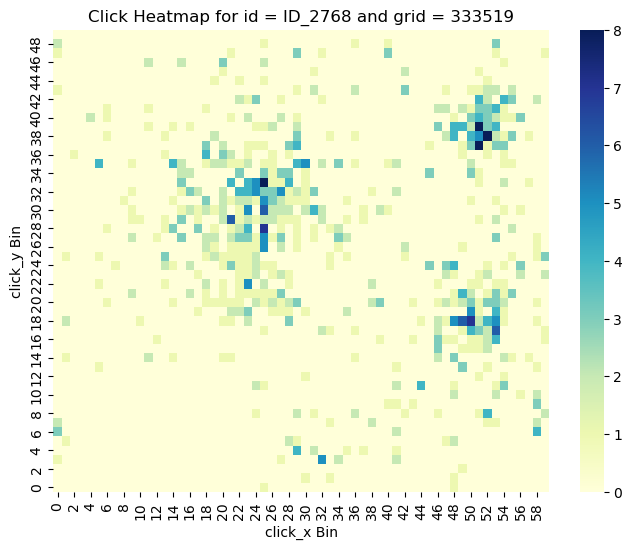

 Pct of broken domains according to prob method:  0.409
 Pct of broken domains according to both methods: 0.400
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.408
 Pct of broken domains according to both methods: 0.399
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2773
 p-value for chisquared test:  6.785488957835049e-302
 log-prob for prob method:     7.203919889910701e-67


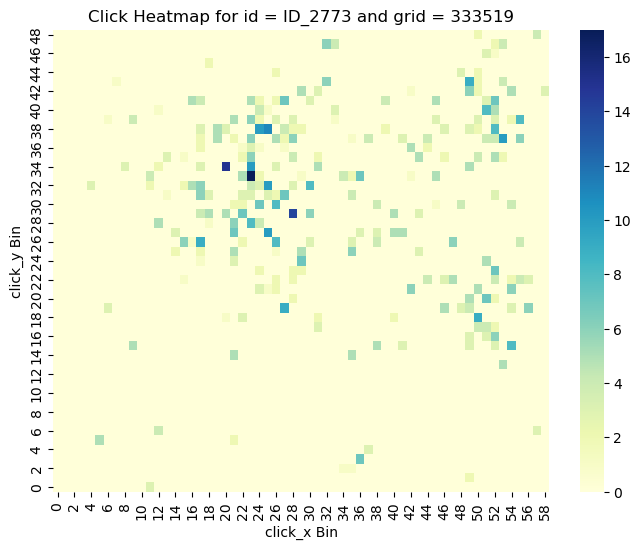

 Pct of broken domains according to prob method:  0.409
 Pct of broken domains according to both methods: 0.400
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.408
 Pct of broken domains according to both methods: 0.400
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.407
 Pct of broken domains according to both methods: 0.399
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.406
 Pct of broken domains according to both methods: 0.398
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2791
 p-value for chisquared test:  0.0
 log-prob for prob method:     3.8107789072682184e-45


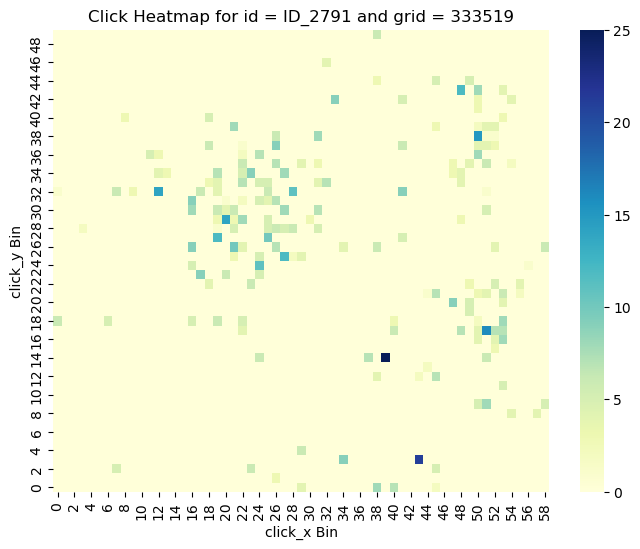

 Pct of broken domains according to prob method:  0.408
 Pct of broken domains according to both methods: 0.399
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2795
 p-value for chisquared test:  0.0
 log-prob for prob method:     3.645328969279712e-36


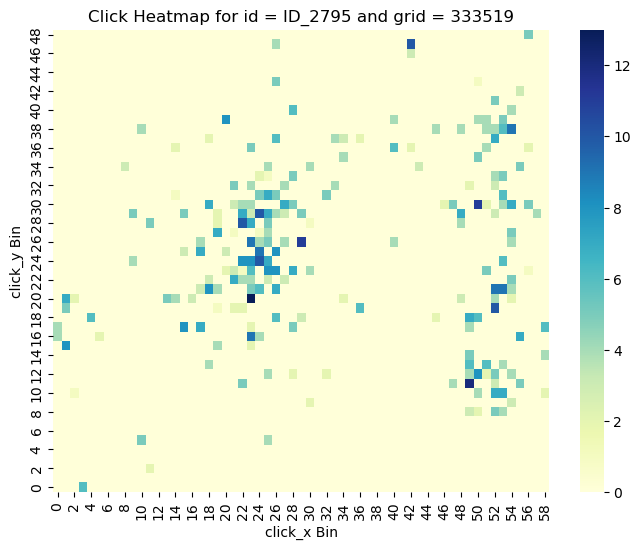

 Pct of broken domains according to prob method:  0.409
 Pct of broken domains according to both methods: 0.400
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.408
 Pct of broken domains according to both methods: 0.400
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.407
 Pct of broken domains according to both methods: 0.399
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.406
 Pct of broken domains according to both methods: 0.398
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2808
 p-value for chisquared test:  0.0
 log-prob for prob method:     1.1261502636495679e-209


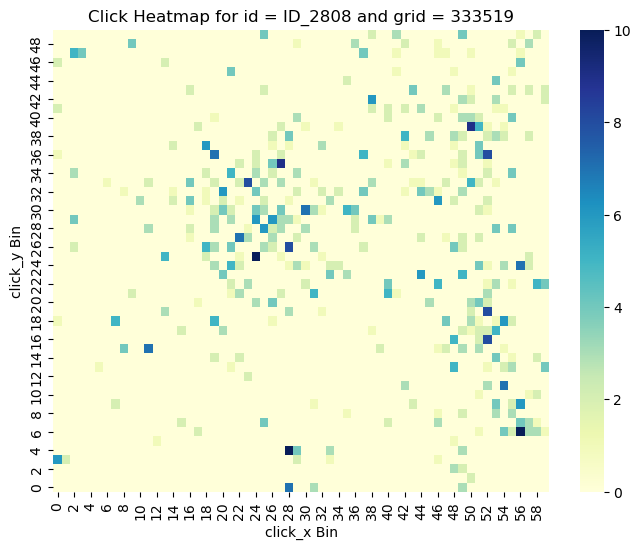

 Pct of broken domains according to prob method:  0.408
 Pct of broken domains according to both methods: 0.399
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.407
 Pct of broken domains according to both methods: 0.398
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2812
 p-value for chisquared test:  0.0
 log-prob for prob method:     3.680001425948334e-138


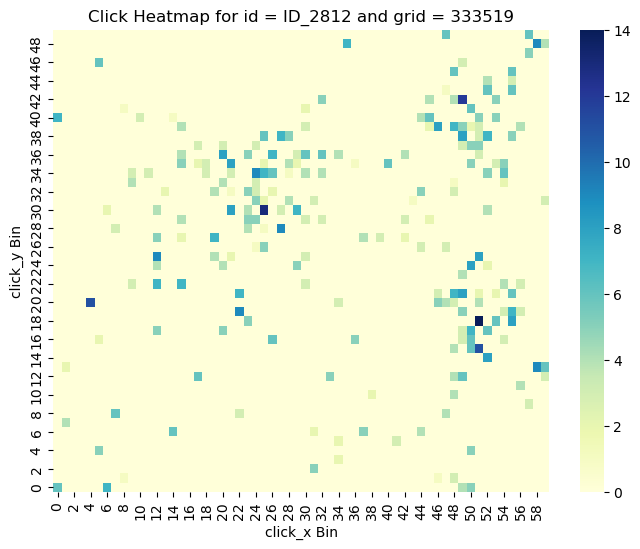

 Pct of broken domains according to prob method:  0.408
 Pct of broken domains according to both methods: 0.400
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.407
 Pct of broken domains according to both methods: 0.399
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.406
 Pct of broken domains according to both methods: 0.398
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.405
 Pct of broken domains according to both methods: 0.397
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2831
 p-value for chisquared test:  7.026629488895412e-187
 log-prob for prob method:     1.9443681604978992e-81


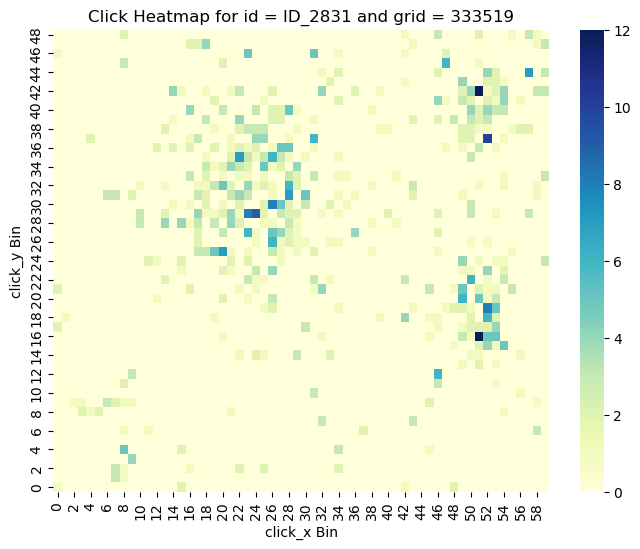

 Pct of broken domains according to prob method:  0.407
 Pct of broken domains according to both methods: 0.398
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2835
 p-value for chisquared test:  3.6179999064223065e-09
 log-prob for prob method:     1.7144207664157646e-54


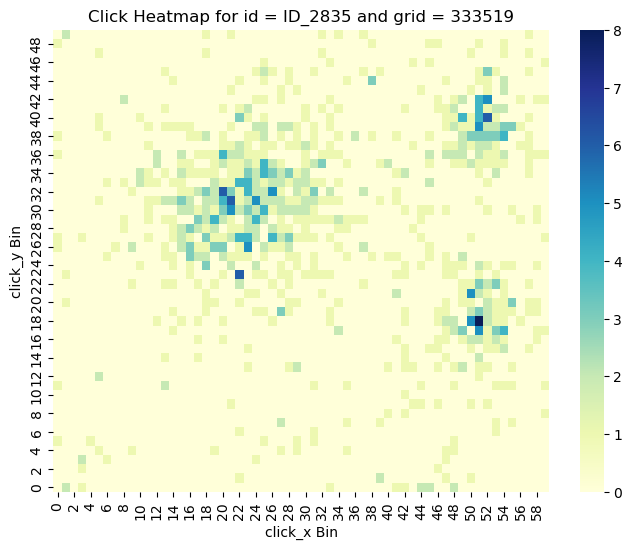

 Pct of broken domains according to prob method:  0.408
 Pct of broken domains according to both methods: 0.400
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2840
 p-value for chisquared test:  1.89838488748036e-60
 log-prob for prob method:     2.4405609146841334e-39


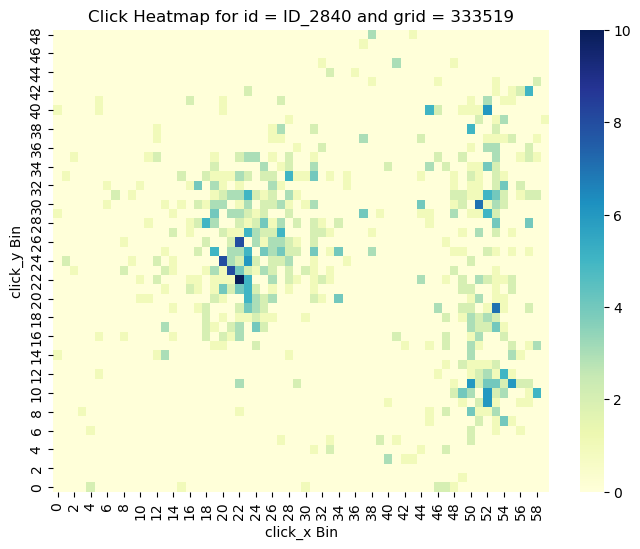

 Pct of broken domains according to prob method:  0.409
 Pct of broken domains according to both methods: 0.401
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.408
 Pct of broken domains according to both methods: 0.400
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.407
 Pct of broken domains according to both methods: 0.399
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.407
 Pct of broken domains according to both methods: 0.398
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.406
 Pct of broken domains according to both methods: 0.398
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2854
 p-value for chisquared test:  0.0
 log-prob for prob method:     3.894935019160425e-17


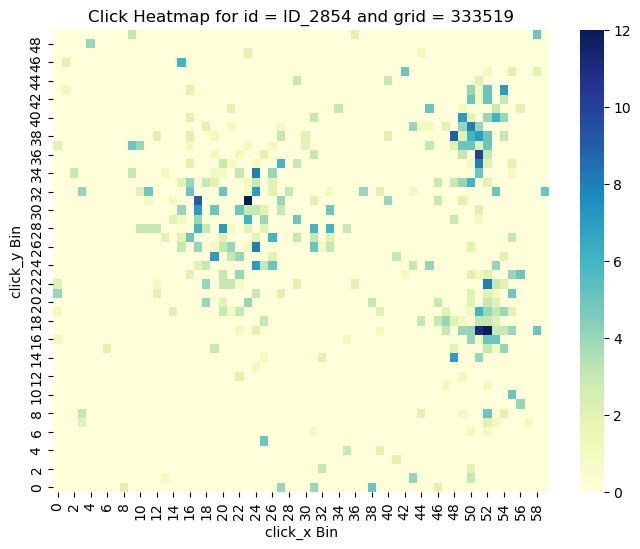

 Pct of broken domains according to prob method:  0.407
 Pct of broken domains according to both methods: 0.399
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2855
 p-value for chisquared test:  0.0
 log-prob for prob method:     5.510993660887148e-222


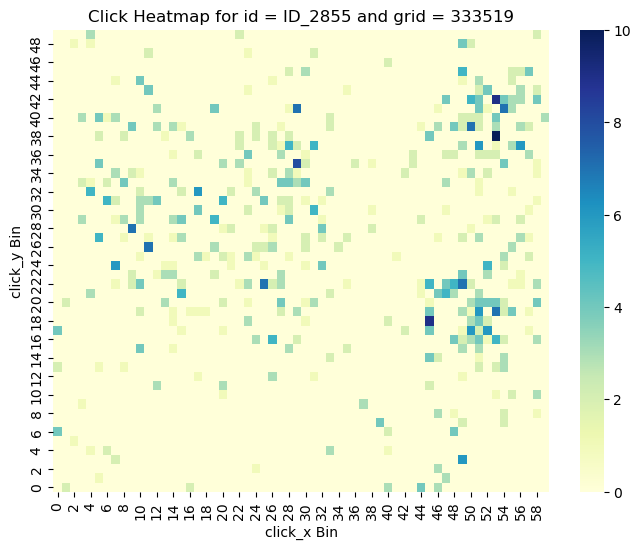

 Pct of broken domains according to prob method:  0.408
 Pct of broken domains according to both methods: 0.400
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.407
 Pct of broken domains according to both methods: 0.399
-----------------------------------------------------------
 grid id: 333519, domain id: ID_286
 p-value for chisquared test:  2.394110006246159e-21
 log-prob for prob method:     2.125611446607294e-56


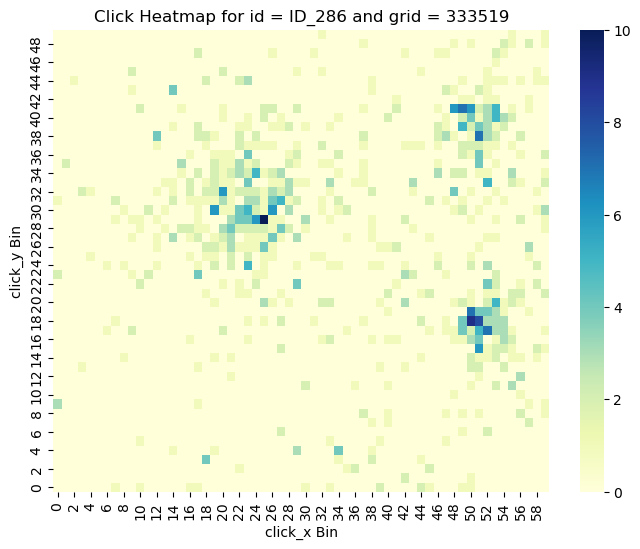

 Pct of broken domains according to prob method:  0.409
 Pct of broken domains according to both methods: 0.400
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.408
 Pct of broken domains according to both methods: 0.400
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2862
 p-value for chisquared test:  2.6504322942524544e-84
 log-prob for prob method:     1.4427969764333263e-10


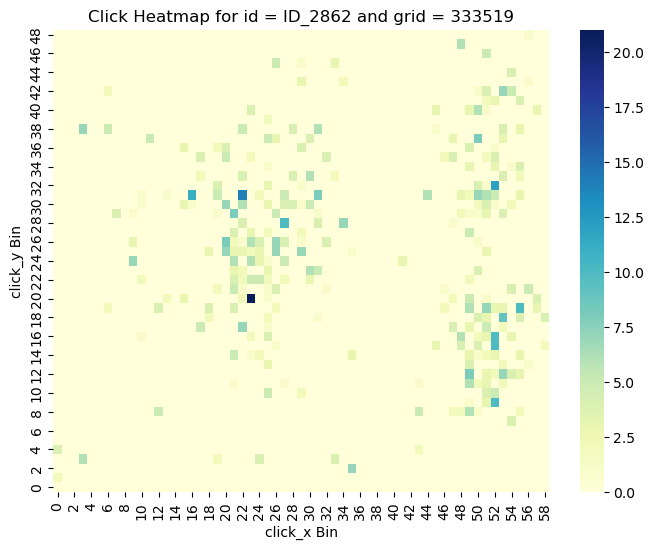

 Pct of broken domains according to prob method:  0.409
 Pct of broken domains according to both methods: 0.401
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2863
 p-value for chisquared test:  0.0
 log-prob for prob method:     0.0


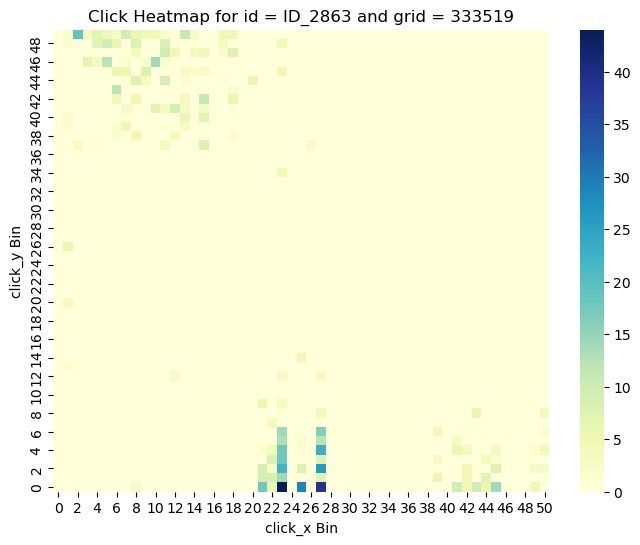

 Pct of broken domains according to prob method:  0.410
 Pct of broken domains according to both methods: 0.402
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.409
 Pct of broken domains according to both methods: 0.401
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2874
 p-value for chisquared test:  3.0636877987646025e-29
 log-prob for prob method:     1.4603825054623369e-80


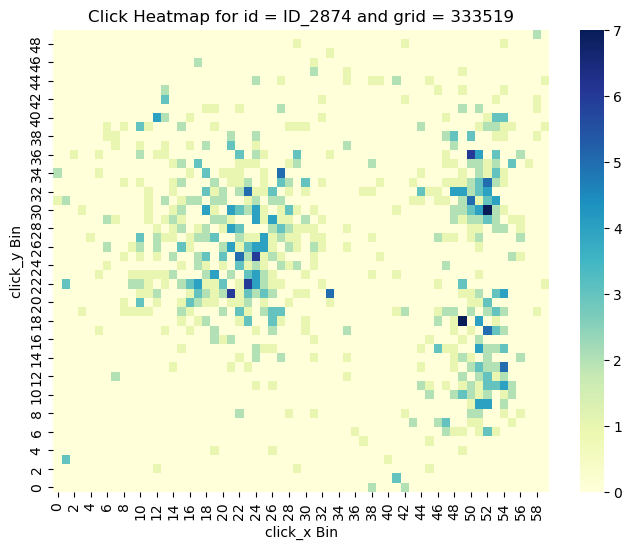

 Pct of broken domains according to prob method:  0.410
 Pct of broken domains according to both methods: 0.402
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2883
 p-value for chisquared test:  0.0
 log-prob for prob method:     0.0


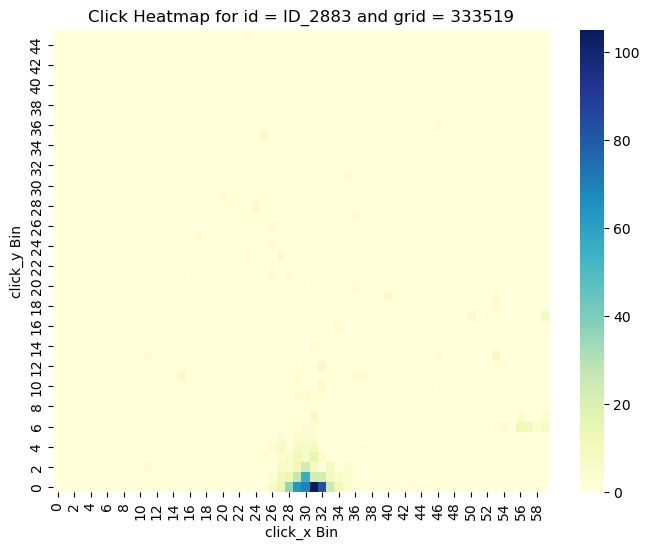

 Pct of broken domains according to prob method:  0.412
 Pct of broken domains according to both methods: 0.404
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.411
 Pct of broken domains according to both methods: 0.403
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.410
 Pct of broken domains according to both methods: 0.402
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.409
 Pct of broken domains according to both methods: 0.401
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.408
 Pct of broken domains according to both methods: 0.400
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.408
 Pct of broken domains according to both methods: 0.400
----------------------------

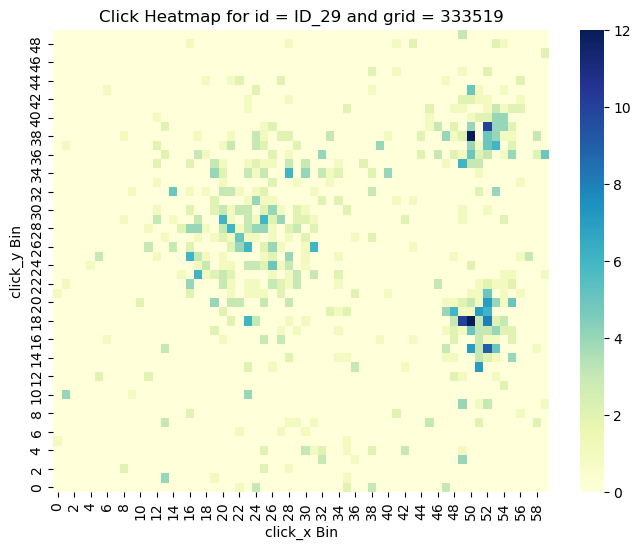

 Pct of broken domains according to prob method:  0.409
 Pct of broken domains according to both methods: 0.401
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.408
 Pct of broken domains according to both methods: 0.400
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.407
 Pct of broken domains according to both methods: 0.399
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2908
 p-value for chisquared test:  0.0
 log-prob for prob method:     0.0


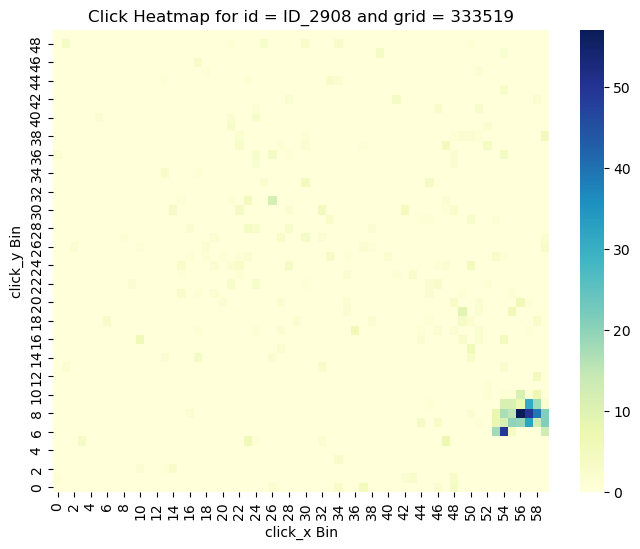

 Pct of broken domains according to prob method:  0.408
 Pct of broken domains according to both methods: 0.400
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2914
 p-value for chisquared test:  1.554748768702751e-161
 log-prob for prob method:     3.6553490575331424e-16


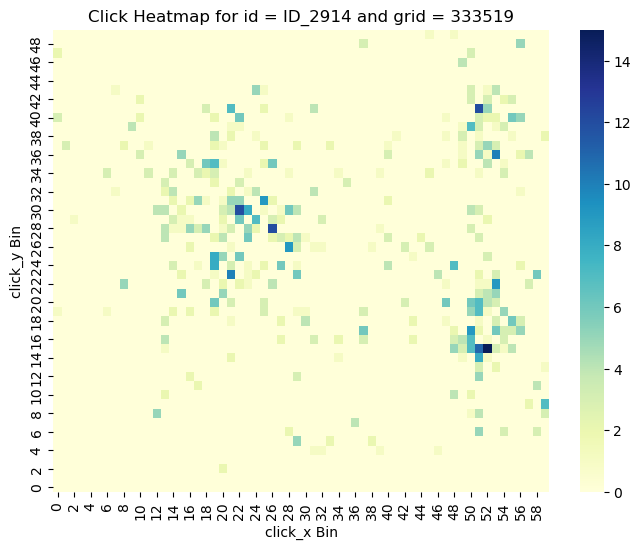

 Pct of broken domains according to prob method:  0.409
 Pct of broken domains according to both methods: 0.402
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2919
 p-value for chisquared test:  0.0
 log-prob for prob method:     1.0632077886692093e-54


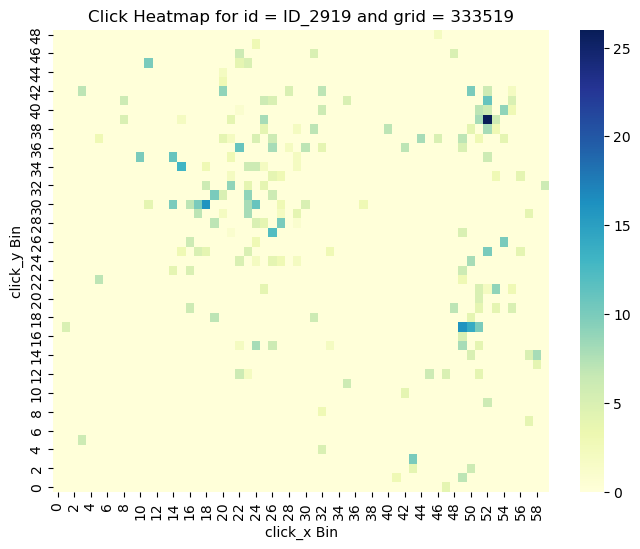

 Pct of broken domains according to prob method:  0.411
 Pct of broken domains according to both methods: 0.403
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2920
 p-value for chisquared test:  0.0
 log-prob for prob method:     1.9074853063600876e-102


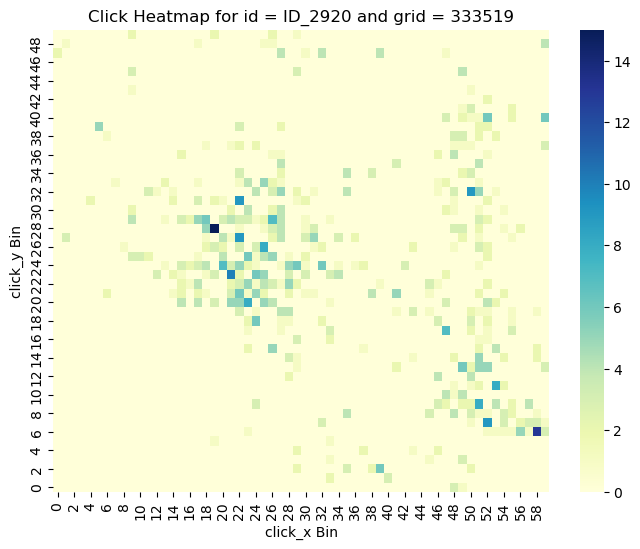

 Pct of broken domains according to prob method:  0.412
 Pct of broken domains according to both methods: 0.404
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2927
 p-value for chisquared test:  2.2106279492148617e-274
 log-prob for prob method:     9.696555664012948e-14


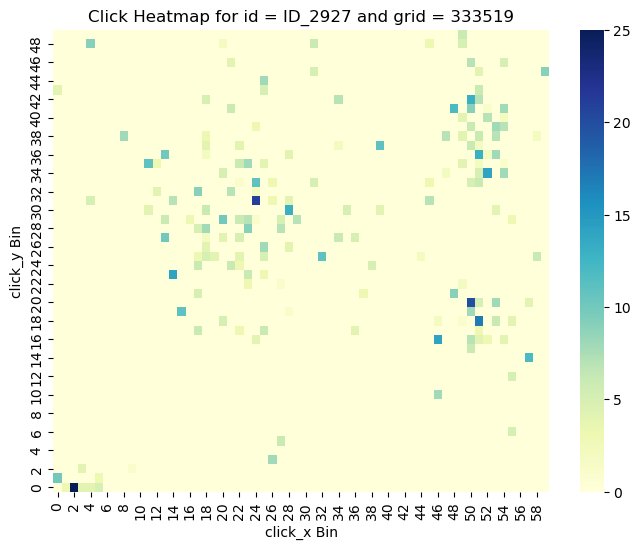

 Pct of broken domains according to prob method:  0.413
 Pct of broken domains according to both methods: 0.405
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.412
 Pct of broken domains according to both methods: 0.404
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.411
 Pct of broken domains according to both methods: 0.404
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2940
 p-value for chisquared test:  1.704293214505712e-207
 log-prob for prob method:     1.0397339541650229e-120


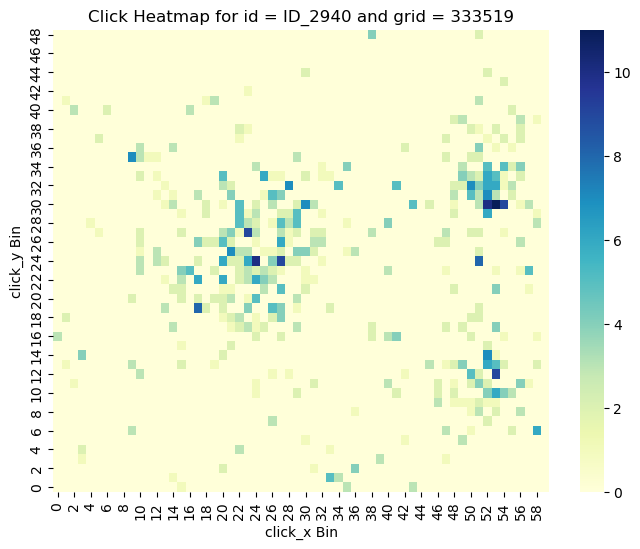

 Pct of broken domains according to prob method:  0.412
 Pct of broken domains according to both methods: 0.405
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2941
 p-value for chisquared test:  7.534205504106185e-40
 log-prob for prob method:     1.5334616819552098e-37


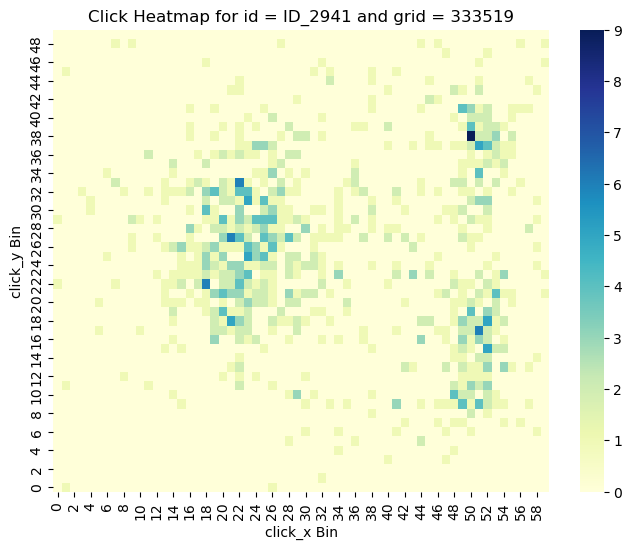

 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.406
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2955
 p-value for chisquared test:  3.511196624571376e-76
 log-prob for prob method:     4.770180216215254e-12


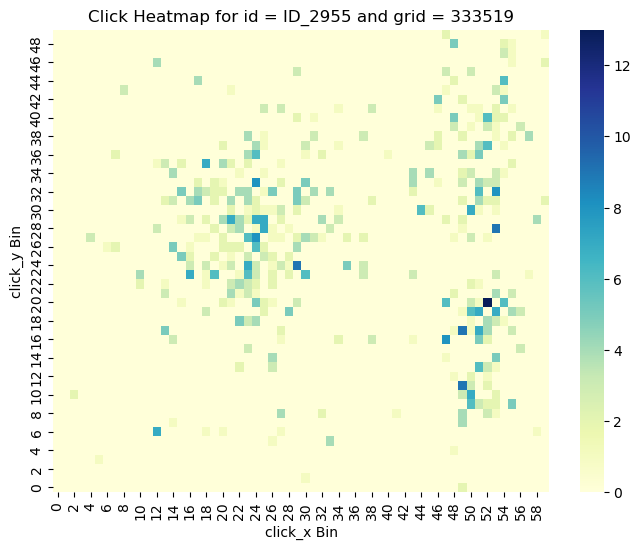

 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 grid id: 333519, domain id: ID_296
 p-value for chisquared test:  0.0
 log-prob for prob method:     2.290558389533044e-22


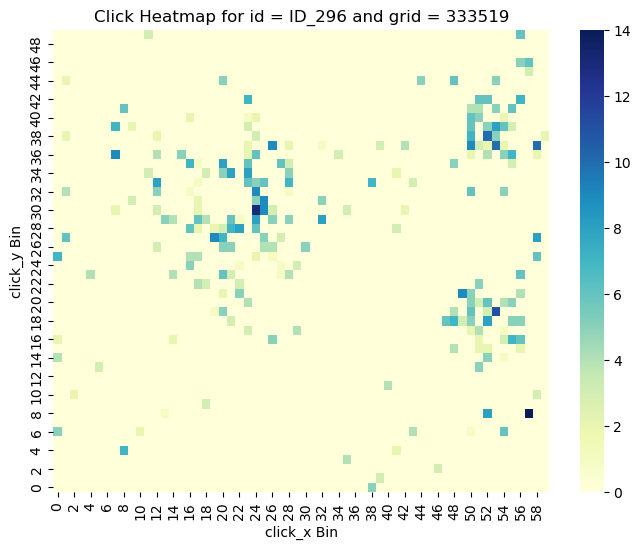

 Pct of broken domains according to prob method:  0.416
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2962
 p-value for chisquared test:  0.0
 log-prob for prob method:     9.955622236556122e-39


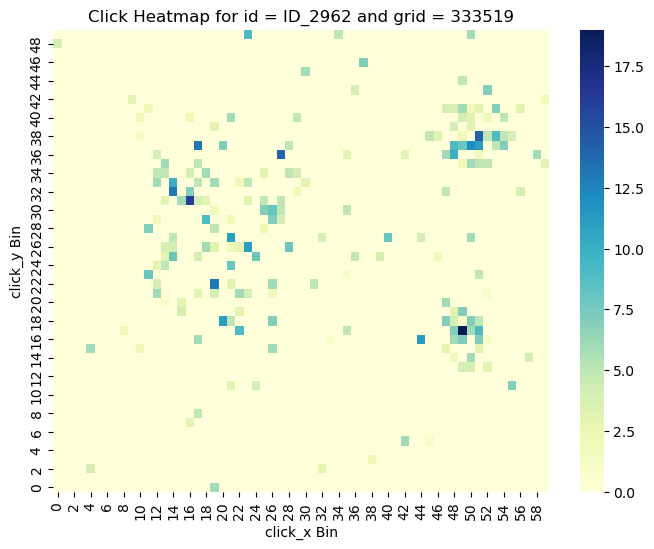

 Pct of broken domains according to prob method:  0.417
 Pct of broken domains according to both methods: 0.409
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.416
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2970
 p-value for chisquared test:  1.9806917638892156e-142
 log-prob for prob method:     8.350629039874856e-14


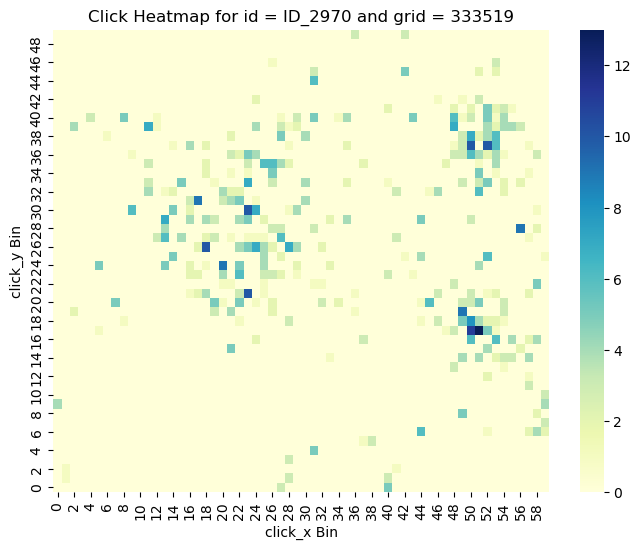

 Pct of broken domains according to prob method:  0.417
 Pct of broken domains according to both methods: 0.410
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.417
 Pct of broken domains according to both methods: 0.409
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.416
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 grid id: 333519, domain id: ID_298
 p-value for chisquared test:  6.071029877106826e-290
 log-prob for prob method:     1.2489246569538935e-32


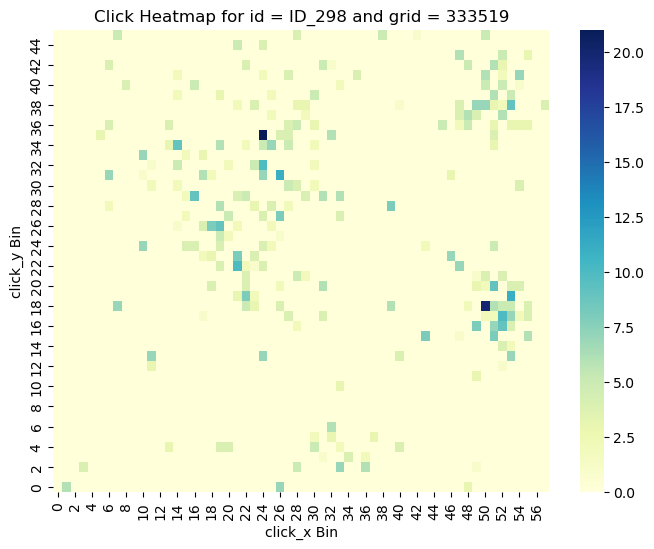

 Pct of broken domains according to prob method:  0.417
 Pct of broken domains according to both methods: 0.409
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.416
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2989
 p-value for chisquared test:  1.9765282213404142e-190
 log-prob for prob method:     4.0434744965812035e-55


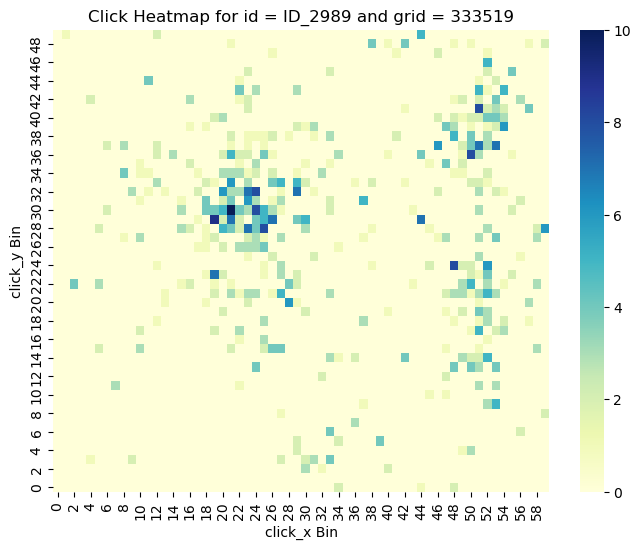

 Pct of broken domains according to prob method:  0.416
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.406
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.413
 Pct of broken domains according to both methods: 0.406
-----------------------------------------------------------
 grid id: 333519, domain id: ID_2996
 p-value for chisquared test:  0.0
 log-prob for prob method:     3.596359544677608e-102


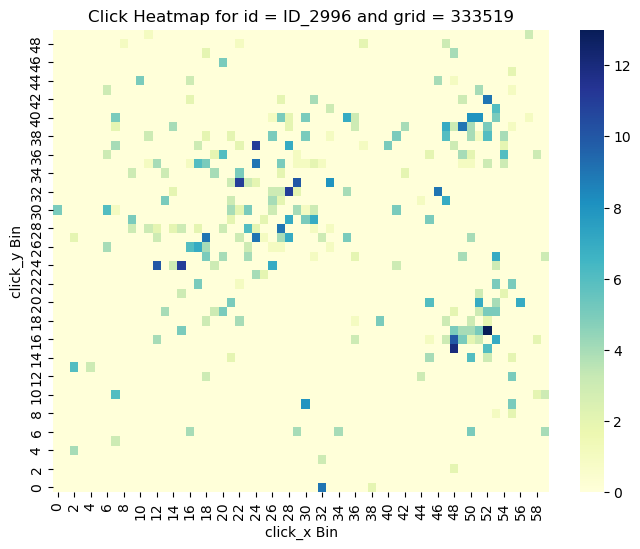

 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.406
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.413
 Pct of broken domains according to both methods: 0.405
-----------------------------------------------------------
 grid id: 333519, domain id: ID_3007
 p-value for chisquared test:  2.6958632180338944e-276
 log-prob for prob method:     9.438475611054238e-281


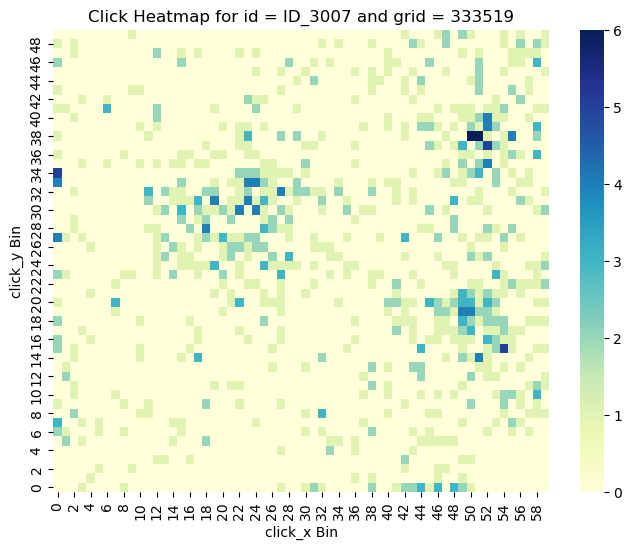

 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.406
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.413
 Pct of broken domains according to both methods: 0.406
-----------------------------------------------------------
 grid id: 333519, domain id: ID_301
 p-value for chisquared test:  1.4078452711350993e-273
 log-prob for prob method:     4.424594937562926e-15


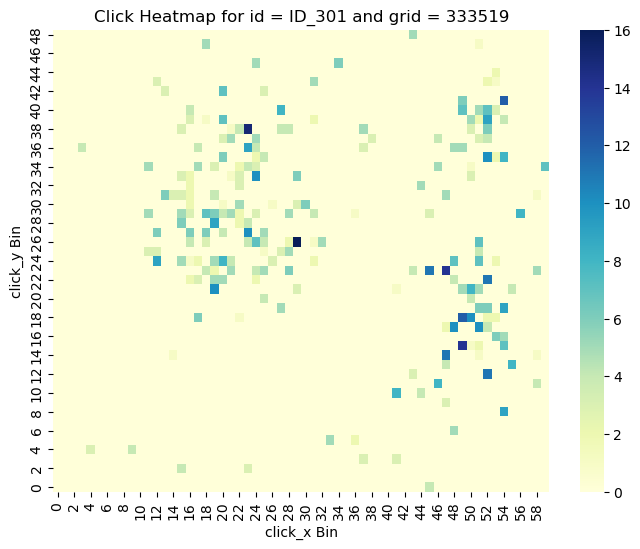

 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.413
 Pct of broken domains according to both methods: 0.406
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.413
 Pct of broken domains according to both methods: 0.405
-----------------------------------------------------------
 grid id: 333519, domain id: ID_3027
 p-value for chisquared test:  6.220911334420755e-168
 log-prob for prob method:     6.892763674290244e-51


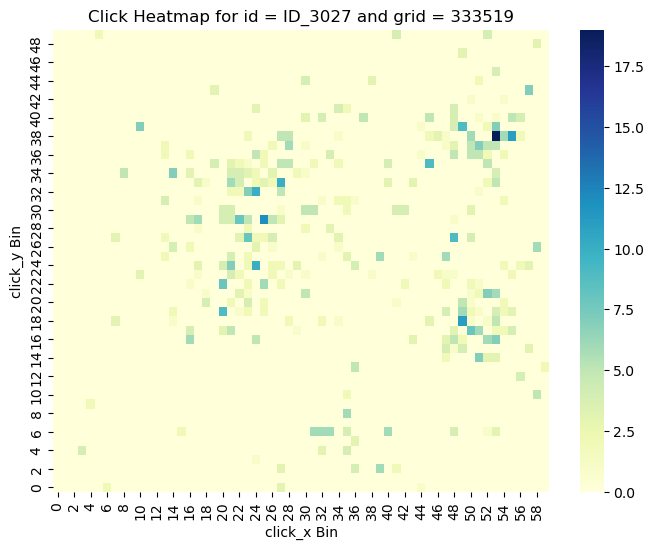

 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.406
-----------------------------------------------------------
 grid id: 333519, domain id: ID_3028
 p-value for chisquared test:  0.0
 log-prob for prob method:     1.9480145273654848e-57


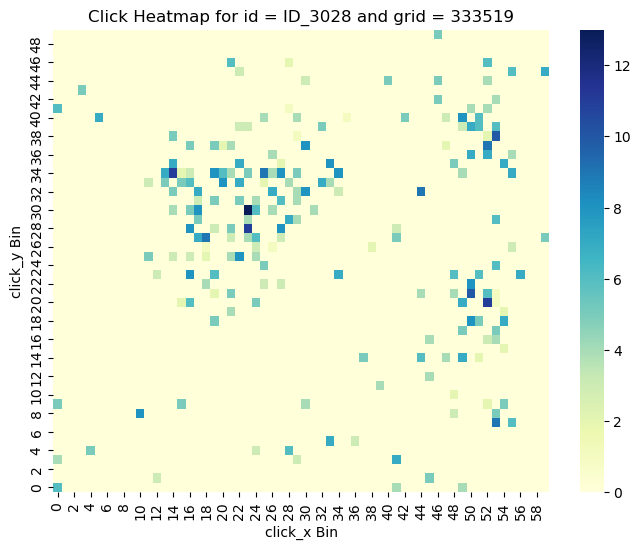

 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 grid id: 333519, domain id: ID_3039
 p-value for chisquared test:  1.1253018590612429e-115
 log-prob for prob method:     3.297723687318192e-111


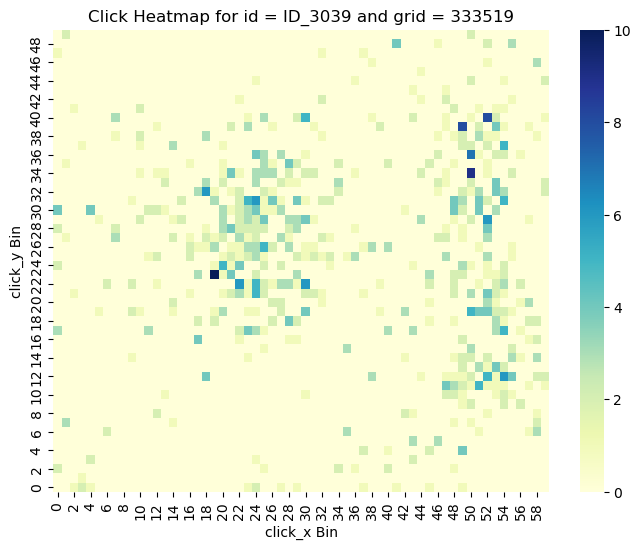

 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.406
-----------------------------------------------------------
 grid id: 333519, domain id: ID_3054
 p-value for chisquared test:  4.7824705500595394e-189
 log-prob for prob method:     3.2763838920951815e-91


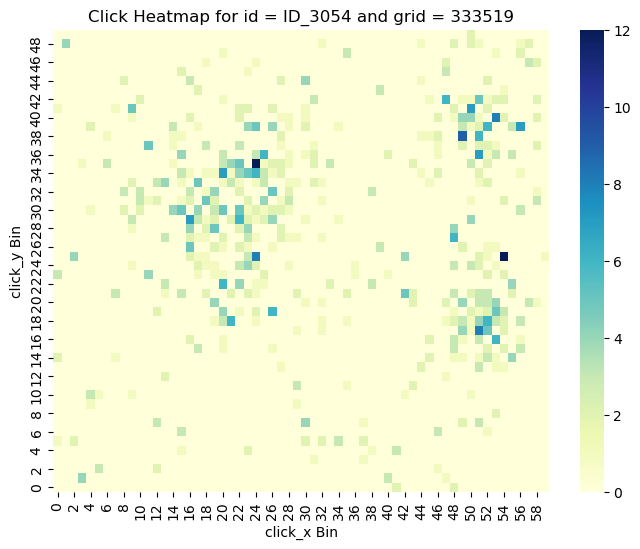

 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 grid id: 333519, domain id: ID_3056
 p-value for chisquared test:  0.0
 log-prob for prob method:     1.7613639665691436e-11


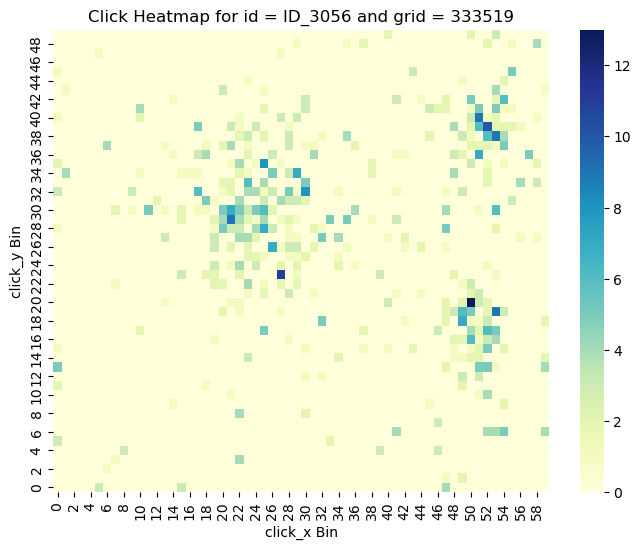

 Pct of broken domains according to prob method:  0.416
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 grid id: 333519, domain id: ID_3061
 p-value for chisquared test:  0.0
 log-prob for prob method:     0.0


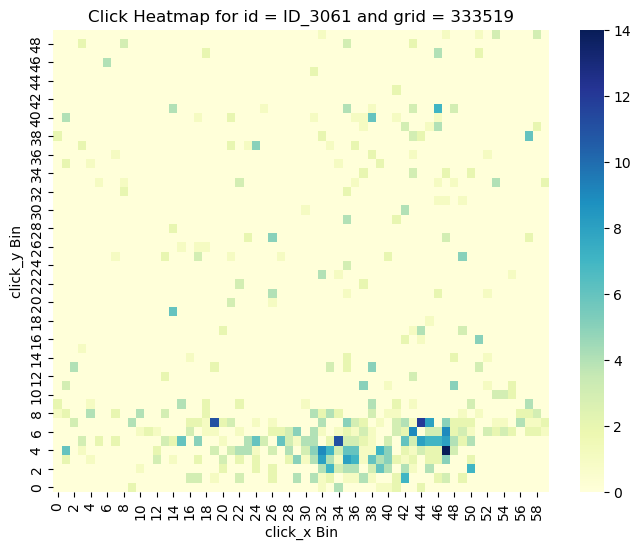

 Pct of broken domains according to prob method:  0.416
 Pct of broken domains according to both methods: 0.409
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 grid id: 333519, domain id: ID_3065
 p-value for chisquared test:  0.0
 log-prob for prob method:     1.1095815541991186e-305


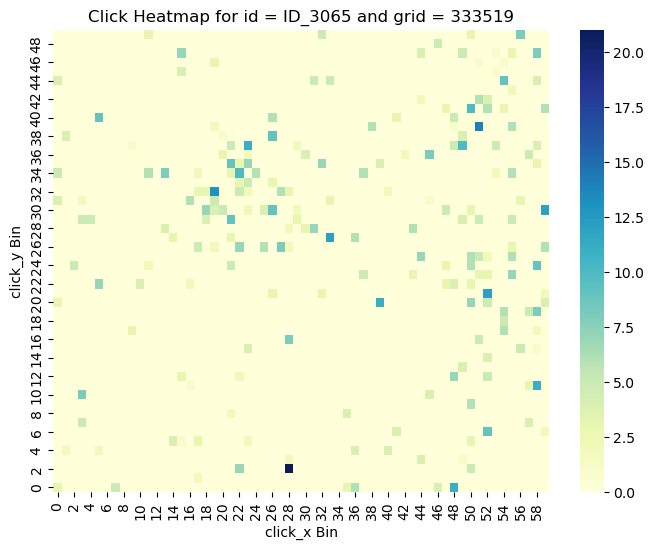

 Pct of broken domains according to prob method:  0.416
 Pct of broken domains according to both methods: 0.409
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.416
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 grid id: 333519, domain id: ID_308
 p-value for chisquared test:  0.0
 log-prob for prob method:     4.9854737915815106e-79


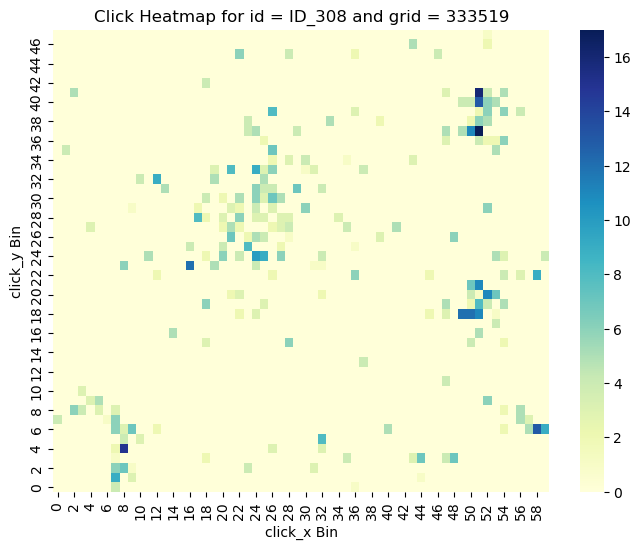

 Pct of broken domains according to prob method:  0.416
 Pct of broken domains according to both methods: 0.409
-----------------------------------------------------------
 grid id: 333519, domain id: ID_3082
 p-value for chisquared test:  8.835829539384975e-159
 log-prob for prob method:     6.469357308547486e-93


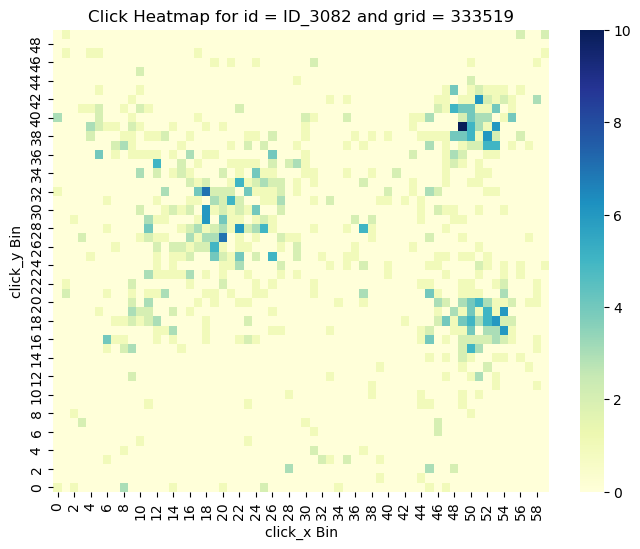

 Pct of broken domains according to prob method:  0.417
 Pct of broken domains according to both methods: 0.410
-----------------------------------------------------------
 grid id: 333519, domain id: ID_3085
 p-value for chisquared test:  1.4681815666009626e-194
 log-prob for prob method:     1.812261178474182e-79


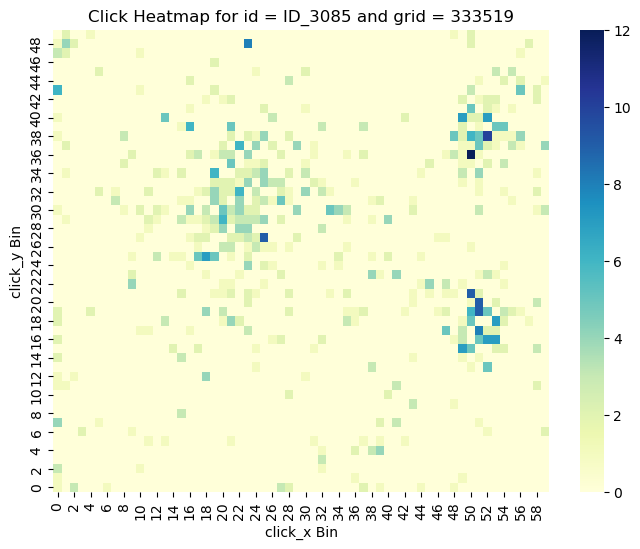

 Pct of broken domains according to prob method:  0.418
 Pct of broken domains according to both methods: 0.411
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.417
 Pct of broken domains according to both methods: 0.410
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.417
 Pct of broken domains according to both methods: 0.409
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.416
 Pct of broken domains according to both methods: 0.409
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.407
----------------------------

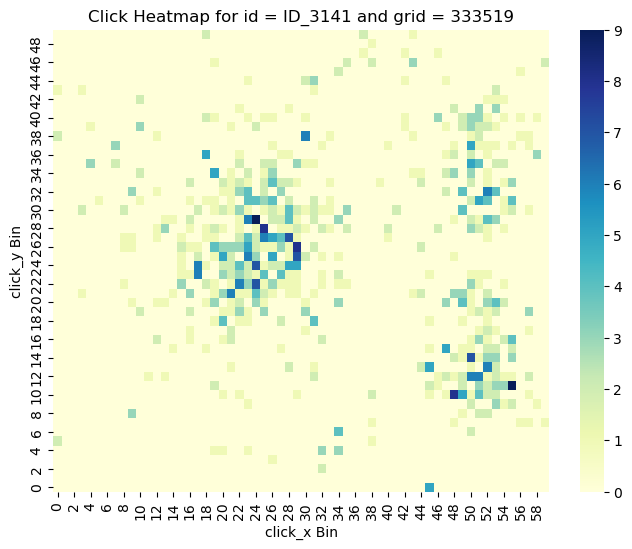

 Pct of broken domains according to prob method:  0.412
 Pct of broken domains according to both methods: 0.405
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.412
 Pct of broken domains according to both methods: 0.405
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.411
 Pct of broken domains according to both methods: 0.404
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.410
 Pct of broken domains according to both methods: 0.403
-----------------------------------------------------------
 grid id: 333519, domain id: ID_3148
 p-value for chisquared test:  1.7778144152757246e-145
 log-prob for prob method:     1.0164626797603392e-125


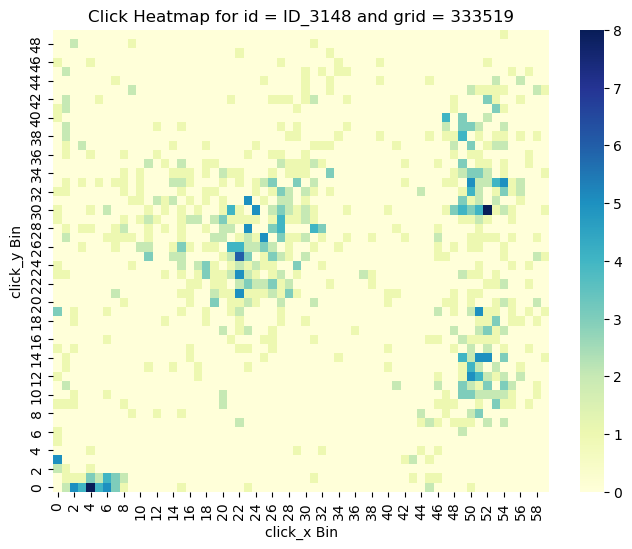

 Pct of broken domains according to prob method:  0.411
 Pct of broken domains according to both methods: 0.404
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.411
 Pct of broken domains according to both methods: 0.404
-----------------------------------------------------------
 grid id: 333519, domain id: ID_3161
 p-value for chisquared test:  0.0
 log-prob for prob method:     1.343275482659528e-27


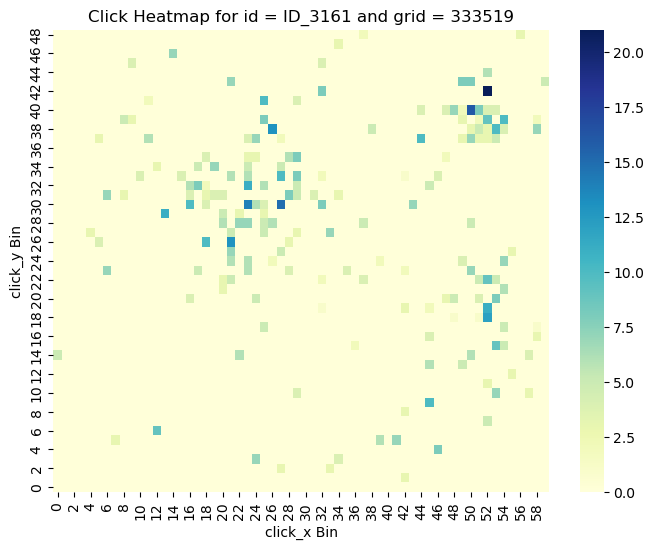

 Pct of broken domains according to prob method:  0.412
 Pct of broken domains according to both methods: 0.405
-----------------------------------------------------------
 grid id: 333519, domain id: ID_3166
 p-value for chisquared test:  0.0
 log-prob for prob method:     1.5828356279081578e-141


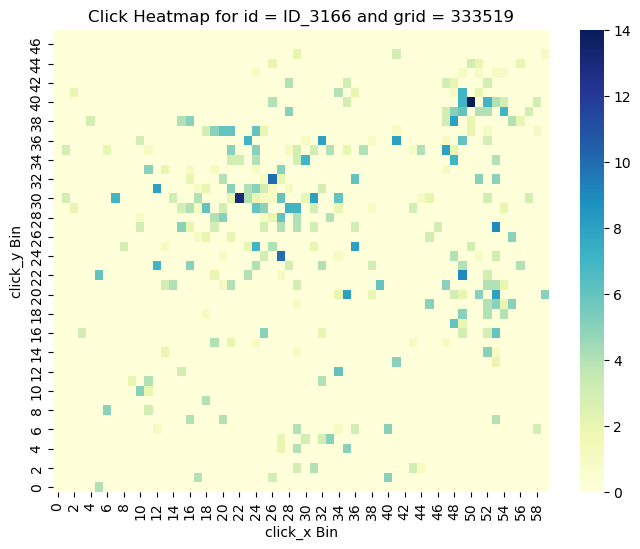

 Pct of broken domains according to prob method:  0.413
 Pct of broken domains according to both methods: 0.406
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.412
 Pct of broken domains according to both methods: 0.405
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.411
 Pct of broken domains according to both methods: 0.404
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.410
 Pct of broken domains according to both methods: 0.403
-----------------------------------------------------------
 grid id: 333519, domain id: ID_318
 p-value for chisquared test:  3.2237786501943532e-133
 log-prob for prob method:     2.5085467977789877e-77


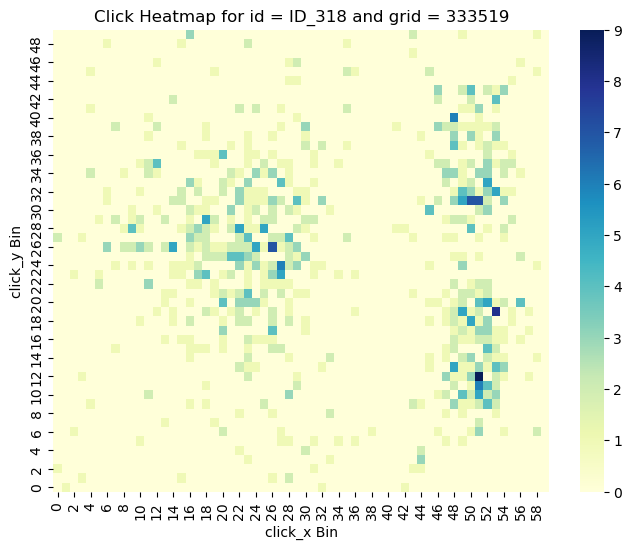

 Pct of broken domains according to prob method:  0.411
 Pct of broken domains according to both methods: 0.405
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.411
 Pct of broken domains according to both methods: 0.404
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.410
 Pct of broken domains according to both methods: 0.403
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.409
 Pct of broken domains according to both methods: 0.402
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.409
 Pct of broken domains according to both methods: 0.402
-----------------------------------------------------------
 grid id: 333519, domain id: ID_3193
 p-value for chisquared test:  4.289257067950205e-173
 log-prob for prob method:     1.0324906824955027

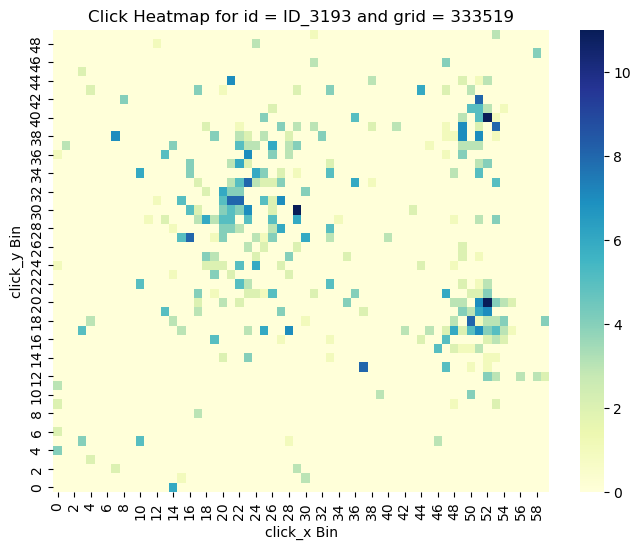

 Pct of broken domains according to prob method:  0.410
 Pct of broken domains according to both methods: 0.403
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.409
 Pct of broken domains according to both methods: 0.402
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.408
 Pct of broken domains according to both methods: 0.401
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.408
 Pct of broken domains according to both methods: 0.401
-----------------------------------------------------------
 grid id: 333519, domain id: ID_3204
 p-value for chisquared test:  8.003150299829188e-20
 log-prob for prob method:     5.146997982036618e-29


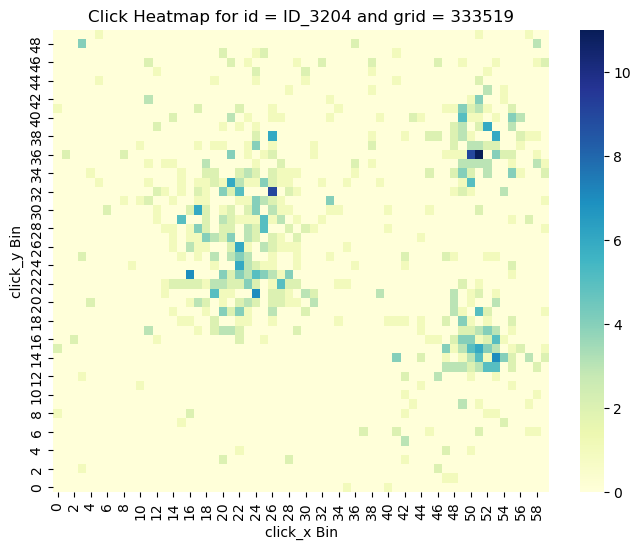

 Pct of broken domains according to prob method:  0.409
 Pct of broken domains according to both methods: 0.402
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.408
 Pct of broken domains according to both methods: 0.401
-----------------------------------------------------------
 grid id: 333519, domain id: ID_3211
 p-value for chisquared test:  0.0
 log-prob for prob method:     1.094909732435026e-50


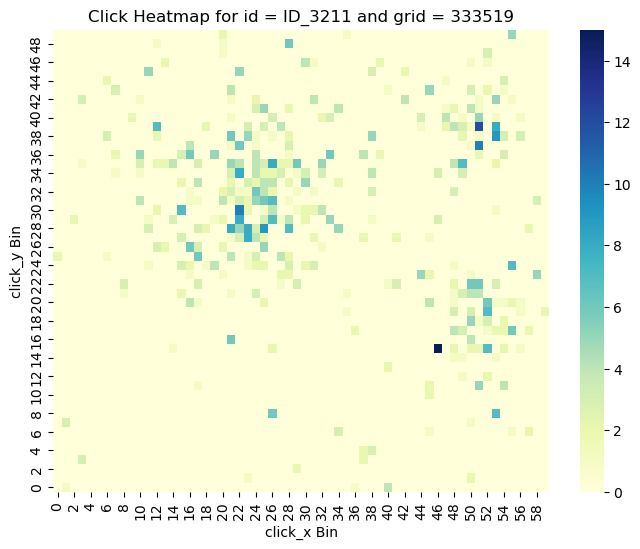

 Pct of broken domains according to prob method:  0.409
 Pct of broken domains according to both methods: 0.402
-----------------------------------------------------------
 grid id: 333519, domain id: ID_3214
 p-value for chisquared test:  0.0
 log-prob for prob method:     1.0067401464417792e-156


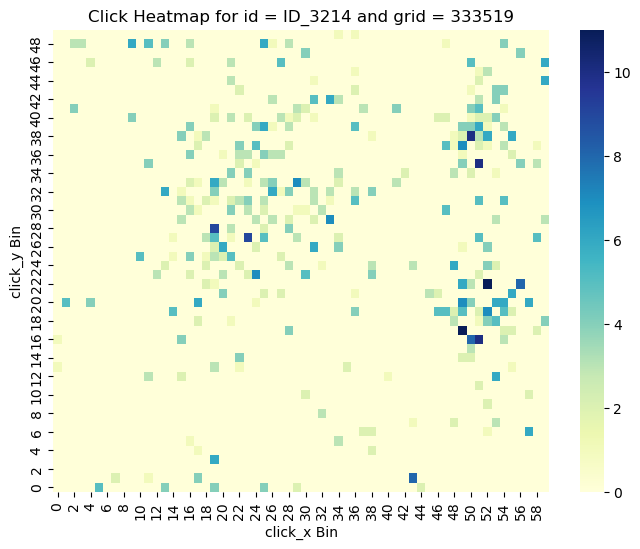

 Pct of broken domains according to prob method:  0.410
 Pct of broken domains according to both methods: 0.403
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.409
 Pct of broken domains according to both methods: 0.402
-----------------------------------------------------------
 grid id: 333519, domain id: ID_3237
 p-value for chisquared test:  3.303239999602254e-184
 log-prob for prob method:     3.0994163856484926e-13


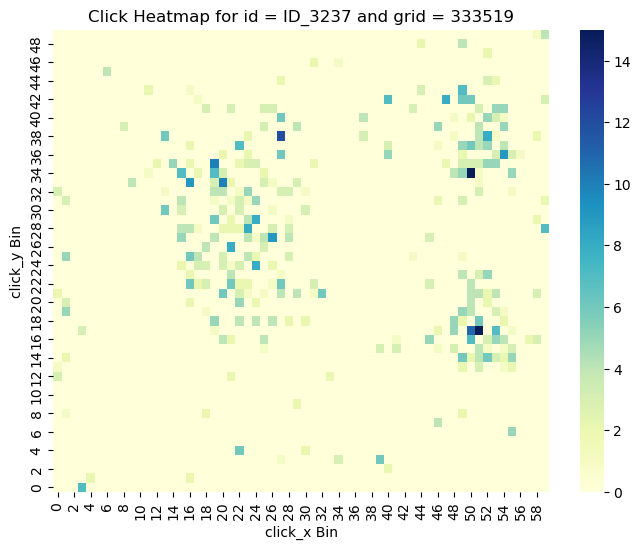

 Pct of broken domains according to prob method:  0.410
 Pct of broken domains according to both methods: 0.403
-----------------------------------------------------------
 grid id: 333519, domain id: ID_3242
 p-value for chisquared test:  0.0
 log-prob for prob method:     1.3169057966378453e-39


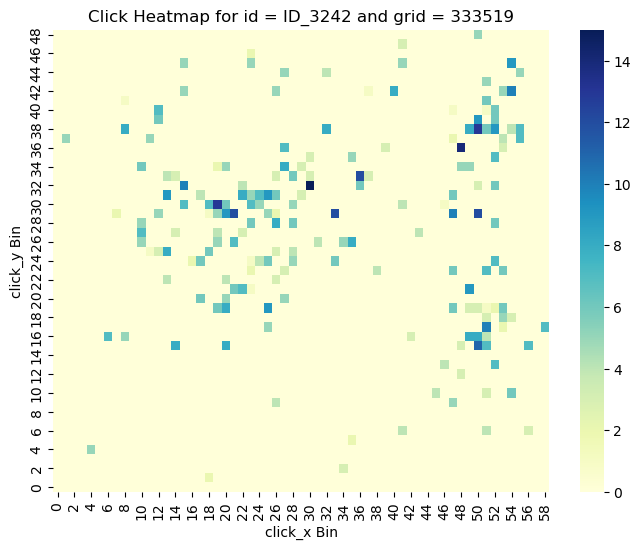

 Pct of broken domains according to prob method:  0.411
 Pct of broken domains according to both methods: 0.404
-----------------------------------------------------------
 grid id: 333519, domain id: ID_3243
 p-value for chisquared test:  0.0
 log-prob for prob method:     2.2090860389636676e-141


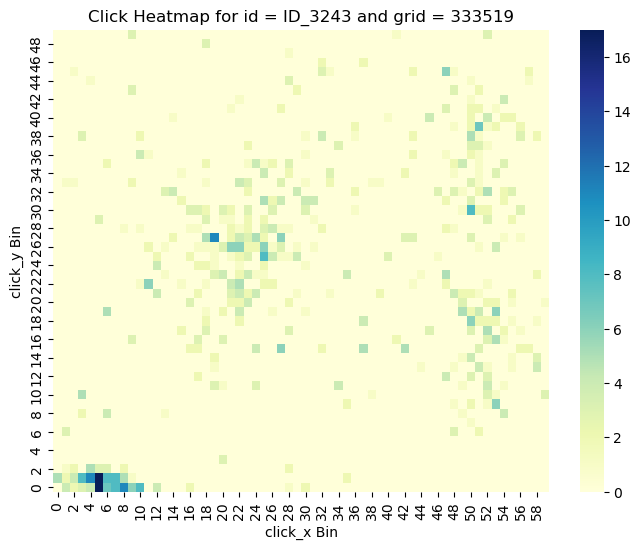

 Pct of broken domains according to prob method:  0.412
 Pct of broken domains according to both methods: 0.405
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.411
 Pct of broken domains according to both methods: 0.405
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.411
 Pct of broken domains according to both methods: 0.404
-----------------------------------------------------------
 grid id: 333519, domain id: ID_3250
 p-value for chisquared test:  0.0
 log-prob for prob method:     0.0


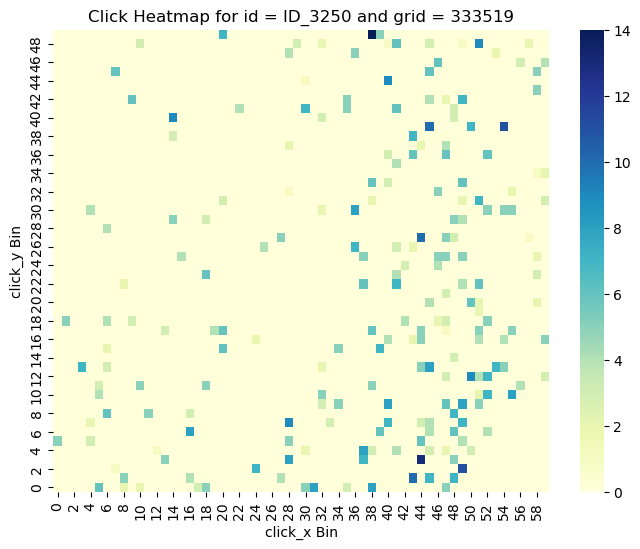

 Pct of broken domains according to prob method:  0.412
 Pct of broken domains according to both methods: 0.405
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.411
 Pct of broken domains according to both methods: 0.404
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.410
 Pct of broken domains according to both methods: 0.404
-----------------------------------------------------------
 grid id: 333519, domain id: ID_3260
 p-value for chisquared test:  0.0
 log-prob for prob method:     1.4863209424009438e-83


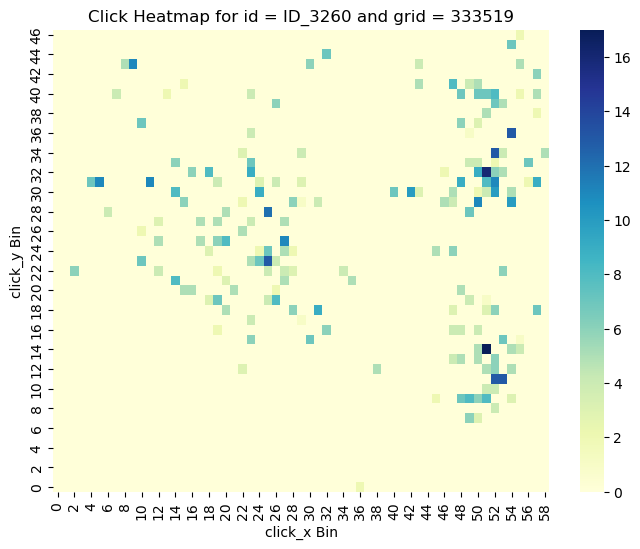

 Pct of broken domains according to prob method:  0.411
 Pct of broken domains according to both methods: 0.405
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.411
 Pct of broken domains according to both methods: 0.404
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.410
 Pct of broken domains according to both methods: 0.403
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.409
 Pct of broken domains according to both methods: 0.403
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.409
 Pct of broken domains according to both methods: 0.402
-----------------------------------------------------------
 grid id: 333519, domain id: ID_3276
 p-value for chisquared test:  0.0
 log-prob for prob method:     1.3260008280338086e-227


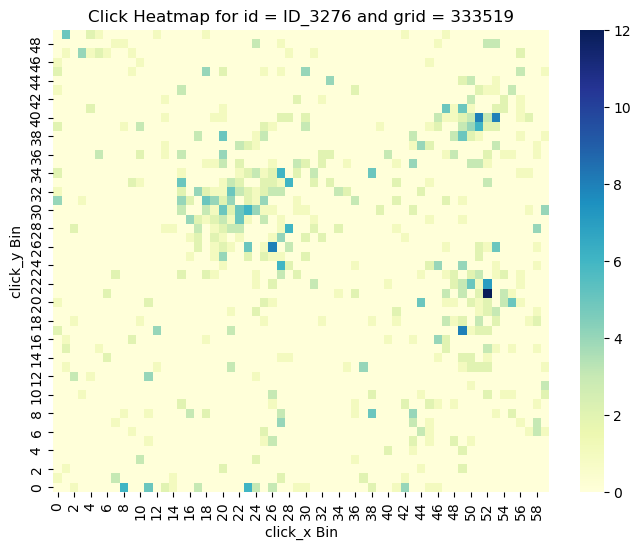

 Pct of broken domains according to prob method:  0.410
 Pct of broken domains according to both methods: 0.403
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.409
 Pct of broken domains according to both methods: 0.402
-----------------------------------------------------------
 grid id: 333519, domain id: ID_328
 p-value for chisquared test:  0.0
 log-prob for prob method:     6.610665596129598e-09


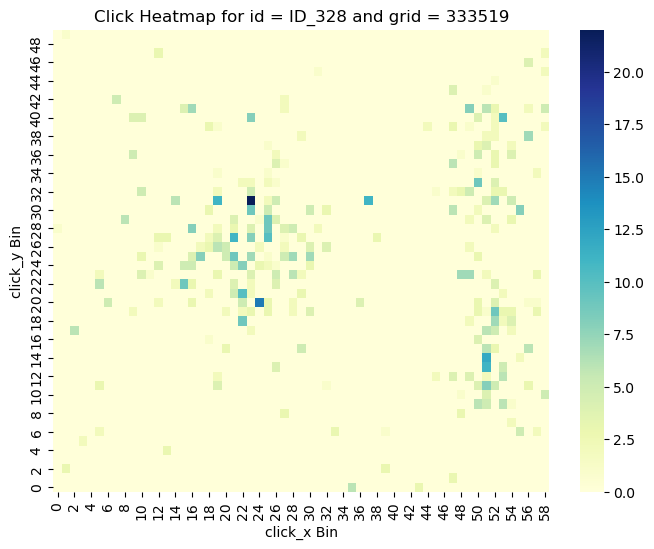

 Pct of broken domains according to prob method:  0.410
 Pct of broken domains according to both methods: 0.403
-----------------------------------------------------------
 grid id: 333519, domain id: ID_3288
 p-value for chisquared test:  2.9012093123347887e-96
 log-prob for prob method:     2.8821614186403435e-08


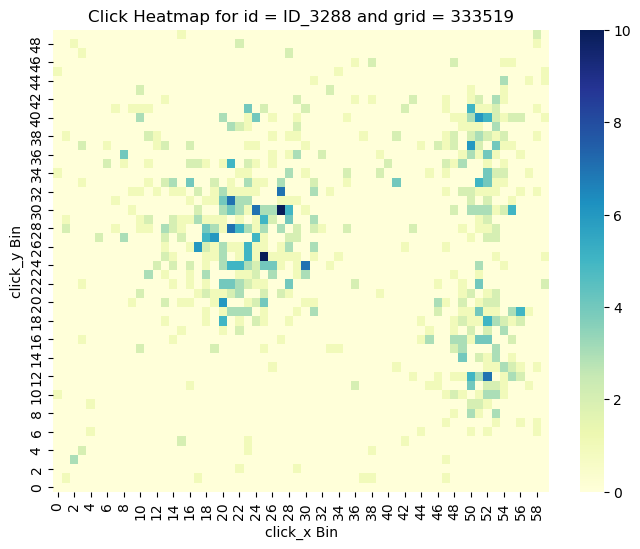

 Pct of broken domains according to prob method:  0.411
 Pct of broken domains according to both methods: 0.404
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.410
 Pct of broken domains according to both methods: 0.404
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.410
 Pct of broken domains according to both methods: 0.403
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.409
 Pct of broken domains according to both methods: 0.402
-----------------------------------------------------------
 grid id: 333519, domain id: ID_3306
 p-value for chisquared test:  0.0
 log-prob for prob method:     2.5369979735189864e-41


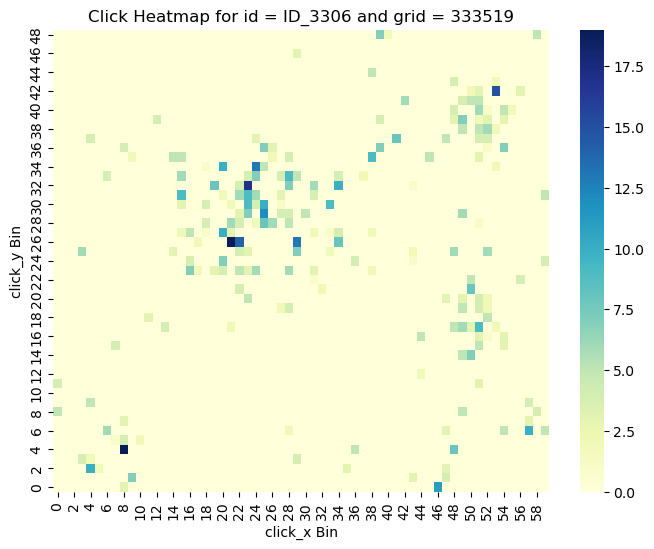

 Pct of broken domains according to prob method:  0.410
 Pct of broken domains according to both methods: 0.403
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.409
 Pct of broken domains according to both methods: 0.403
-----------------------------------------------------------
 grid id: 333519, domain id: ID_331
 p-value for chisquared test:  3.025655701604245e-62
 log-prob for prob method:     2.3680622953566262e-163


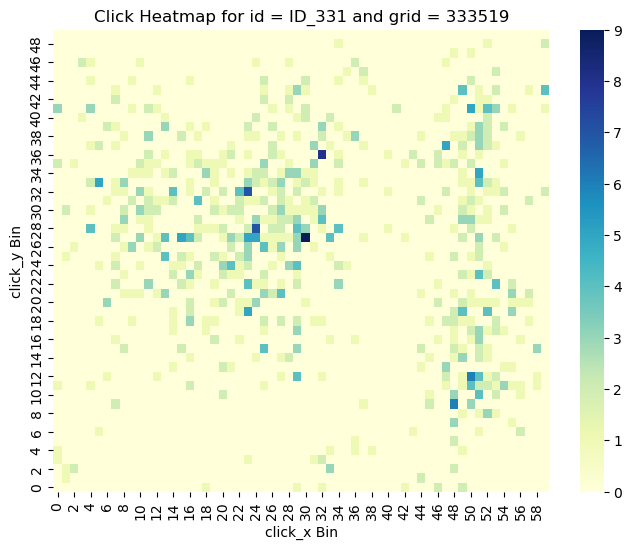

 Pct of broken domains according to prob method:  0.410
 Pct of broken domains according to both methods: 0.404
-----------------------------------------------------------
 grid id: 333519, domain id: ID_3310
 p-value for chisquared test:  7.361753497097106e-244
 log-prob for prob method:     3.503900648236307e-37


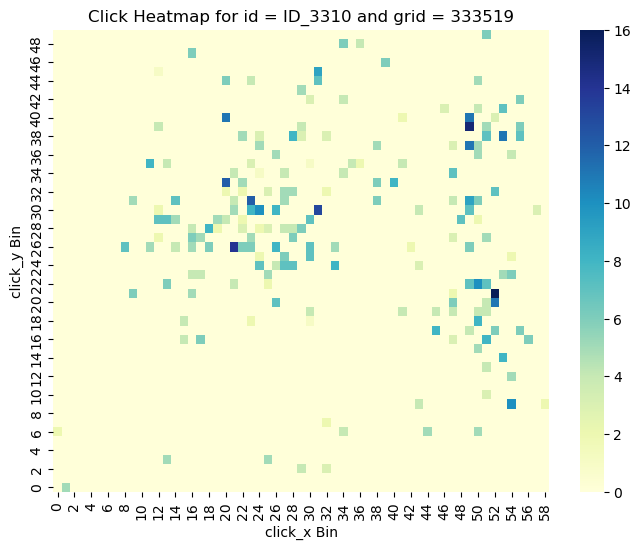

 Pct of broken domains according to prob method:  0.411
 Pct of broken domains according to both methods: 0.405
-----------------------------------------------------------
 grid id: 333519, domain id: ID_3314
 p-value for chisquared test:  0.0
 log-prob for prob method:     0.0


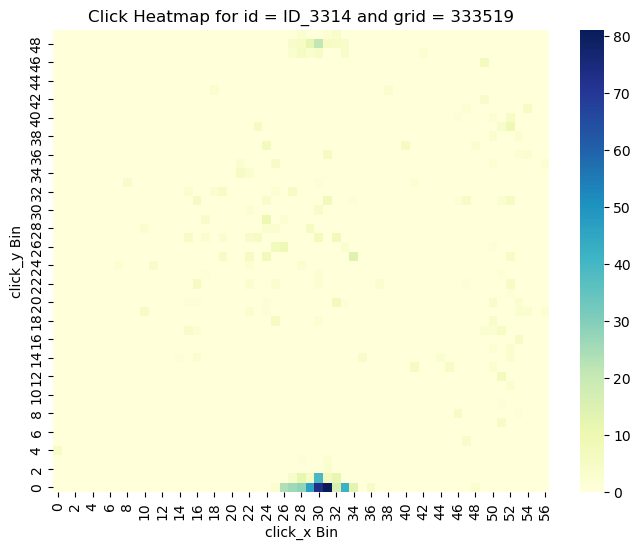

 Pct of broken domains according to prob method:  0.412
 Pct of broken domains according to both methods: 0.406
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.411
 Pct of broken domains according to both methods: 0.405
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.411
 Pct of broken domains according to both methods: 0.404
-----------------------------------------------------------
 grid id: 333519, domain id: ID_3328
 p-value for chisquared test:  2.4088794173452782e-278
 log-prob for prob method:     3.2649011234701625e-14


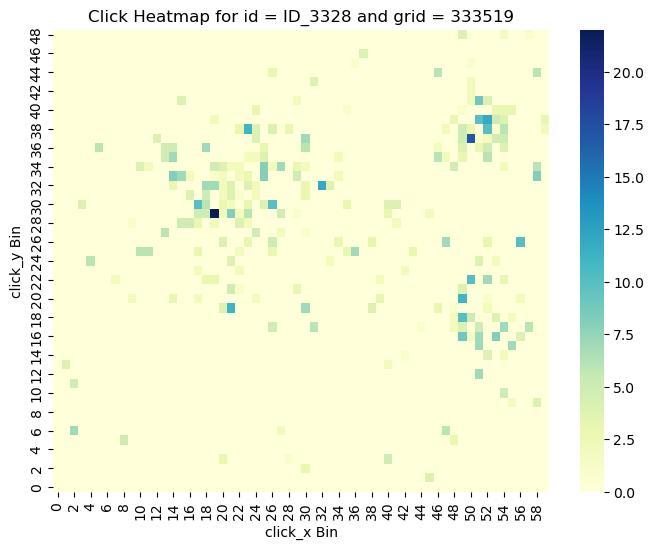

 Pct of broken domains according to prob method:  0.412
 Pct of broken domains according to both methods: 0.405
-----------------------------------------------------------
 grid id: 333519, domain id: ID_3334
 p-value for chisquared test:  2.7014633933105326e-155
 log-prob for prob method:     8.758721599734173e-29


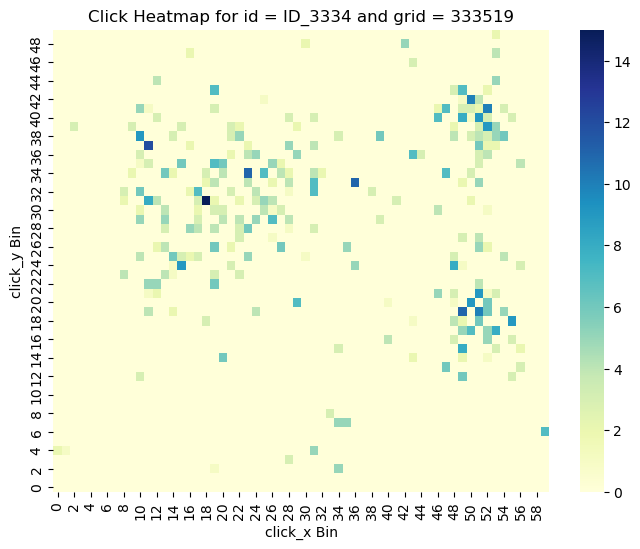

 Pct of broken domains according to prob method:  0.413
 Pct of broken domains according to both methods: 0.406
-----------------------------------------------------------
 grid id: 333519, domain id: ID_3335
 p-value for chisquared test:  0.0
 log-prob for prob method:     7.19673218265755e-71


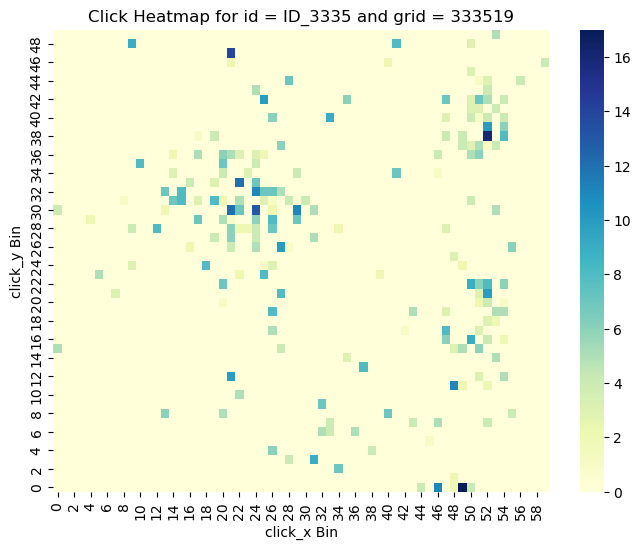

 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.413
 Pct of broken domains according to both methods: 0.406
-----------------------------------------------------------
 grid id: 333519, domain id: ID_3347
 p-value for chisquared test:  0.0
 log-prob for prob method:     6.840580360903e-58


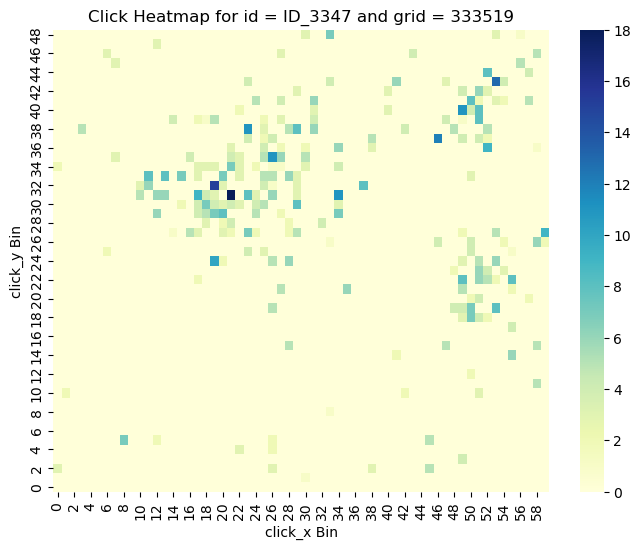

 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 grid id: 333519, domain id: ID_335
 p-value for chisquared test:  0.0
 log-prob for prob method:     4.1476956910008465e-120


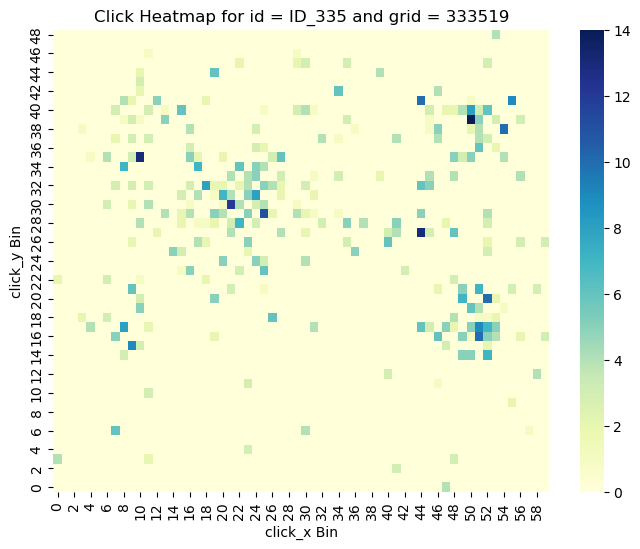

 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 grid id: 333519, domain id: ID_3350
 p-value for chisquared test:  1.1289991281342834e-106
 log-prob for prob method:     9.393155868881218e-87


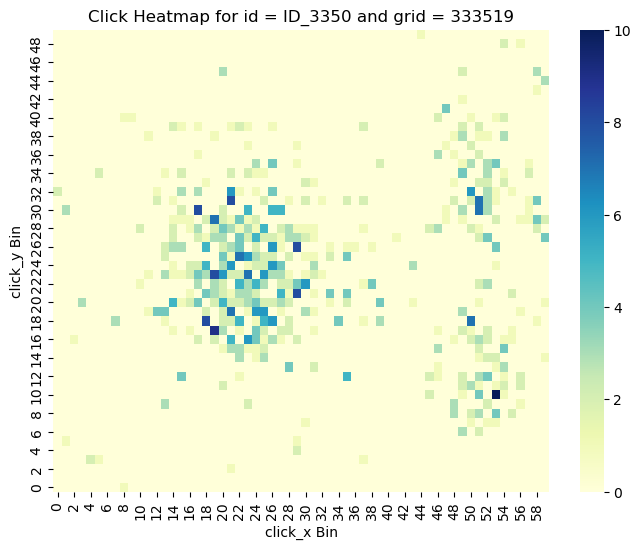

 Pct of broken domains according to prob method:  0.416
 Pct of broken domains according to both methods: 0.409
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.409
-----------------------------------------------------------
 grid id: 333519, domain id: ID_3356
 p-value for chisquared test:  4.528245661127564e-45
 log-prob for prob method:     1.8172461761808467e-37


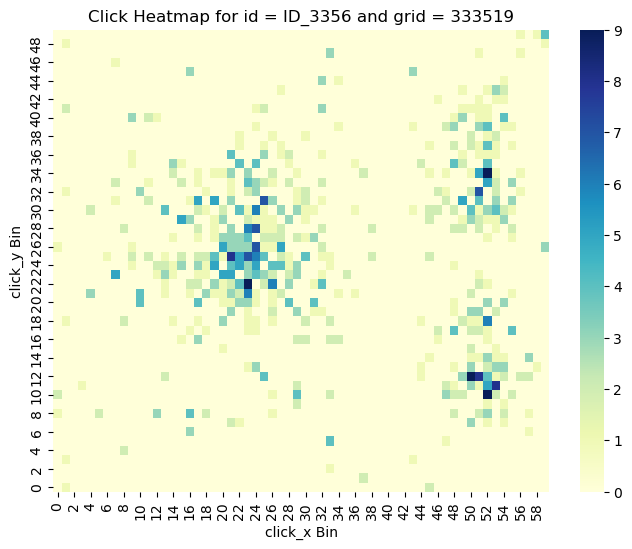

 Pct of broken domains according to prob method:  0.416
 Pct of broken domains according to both methods: 0.410
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.409
-----------------------------------------------------------
 grid id: 333519, domain id: ID_3359
 p-value for chisquared test:  0.0
 log-prob for prob method:     3.340788059129057e-95


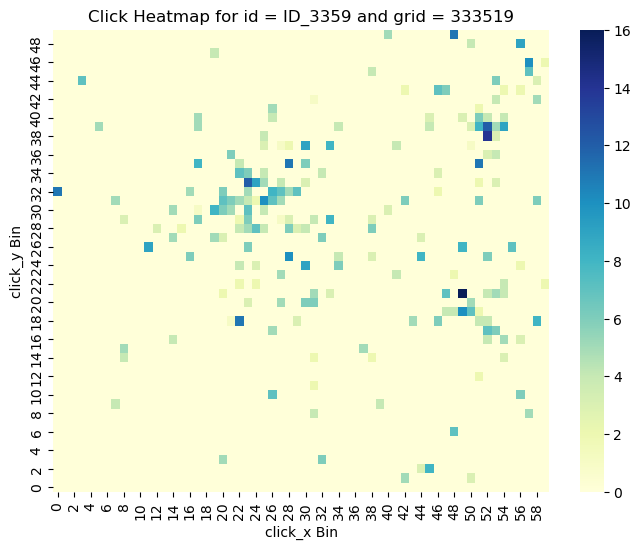

 Pct of broken domains according to prob method:  0.416
 Pct of broken domains according to both methods: 0.410
-----------------------------------------------------------
 grid id: 333519, domain id: ID_336
 p-value for chisquared test:  0.0
 log-prob for prob method:     8.058715915144136e-184


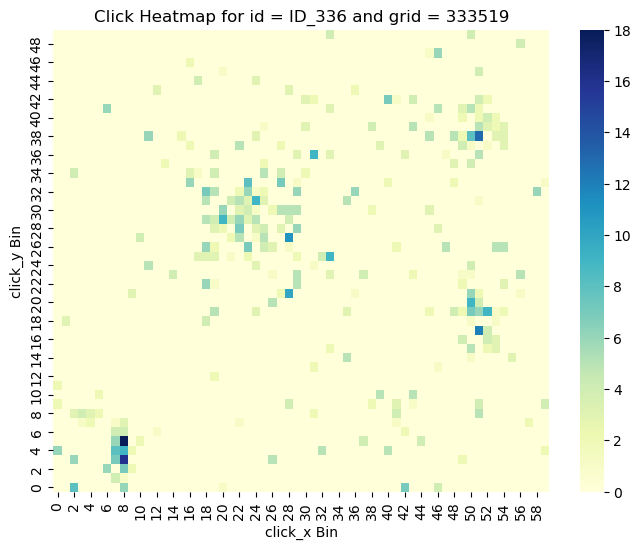

 Pct of broken domains according to prob method:  0.417
 Pct of broken domains according to both methods: 0.411
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.417
 Pct of broken domains according to both methods: 0.410
-----------------------------------------------------------
 grid id: 333519, domain id: ID_3368
 p-value for chisquared test:  1.1067259975718987e-20
 log-prob for prob method:     7.046273950886652e-41


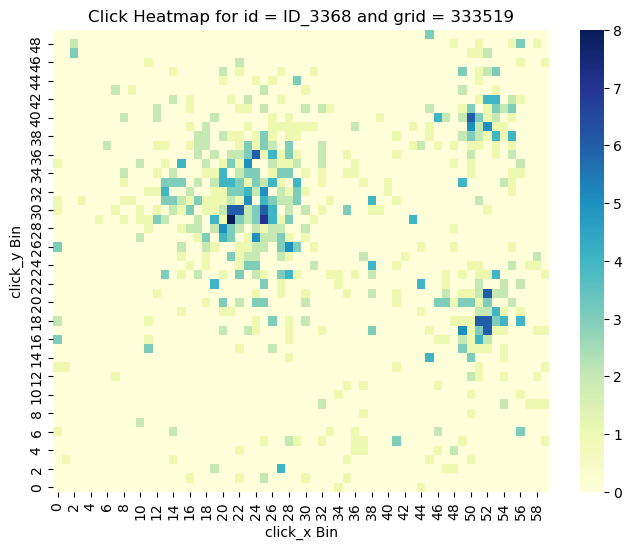

 Pct of broken domains according to prob method:  0.417
 Pct of broken domains according to both methods: 0.411
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.417
 Pct of broken domains according to both methods: 0.410
-----------------------------------------------------------
 grid id: 333519, domain id: ID_3382
 p-value for chisquared test:  0.0
 log-prob for prob method:     3.057389527095799e-214


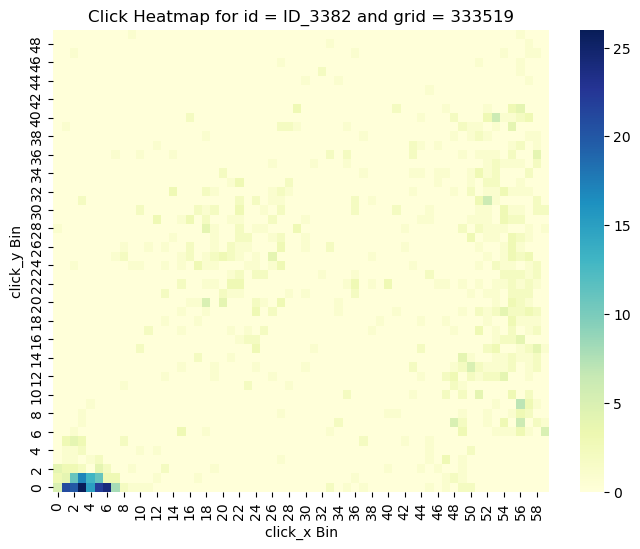

 Pct of broken domains according to prob method:  0.418
 Pct of broken domains according to both methods: 0.411
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.417
 Pct of broken domains according to both methods: 0.411
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.416
 Pct of broken domains according to both methods: 0.410
-----------------------------------------------------------
 grid id: 333519, domain id: ID_3397
 p-value for chisquared test:  0.0
 log-prob for prob method:     0.0


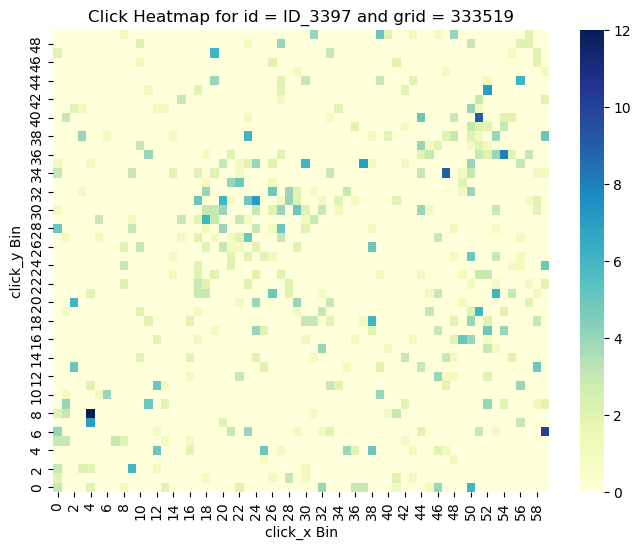

 Pct of broken domains according to prob method:  0.417
 Pct of broken domains according to both methods: 0.411
-----------------------------------------------------------
 grid id: 333519, domain id: ID_3402
 p-value for chisquared test:  0.0
 log-prob for prob method:     2.5858058158145514e-240


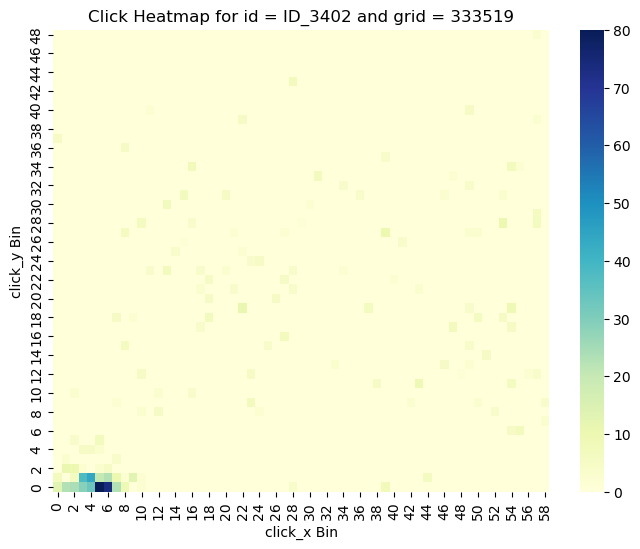

 Pct of broken domains according to prob method:  0.418
 Pct of broken domains according to both methods: 0.412
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.418
 Pct of broken domains according to both methods: 0.411
-----------------------------------------------------------
 grid id: 333519, domain id: ID_3414
 p-value for chisquared test:  0.0
 log-prob for prob method:     6.590226939142423e-187


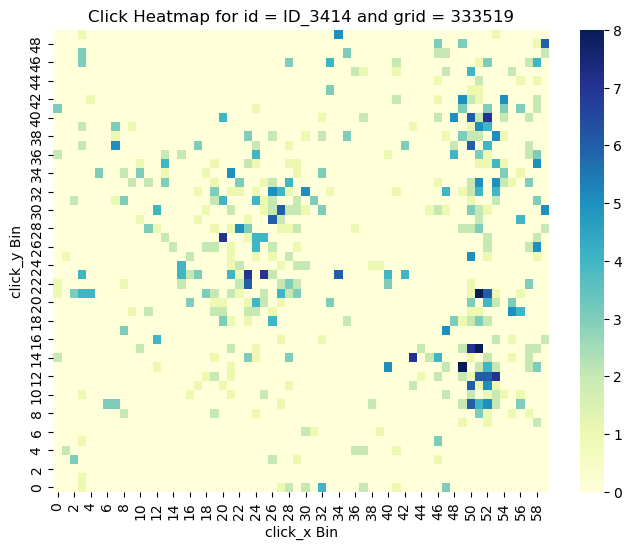

 Pct of broken domains according to prob method:  0.418
 Pct of broken domains according to both methods: 0.412
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.418
 Pct of broken domains according to both methods: 0.412
-----------------------------------------------------------
 grid id: 333519, domain id: ID_3420
 p-value for chisquared test:  0.0
 log-prob for prob method:     0.0


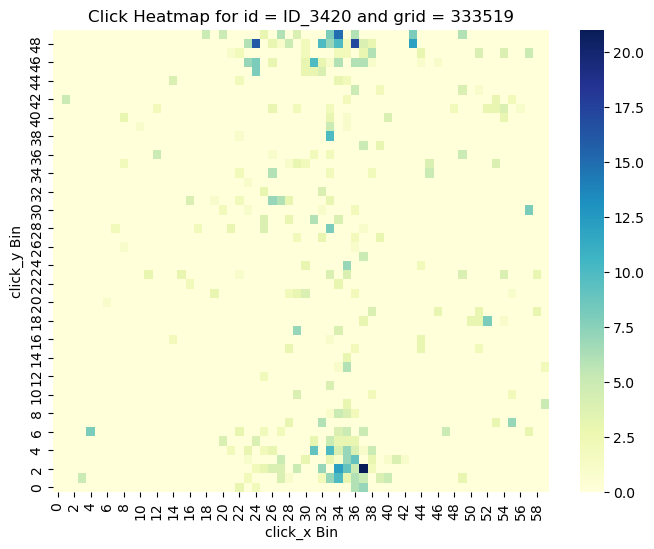

 Pct of broken domains according to prob method:  0.419
 Pct of broken domains according to both methods: 0.412
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.418
 Pct of broken domains according to both methods: 0.412
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.417
 Pct of broken domains according to both methods: 0.411
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.417
 Pct of broken domains according to both methods: 0.411
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.416
 Pct of broken domains according to both methods: 0.410
-----------------------------------------------------------
 grid id: 333519, domain id: ID_3439
 p-value for chisquared test:  6.960468659643878e-79
 log-prob for prob method:     5.552735940873819e-

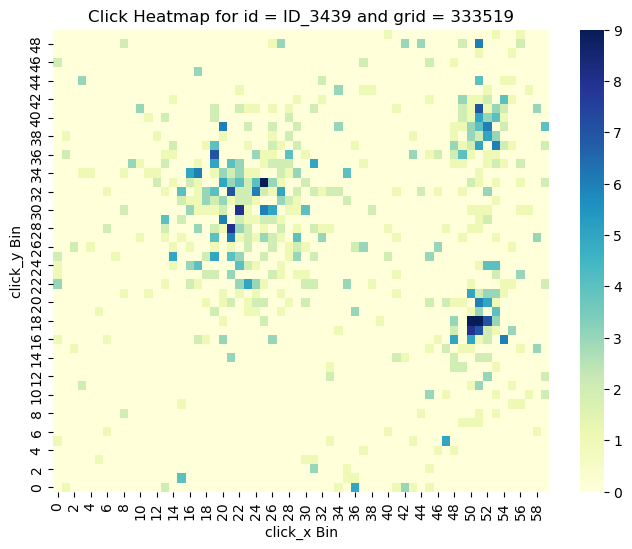

 Pct of broken domains according to prob method:  0.417
 Pct of broken domains according to both methods: 0.411
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.416
 Pct of broken domains according to both methods: 0.410
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.416
 Pct of broken domains according to both methods: 0.410
-----------------------------------------------------------
 grid id: 333519, domain id: ID_3453
 p-value for chisquared test:  1.0334054607792451e-97
 log-prob for prob method:     9.286736282017453e-32


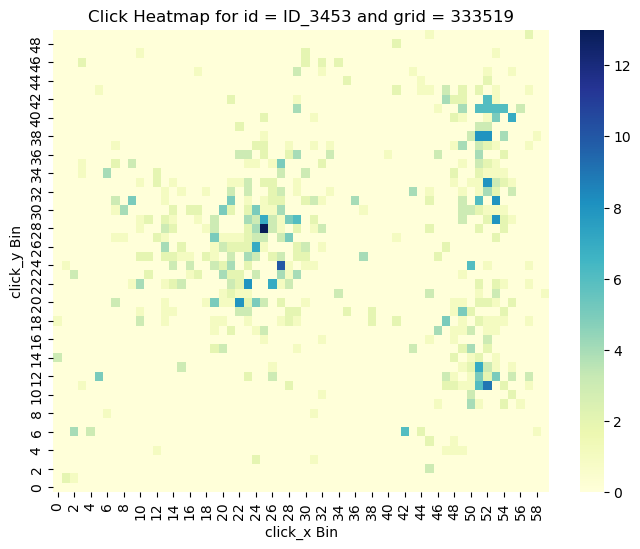

 Pct of broken domains according to prob method:  0.417
 Pct of broken domains according to both methods: 0.410
-----------------------------------------------------------
 grid id: 333519, domain id: ID_3456
 p-value for chisquared test:  8.285793901343627e-105
 log-prob for prob method:     5.815869889082794e-116


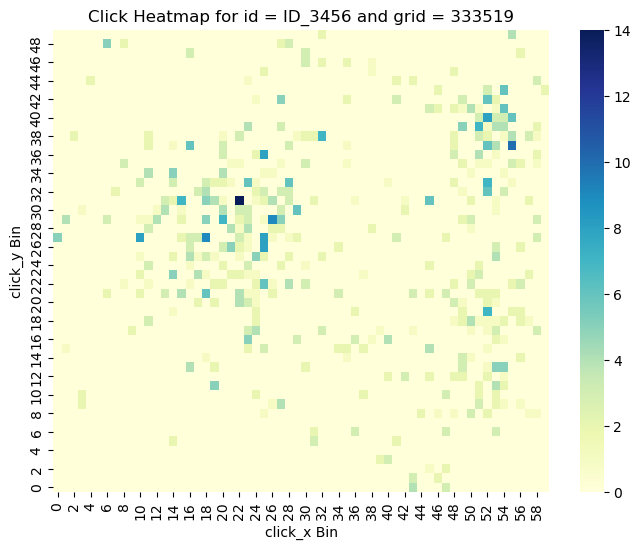

 Pct of broken domains according to prob method:  0.418
 Pct of broken domains according to both methods: 0.411
-----------------------------------------------------------
 grid id: 333519, domain id: ID_3459
 p-value for chisquared test:  0.0
 log-prob for prob method:     9.157332890931607e-217


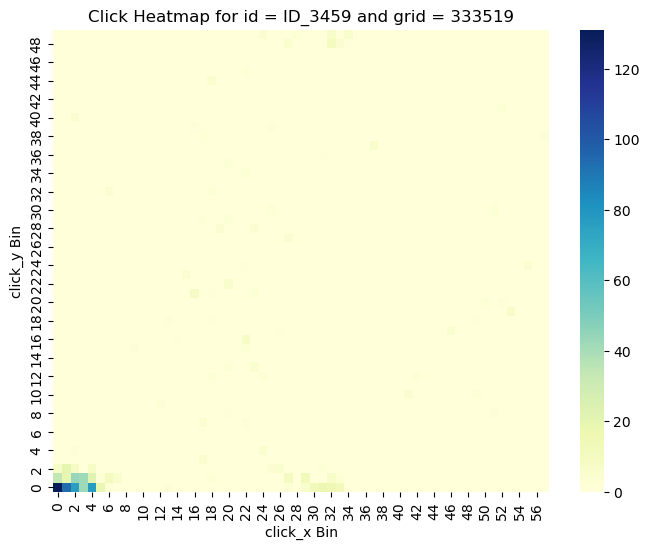

 Pct of broken domains according to prob method:  0.418
 Pct of broken domains according to both methods: 0.412
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.418
 Pct of broken domains according to both methods: 0.412
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.417
 Pct of broken domains according to both methods: 0.411
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.417
 Pct of broken domains according to both methods: 0.410
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.416
 Pct of broken domains according to both methods: 0.410
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.409
----------------------------

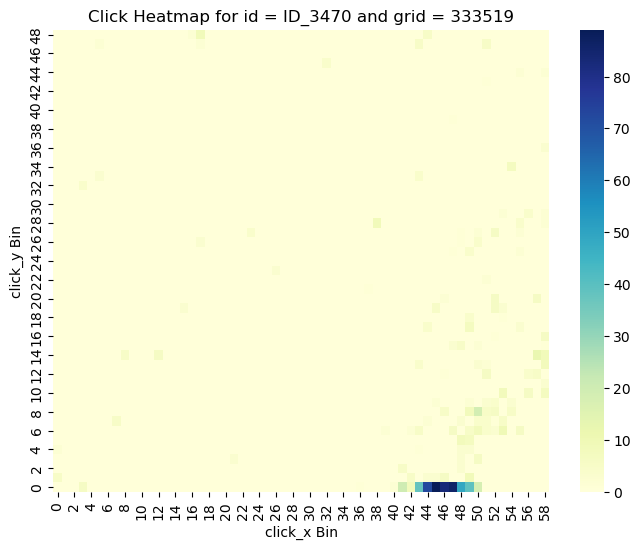

 Pct of broken domains according to prob method:  0.416
 Pct of broken domains according to both methods: 0.410
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.416
 Pct of broken domains according to both methods: 0.409
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.409
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 grid id: 333519, domain id: ID_35
 p-value for chisquared test:  1.8170547730026858e-110
 log-prob for prob method:     1.5995064603197477e

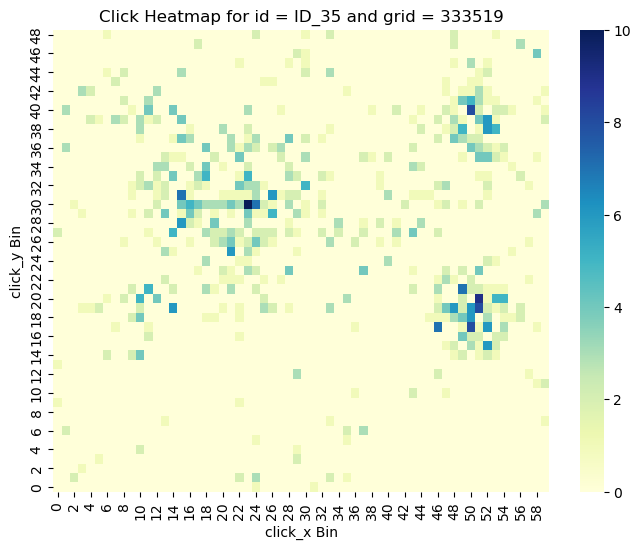

 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.413
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.413
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 grid id: 333519, domain id: ID_3506
 p-value for chisquared test:  2.7041152279816396e-111
 log-prob for prob method:     1.239370512882061e-40


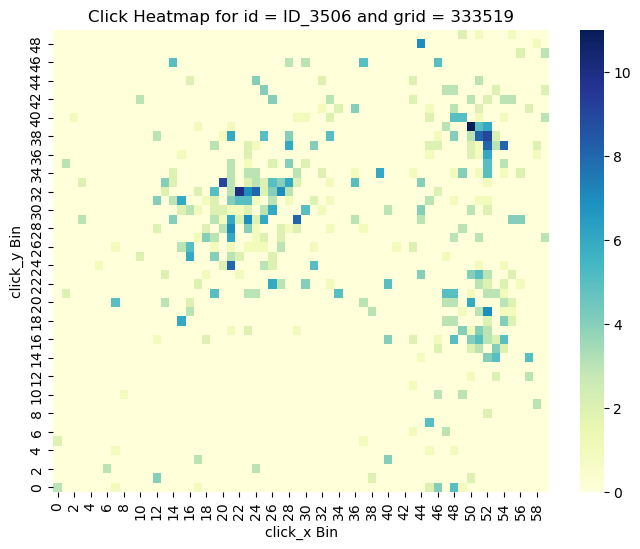

 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.413
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 grid id: 333519, domain id: ID_3518
 p-value for chisquared test:  3.881652117063208e-148
 log-prob for prob method:     3.119045557166323e-72


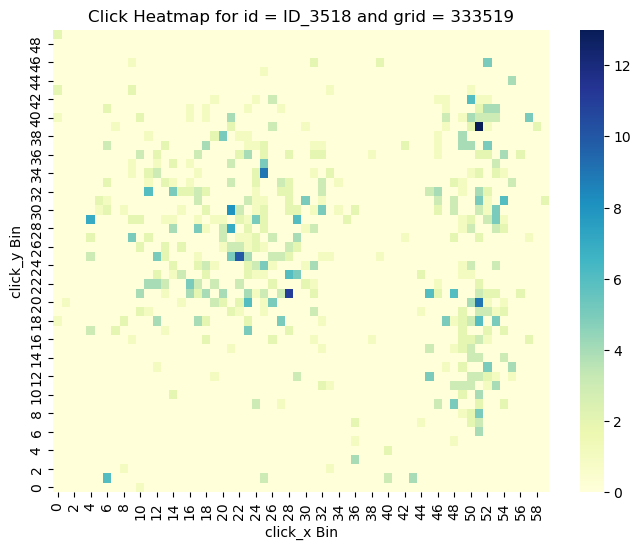

 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.413
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.413
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 grid id: 333519, domain id: ID_3534
 p-value for chisquared test:  0.0
 log-prob for prob method:     1.3892027172958696e-193


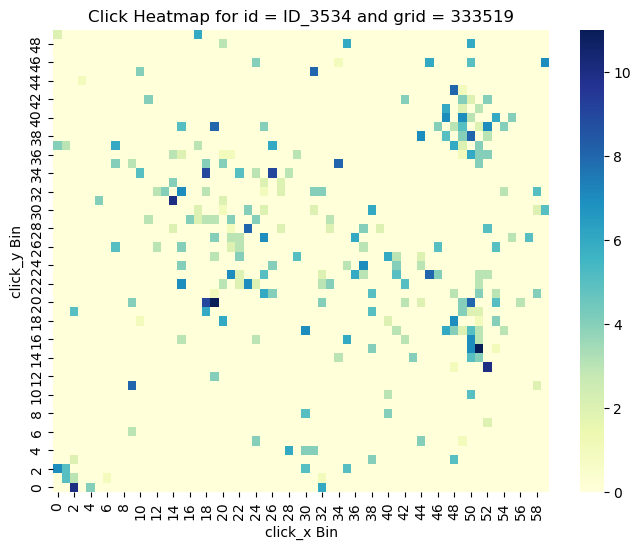

 Pct of broken domains according to prob method:  0.413
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.413
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 grid id: 333519, domain id: ID_3540
 p-value for chisquared test:  0.0
 log-prob for prob method:     2.3163554352279444e-237


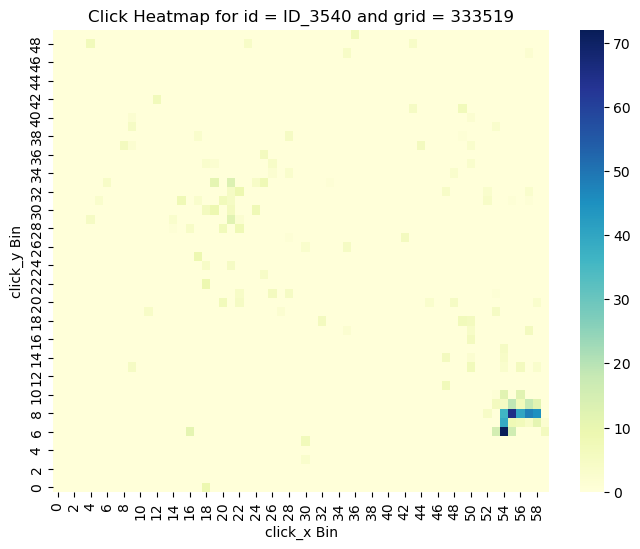

 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 grid id: 333519, domain id: ID_3543
 p-value for chisquared test:  1.3303322403717488e-36
 log-prob for prob method:     1.1163568741220713e-53


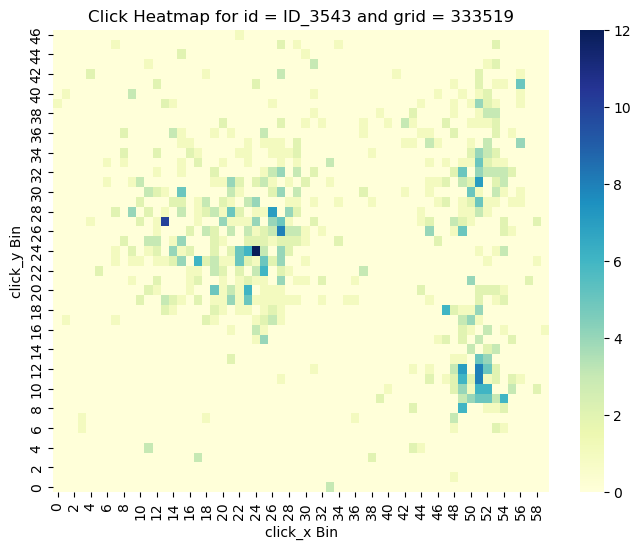

 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.409
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.413
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 grid id: 333519, domain id: ID_3554
 p-value for chisquared test:  0.0
 log-prob for prob method:     1.002754895610222e-31


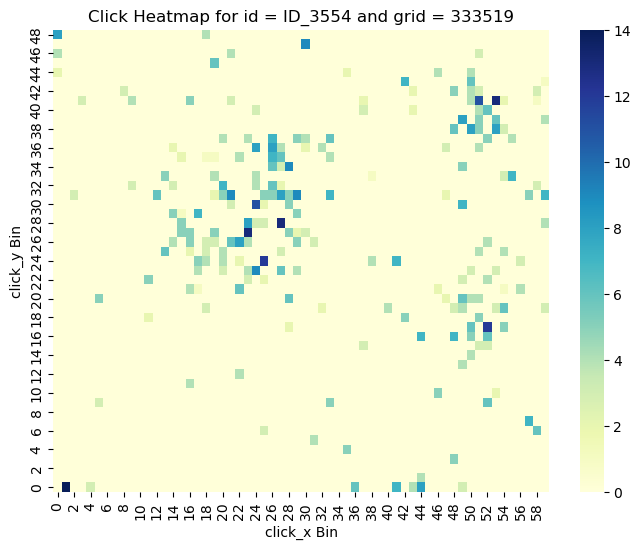

 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.413
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.412
 Pct of broken domains according to both methods: 0.406
-----------------------------------------------------------
 grid id: 333519, domain id: ID_3564
 p-value for chisquared test:  3.18905411708875e-189
 log-prob for prob method:     3.6858347507487556e-42


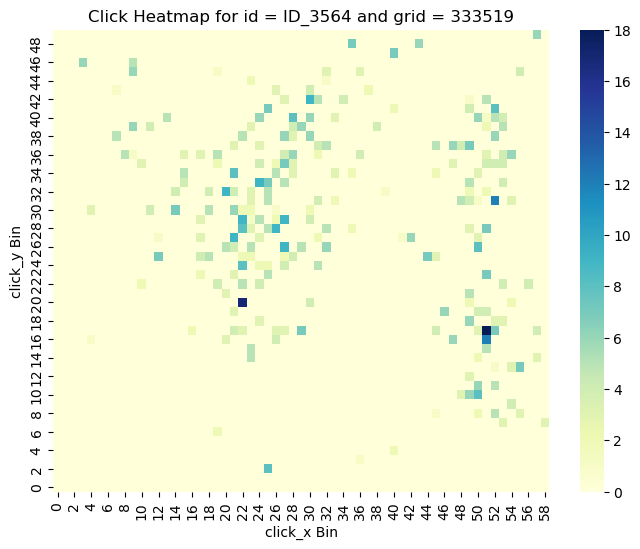

 Pct of broken domains according to prob method:  0.413
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 grid id: 333519, domain id: ID_360
 p-value for chisquared test:  3.1254028625861393e-97
 log-prob for prob method:     2.804946252872574e-74


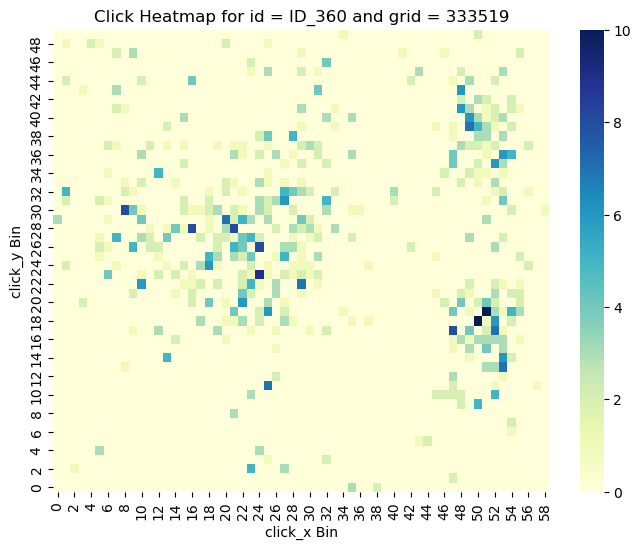

 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 grid id: 333519, domain id: ID_362
 p-value for chisquared test:  5.9655173968455104e-117
 log-prob for prob method:     1.0847977743528294e-20


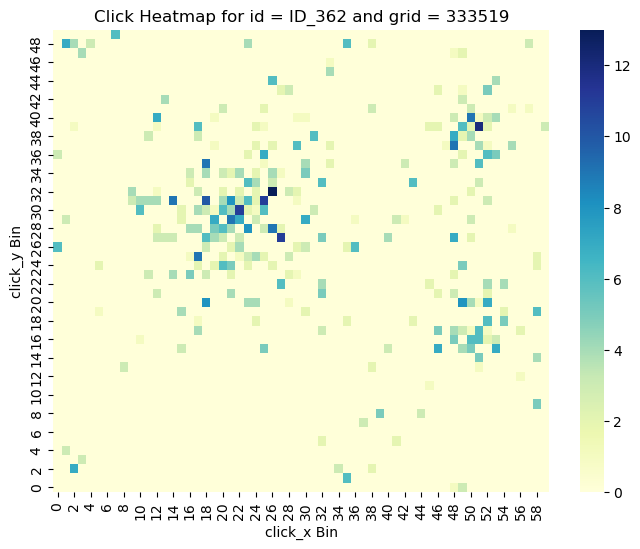

 Pct of broken domains according to prob method:  0.416
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 grid id: 333519, domain id: ID_38
 p-value for chisquared test:  1.5952711338895244e-271
 log-prob for prob method:     2.199982666253513e-56


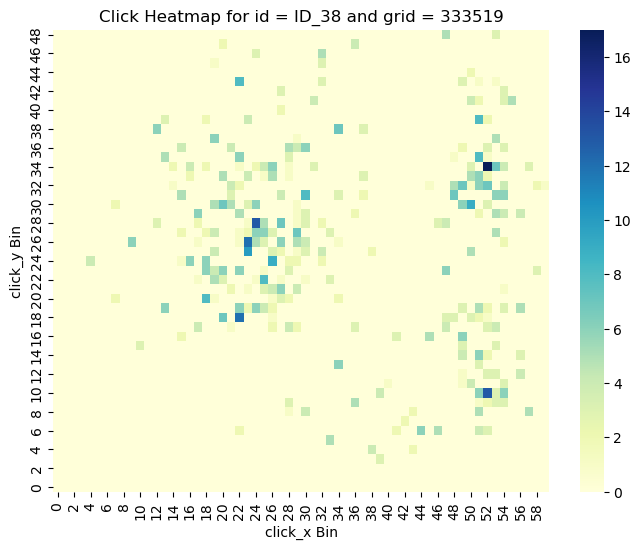

 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 grid id: 333519, domain id: ID_394
 p-value for chisquared test:  0.0
 log-prob for prob method:     1.2429872494328053e-132


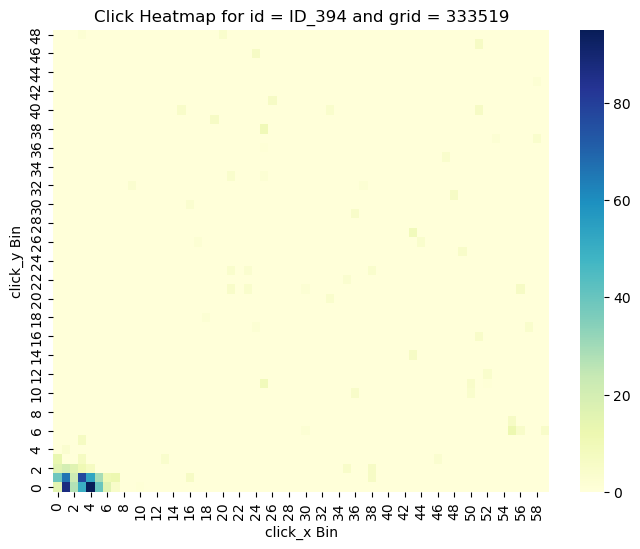

 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 grid id: 333519, domain id: ID_398
 p-value for chisquared test:  0.0
 log-prob for prob method:     7.371553588685524e-186


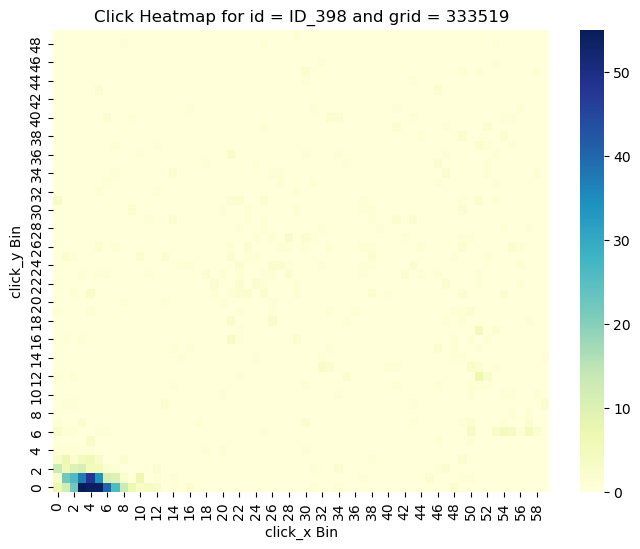

 Pct of broken domains according to prob method:  0.416
 Pct of broken domains according to both methods: 0.409
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 grid id: 333519, domain id: ID_409
 p-value for chisquared test:  0.0
 log-prob for prob method:     9.084626037710563e-300


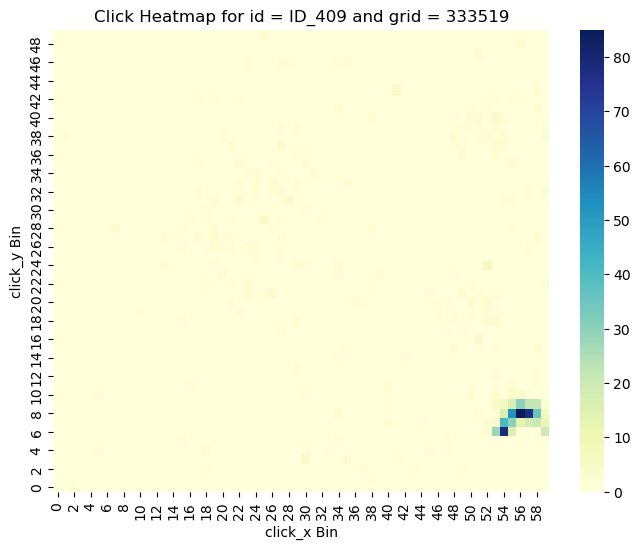

 Pct of broken domains according to prob method:  0.416
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.413
 Pct of broken domains according to both methods: 0.406
-----------------------------------------------------------
 grid id: 333519, domain id: ID_422
 p-value for chisquared test:  8.701129006205772e-125
 log-prob for prob method:     6.670027213558237e-

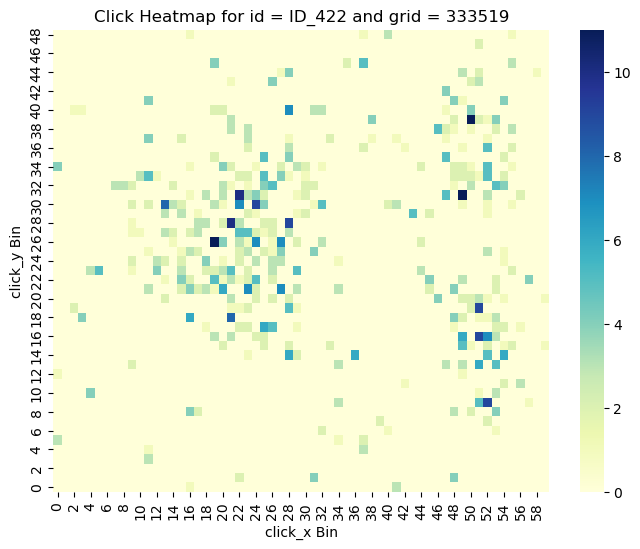

 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 grid id: 333519, domain id: ID_427
 p-value for chisquared test:  9.590441281115812e-231
 log-prob for prob method:     3.814173026630318e-11


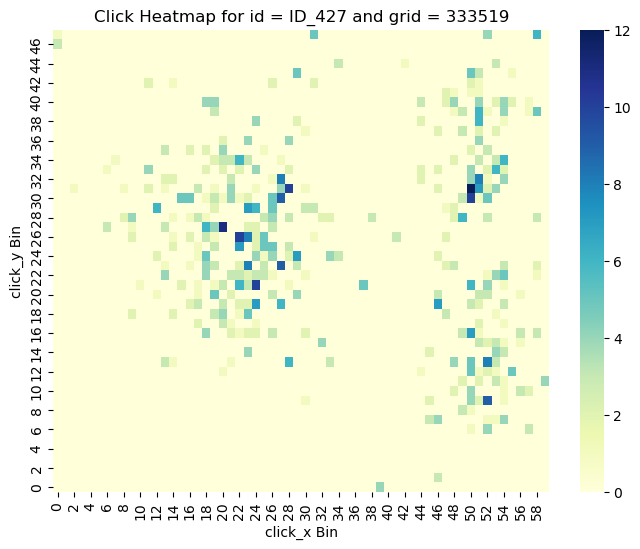

 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.413
 Pct of broken domains according to both methods: 0.406
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.413
 Pct of broken domains according to both methods: 0.405
-----------------------------------------------------------
 grid id: 333519, domain id: ID_440
 p-value for chisquared test:  2.259989740307368e-70
 log-prob for prob method:     9.024313283914664e-5

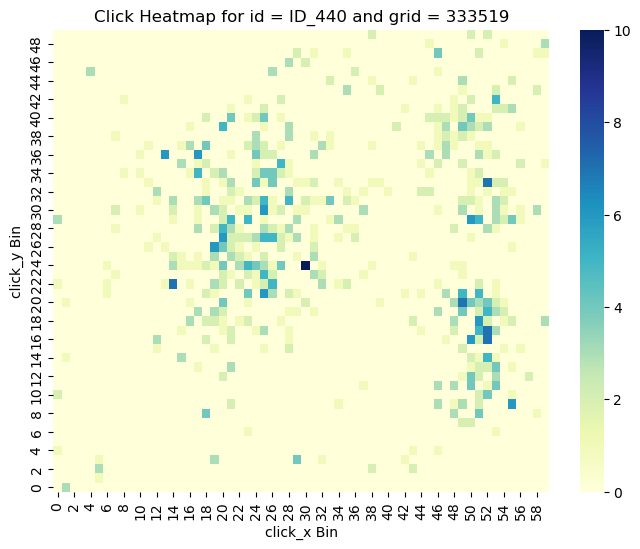

 Pct of broken domains according to prob method:  0.413
 Pct of broken domains according to both methods: 0.406
-----------------------------------------------------------
 grid id: 333519, domain id: ID_441
 p-value for chisquared test:  0.0
 log-prob for prob method:     1.5168476460217225e-46


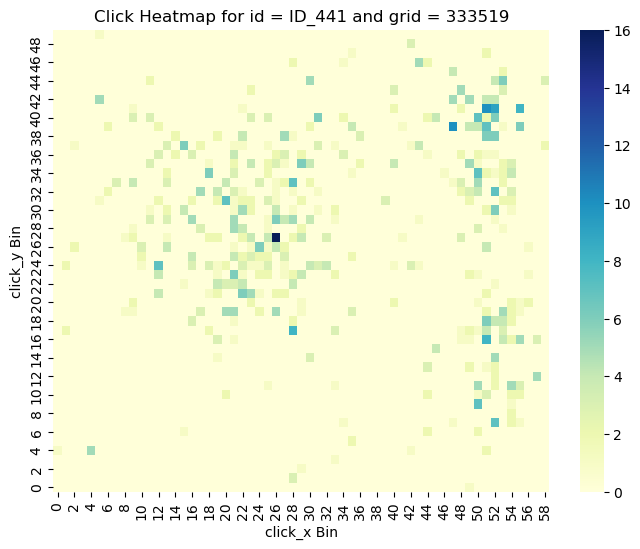

 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 grid id: 333519, domain id: ID_444
 p-value for chisquared test:  2.976303419049919e-43
 log-prob for prob method:     4.0861642236313834e-63


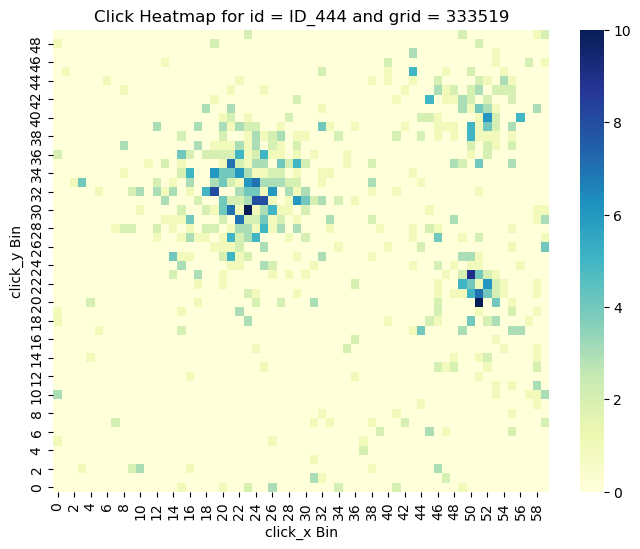

 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 grid id: 333519, domain id: ID_451
 p-value for chisquared test:  0.0
 log-prob for prob method:     1.5211925982641934e-142


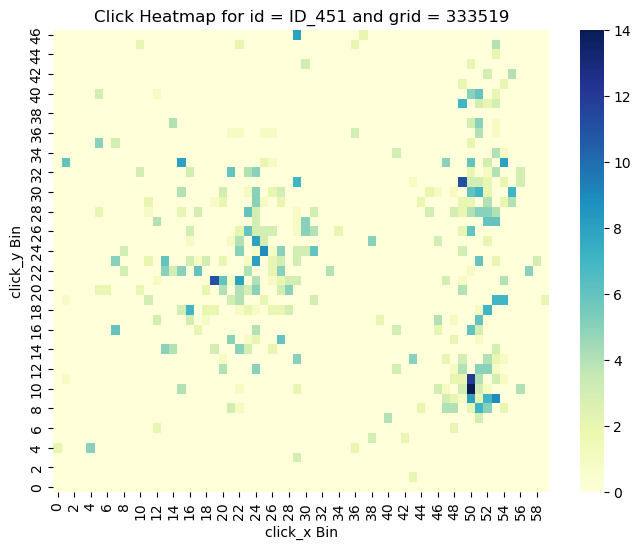

 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 grid id: 333519, domain id: ID_458
 p-value for chisquared test:  5.640603363451017e-26
 log-prob for prob method:     2.452453989717583e-128


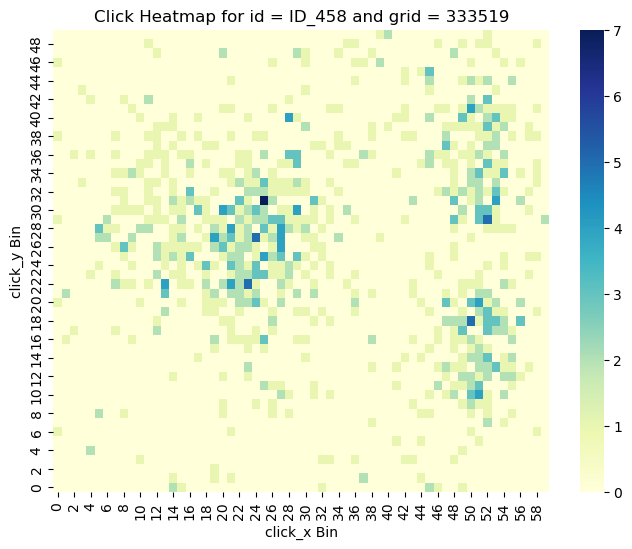

 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.413
 Pct of broken domains according to both methods: 0.406
-----------------------------------------------------------
 grid id: 333519, domain id: ID_480
 p-value for chisquared test:  7.09753248399691e-140
 log-prob for prob method:     1.0124487524373674e-17


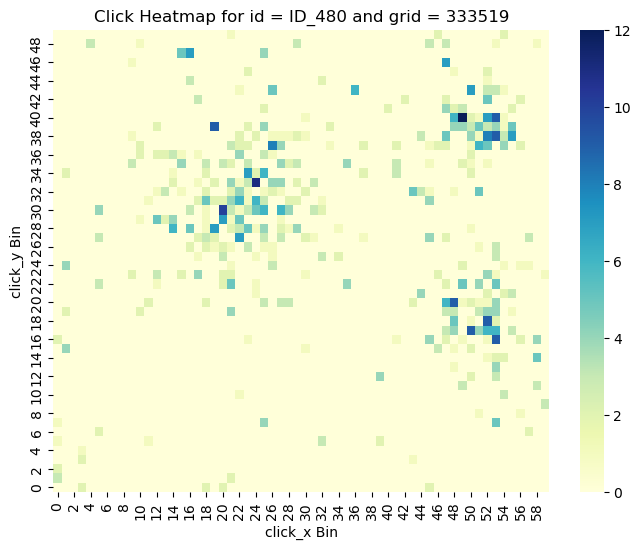

 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.413
 Pct of broken domains according to both methods: 0.406
-----------------------------------------------------------
 grid id: 333519, domain id: ID_484
 p-value for chisquared test:  0.0
 log-prob for prob method:     8.407493201527657e-300


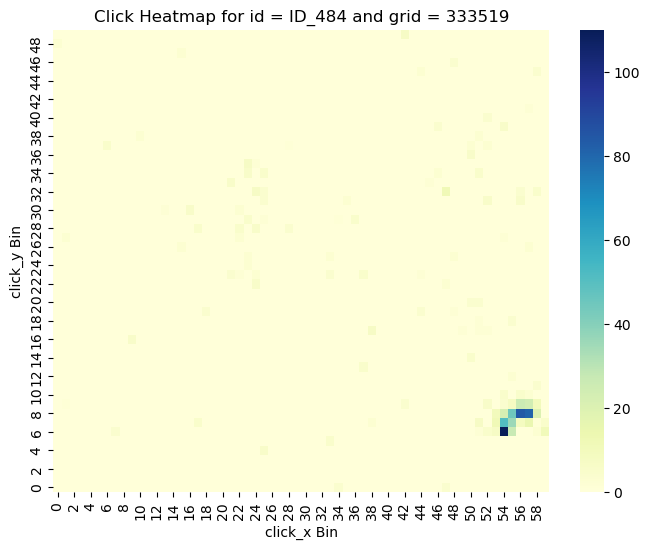

 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 grid id: 333519, domain id: ID_489
 p-value for chisquared test:  0.0
 log-prob for prob method:     0.0


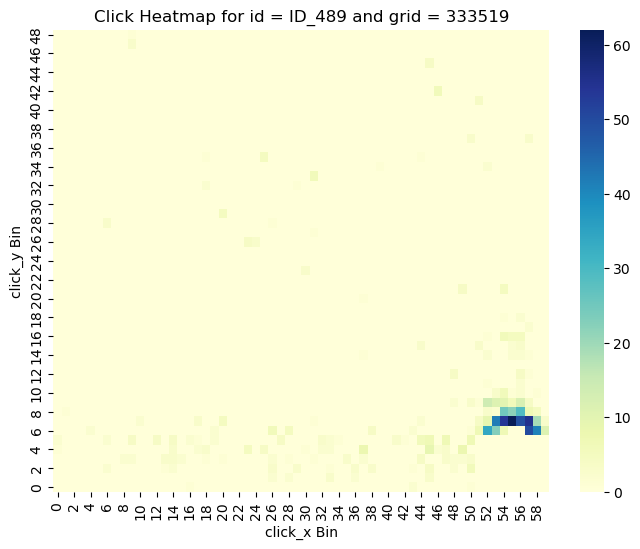

 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 grid id: 333519, domain id: ID_514
 p-value for chisquared test:  1.2863400163348057e-223
 log-prob for prob method:     3.0306753077489925e-24


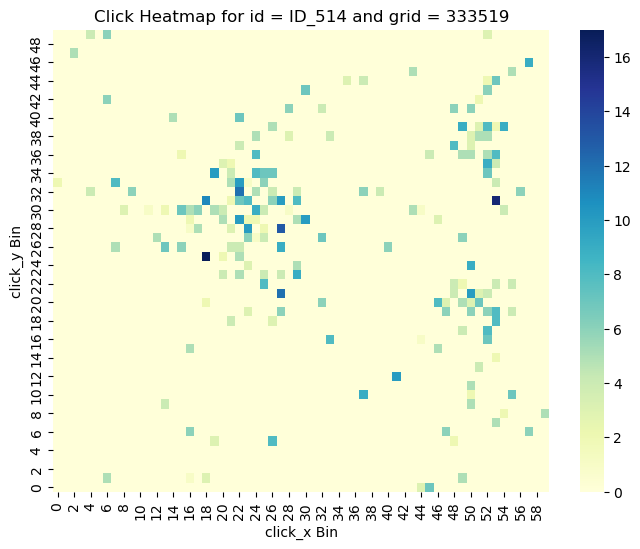

 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 grid id: 333519, domain id: ID_521
 p-value for chisquared test:  3.18072101610422e-126
 log-prob for prob method:     3.3093247064142577e-82


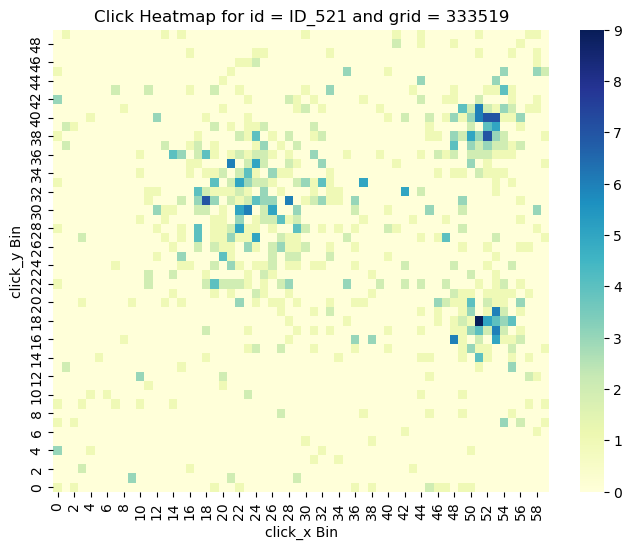

 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 grid id: 333519, domain id: ID_526
 p-value for chisquared test:  0.0
 log-prob for prob method:     0.0


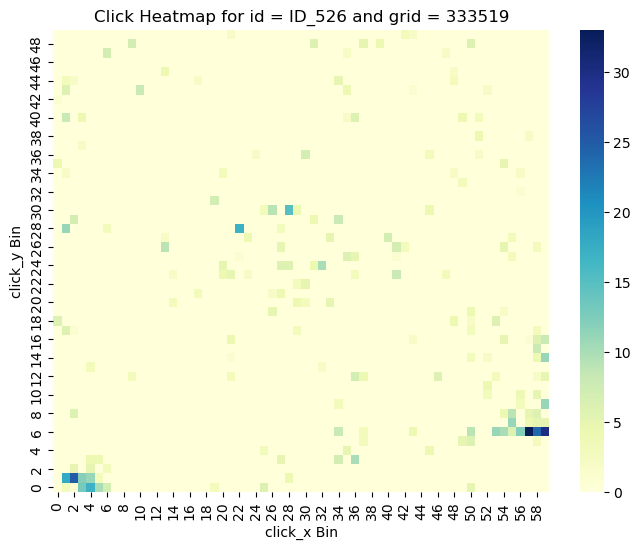

 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 grid id: 333519, domain id: ID_535
 p-value for chisquared test:  2.0567984679956736e-203
 log-prob for prob method:     5.684337152288465e-131


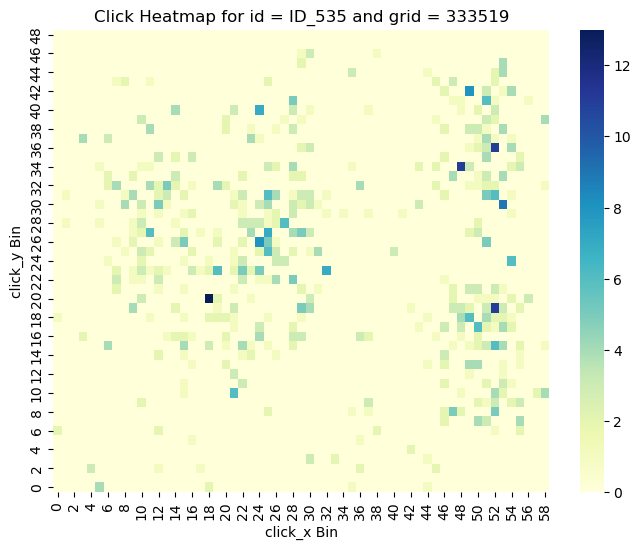

 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 grid id: 333519, domain id: ID_544
 p-value for chisquared test:  0.0
 log-prob for prob method:     4.584491495884074e-104


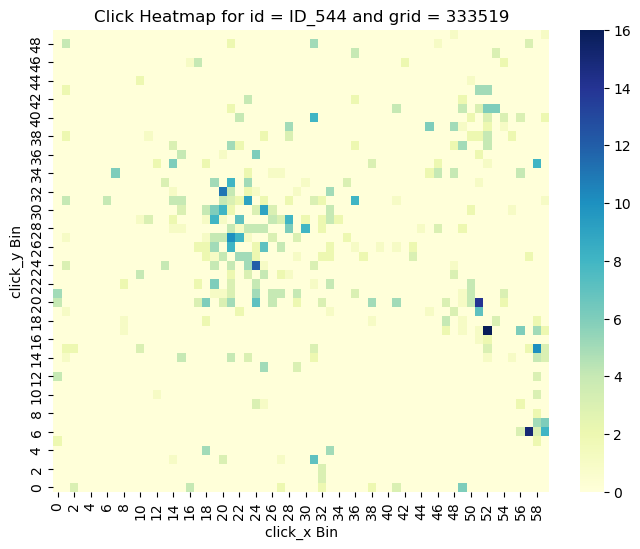

 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 grid id: 333519, domain id: ID_549
 p-value for chisquared test:  0.0
 log-prob for prob method:     0.0


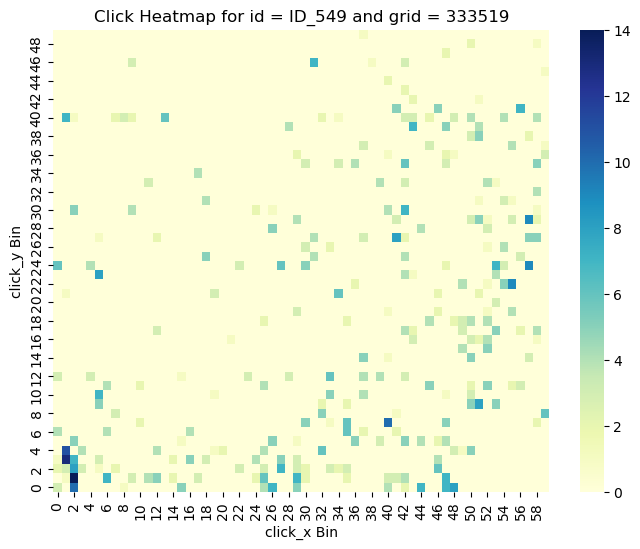

 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 grid id: 333519, domain id: ID_550
 p-value for chisquared test:  1.7223110567234946e-10
 log-prob for prob method:     2.3640578847318737e-14


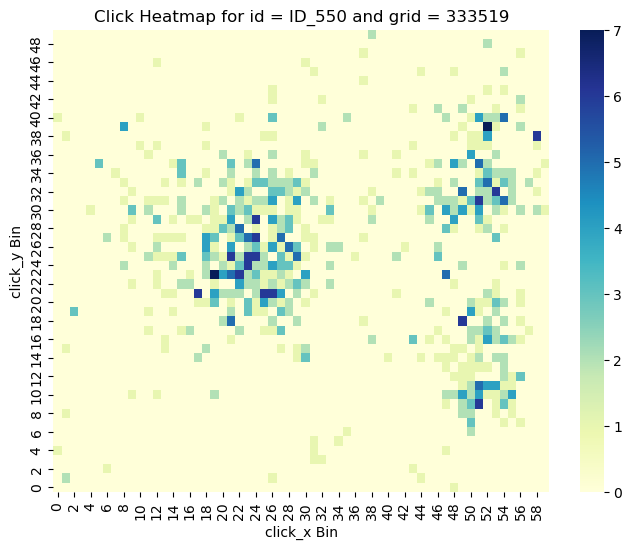

 Pct of broken domains according to prob method:  0.416
 Pct of broken domains according to both methods: 0.409
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.416
 Pct of broken domains according to both methods: 0.409
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.413
 Pct of broken domains according to both methods: 0.407
----------------------------

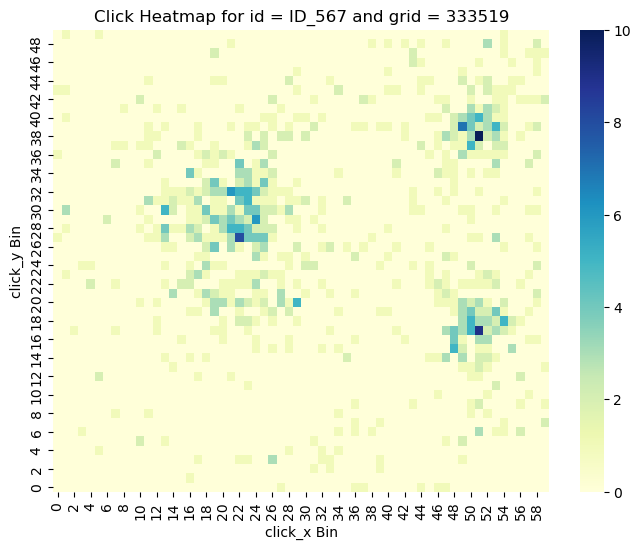

 Pct of broken domains according to prob method:  0.413
 Pct of broken domains according to both methods: 0.406
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.412
 Pct of broken domains according to both methods: 0.406
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.412
 Pct of broken domains according to both methods: 0.405
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.411
 Pct of broken domains according to both methods: 0.405
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.411
 Pct of broken domains according to both methods: 0.404
-----------------------------------------------------------
 grid id: 333519, domain id: ID_579
 p-value for chisquared test:  0.0
 log-prob for prob method:     4.5937715837040153e-51


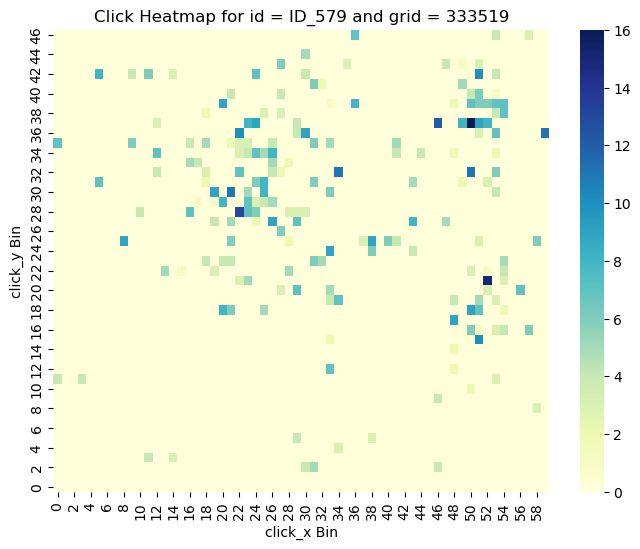

 Pct of broken domains according to prob method:  0.412
 Pct of broken domains according to both methods: 0.405
-----------------------------------------------------------
 grid id: 333519, domain id: ID_580
 p-value for chisquared test:  0.0
 log-prob for prob method:     2.017033857510211e-243


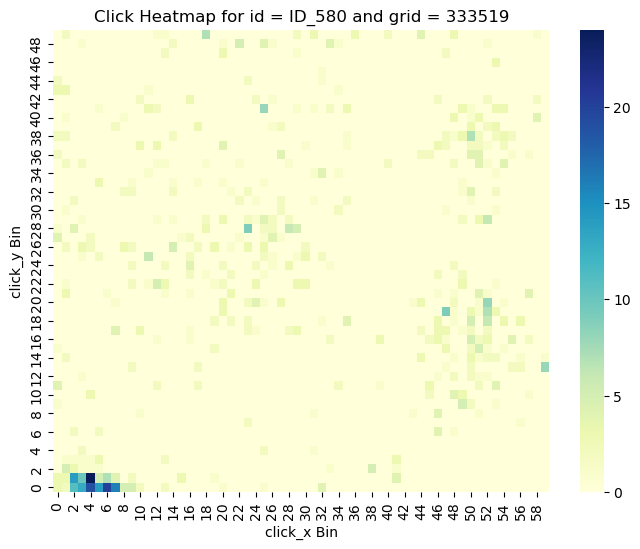

 Pct of broken domains according to prob method:  0.412
 Pct of broken domains according to both methods: 0.406
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.412
 Pct of broken domains according to both methods: 0.405
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.411
 Pct of broken domains according to both methods: 0.405
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.411
 Pct of broken domains according to both methods: 0.404
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.410
 Pct of broken domains according to both methods: 0.403
-----------------------------------------------------------
 grid id: 333519, domain id: ID_594
 p-value for chisquared test:  8.938682847146515e-186
 log-prob for prob method:     7.251647761320001e-

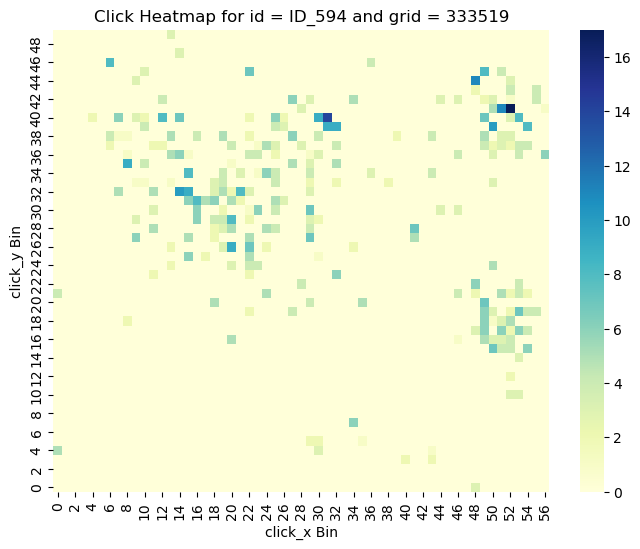

 Pct of broken domains according to prob method:  0.411
 Pct of broken domains according to both methods: 0.404
-----------------------------------------------------------
 grid id: 333519, domain id: ID_596
 p-value for chisquared test:  0.0
 log-prob for prob method:     6.355676023070868e-70


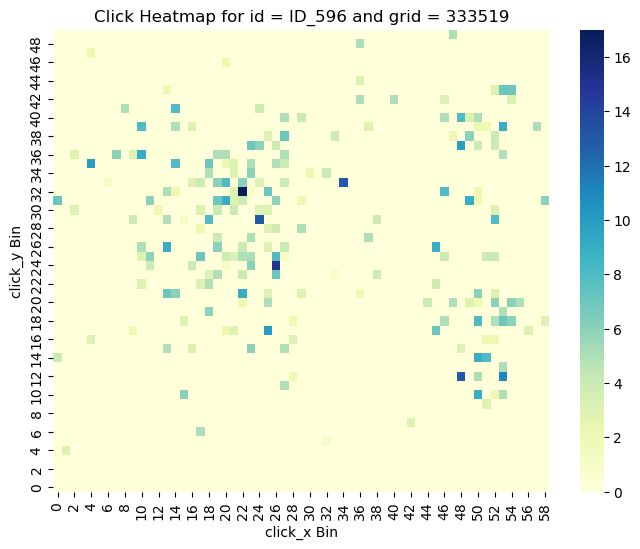

 Pct of broken domains according to prob method:  0.412
 Pct of broken domains according to both methods: 0.405
-----------------------------------------------------------
 grid id: 333519, domain id: ID_60
 p-value for chisquared test:  4.009710320954585e-269
 log-prob for prob method:     7.182216377372138e-54


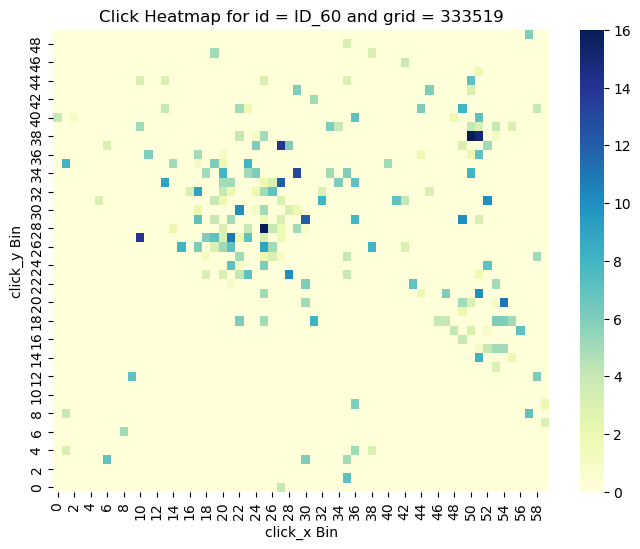

 Pct of broken domains according to prob method:  0.412
 Pct of broken domains according to both methods: 0.406
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.412
 Pct of broken domains according to both methods: 0.405
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.411
 Pct of broken domains according to both methods: 0.405
-----------------------------------------------------------
 grid id: 333519, domain id: ID_612
 p-value for chisquared test:  0.0
 log-prob for prob method:     2.3268621798744805e-125


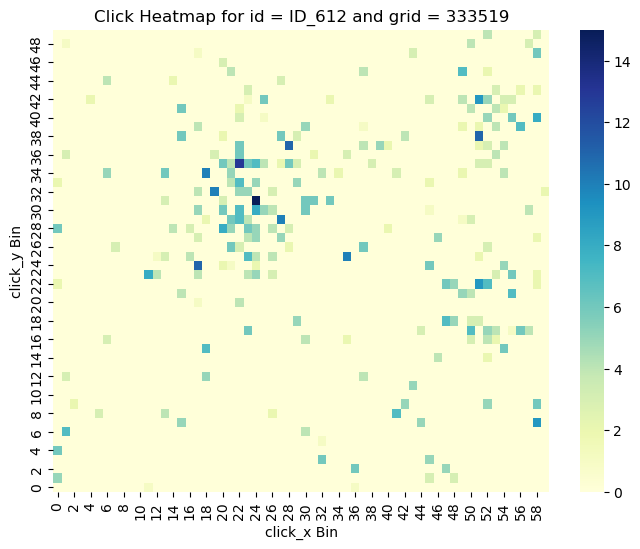

 Pct of broken domains according to prob method:  0.412
 Pct of broken domains according to both methods: 0.406
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.412
 Pct of broken domains according to both methods: 0.405
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.411
 Pct of broken domains according to both methods: 0.404
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.411
 Pct of broken domains according to both methods: 0.404
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.410
 Pct of broken domains according to both methods: 0.403
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.409
 Pct of broken domains according to both methods: 0.403
----------------------------

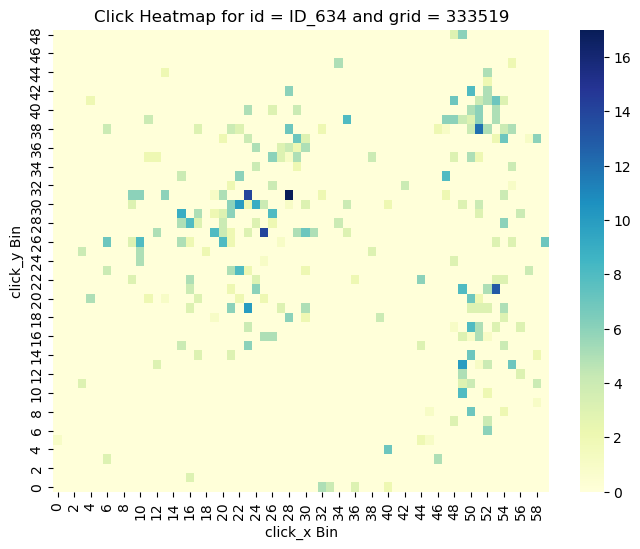

 Pct of broken domains according to prob method:  0.410
 Pct of broken domains according to both methods: 0.404
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.410
 Pct of broken domains according to both methods: 0.403
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.409
 Pct of broken domains according to both methods: 0.403
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.409
 Pct of broken domains according to both methods: 0.402
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.408
 Pct of broken domains according to both methods: 0.402
-----------------------------------------------------------
 grid id: 333519, domain id: ID_650
 p-value for chisquared test:  0.0
 log-prob for prob method:     2.5365826319212913e-250


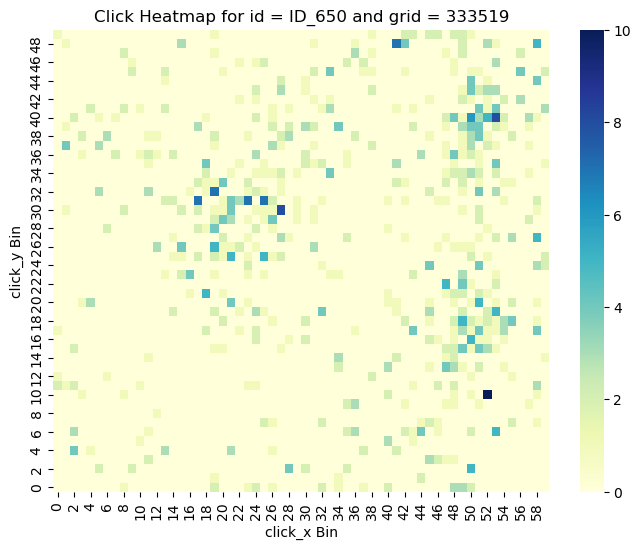

 Pct of broken domains according to prob method:  0.409
 Pct of broken domains according to both methods: 0.402
-----------------------------------------------------------
 grid id: 333519, domain id: ID_651
 p-value for chisquared test:  0.0
 log-prob for prob method:     8.255706398076264e-119


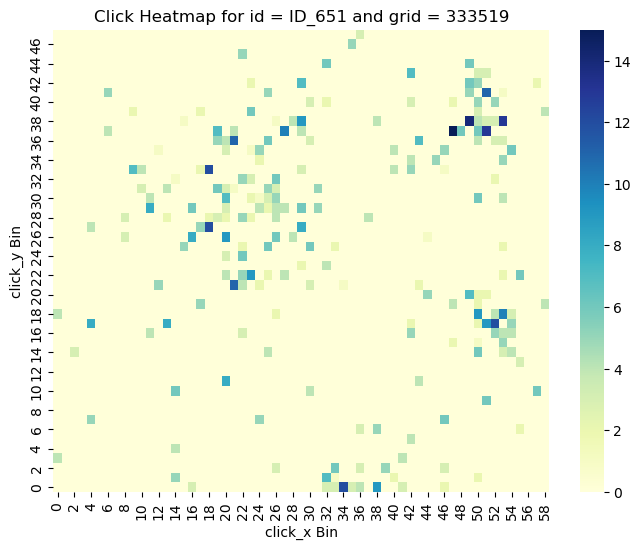

 Pct of broken domains according to prob method:  0.410
 Pct of broken domains according to both methods: 0.403
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.409
 Pct of broken domains according to both methods: 0.403
-----------------------------------------------------------
 grid id: 333519, domain id: ID_657
 p-value for chisquared test:  0.0
 log-prob for prob method:     7.617927311540494e-168


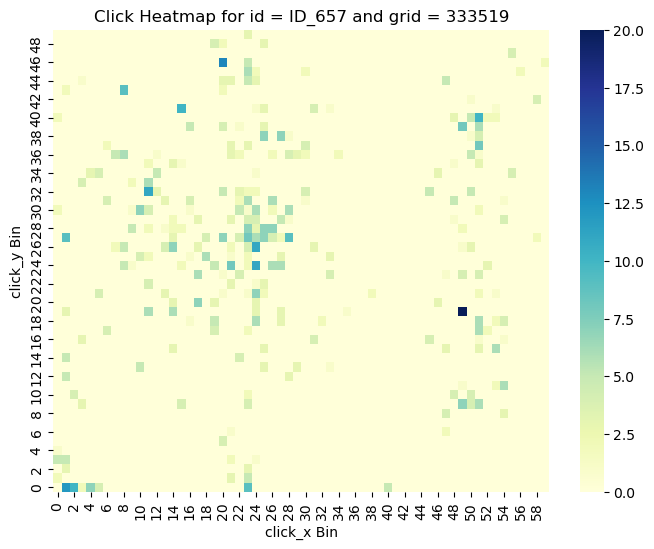

 Pct of broken domains according to prob method:  0.410
 Pct of broken domains according to both methods: 0.403
-----------------------------------------------------------
 grid id: 333519, domain id: ID_66
 p-value for chisquared test:  2.5007236303402244e-80
 log-prob for prob method:     5.6653840184667556e-15


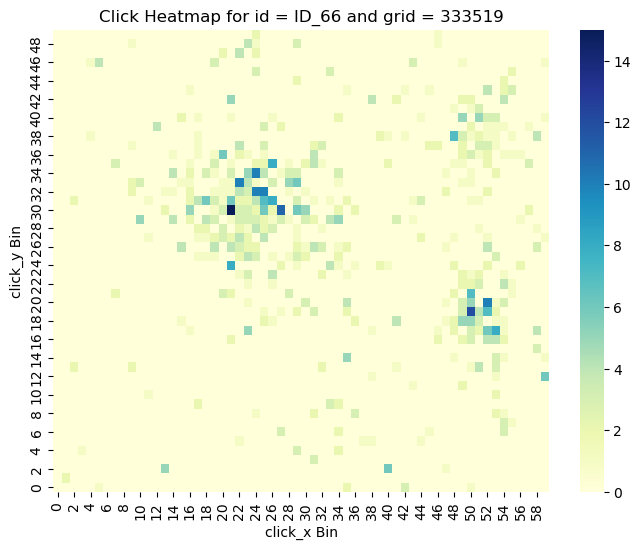

 Pct of broken domains according to prob method:  0.411
 Pct of broken domains according to both methods: 0.404
-----------------------------------------------------------
 grid id: 333519, domain id: ID_661
 p-value for chisquared test:  1.1680179136952622e-33
 log-prob for prob method:     2.5407932628572753e-19


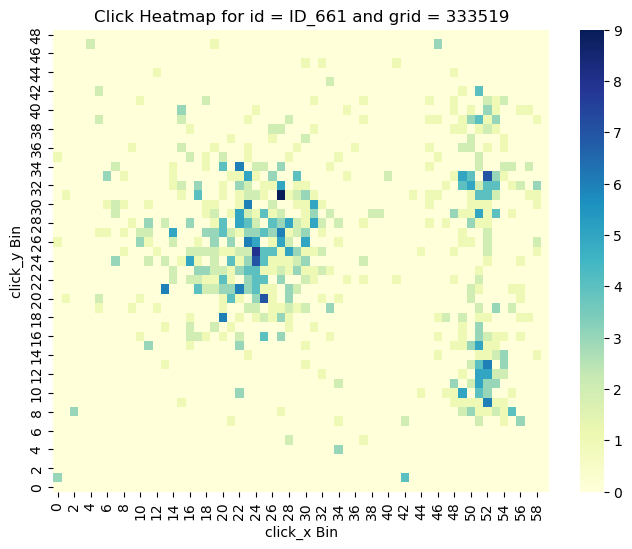

 Pct of broken domains according to prob method:  0.411
 Pct of broken domains according to both methods: 0.405
-----------------------------------------------------------
 grid id: 333519, domain id: ID_665
 p-value for chisquared test:  0.0
 log-prob for prob method:     0.0


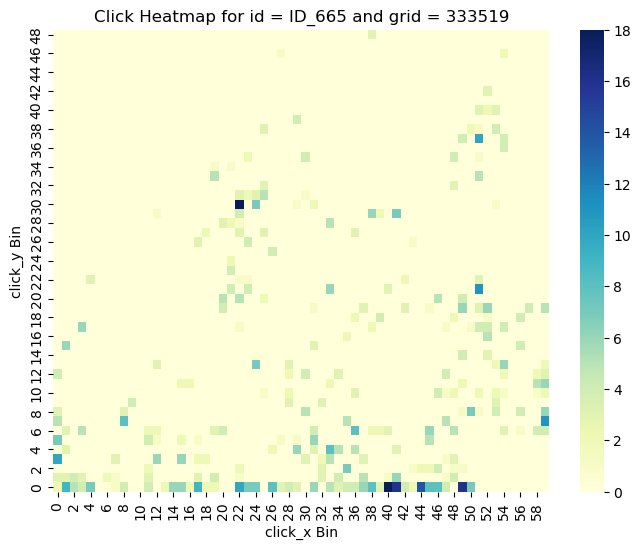

 Pct of broken domains according to prob method:  0.412
 Pct of broken domains according to both methods: 0.406
-----------------------------------------------------------
 grid id: 333519, domain id: ID_669
 p-value for chisquared test:  0.0
 log-prob for prob method:     6.821692129262139e-75


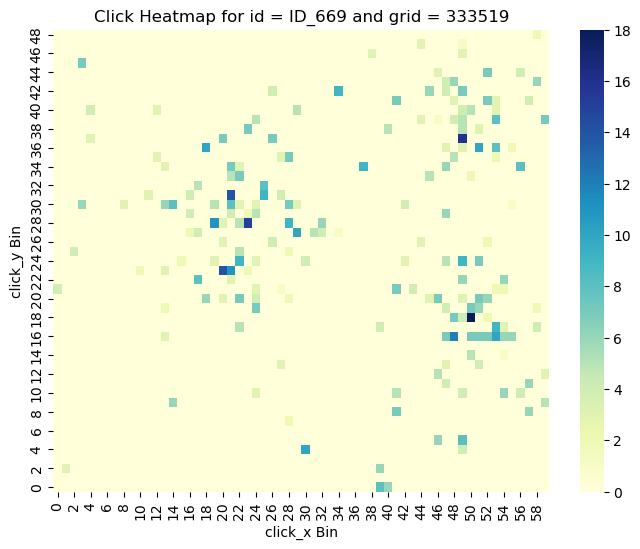

 Pct of broken domains according to prob method:  0.413
 Pct of broken domains according to both methods: 0.406
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.412
 Pct of broken domains according to both methods: 0.406
-----------------------------------------------------------
 grid id: 333519, domain id: ID_672
 p-value for chisquared test:  0.0
 log-prob for prob method:     9.653834705070057e-119


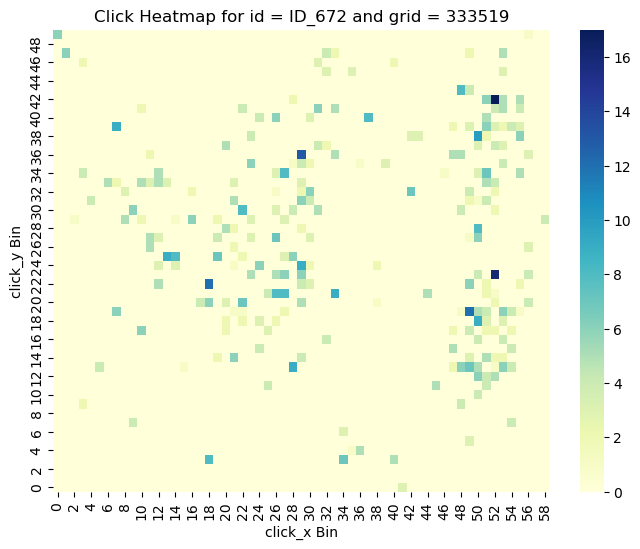

 Pct of broken domains according to prob method:  0.413
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.413
 Pct of broken domains according to both methods: 0.406
-----------------------------------------------------------
 grid id: 333519, domain id: ID_678
 p-value for chisquared test:  1.2292426654748022e-200
 log-prob for prob method:     2.0333974792760197e-09


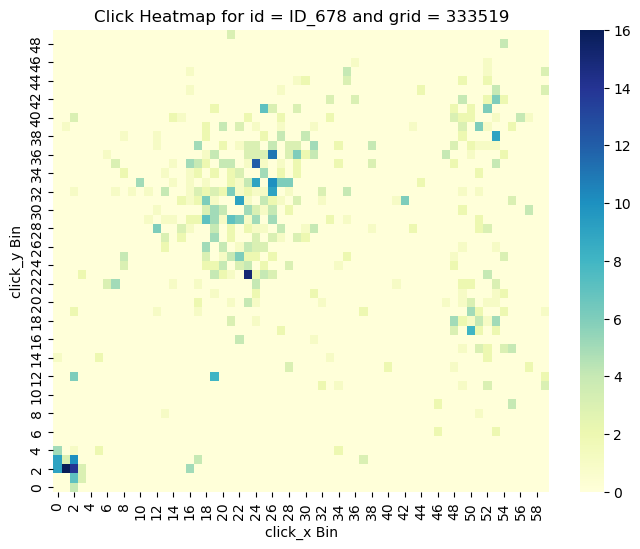

 Pct of broken domains according to prob method:  0.413
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 grid id: 333519, domain id: ID_682
 p-value for chisquared test:  1.847909710477507e-187
 log-prob for prob method:     7.445521949433066e-58


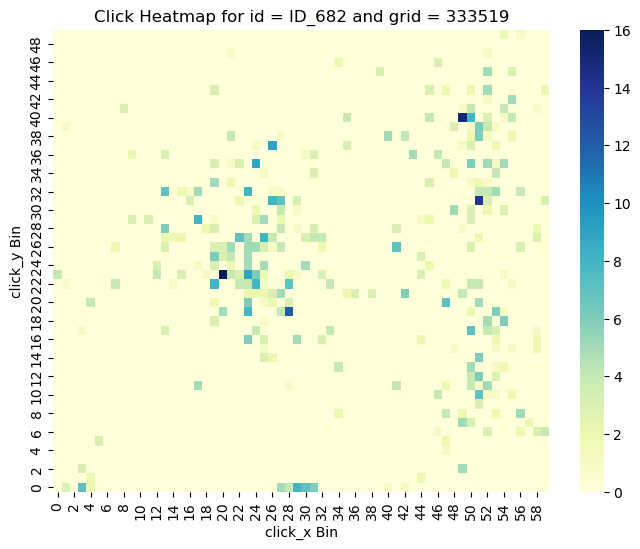

 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 grid id: 333519, domain id: ID_690
 p-value for chisquared test:  3.0943947734496465e-201
 log-prob for prob method:     5.724297185060909e-34


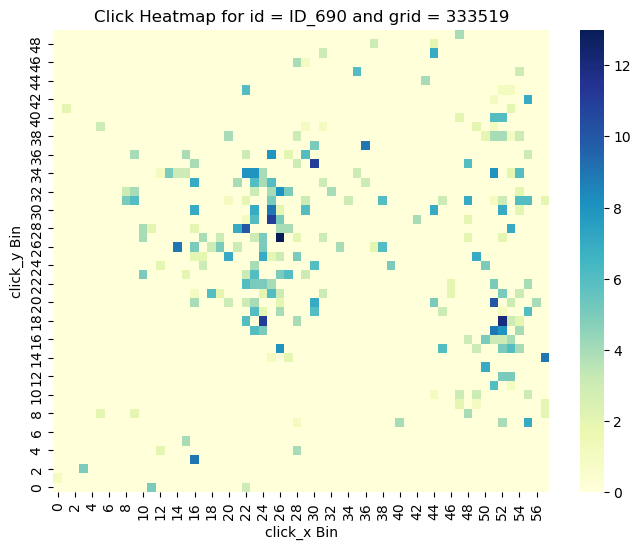

 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.413
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 grid id: 333519, domain id: ID_695
 p-value for chisquared test:  3.8318037441815746e-248
 log-prob for prob method:     1.938510752715775e-37


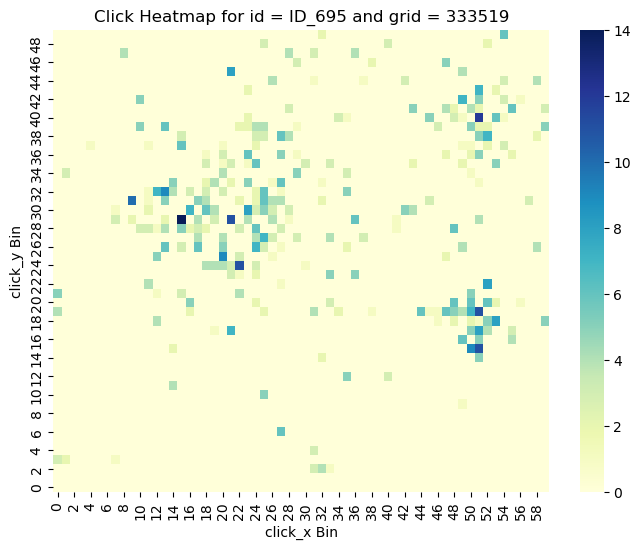

 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.413
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 grid id: 333519, domain id: ID_70
 p-value for chisquared test:  0.0
 log-prob for prob method:     3.9615481839772005e-95


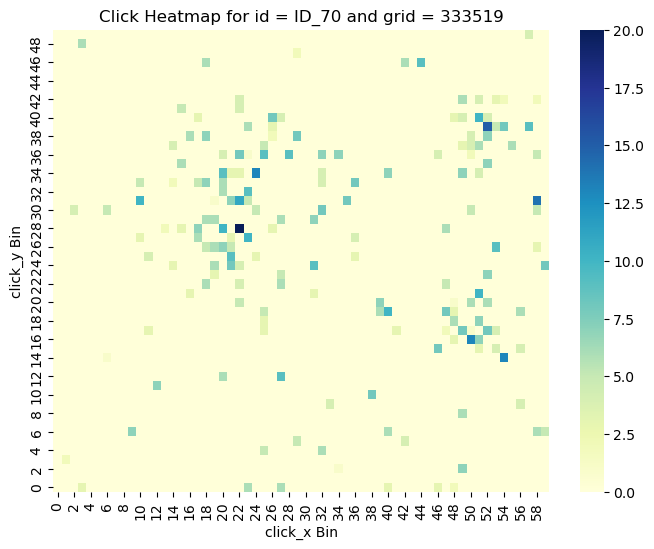

 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.413
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 grid id: 333519, domain id: ID_718
 p-value for chisquared test:  0.0
 log-prob for prob method:     1.327762454372255e-19


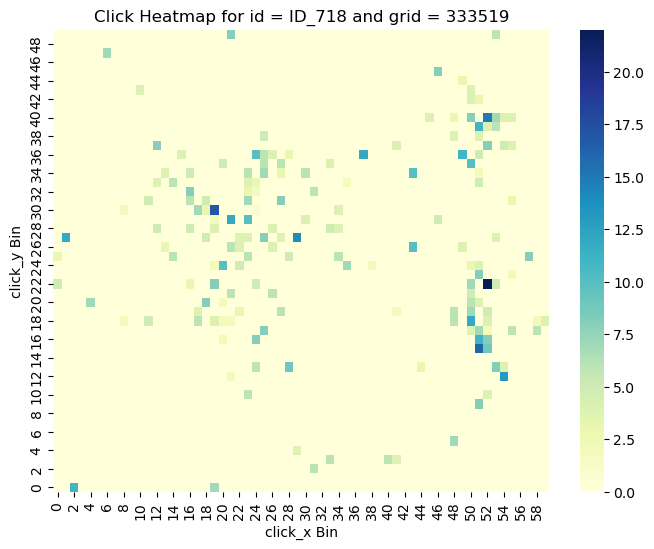

 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 grid id: 333519, domain id: ID_720
 p-value for chisquared test:  7.436095835782274e-90
 log-prob for prob method:     1.8533272620107968e-115


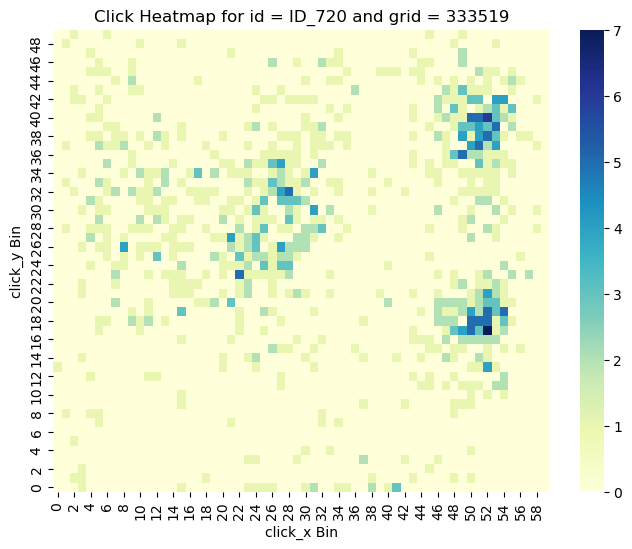

 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 grid id: 333519, domain id: ID_724
 p-value for chisquared test:  1.3161301323291626e-106
 log-prob for prob method:     1.1462684305318274e-21


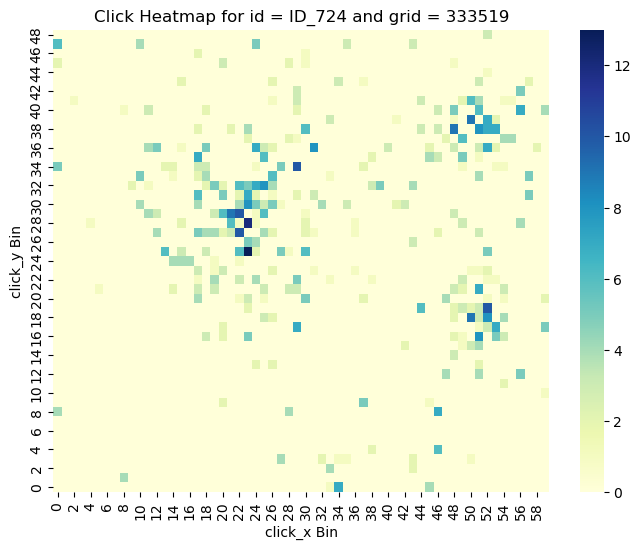

 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 grid id: 333519, domain id: ID_725
 p-value for chisquared test:  3.726481743036372e-146
 log-prob for prob method:     8.176476238773172e-21


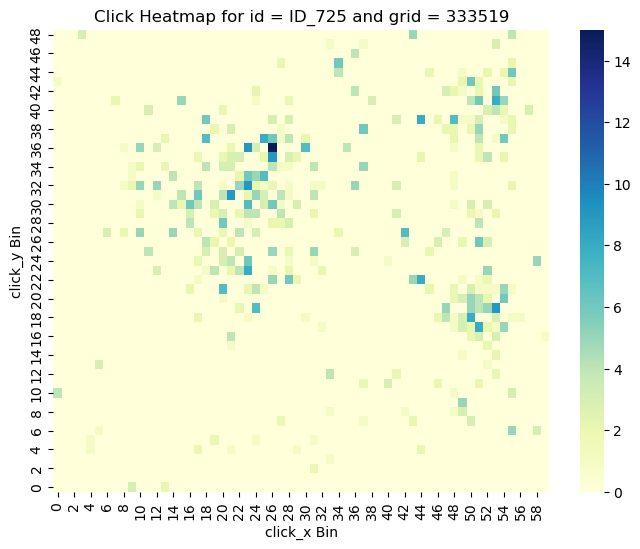

 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.409
-----------------------------------------------------------
 grid id: 333519, domain id: ID_733
 p-value for chisquared test:  9.143893909030729e-300
 log-prob for prob method:     2.6046177214155536e-42


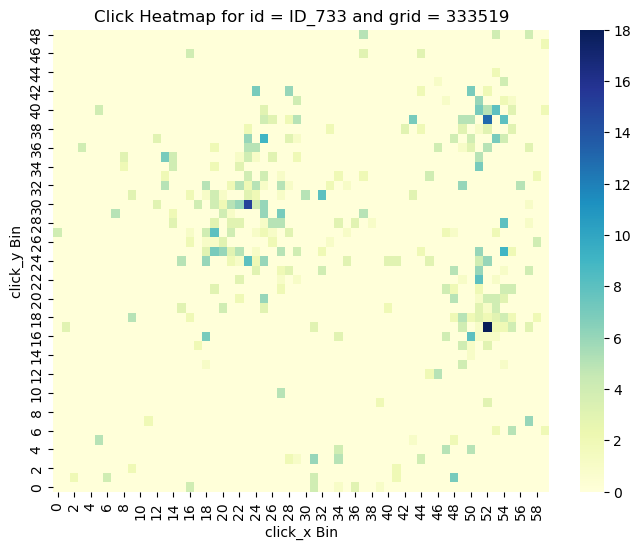

 Pct of broken domains according to prob method:  0.416
 Pct of broken domains according to both methods: 0.410
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.409
-----------------------------------------------------------
 grid id: 333519, domain id: ID_738
 p-value for chisquared test:  5.1893077917793525e-148
 log-prob for prob method:     5.7592694656917374e-15


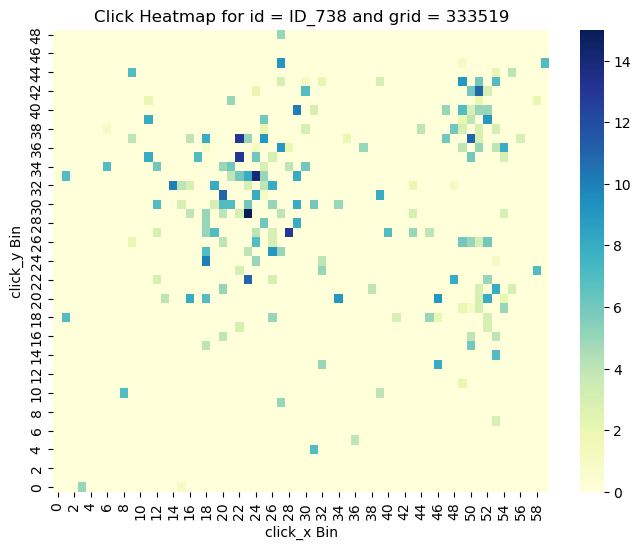

 Pct of broken domains according to prob method:  0.416
 Pct of broken domains according to both methods: 0.410
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.416
 Pct of broken domains according to both methods: 0.409
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.409
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.413
 Pct of broken domains according to both methods: 0.407
----------------------------

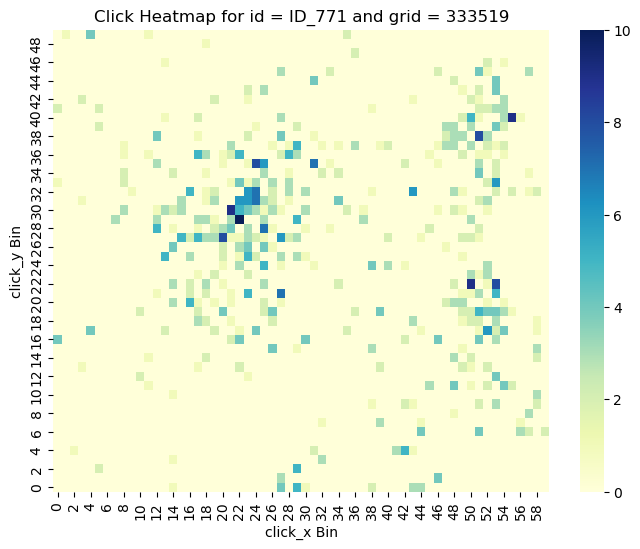

 Pct of broken domains according to prob method:  0.413
 Pct of broken domains according to both methods: 0.406
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.412
 Pct of broken domains according to both methods: 0.406
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.412
 Pct of broken domains according to both methods: 0.405
-----------------------------------------------------------
 grid id: 333519, domain id: ID_79
 p-value for chisquared test:  4.2146539896606796e-209
 log-prob for prob method:     1.916488520792635e-18


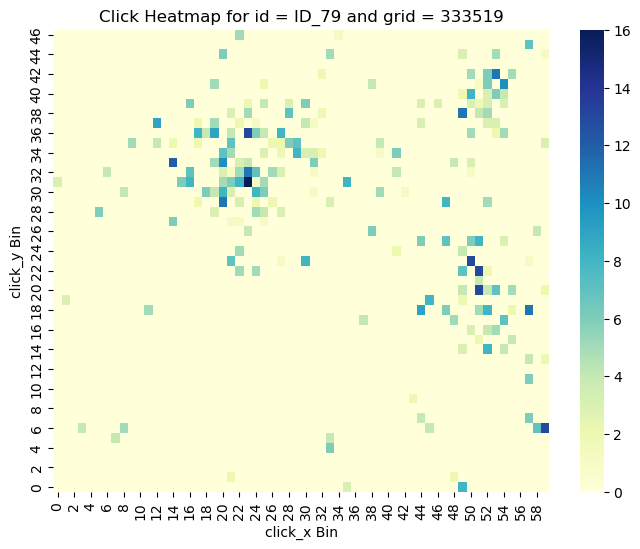

 Pct of broken domains according to prob method:  0.412
 Pct of broken domains according to both methods: 0.406
-----------------------------------------------------------
 grid id: 333519, domain id: ID_793
 p-value for chisquared test:  0.0
 log-prob for prob method:     1.0112069420860982e-172


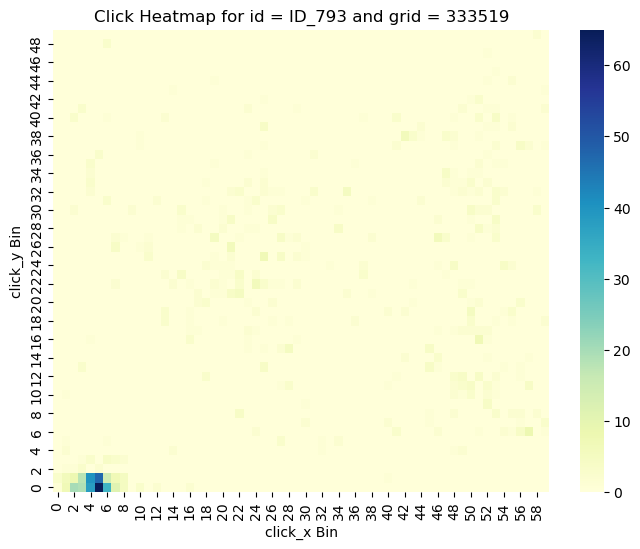

 Pct of broken domains according to prob method:  0.413
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 grid id: 333519, domain id: ID_794
 p-value for chisquared test:  0.0
 log-prob for prob method:     5.8226944745877296e-117


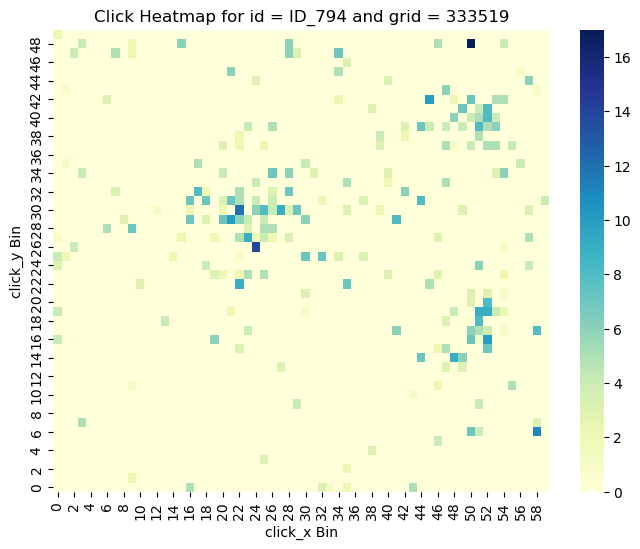

 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 grid id: 333519, domain id: ID_795
 p-value for chisquared test:  1.0127552081082417e-249
 log-prob for prob method:     3.3556433874128084e-15


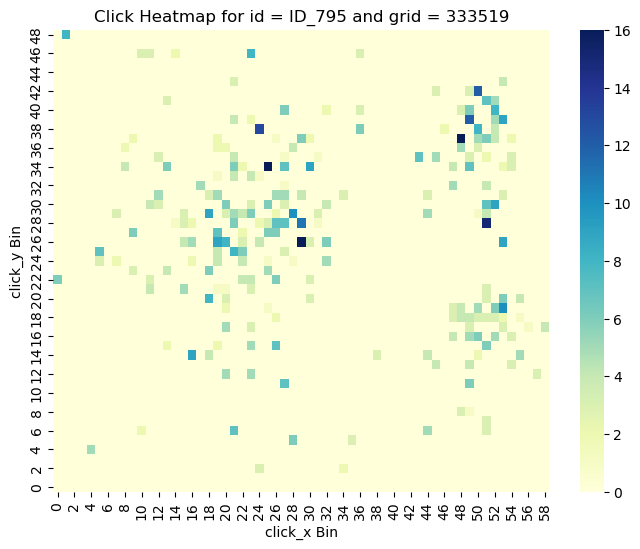

 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 grid id: 333519, domain id: ID_798
 p-value for chisquared test:  1.5764104073666027e-292
 log-prob for prob method:     4.2966602489434026e-63


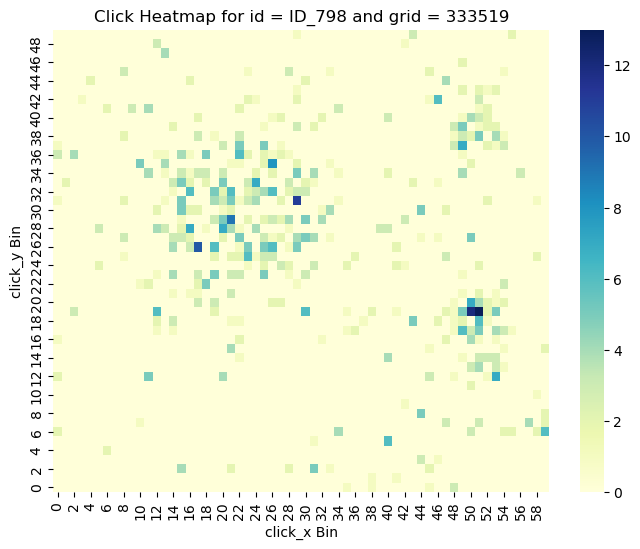

 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.409
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.409
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 grid id: 333519, domain id: ID_810
 p-value for chisquared test:  0.0
 log-prob for prob method:     7.770121746044704e-219


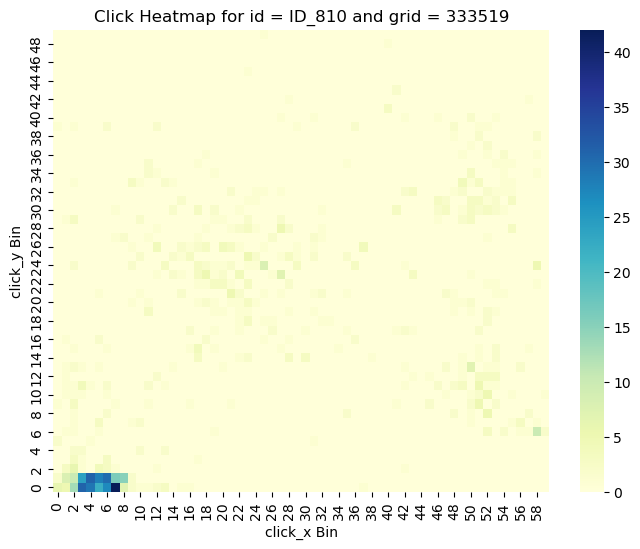

 Pct of broken domains according to prob method:  0.416
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 grid id: 333519, domain id: ID_830
 p-value for chisquared test:  4.669795928186265e-224
 log-prob for prob method:     3.6255882905409416e-17


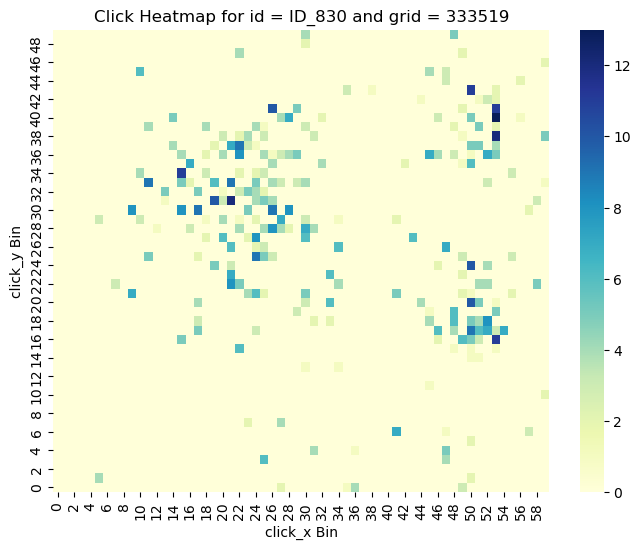

 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.414
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 grid id: 333519, domain id: ID_84
 p-value for chisquared test:  0.0
 log-prob for prob method:     0.0


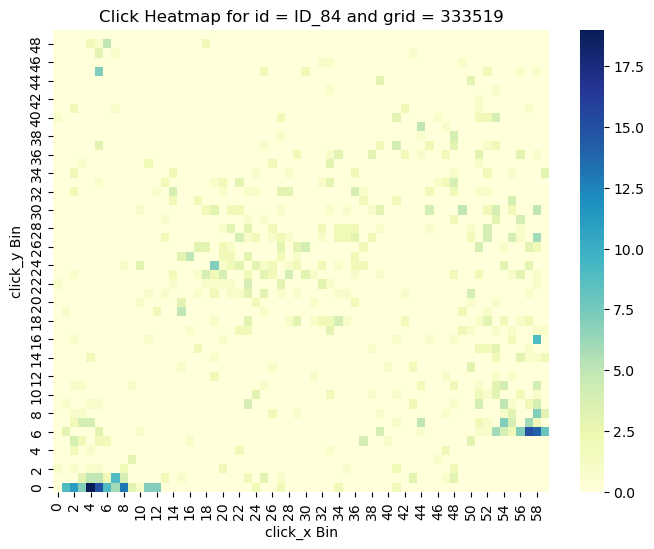

 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.407
-----------------------------------------------------------
 grid id: 333519, domain id: ID_841
 p-value for chisquared test:  0.0
 log-prob for prob method:     2.2529287344953248e-135


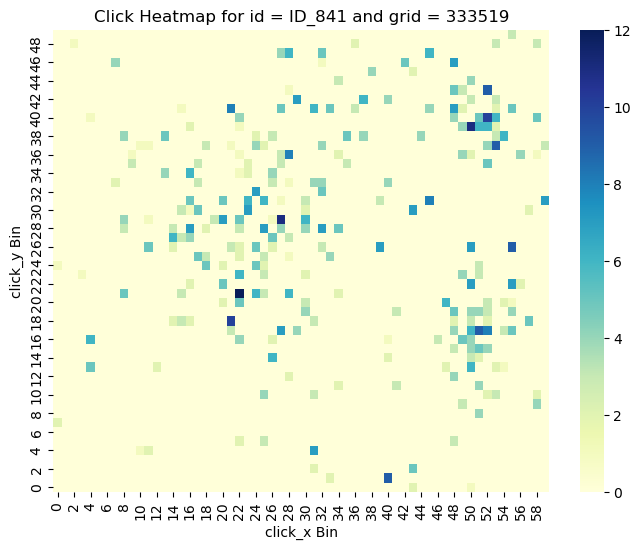

 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 grid id: 333519, domain id: ID_843
 p-value for chisquared test:  0.0
 log-prob for prob method:     5.123467985067302e-51


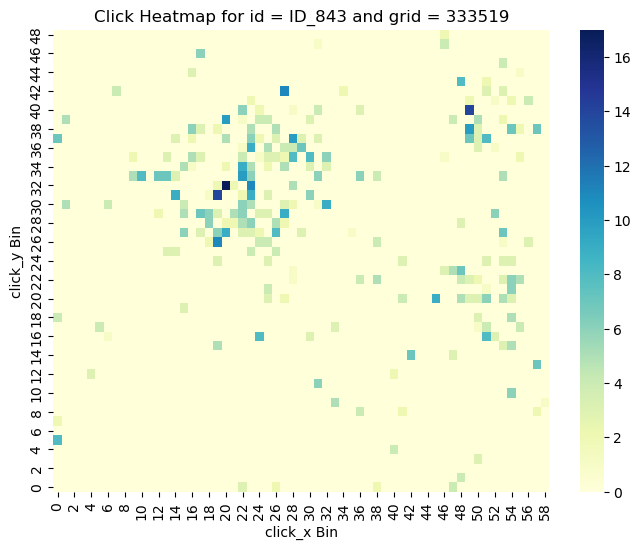

 Pct of broken domains according to prob method:  0.416
 Pct of broken domains according to both methods: 0.409
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.415
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 grid id: 333519, domain id: ID_849
 p-value for chisquared test:  0.0
 log-prob for prob method:     9.332720279784136e-72


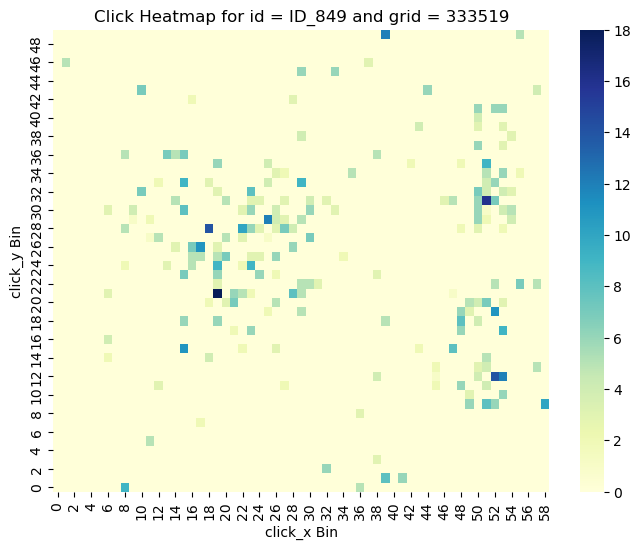

 Pct of broken domains according to prob method:  0.416
 Pct of broken domains according to both methods: 0.408
-----------------------------------------------------------
 grid id: 333519, domain id: ID_851
 p-value for chisquared test:  0.0
 log-prob for prob method:     4.2305195274986915e-80


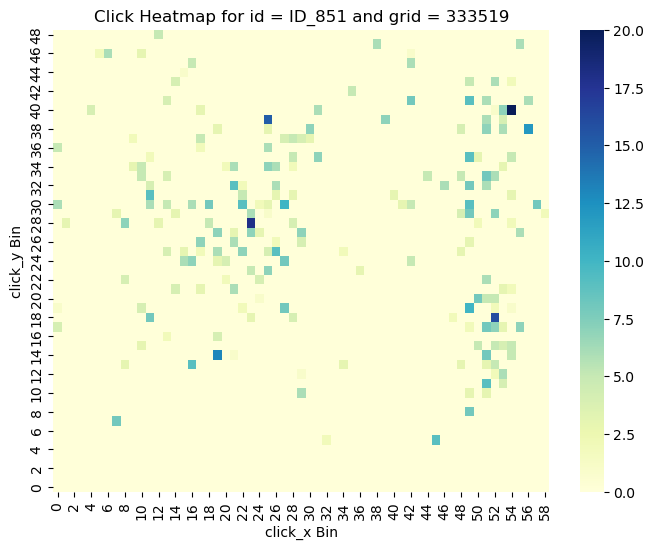

 Pct of broken domains according to prob method:  0.416
 Pct of broken domains according to both methods: 0.409
-----------------------------------------------------------
 grid id: 333519, domain id: ID_857
 p-value for chisquared test:  0.0
 log-prob for prob method:     0.0


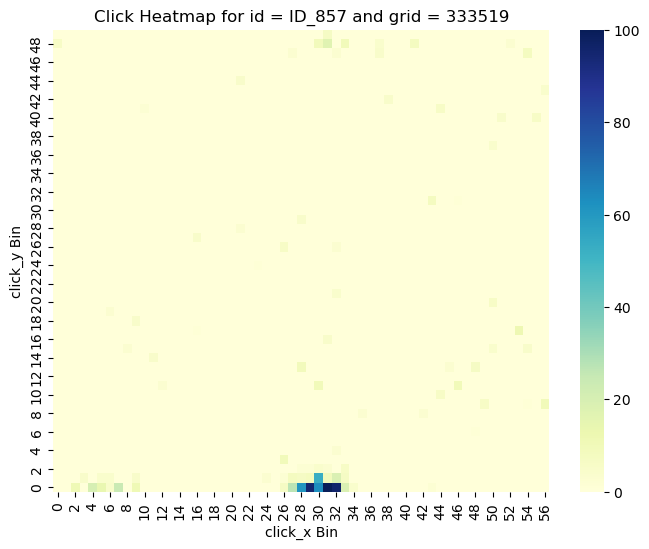

 Pct of broken domains according to prob method:  0.417
 Pct of broken domains according to both methods: 0.410
-----------------------------------------------------------
 grid id: 333519, domain id: ID_86
 p-value for chisquared test:  0.0
 log-prob for prob method:     0.0


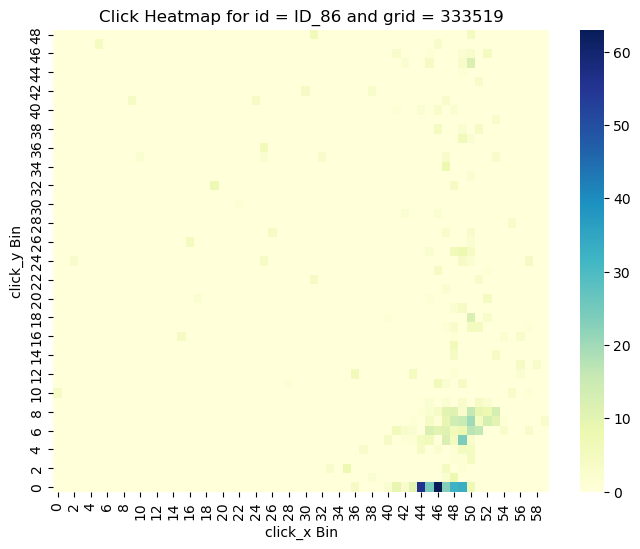

 Pct of broken domains according to prob method:  0.418
 Pct of broken domains according to both methods: 0.411
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.417
 Pct of broken domains according to both methods: 0.410
-----------------------------------------------------------
 grid id: 333519, domain id: ID_864
 p-value for chisquared test:  1.0987858838221525e-47
 log-prob for prob method:     3.630759467740685e-16


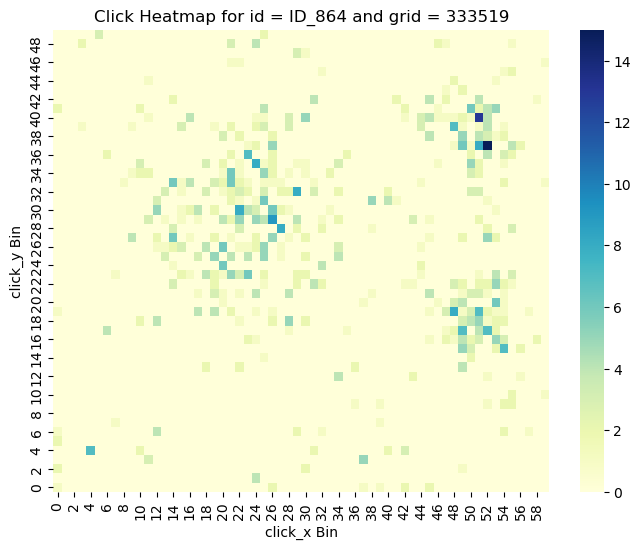

 Pct of broken domains according to prob method:  0.418
 Pct of broken domains according to both methods: 0.411
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.417
 Pct of broken domains according to both methods: 0.410
-----------------------------------------------------------
 grid id: 333519, domain id: ID_867
 p-value for chisquared test:  0.0
 log-prob for prob method:     3.202798939492701e-120


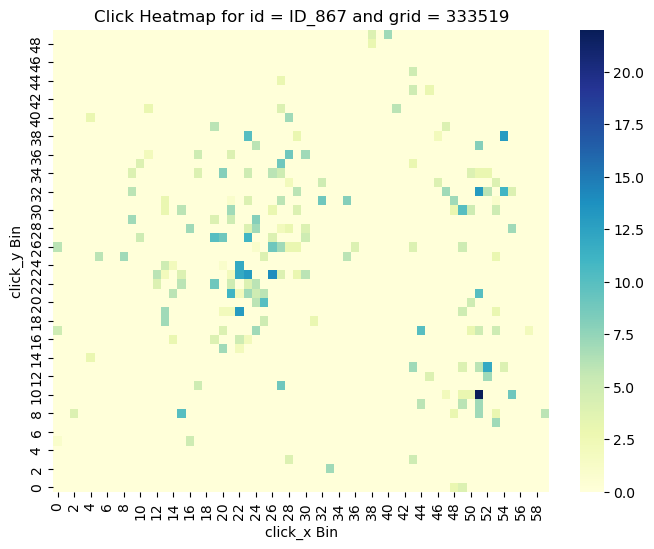

 Pct of broken domains according to prob method:  0.418
 Pct of broken domains according to both methods: 0.411
-----------------------------------------------------------
 grid id: 333519, domain id: ID_874
 p-value for chisquared test:  0.0
 log-prob for prob method:     3.920634815716006e-68


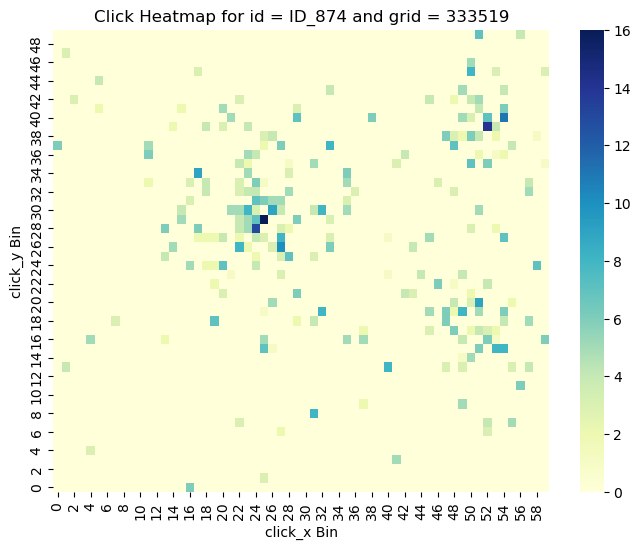

 Pct of broken domains according to prob method:  0.419
 Pct of broken domains according to both methods: 0.412
-----------------------------------------------------------
 grid id: 333519, domain id: ID_877
 p-value for chisquared test:  2.015472842881654e-186
 log-prob for prob method:     2.1157900957961863e-66


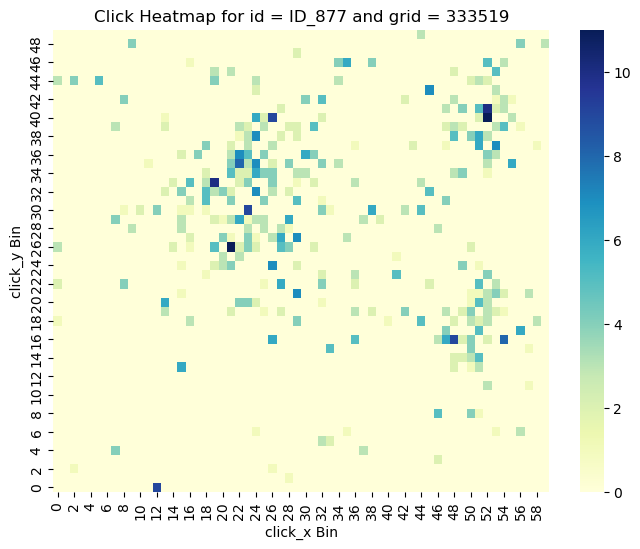

 Pct of broken domains according to prob method:  0.420
 Pct of broken domains according to both methods: 0.412
-----------------------------------------------------------
 grid id: 333519, domain id: ID_88
 p-value for chisquared test:  0.0
 log-prob for prob method:     1.0401583196006092e-122


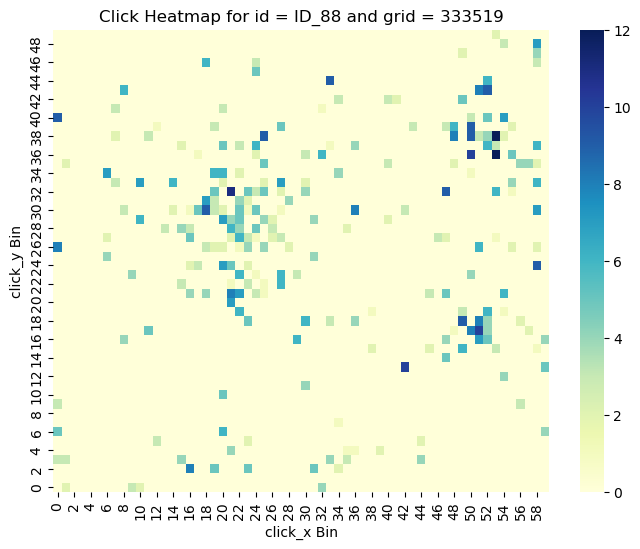

 Pct of broken domains according to prob method:  0.420
 Pct of broken domains according to both methods: 0.413
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.420
 Pct of broken domains according to both methods: 0.413
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.419
 Pct of broken domains according to both methods: 0.412
-----------------------------------------------------------
 grid id: 333519, domain id: ID_895
 p-value for chisquared test:  1.178578458645799e-273
 log-prob for prob method:     1.6349367518120832e-167


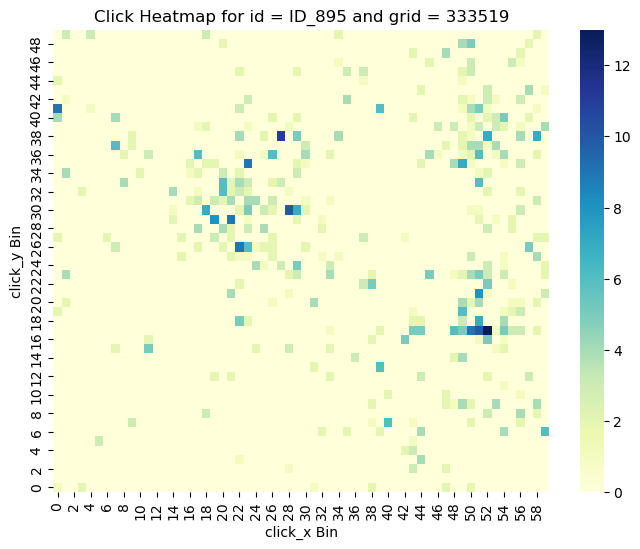

 Pct of broken domains according to prob method:  0.420
 Pct of broken domains according to both methods: 0.413
-----------------------------------------------------------
 grid id: 333519, domain id: ID_897
 p-value for chisquared test:  0.0
 log-prob for prob method:     4.685520000581882e-111


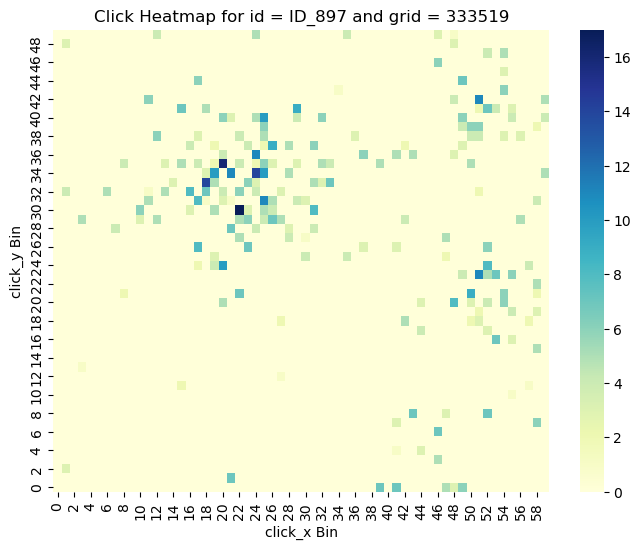

 Pct of broken domains according to prob method:  0.421
 Pct of broken domains according to both methods: 0.414
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.420
 Pct of broken domains according to both methods: 0.413
-----------------------------------------------------------
 grid id: 333519, domain id: ID_904
 p-value for chisquared test:  0.0
 log-prob for prob method:     4.566084192593595e-139


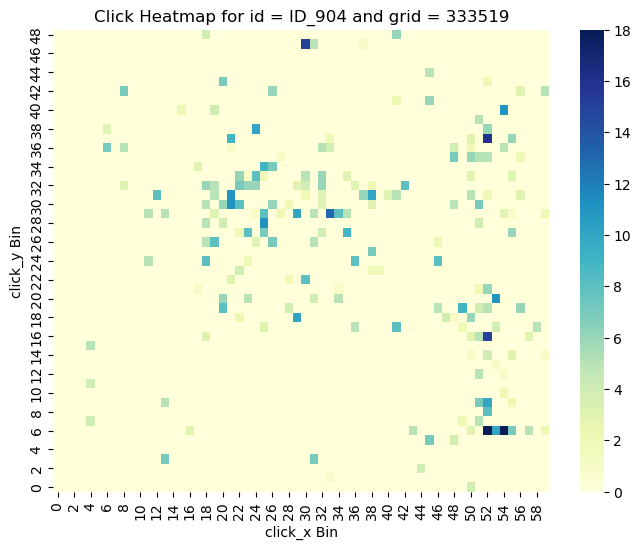

 Pct of broken domains according to prob method:  0.421
 Pct of broken domains according to both methods: 0.414
-----------------------------------------------------------
 grid id: 333519, domain id: ID_905
 p-value for chisquared test:  0.0
 log-prob for prob method:     1.0938000678622478e-239


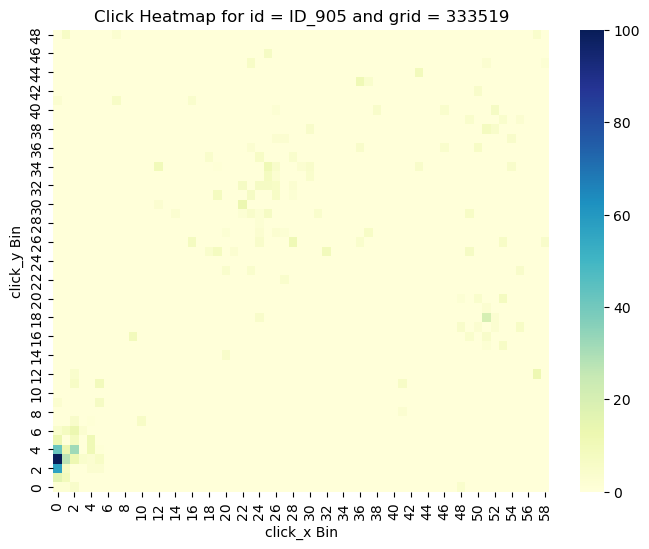

 Pct of broken domains according to prob method:  0.421
 Pct of broken domains according to both methods: 0.414
-----------------------------------------------------------
 grid id: 333519, domain id: ID_906
 p-value for chisquared test:  0.0
 log-prob for prob method:     7.505581290999525e-76


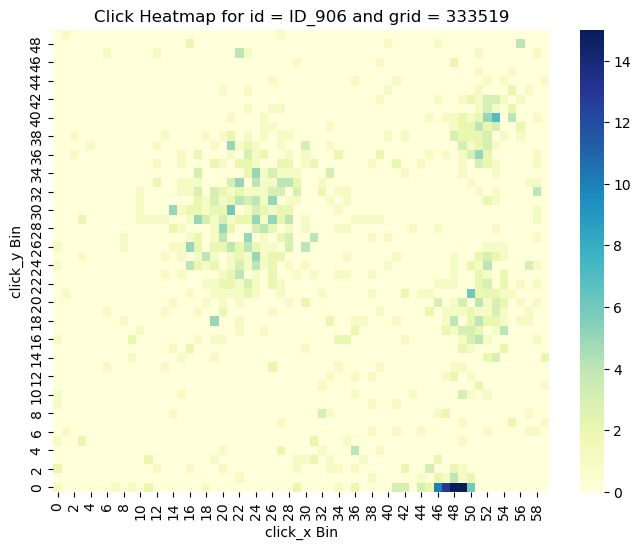

 Pct of broken domains according to prob method:  0.422
 Pct of broken domains according to both methods: 0.415
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.422
 Pct of broken domains according to both methods: 0.415
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.421
 Pct of broken domains according to both methods: 0.414
-----------------------------------------------------------
 grid id: 333519, domain id: ID_914
 p-value for chisquared test:  0.0
 log-prob for prob method:     7.174180757441122e-46


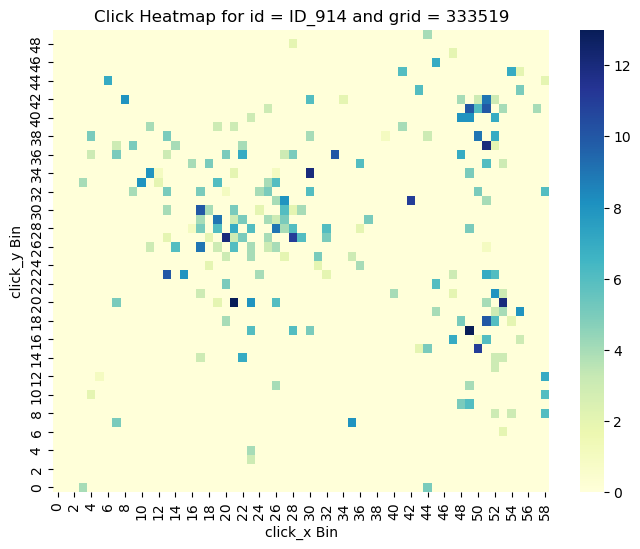

 Pct of broken domains according to prob method:  0.422
 Pct of broken domains according to both methods: 0.415
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.421
 Pct of broken domains according to both methods: 0.414
-----------------------------------------------------------
 grid id: 333519, domain id: ID_927
 p-value for chisquared test:  0.0
 log-prob for prob method:     0.0


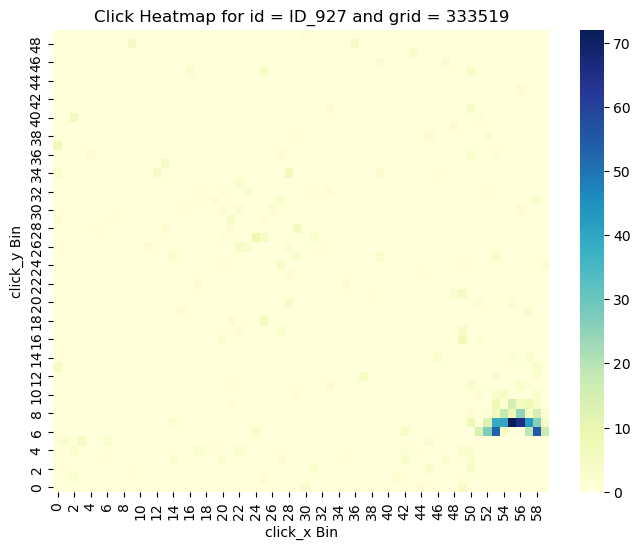

 Pct of broken domains according to prob method:  0.422
 Pct of broken domains according to both methods: 0.415
-----------------------------------------------------------
 grid id: 333519, domain id: ID_928
 p-value for chisquared test:  0.0
 log-prob for prob method:     2.70657402734333e-75


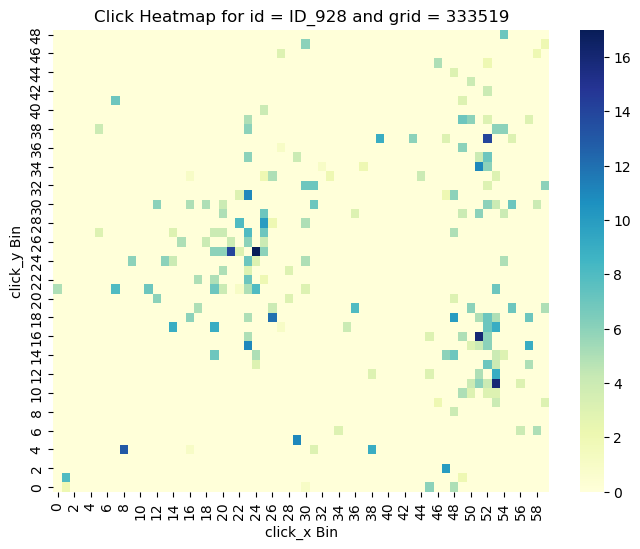

 Pct of broken domains according to prob method:  0.423
 Pct of broken domains according to both methods: 0.416
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.422
 Pct of broken domains according to both methods: 0.415
-----------------------------------------------------------
 grid id: 333519, domain id: ID_931
 p-value for chisquared test:  0.0
 log-prob for prob method:     7.030383263104333e-94


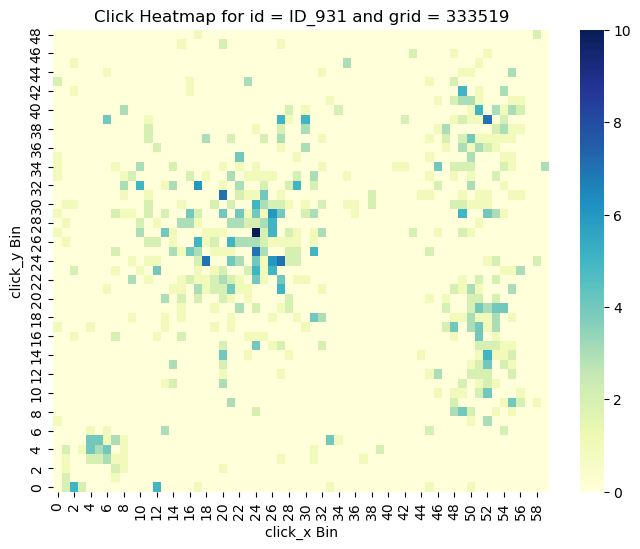

 Pct of broken domains according to prob method:  0.423
 Pct of broken domains according to both methods: 0.416
-----------------------------------------------------------
 grid id: 333519, domain id: ID_932
 p-value for chisquared test:  0.0
 log-prob for prob method:     5.304620110293508e-113


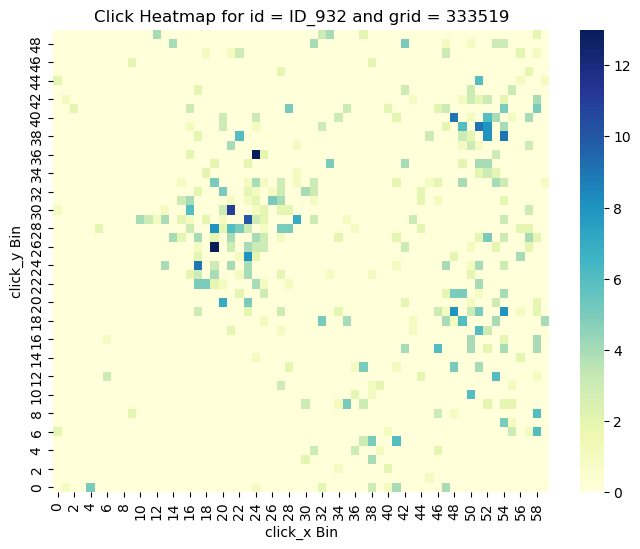

 Pct of broken domains according to prob method:  0.424
 Pct of broken domains according to both methods: 0.417
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.423
 Pct of broken domains according to both methods: 0.416
-----------------------------------------------------------
 grid id: 333519, domain id: ID_934
 p-value for chisquared test:  0.0
 log-prob for prob method:     0.0


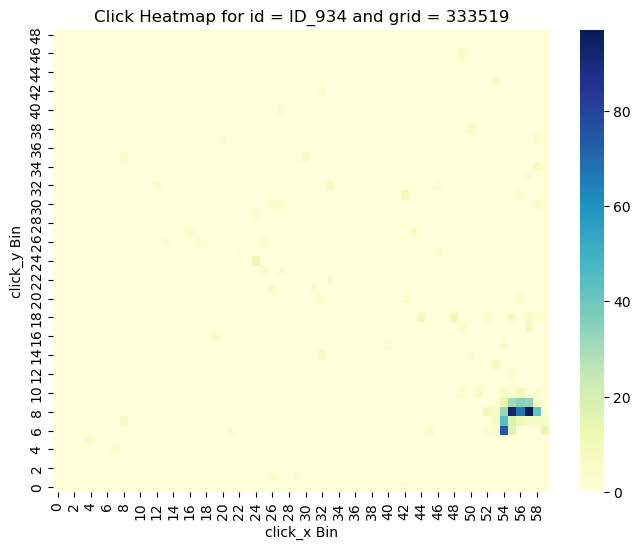

 Pct of broken domains according to prob method:  0.424
 Pct of broken domains according to both methods: 0.417
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.423
 Pct of broken domains according to both methods: 0.416
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.423
 Pct of broken domains according to both methods: 0.416
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.422
 Pct of broken domains according to both methods: 0.415
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.422
 Pct of broken domains according to both methods: 0.415
-----------------------------------------------------------
 grid id: 333519, domain id: ID_962
 p-value for chisquared test:  0.0
 log-prob for prob method:     0.0


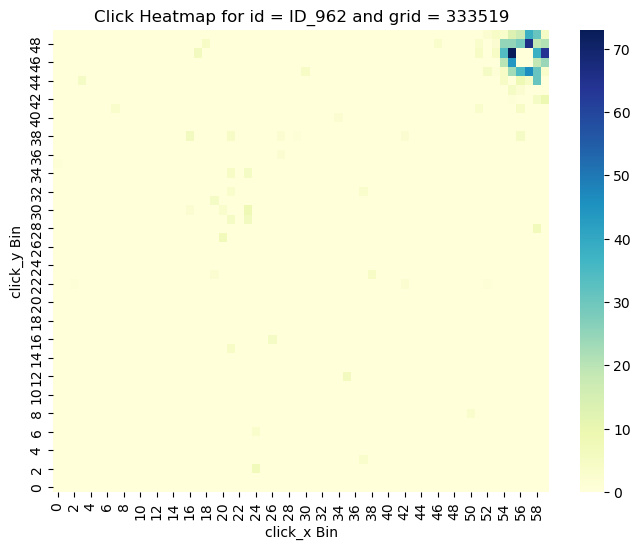

 Pct of broken domains according to prob method:  0.422
 Pct of broken domains according to both methods: 0.416
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.422
 Pct of broken domains according to both methods: 0.415
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.421
 Pct of broken domains according to both methods: 0.415
-----------------------------------------------------------
 grid id: 333519, domain id: ID_986
 p-value for chisquared test:  0.0
 log-prob for prob method:     1.2044859732153242e-170


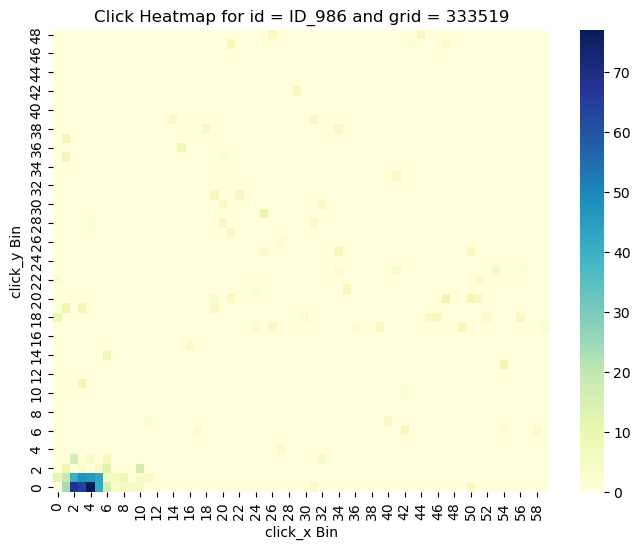

 Pct of broken domains according to prob method:  0.422
 Pct of broken domains according to both methods: 0.415
-----------------------------------------------------------
 grid id: 333519, domain id: ID_989
 p-value for chisquared test:  1.3100150889284653e-57
 log-prob for prob method:     5.132331051208098e-79


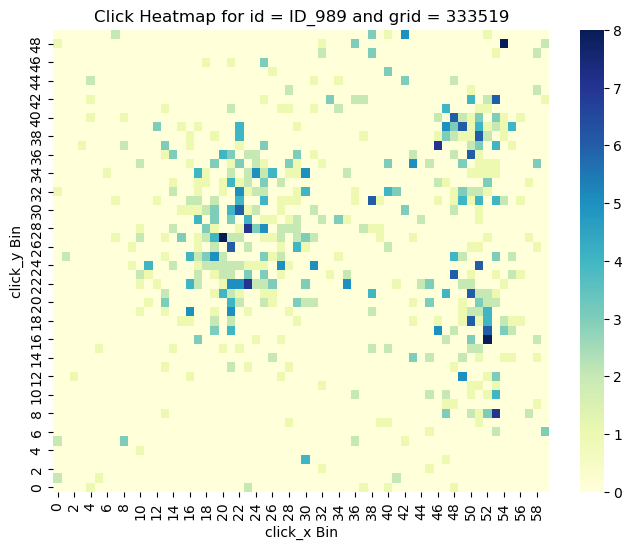

 Pct of broken domains according to prob method:  0.423
 Pct of broken domains according to both methods: 0.416
-----------------------------------------------------------
 grid id: 333519, domain id: ID_990
 p-value for chisquared test:  0.0
 log-prob for prob method:     6.33720171864635e-171


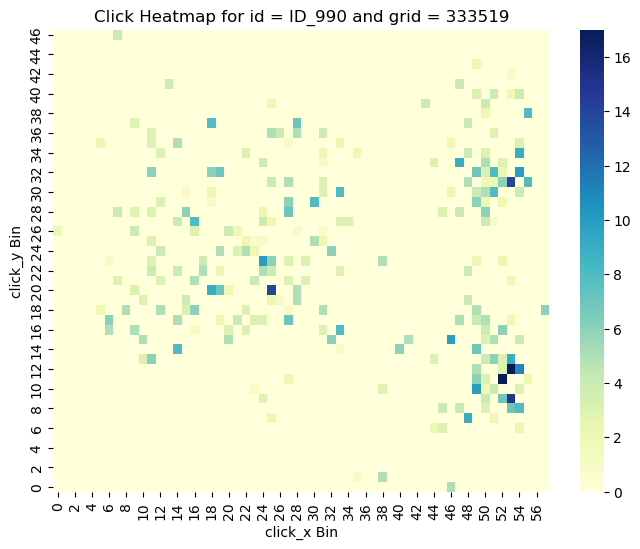

 Pct of broken domains according to prob method:  0.423
 Pct of broken domains according to both methods: 0.417
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.423
 Pct of broken domains according to both methods: 0.416
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.423
 Pct of broken domains according to both methods: 0.416
-----------------------------------------------------------
 Pct of broken domains according to prob method:  0.422
 Pct of broken domains according to both methods: 0.415
-----------------------------------------------------------


In [24]:
# upsampling size:
size = 1000

# stdev for noisy bootstrap enhancement:
stdev = 0

# init to count pct of broken banners:
tot_p, tot, tot_pv = 0, 0, 0 

# p-value threshold for chi-squared test:
pv_thresh = 0.0000001

# probability threshold:
proba_thres = 0.0000001

# Focus on grid_id = 333519
for g_id in [333519]: 
    
    # data = all clicks for grid_id = g_id (in principle should probably do some train/test split):
    data = aggregated_clicks_by_grid[aggregated_clicks_by_grid.grid_id == g_id]
    
    # compute probability by bin
    data['proba'] = data['clicks_sum']/data['clicks_sum'].sum()
    
    '''
    compute probability for "average" heatmap based on bootstrap sampling of data. 
    
    The empirical distribution is given by the proba columns and we bootstrap
    sample based on that column as well as evaluate the log-probability.
    
    The bootstrapped sample is of size = size (notice that the size should be 
    the same as the size for the instance-heatmap to get "fair" comparison, if not
    we would have to normalize accordingly).
    
    n_bootstrap = number of generated heatmaps to compute average.
    
    The following returns the avg log-probability:
    '''
    avg_from_empirical = weighted_bootstrap_resample(data, 
                                                     'proba', 
                                                     'proba', 
                                                     size, 
                                                     n_bootstraps=1000)
    
    
    # run over domains, dom for given grid_id = g_id:
    for dom in domains_by_grid_id[domains_by_grid_id.grid_id == g_id]['domain'].iloc[0]:
        tot += 1
    
        ####################
        # chi-squared method:
        # returns p-value for chi-squared comparison of heatmap vs empirical distribution
        _, pv, tot_obs = Chi_squared_test_enh(aggregated_clicks, 
                                              aggregated_clicks_by_grid, 
                                              dom, g_id, size, .5)
        
        ####################
        # log-probability method:
        
        # data_obs = "observed" heatmap for current domain_id = dom
        data_obs = aggregated_clicks[(aggregated_clicks.grid_id == g_id) &
                                     (aggregated_clicks.domain == dom)]
        
        # add proba column in order to do bootstrap enhancement:
        data_obs['proba'] = data_obs['clicks_sum']/data_obs['clicks_sum'].sum()
        
        # enhanced observed heatmap of size = size, with stdev = stdev 
        # and sampling based on proba column:
        data_obs_enh = enhance_data(data_obs, 'proba', size, stdev)
        
        # merge enhanced observed heatmap with empirical distribution
        # in order to get empircal probabilities for bins:
        data_obs = data_obs_enh.merge(data, 
                                      on=['click_x_bin','click_y_bin'], 
                                      how='right').fillna(0)
        
        # log-probablity for enhanced oberved heatmap given the underlying empirical distribution:
        from_obs = (np.log(data_obs['proba'])*data_obs['clicks_sum_x']).sum()
        
        # compare with average heatmap from empirical distribution:
        # prob = P[distr for domain]/P[avg distr]
        prob = np.exp(from_obs - avg_from_empirical)
        log_prob = from_obs - avg_from_empirical
        
        # if log_prob below certain threshold, label as broken:
        if log_prob < np.log(proba_thres):
            tot_p +=1
        
        # compare both log-prob and chi-squared p-value:
        if log_prob < np.log(proba_thres) and pv < pv_thresh:
            tot_pv += 1
            
            print(f' grid id: {g_id}, domain id: {dom}\n', 
                  f'p-value for chisquared test:  {pv}\n', 
                  f'log-prob for prob method:     {prob}')
            
            # plot enhanced observed heatmap:
            click_matrix = data_obs_enh.pivot("click_y_bin",
                                              "click_x_bin",
                                              "clicks_sum").fillna(0)
            
            plt.figure(figsize=(8, 6))
            sns.heatmap(click_matrix, 
                        cmap = "YlGnBu", 
                        annot = False, 
                        cbar = True, 
                        fmt = "g")
            plt.title(f'Click Heatmap for id = {dom} and grid = {g_id}')
            plt.xlabel('click_x Bin')
            plt.ylabel('click_y Bin')
            plt.gca().invert_yaxis() 
            plt.show()

        
        # keep track of number of pct of broken heatmaps based on this method:
        print(' Pct of broken domains according to prob method:  {:.3f}\n'.format(tot_p/tot), 
              'Pct of broken domains according to both methods: {:.3f}'.format(tot_pv/tot))
        print('-----------------------------------------------------------')
            